# Notebook para todas as redes usando multclasses

In [1]:
from __future__ import print_function
from __future__ import division
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
import copy 
import cv2
from torch.autograd import Variable
import random
import shutil, sys
import pandas as pd
from PIL import Image
from PIL import ImageFile
#from torch.utils.tensorboard import SummaryWriter
import torch.nn.functional as F
from googlenet_pytorch import GoogLeNet 


ImageFile.LOAD_TRUNCATED_IMAGES = True

In [2]:
# Top level data directory. Here we assume the format of the directory conforms
#   to the ImageFolder structure
data_dir = '/home/jimi/dissertacao/covid19/datasets/2021/'

# Models to choose from [resnet, alexnet, vgg, squeezenet, densenet, inception]
#model_name = "densenet"

# Number of classes in the dataset
num_classes = 3

# Batch size for training (change depending on how much memory you have)
batch_size = 32

# Number of epochs to train for


# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = True

#num_epochs = 500

In [3]:
test = 2

In [4]:
# Data augmentation and normalization for training
# Just normalization for validation
#transforms.RandomRotation(degrees=(-5, 5)),
#transforms.ColorJitter(brightness=.02),
    
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ToTensor()
    ]),
    'val': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomRotation(10),
        transforms.ToTensor()
    ]),
    'test': transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor()
    ])
}

print("Initializing Datasets and Dataloaders...")

# Create training and validation datasets
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x]) for x in ['train', 'val', 'test']}

# Create training and validation dataloaders
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], 
                    batch_size=batch_size, shuffle=True, num_workers=4) for x in ['train', 'val', 'test']}

# trans = ['train','val','test']
# categories = ['train','val','test']

class_names = image_datasets['train'].classes

# Detect if we have a GPU available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#device.reset()

Initializing Datasets and Dataloaders...


In [5]:
# Path to data
data_dir = '/home/jimi/dissertacao/covid19/datasets/2021/'
train_dir = data_dir+'train/'
test_dir = data_dir+'test/'
val_dir = data_dir+'val/'

normal_dir = data_dir+'normal/'
pneumonia_dir = data_dir+'pneu/'
covid_dir = data_dir+'covid/'

len_covid = len([iq for iq in os.scandir(normal_dir)])
len_normal = len([iq for iq in os.scandir(pneumonia_dir)])
len_pneumonia = len([iq for iq in os.scandir(covid_dir)])

len_train_dir = len([iq for iq in os.scandir(train_dir+'covid/')]) + len([iq for iq in os.scandir(train_dir+'normal/')]) + len([iq for iq in os.scandir(train_dir+'pneu/')])
len_test_dir = len([iq for iq in os.scandir(test_dir+'covid/')]) + len([iq for iq in os.scandir(test_dir+'normal/')]) + len([iq for iq in os.scandir(test_dir+'pneu/')])
len_val_dir = len([iq for iq in os.scandir(val_dir+'covid/')]) + len([iq for iq in os.scandir(val_dir+'normal/')]) + len([iq for iq in os.scandir(val_dir+'pneu/')])

print('Files per classes')
print("----"*10)
print("normal : ", len_covid)

print("pneumonia : ", len_normal)

print("covid : ", len_pneumonia)

print("-"*20)

print('Train, test, validation')

print("-"*20)

print("len_train_dir : ", len_train_dir)

print("len_test_dir : ", len_test_dir)

print("len_val_dir : ", len_val_dir)



Files per classes
----------------------------------------
normal :  1341
pneumonia :  1345
covid :  1170
--------------------
Train, test, validation
--------------------
len_train_dir :  3053
len_test_dir :  39
len_val_dir :  764


In [6]:
def train_model(model, dataloaders, criterion, optimizer, num_epochs, 
                model_name, lr, batch_size, opt_name, crt_name):
    since = time.time()
    is_inception = False
    
    #tensorboard
    #writer = SummaryWriter(f'runs/dg_{model_name}_lr={lr}_epoch={num_epochs}_batch_size={batch_size}')
    step = 0

    val_acc_history = []
    val_loss_history = []
    
    train_acc_history = []
    train_loss_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        
        print('-' * 10)
        

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in dataloaders[phase]:
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    # Special case for inception because in training it has an auxiliary output. In train
                    #   mode we calculate the loss by summing the final output and the auxiliary output
                    #   but in testing we only consider the final output.
                    if is_inception and phase == 'train':
                        # From https://discuss.pytorch.org/t/how-to-optimize-inception-model-with-auxiliary-classifiers/7958
                        outputs, aux_outputs = model(inputs)
                        loss1 = criterion(outputs, labels)
                        loss2 = criterion(aux_outputs, labels)
                        loss = loss1 + 0.4*loss2
                    else:
                        outputs = model(inputs)
                        loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_acc = running_corrects.double() / len(dataloaders[phase].dataset)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
            

            #writer.add_scalar('training loss', loss, global_step=step)
            #writer.add_scalar('training accuracy', epoch_acc, global_step=step)
            step += 1
            
            #only to plot the graph
            if phase == 'train':
                train_acc_history.append(epoch_acc)
                train_loss_history.append(epoch_loss)
            
            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)
                val_loss_history.append(epoch_loss)

        print()
        
        
    time_elapsed = time.time() - since
    print()
    print('#'*30)
    print('------ Summary ------')
    print(f'model -> {_model}')
    print(f'epochs -> {_epochs}')
    print(f'lr -> {_lrs}')
    print(f'batch size -> {_batch}')
    print(f'optimizer -> {opt_name}'), 
    print(f'criteriun -> {crt_name}')
    print()
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))
    print('#'*30)
    
    plt.figure(figsize=(13, 4))
    plt.subplot(1, 2, 1)
    plt.plot(val_acc_history, label="Validation Accuracy")
    plt.plot(train_acc_history, label="Validation Loss")
    plt.title('Accuracy in Validation Dataset')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(val_loss_history, label="val_loss_history")
    plt.plot(train_loss_history, label="train_loss_history")
    plt.title('Loss in Validation Dataset')
    plt.legend()
    plt.tight_layout()
    plt.savefig('hist_'+_model+'_opt_'+opt_name+'_crt_'+crt_name+'.png')
    plt.show()

    print()

    print('==== END ====')


    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [7]:
def visualize_model(model, num_images=4):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 3, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

In [8]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [9]:
def initialize_model(model_name, num_classes, feature_extract, use_pretrained=True):
    # Initialize these variables which will be set in this if statement. Each of these
    #   variables is model specific.
    model_ft = None
    input_size = 0
    
    #
    #googlenet, shufflenet, mobilenet 
    #

    if model_name == "resnet":
        """ Resnet18
        """
        model_ft = models.resnet18(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "alexnet":
        """ Alexnet
        """
        model_ft = models.alexnet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "vgg":
        """ VGG11_bn
        """
        model_ft = models.vgg11_bn(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[6].in_features
        model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
        input_size = 224

    elif model_name == "squeezenet":
        """ Squeezenet
        """
        model_ft = models.squeezenet1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        model_ft.classifier[1] = nn.Conv2d(512, num_classes, kernel_size=(1,1), stride=(1,1))
        model_ft.num_classes = num_classes
        input_size = 224

    elif model_name == "densenet":
        """ Densenet
        """
        model_ft = models.densenet121(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier.in_features
        model_ft.classifier = nn.Linear(num_ftrs, num_classes)
        input_size = 224
        
    elif model_name == "shufflenet":
        """ shufflenet
        """
        model_ft = models.shufflenet_v2_x1_0(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 224
        
    elif model_name == "mobilenet":
        """ mobilenet
        """
        model_ft = models.mobilenet_v2(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.classifier[1].in_features
        model_ft.classifier[1] = nn.Linear(num_ftrs,num_classes)
        input_size = 224
        
    elif model_name == "googlenet":
        """ googlenet
        """
        model_ft = models.googlenet(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs, num_classes)
        input_size = 224

    elif model_name == "inception":
        """ Inception v3
        Be careful, expects (299,299) sized images and has auxiliary output
        """
        model_ft = models.inception_v3(pretrained=use_pretrained)
        set_parameter_requires_grad(model_ft, feature_extract)
        # Handle the auxilary net
        num_ftrs = model_ft.AuxLogits.fc.in_features
        model_ft.AuxLogits.fc = nn.Linear(num_ftrs, num_classes)
        # Handle the primary net
        num_ftrs = model_ft.fc.in_features
        model_ft.fc = nn.Linear(num_ftrs,num_classes)
        input_size = 299

    else:
        print("Invalid model name, exiting...")
        exit()

    return model_ft, input_size


In [10]:
import itertools 

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    #print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig('cm_'+title+'.png')


==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5969 Acc: 0.7530
val Loss: 0.3301 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.3004 Acc: 0.8939
val Loss: 0.2494 Acc: 0.9162

Epoch 2/99
----------
train Loss: 0.2526 Acc: 0.9148
val Loss: 0.2311 Acc: 0.9241

Epoch 3/99
----------
train Loss: 0.2518 Acc: 0.9093
val Loss: 0.2206 Acc: 0.9241

Epoch 4/99
----------
train Loss: 0.2189 Acc: 0.9201
val Loss: 0.2221 Acc: 0.9241

Epoch 5/99
----------
train Loss: 0.2267 Acc: 0.9211
val Loss: 0.2516 Acc: 0.9110

Epoch 6/99
----------
train Loss: 0.2125 Acc: 0.9270
val Loss: 0.1944 Acc: 0.9424

Epoch 7/99
----------
train Loss: 0.1994 Acc: 0.9283
val Loss: 0.2065 Acc: 0.9372

Epoch 8/99
----------
train Loss: 0.1989 Acc: 0.9273
val Loss: 0.2810 Acc: 0.8940

Epo

train Loss: 0.1277 Acc: 0.9538
val Loss: 0.1466 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1283 Acc: 0.9561
val Loss: 0.1641 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1244 Acc: 0.9532
val Loss: 0.1654 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1351 Acc: 0.9473
val Loss: 0.2091 Acc: 0.9293

Epoch 98/99
----------
train Loss: 0.1267 Acc: 0.9548
val Loss: 0.1566 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1350 Acc: 0.9541
val Loss: 0.1572 Acc: 0.9529


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 40s
Best val Acc: 0.959424
##############################


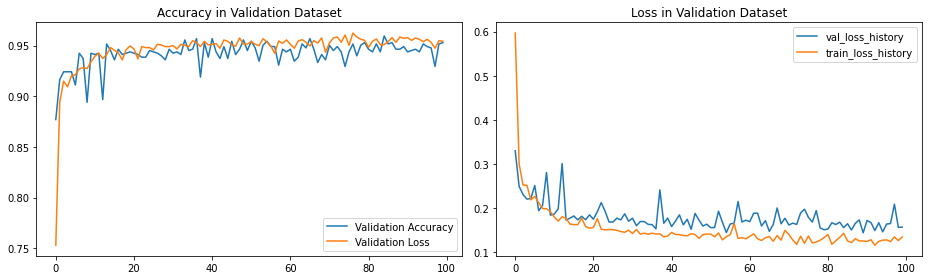


==== END ====
[[233   2   3]
 [  0 260  11]
 [ 10  14 231]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.9789916  0.95940959 0.90588235]

Precision
[0.95884774 0.94202899 0.94285714]

F1 Score
[0.96881497 0.95063985 0.924     ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6842 Acc: 0.7216
val Loss: 0.3709 Acc: 0.8757

Epoch 1/99
----------
train Loss: 0.3193 Acc: 0.9034
val Loss: 0.2891 Acc: 0.9058

Epoch 2/99
----------
train Loss: 0.2593 Acc: 0.9188
val Loss: 0.2392 Acc: 0.9228

Epoch 3/99
----------
train Loss: 0.2211 Acc: 0.9332
val Loss: 0.2157 Acc: 0.9372

Epoch 4/99
----------
train Loss: 0.2053 Acc: 0.9371
val Loss: 0.2002 Acc: 0.9437

Epoch 5/99
----------
tra

train Loss: 0.0962 Acc: 0.9653
val Loss: 0.1250 Acc: 0.9620

Epoch 91/99
----------
train Loss: 0.0962 Acc: 0.9653
val Loss: 0.1583 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.0969 Acc: 0.9653
val Loss: 0.1345 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.1025 Acc: 0.9604
val Loss: 0.1422 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1120 Acc: 0.9591
val Loss: 0.1325 Acc: 0.9568

Epoch 95/99
----------
train Loss: 0.0964 Acc: 0.9682
val Loss: 0.1197 Acc: 0.9568

Epoch 96/99
----------
train Loss: 0.0894 Acc: 0.9676
val Loss: 0.1180 Acc: 0.9581

Epoch 97/99
----------
train Loss: 0.0947 Acc: 0.9623
val Loss: 0.1247 Acc: 0.9620

Epoch 98/99
----------
train Loss: 0.0882 Acc: 0.9653
val Loss: 0.1342 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.0902 Acc: 0.9640
val Loss: 0.1347 Acc: 0.9516


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete 

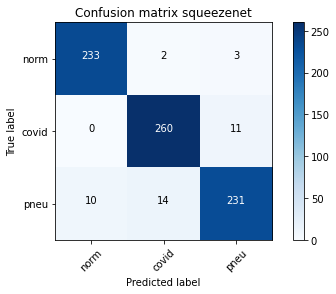

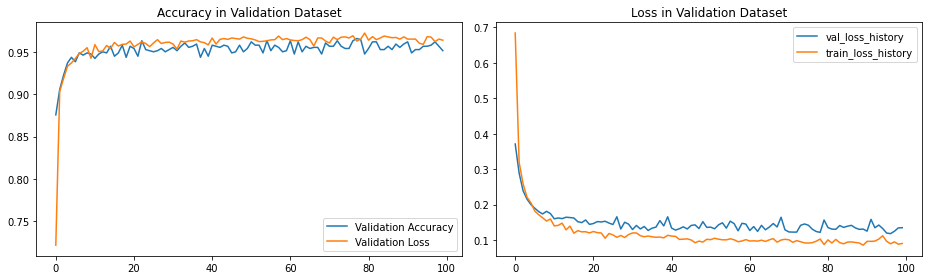


==== END ====
[[233   1   4]
 [  0 261  10]
 [  7  12 236]]

Sensitivity or recall total
0.9554973821989529

Sensitivity or recall per classes
[0.98 0.96 0.93]

Precision
[0.97 0.95 0.94]

F1 Score
[0.97 0.96 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5852 Acc: 0.8018
val Loss: 0.3154 Acc: 0.9149

Epoch 1/99
----------
train Loss: 0.2805 Acc: 0.9096
val Loss: 0.3014 Acc: 0.8822

Epoch 2/99
----------
train Loss: 0.2315 Acc: 0.9243
val Loss: 0.2647 Acc: 0.9005

Epoch 3/99
----------
train Loss: 0.2108 Acc: 0.9342
val Loss: 0.1972 Acc: 0.9424

Epoch 4/99
----------
train Loss: 0.1944 Acc: 0.9391
val Loss: 0.2020 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.1773 Acc: 0.9443
val Loss: 0.1958 Acc: 0.93

train Loss: 0.0988 Acc: 0.9643
val Loss: 0.1554 Acc: 0.9555

Epoch 92/99
----------
train Loss: 0.0937 Acc: 0.9692
val Loss: 0.1429 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.0906 Acc: 0.9663
val Loss: 0.1926 Acc: 0.9385

Epoch 94/99
----------
train Loss: 0.1077 Acc: 0.9604
val Loss: 0.1415 Acc: 0.9607

Epoch 95/99
----------
train Loss: 0.0961 Acc: 0.9633
val Loss: 0.1144 Acc: 0.9607

Epoch 96/99
----------
train Loss: 0.0931 Acc: 0.9646
val Loss: 0.1595 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.0957 Acc: 0.9669
val Loss: 0.1392 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.0909 Acc: 0.9686
val Loss: 0.1504 Acc: 0.9555

Epoch 99/99
----------
train Loss: 0.0936 Acc: 0.9627
val Loss: 0.1498 Acc: 0.9581


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 57s
Best val Acc: 0.962042
##############################


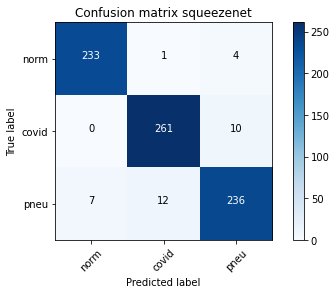

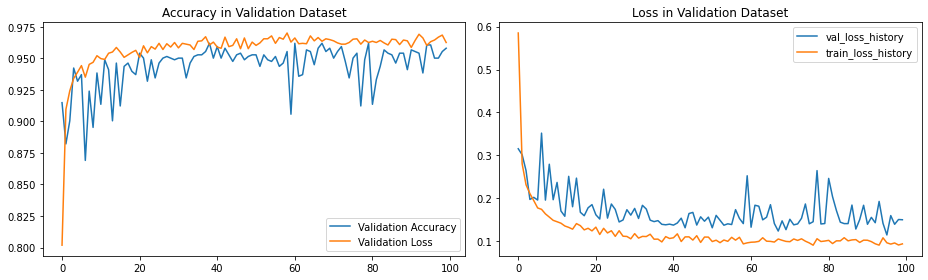


==== END ====
[[232   2   4]
 [  0 262   9]
 [  5  10 240]]

Sensitivity or recall total
0.9607329842931938

Sensitivity or recall per classes
[0.97 0.97 0.94]

Precision
[0.98 0.96 0.95]

F1 Score
[0.98 0.96 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6899 Acc: 0.7039
val Loss: 0.4243 Acc: 0.8455

Epoch 1/99
----------
train Loss: 0.3245 Acc: 0.8870
val Loss: 0.2575 Acc: 0.9162

Epoch 2/99
----------
train Loss: 0.2719 Acc: 0.9116
val Loss: 0.2363 Acc: 0.9254

Epoch 3/99
----------
train Loss: 0.2364 Acc: 0.9214
val Loss: 0.2381 Acc: 0.9241

Epoch 4/99
----------
train Loss: 0.2197 Acc: 0.9263
val Loss: 0.2088 Acc: 0.9359

Epoch 5/99
----------
train Loss: 0.2252 Acc: 0.9263
val Loss: 0.1957 Acc: 0.9

train Loss: 0.1150 Acc: 0.9581
val Loss: 0.1535 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1244 Acc: 0.9571
val Loss: 0.1563 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1234 Acc: 0.9541
val Loss: 0.1770 Acc: 0.9490

Epoch 94/99
----------
train Loss: 0.1286 Acc: 0.9541
val Loss: 0.1537 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1274 Acc: 0.9538
val Loss: 0.1613 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.1170 Acc: 0.9630
val Loss: 0.1813 Acc: 0.9385

Epoch 97/99
----------
train Loss: 0.1164 Acc: 0.9617
val Loss: 0.1471 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1128 Acc: 0.9617
val Loss: 0.1605 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1167 Acc: 0.9613
val Loss: 0.1465 Acc: 0.9476


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 57s
Best val Acc: 0.956806
##############################


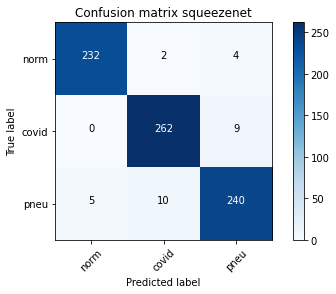

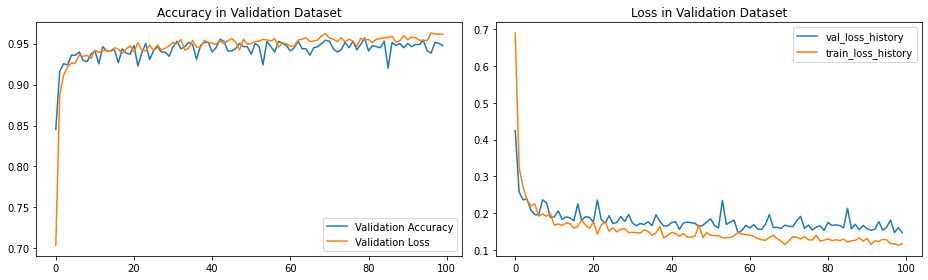


==== END ====
[[234   1   3]
 [  2 258  11]
 [  6  10 239]]

Sensitivity or recall total
0.9568062827225131

Sensitivity or recall per classes
[0.98 0.95 0.94]

Precision
[0.97 0.96 0.94]

F1 Score
[0.97 0.96 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6564 Acc: 0.7353
val Loss: 0.3390 Acc: 0.8887

Epoch 1/99
----------
train Loss: 0.2733 Acc: 0.9184
val Loss: 0.2536 Acc: 0.9175

Epoch 2/99
----------
train Loss: 0.2245 Acc: 0.9338
val Loss: 0.2335 Acc: 0.9188

Epoch 3/99
----------
train Loss: 0.1937 Acc: 0.9424
val Loss: 0.2022 Acc: 0.9385

Epoch 4/99
----------
train Loss: 0.1956 Acc: 0.9365
val Loss: 0.1890 Acc: 0.9450

Epoch 5/99
----------
train Loss: 0.1708 Acc: 0.9460
val Loss: 0.1971 Acc: 0.9

train Loss: 0.0960 Acc: 0.9676
val Loss: 0.1408 Acc: 0.9581

Epoch 92/99
----------
train Loss: 0.0928 Acc: 0.9627
val Loss: 0.1440 Acc: 0.9581

Epoch 93/99
----------
train Loss: 0.0914 Acc: 0.9663
val Loss: 0.1384 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1051 Acc: 0.9659
val Loss: 0.1465 Acc: 0.9490

Epoch 95/99
----------
train Loss: 0.0945 Acc: 0.9653
val Loss: 0.1343 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.0915 Acc: 0.9669
val Loss: 0.1568 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1063 Acc: 0.9607
val Loss: 0.1369 Acc: 0.9568

Epoch 98/99
----------
train Loss: 0.0912 Acc: 0.9666
val Loss: 0.1340 Acc: 0.9542

Epoch 99/99
----------
train Loss: 0.0974 Acc: 0.9676
val Loss: 0.1501 Acc: 0.9529


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 3s
Best val Acc: 0.964660
##############################


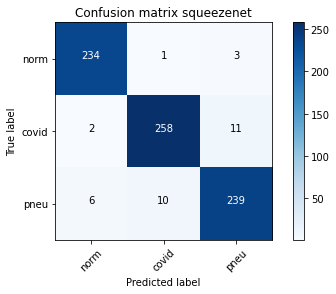

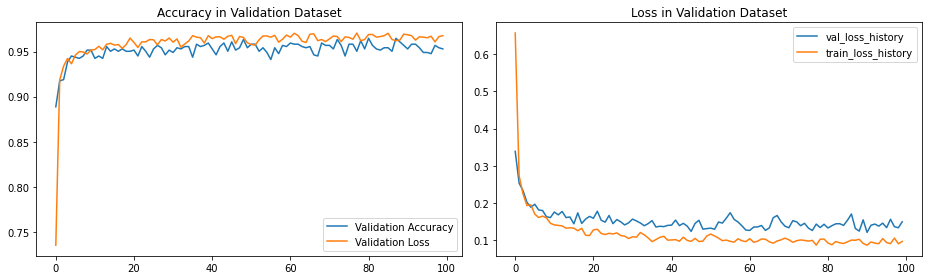


==== END ====
[[232   2   4]
 [  0 258  13]
 [  6   7 242]]

Sensitivity or recall total
0.9581151832460733

Sensitivity or recall per classes
[0.97 0.95 0.95]

Precision
[0.97 0.97 0.93]

F1 Score
[0.97 0.96 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4989 Acc: 0.8133
val Loss: 0.4541 Acc: 0.7984

Epoch 1/99
----------
train Loss: 0.2620 Acc: 0.9152
val Loss: 0.2599 Acc: 0.9136

Epoch 2/99
----------
train Loss: 0.2162 Acc: 0.9322
val Loss: 0.2141 Acc: 0.9398

Epoch 3/99
----------
train Loss: 0.1998 Acc: 0.9329
val Loss: 0.2267 Acc: 0.9359

Epoch 4/99
----------
train Loss: 0.1809 Acc: 0.9437
val Loss: 0.2211 Acc: 0.9202

Epoch 5/99
----------
train Loss: 0.1685 Acc: 0.9456
val Loss: 0.2133 Acc: 0.9

train Loss: 0.0928 Acc: 0.9695
val Loss: 0.1296 Acc: 0.9594

Epoch 92/99
----------
train Loss: 0.1046 Acc: 0.9627
val Loss: 0.1416 Acc: 0.9594

Epoch 93/99
----------
train Loss: 0.0973 Acc: 0.9646
val Loss: 0.1656 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.0994 Acc: 0.9669
val Loss: 0.1349 Acc: 0.9647

Epoch 95/99
----------
train Loss: 0.0947 Acc: 0.9672
val Loss: 0.1360 Acc: 0.9542

Epoch 96/99
----------
train Loss: 0.0988 Acc: 0.9663
val Loss: 0.1800 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.0926 Acc: 0.9692
val Loss: 0.1628 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1016 Acc: 0.9659
val Loss: 0.1613 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.0896 Acc: 0.9689
val Loss: 0.1263 Acc: 0.9555


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 3s
Best val Acc: 0.964660
##############################


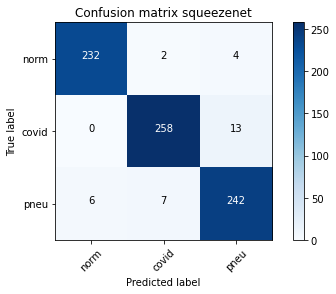

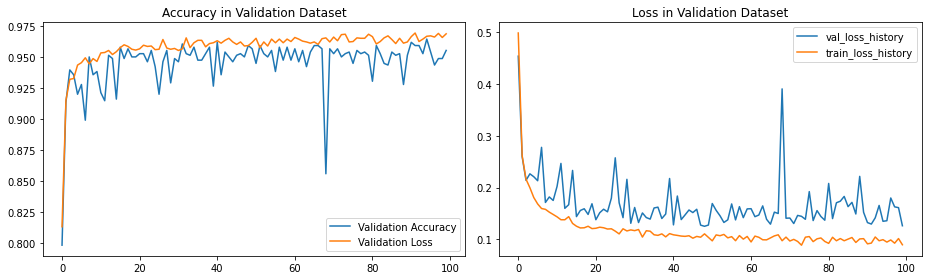


==== END ====
[[230   2   6]
 [  0 258  13]
 [  5   9 241]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.97 0.95 0.95]

Precision
[0.98 0.96 0.93]

F1 Score
[0.97 0.96 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5744 Acc: 0.7684
val Loss: 0.3327 Acc: 0.8848

Epoch 1/99
----------
train Loss: 0.3066 Acc: 0.8896
val Loss: 0.2689 Acc: 0.9045

Epoch 2/99
----------
train Loss: 0.2638 Acc: 0.9060
val Loss: 0.2343 Acc: 0.9228

Epoch 3/99
----------
train Loss: 0.2365 Acc: 0.9214
val Loss: 0.2503 Acc: 0.9228

Epoch 4/99
----------
train Loss: 0.2120 Acc: 0.9302
val Loss: 0.2358 Acc: 0.9149

Epoch 5/99
----------
train Loss: 0.2071 Acc: 0.9306
val Loss: 0.1967 Acc: 0.9

train Loss: 0.1301 Acc: 0.9545
val Loss: 0.1612 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1333 Acc: 0.9538
val Loss: 0.1792 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1275 Acc: 0.9577
val Loss: 0.1682 Acc: 0.9437

Epoch 94/99
----------
train Loss: 0.1208 Acc: 0.9584
val Loss: 0.1673 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1222 Acc: 0.9584
val Loss: 0.1499 Acc: 0.9450

Epoch 96/99
----------
train Loss: 0.1292 Acc: 0.9525
val Loss: 0.1517 Acc: 0.9542

Epoch 97/99
----------
train Loss: 0.1197 Acc: 0.9587
val Loss: 0.1517 Acc: 0.9581

Epoch 98/99
----------
train Loss: 0.1259 Acc: 0.9538
val Loss: 0.1528 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1261 Acc: 0.9584
val Loss: 0.2226 Acc: 0.9332


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 14s
Best val Acc: 0.959424
##############################


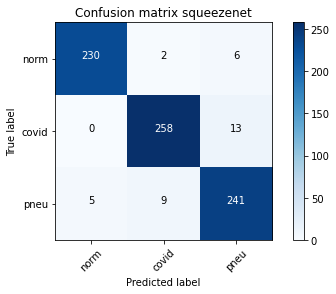

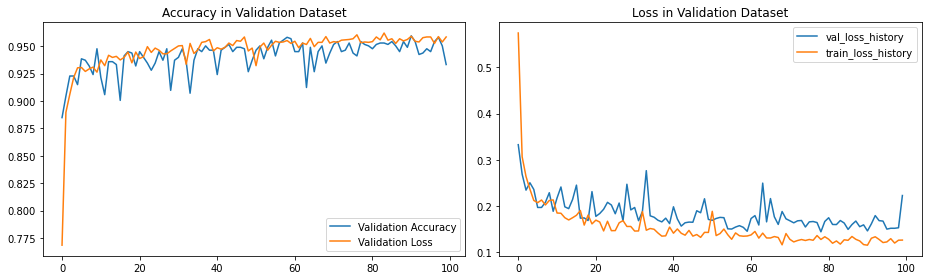


==== END ====
[[233   1   4]
 [  1 259  11]
 [  8  15 232]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.98 0.96 0.91]

Precision
[0.96 0.94 0.94]

F1 Score
[0.97 0.95 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5604 Acc: 0.7910
val Loss: 0.3725 Acc: 0.8665

Epoch 1/99
----------
train Loss: 0.2954 Acc: 0.9044
val Loss: 0.2514 Acc: 0.9267

Epoch 2/99
----------
train Loss: 0.2324 Acc: 0.9266
val Loss: 0.2426 Acc: 0.9346

Epoch 3/99
----------
train Loss: 0.2159 Acc: 0.9312
val Loss: 0.1997 Acc: 0.9346

Epoch 4/99
----------
train Loss: 0.1924 Acc: 0.9371
val Loss: 0.1985 Acc: 0.9346

Epoch 5/99
----------
train Loss: 0.1795 Acc: 0.9433
val Loss: 0.1967 Acc: 0.9

train Loss: 0.0969 Acc: 0.9686
val Loss: 0.1408 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.0938 Acc: 0.9682
val Loss: 0.1300 Acc: 0.9594

Epoch 93/99
----------
train Loss: 0.0913 Acc: 0.9659
val Loss: 0.1291 Acc: 0.9620

Epoch 94/99
----------
train Loss: 0.0990 Acc: 0.9650
val Loss: 0.1447 Acc: 0.9555

Epoch 95/99
----------
train Loss: 0.0876 Acc: 0.9689
val Loss: 0.1436 Acc: 0.9568

Epoch 96/99
----------
train Loss: 0.1017 Acc: 0.9630
val Loss: 0.1312 Acc: 0.9555

Epoch 97/99
----------
train Loss: 0.0907 Acc: 0.9663
val Loss: 0.1376 Acc: 0.9594

Epoch 98/99
----------
train Loss: 0.0986 Acc: 0.9617
val Loss: 0.1455 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1092 Acc: 0.9594
val Loss: 0.1398 Acc: 0.9503


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 10s
Best val Acc: 0.963351
##############################


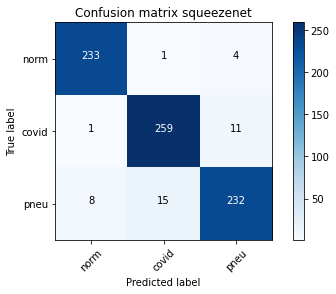

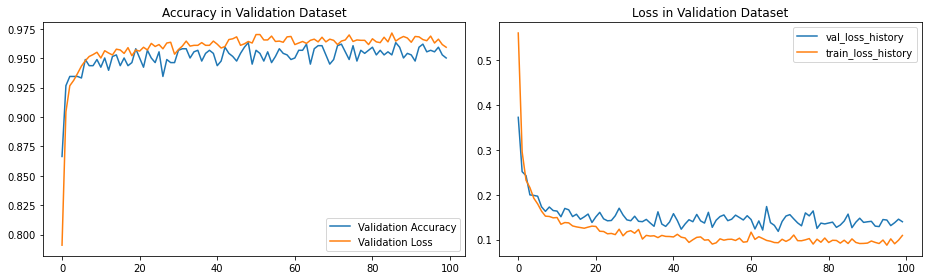


==== END ====
[[232   3   3]
 [  1 256  14]
 [  3  11 241]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.97 0.94 0.95]

Precision
[0.98 0.95 0.93]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5443 Acc: 0.8090
val Loss: 0.3825 Acc: 0.8639

Epoch 1/99
----------
train Loss: 0.2648 Acc: 0.9158
val Loss: 0.2684 Acc: 0.9045

Epoch 2/99
----------
train Loss: 0.2322 Acc: 0.9194
val Loss: 0.2929 Acc: 0.9031

Epoch 3/99
----------
train Loss: 0.2044 Acc: 0.9342
val Loss: 0.2874 Acc: 0.8927

Epoch 4/99
----------
train Loss: 0.1990 Acc: 0.9289
val Loss: 0.1820 Acc: 0.9437

Epoch 5/99
----------
train Loss: 0.1736 Acc: 0.9440
val Loss: 0.1787 Acc: 0.9

train Loss: 0.0982 Acc: 0.9640
val Loss: 0.1645 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.0981 Acc: 0.9676
val Loss: 0.1422 Acc: 0.9634

Epoch 93/99
----------
train Loss: 0.0908 Acc: 0.9679
val Loss: 0.2074 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.0970 Acc: 0.9659
val Loss: 0.2708 Acc: 0.9071

Epoch 95/99
----------
train Loss: 0.0974 Acc: 0.9659
val Loss: 0.1585 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.0966 Acc: 0.9650
val Loss: 0.1352 Acc: 0.9607

Epoch 97/99
----------
train Loss: 0.0957 Acc: 0.9633
val Loss: 0.1256 Acc: 0.9555

Epoch 98/99
----------
train Loss: 0.0995 Acc: 0.9666
val Loss: 0.1485 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.1015 Acc: 0.9610
val Loss: 0.1913 Acc: 0.9411


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 8s
Best val Acc: 0.965969
##############################


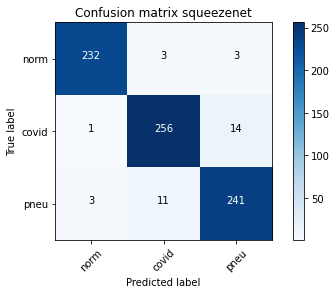

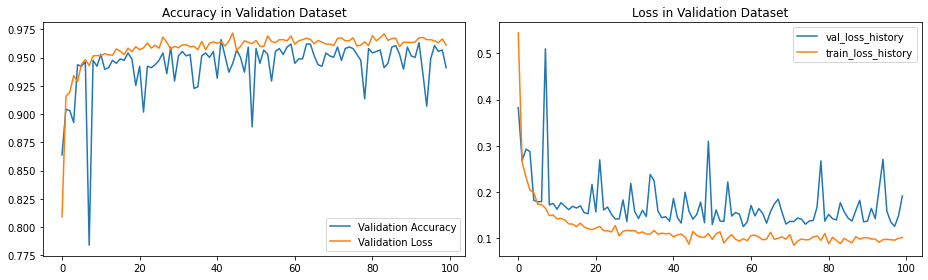


==== END ====
[[230   2   6]
 [  0 259  12]
 [  6  15 234]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.96 0.92]

Precision
[0.97 0.94 0.93]

F1 Score
[0.97 0.95 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0355 Acc: 0.4998
val Loss: 0.8041 Acc: 0.7356

Epoch 1/99
----------
train Loss: 0.6952 Acc: 0.7648
val Loss: 0.5728 Acc: 0.7997

Epoch 2/99
----------
train Loss: 0.5432 Acc: 0.8271
val Loss: 0.4720 Acc: 0.8482

Epoch 3/99
----------
train Loss: 0.4646 Acc: 0.8474
val Loss: 0.4283 Acc: 0.8704

Epoch 4/99
----------
train Loss: 0.4107 Acc: 0.8719
val Loss: 0.3986 Acc: 0.8678

Epoch 5/99
----------
train Loss: 0.3723 Acc: 0.8860
val Loss: 0.3620 Acc: 0.8

train Loss: 0.1648 Acc: 0.9473
val Loss: 0.1794 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1560 Acc: 0.9489
val Loss: 0.1768 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1627 Acc: 0.9499
val Loss: 0.1767 Acc: 0.9450

Epoch 94/99
----------
train Loss: 0.1583 Acc: 0.9456
val Loss: 0.1767 Acc: 0.9450

Epoch 95/99
----------
train Loss: 0.1689 Acc: 0.9450
val Loss: 0.1755 Acc: 0.9476

Epoch 96/99
----------
train Loss: 0.1613 Acc: 0.9460
val Loss: 0.1839 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1641 Acc: 0.9433
val Loss: 0.1804 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1683 Acc: 0.9446
val Loss: 0.1815 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1543 Acc: 0.9499
val Loss: 0.1788 Acc: 0.9372


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 7s
Best val Acc: 0.952880
##############################


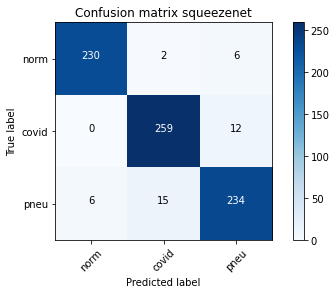

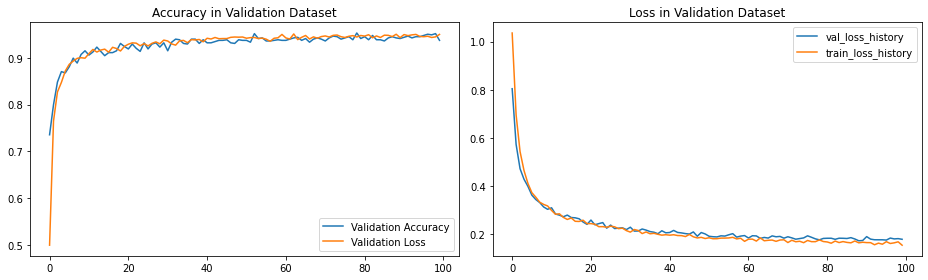


==== END ====
[[232   1   5]
 [  0 259  12]
 [  9  17 229]]

Sensitivity or recall total
0.9424083769633508

Sensitivity or recall per classes
[0.97 0.96 0.9 ]

Precision
[0.96 0.94 0.93]

F1 Score
[0.97 0.95 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0425 Acc: 0.4468
val Loss: 0.8968 Acc: 0.6139

Epoch 1/99
----------
train Loss: 0.7963 Acc: 0.7252
val Loss: 0.6894 Acc: 0.7723

Epoch 2/99
----------
train Loss: 0.6332 Acc: 0.8267
val Loss: 0.5421 Acc: 0.8429

Epoch 3/99
----------
train Loss: 0.5252 Acc: 0.8706
val Loss: 0.4753 Acc: 0.8704

Epoch 4/99
----------
train Loss: 0.4542 Acc: 0.8919
val Loss: 0.4303 Acc: 0.8730

Epoch 5/99
----------
train Loss: 0.4092 Acc: 0.9027
val Loss: 0.3798 Acc: 0.8

train Loss: 0.1268 Acc: 0.9613
val Loss: 0.1575 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1328 Acc: 0.9558
val Loss: 0.1510 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1293 Acc: 0.9591
val Loss: 0.1630 Acc: 0.9555

Epoch 94/99
----------
train Loss: 0.1296 Acc: 0.9564
val Loss: 0.1609 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1272 Acc: 0.9594
val Loss: 0.1484 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1306 Acc: 0.9604
val Loss: 0.1540 Acc: 0.9542

Epoch 97/99
----------
train Loss: 0.1231 Acc: 0.9604
val Loss: 0.1536 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1261 Acc: 0.9600
val Loss: 0.1590 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1278 Acc: 0.9591
val Loss: 0.1503 Acc: 0.9503


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 8s
Best val Acc: 0.959424
##############################


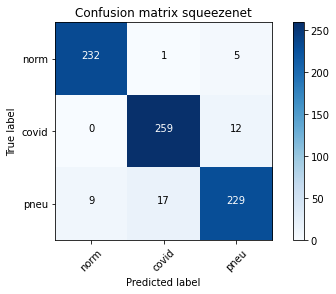

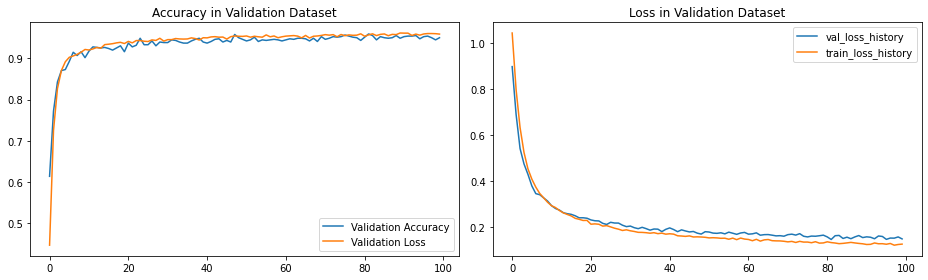


==== END ====
[[233   1   4]
 [  0 256  15]
 [  6  14 235]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.98 0.94 0.92]

Precision
[0.97 0.94 0.93]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8696 Acc: 0.6433
val Loss: 0.6961 Acc: 0.7513

Epoch 1/99
----------
train Loss: 0.6443 Acc: 0.8028
val Loss: 0.5524 Acc: 0.8272

Epoch 2/99
----------
train Loss: 0.5329 Acc: 0.8533
val Loss: 0.4669 Acc: 0.8626

Epoch 3/99
----------
train Loss: 0.4592 Acc: 0.8759
val Loss: 0.4344 Acc: 0.8508

Epoch 4/99
----------
train Loss: 0.4133 Acc: 0.8877
val Loss: 0.3925 Acc: 0.8743

Epoch 5/99
----------
train Loss: 0.3700 Acc: 0.8991
val Loss: 0.3542 Acc: 0.8

train Loss: 0.1231 Acc: 0.9610
val Loss: 0.1618 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1230 Acc: 0.9623
val Loss: 0.1484 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.1274 Acc: 0.9613
val Loss: 0.1587 Acc: 0.9490

Epoch 94/99
----------
train Loss: 0.1269 Acc: 0.9633
val Loss: 0.1432 Acc: 0.9568

Epoch 95/99
----------
train Loss: 0.1258 Acc: 0.9594
val Loss: 0.1490 Acc: 0.9555

Epoch 96/99
----------
train Loss: 0.1273 Acc: 0.9587
val Loss: 0.1486 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1268 Acc: 0.9574
val Loss: 0.1587 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1237 Acc: 0.9584
val Loss: 0.1531 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1229 Acc: 0.9613
val Loss: 0.1695 Acc: 0.9411


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 8s
Best val Acc: 0.956806
##############################


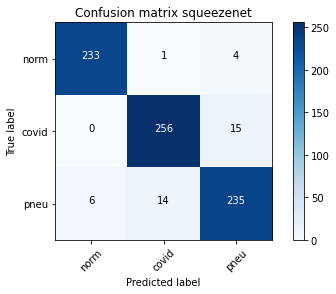

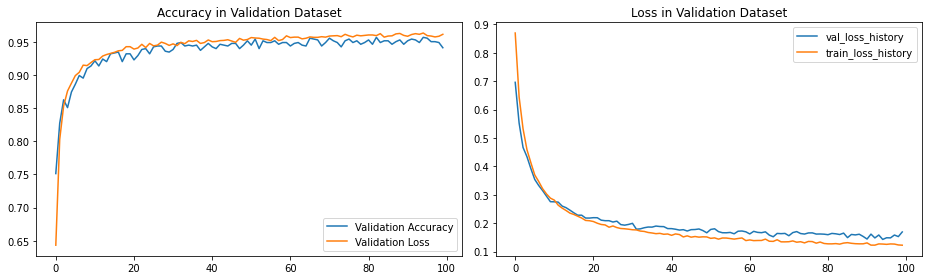


==== END ====
[[233   2   3]
 [  0 261  10]
 [  6  12 237]]

Sensitivity or recall total
0.9568062827225131

Sensitivity or recall per classes
[0.98 0.96 0.93]

Precision
[0.97 0.95 0.95]

F1 Score
[0.98 0.96 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9169 Acc: 0.6050
val Loss: 0.6801 Acc: 0.7736

Epoch 1/99
----------
train Loss: 0.6043 Acc: 0.7930
val Loss: 0.4935 Acc: 0.8298

Epoch 2/99
----------
train Loss: 0.4834 Acc: 0.8379
val Loss: 0.4361 Acc: 0.8495

Epoch 3/99
----------
train Loss: 0.4302 Acc: 0.8585
val Loss: 0.3986 Acc: 0.8678

Epoch 4/99
----------
train Loss: 0.3866 Acc: 0.8814
val Loss: 0.3623 Acc: 0.8822

Epoch 5/99
----------
train Loss: 0.3554 Acc: 0.8873
val Loss: 0.3571 Acc: 0.

train Loss: 0.1641 Acc: 0.9482
val Loss: 0.1811 Acc: 0.9398

Epoch 92/99
----------
train Loss: 0.1635 Acc: 0.9482
val Loss: 0.1692 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1570 Acc: 0.9515
val Loss: 0.1831 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1583 Acc: 0.9479
val Loss: 0.1791 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1575 Acc: 0.9512
val Loss: 0.1707 Acc: 0.9424

Epoch 96/99
----------
train Loss: 0.1661 Acc: 0.9486
val Loss: 0.1682 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.1576 Acc: 0.9505
val Loss: 0.1713 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.1591 Acc: 0.9505
val Loss: 0.1693 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1599 Acc: 0.9466
val Loss: 0.1793 Acc: 0.9490


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 6s
Best val Acc: 0.952880
##############################


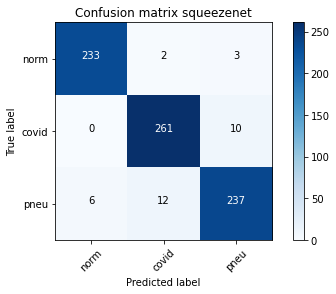

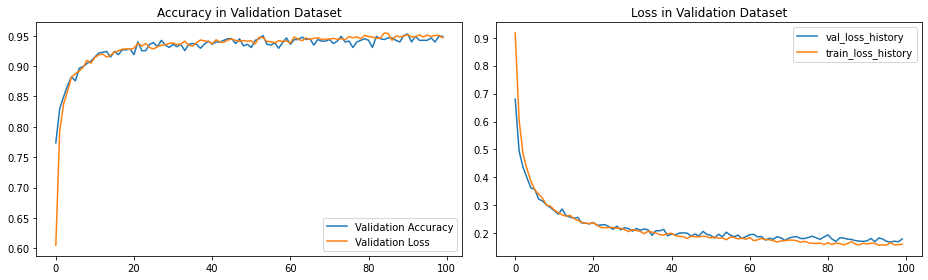


==== END ====
[[231   1   6]
 [  0 253  18]
 [  4  12 239]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.93 0.94]

Precision
[0.98 0.95 0.91]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0636 Acc: 0.4428
val Loss: 0.9261 Acc: 0.5995

Epoch 1/99
----------
train Loss: 0.8516 Acc: 0.6757
val Loss: 0.7491 Acc: 0.7435

Epoch 2/99
----------
train Loss: 0.6962 Acc: 0.7871
val Loss: 0.5797 Acc: 0.8390

Epoch 3/99
----------
train Loss: 0.5641 Acc: 0.8402
val Loss: 0.4762 Acc: 0.8639

Epoch 4/99
----------
train Loss: 0.4769 Acc: 0.8739
val Loss: 0.4161 Acc: 0.8783

Epoch 5/99
----------
train Loss: 0.4170 Acc: 0.8906
val Loss: 0.3774 Acc: 0.

train Loss: 0.1313 Acc: 0.9594
val Loss: 0.1651 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1321 Acc: 0.9587
val Loss: 0.1695 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1335 Acc: 0.9600
val Loss: 0.1471 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1326 Acc: 0.9548
val Loss: 0.1616 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1278 Acc: 0.9584
val Loss: 0.1598 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1349 Acc: 0.9574
val Loss: 0.1492 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1282 Acc: 0.9623
val Loss: 0.1553 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1315 Acc: 0.9561
val Loss: 0.1659 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1266 Acc: 0.9587
val Loss: 0.1503 Acc: 0.9581


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 5s
Best val Acc: 0.958115
##############################


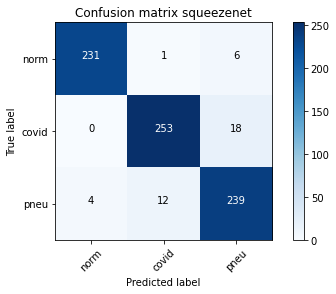

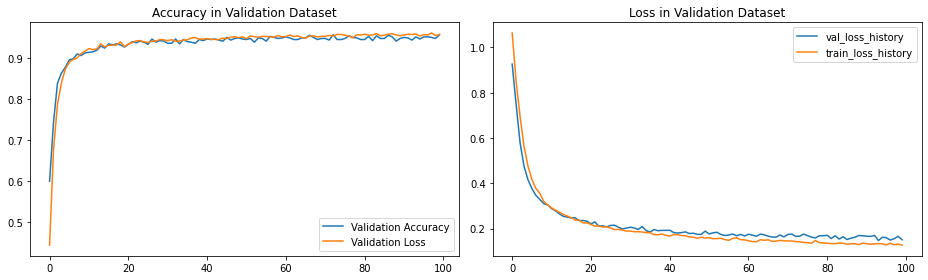


==== END ====
[[232   2   4]
 [  0 252  19]
 [  6  11 238]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.97 0.93 0.93]

Precision
[0.97 0.95 0.91]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8556 Acc: 0.6921
val Loss: 0.6577 Acc: 0.7984

Epoch 1/99
----------
train Loss: 0.6166 Acc: 0.8264
val Loss: 0.5217 Acc: 0.8521

Epoch 2/99
----------
train Loss: 0.5038 Acc: 0.8608
val Loss: 0.4516 Acc: 0.8560

Epoch 3/99
----------
train Loss: 0.4379 Acc: 0.8840
val Loss: 0.4059 Acc: 0.8743

Epoch 4/99
----------
train Loss: 0.3894 Acc: 0.8998
val Loss: 0.3673 Acc: 0.8914

Epoch 5/99
----------
train Loss: 0.3621 Acc: 0.9037
val Loss: 0.3375 Acc: 0.

train Loss: 0.1256 Acc: 0.9620
val Loss: 0.1425 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1272 Acc: 0.9594
val Loss: 0.1472 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1312 Acc: 0.9597
val Loss: 0.1529 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1251 Acc: 0.9613
val Loss: 0.1460 Acc: 0.9529

Epoch 95/99
----------
train Loss: 0.1302 Acc: 0.9607
val Loss: 0.1528 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1237 Acc: 0.9623
val Loss: 0.1469 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1268 Acc: 0.9561
val Loss: 0.1476 Acc: 0.9529

Epoch 98/99
----------
train Loss: 0.1320 Acc: 0.9558
val Loss: 0.1585 Acc: 0.9476

Epoch 99/99
----------
train Loss: 0.1248 Acc: 0.9620
val Loss: 0.1443 Acc: 0.9516


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 9s
Best val Acc: 0.959424
##############################


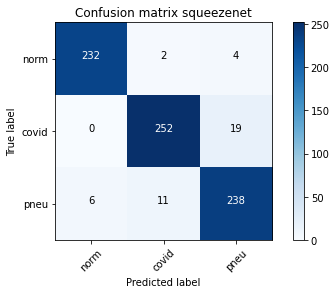

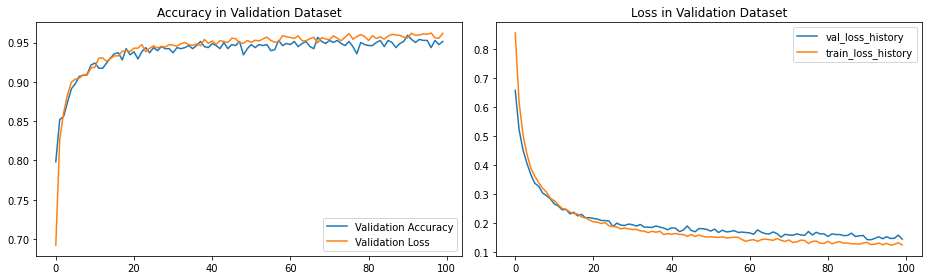


==== END ====
[[230   1   7]
 [  1 257  13]
 [  7  11 237]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.97 0.95 0.93]

Precision
[0.97 0.96 0.92]

F1 Score
[0.97 0.95 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7845 Acc: 0.6957
val Loss: 0.5935 Acc: 0.8037

Epoch 1/99
----------
train Loss: 0.5596 Acc: 0.8136
val Loss: 0.4734 Acc: 0.8351

Epoch 2/99
----------
train Loss: 0.4597 Acc: 0.8582
val Loss: 0.4108 Acc: 0.8652

Epoch 3/99
----------
train Loss: 0.4056 Acc: 0.8785
val Loss: 0.3804 Acc: 0.8691

Epoch 4/99
----------
train Loss: 0.3737 Acc: 0.8880
val Loss: 0.3540 Acc: 0.8927

Epoch 5/99
----------
train Loss: 0.3518 Acc: 0.8949
val Loss: 0.3290 Acc: 0.

train Loss: 0.1642 Acc: 0.9440
val Loss: 0.1744 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1592 Acc: 0.9479
val Loss: 0.1871 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.1636 Acc: 0.9482
val Loss: 0.1906 Acc: 0.9372

Epoch 94/99
----------
train Loss: 0.1664 Acc: 0.9404
val Loss: 0.1724 Acc: 0.9503

Epoch 95/99
----------
train Loss: 0.1610 Acc: 0.9466
val Loss: 0.1826 Acc: 0.9385

Epoch 96/99
----------
train Loss: 0.1680 Acc: 0.9469
val Loss: 0.1728 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1615 Acc: 0.9479
val Loss: 0.1900 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1628 Acc: 0.9466
val Loss: 0.1768 Acc: 0.9411

Epoch 99/99
----------
train Loss: 0.1675 Acc: 0.9469
val Loss: 0.1735 Acc: 0.9450


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 7s
Best val Acc: 0.950262
##############################


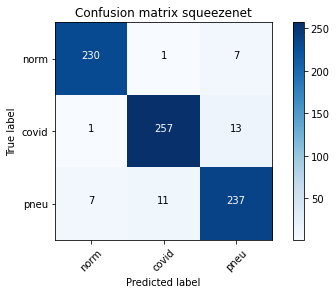

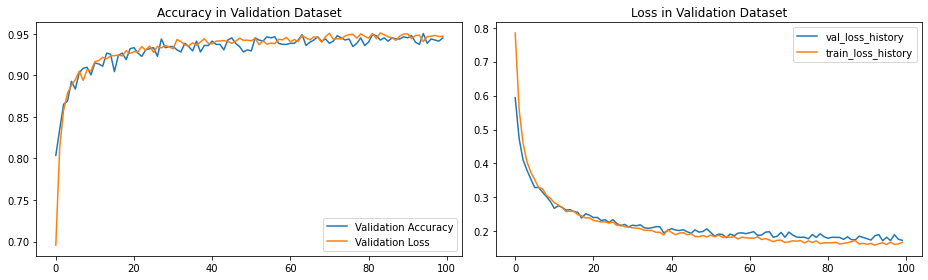


==== END ====
[[233   1   4]
 [  0 252  19]
 [  6  11 238]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.93 0.93]

Precision
[0.97 0.95 0.91]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9202 Acc: 0.6148
val Loss: 0.8121 Acc: 0.7173

Epoch 1/99
----------
train Loss: 0.7456 Acc: 0.7494
val Loss: 0.6391 Acc: 0.8128

Epoch 2/99
----------
train Loss: 0.6035 Acc: 0.8244
val Loss: 0.5145 Acc: 0.8626

Epoch 3/99
----------
train Loss: 0.5162 Acc: 0.8562
val Loss: 0.4563 Acc: 0.8586

Epoch 4/99
----------
train Loss: 0.4516 Acc: 0.8752
val Loss: 0.4154 Acc: 0.8809

Epoch 5/99
----------
train Loss: 0.4121 Acc: 0.8932
val Loss: 0.3727 Acc: 0.

train Loss: 0.1272 Acc: 0.9564
val Loss: 0.1734 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1336 Acc: 0.9591
val Loss: 0.1491 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1333 Acc: 0.9577
val Loss: 0.1749 Acc: 0.9437

Epoch 94/99
----------
train Loss: 0.1342 Acc: 0.9564
val Loss: 0.1671 Acc: 0.9503

Epoch 95/99
----------
train Loss: 0.1306 Acc: 0.9607
val Loss: 0.1679 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1303 Acc: 0.9584
val Loss: 0.1628 Acc: 0.9542

Epoch 97/99
----------
train Loss: 0.1320 Acc: 0.9591
val Loss: 0.1611 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1283 Acc: 0.9564
val Loss: 0.1605 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1326 Acc: 0.9574
val Loss: 0.1558 Acc: 0.9516


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 9s
Best val Acc: 0.956806
##############################


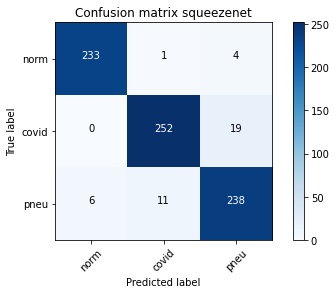

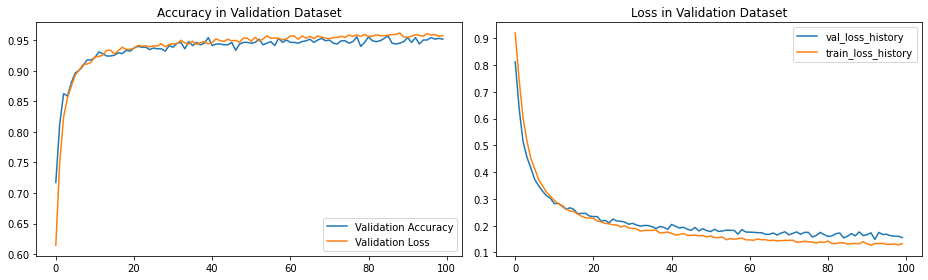


==== END ====
[[232   1   5]
 [  0 253  18]
 [  6  13 236]]

Sensitivity or recall total
0.943717277486911

Sensitivity or recall per classes
[0.97 0.93 0.93]

Precision
[0.97 0.95 0.91]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8048 Acc: 0.7023
val Loss: 0.6326 Acc: 0.8207

Epoch 1/99
----------
train Loss: 0.6046 Acc: 0.8271
val Loss: 0.5187 Acc: 0.8743

Epoch 2/99
----------
train Loss: 0.5059 Acc: 0.8605
val Loss: 0.4449 Acc: 0.8743

Epoch 3/99
----------
train Loss: 0.4450 Acc: 0.8775
val Loss: 0.4024 Acc: 0.8783

Epoch 4/99
----------
train Loss: 0.4049 Acc: 0.8886
val Loss: 0.3666 Acc: 0.8940

Epoch 5/99
----------
train Loss: 0.3645 Acc: 0.9001
val Loss: 0.3405 Acc: 0.9

train Loss: 0.1241 Acc: 0.9597
val Loss: 0.1487 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1272 Acc: 0.9591
val Loss: 0.1580 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1314 Acc: 0.9551
val Loss: 0.1572 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1212 Acc: 0.9623
val Loss: 0.1562 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1272 Acc: 0.9591
val Loss: 0.1597 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1211 Acc: 0.9617
val Loss: 0.1500 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1259 Acc: 0.9587
val Loss: 0.1601 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1194 Acc: 0.9643
val Loss: 0.1419 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.1277 Acc: 0.9600
val Loss: 0.1406 Acc: 0.9568


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 4s
Best val Acc: 0.956806
##############################


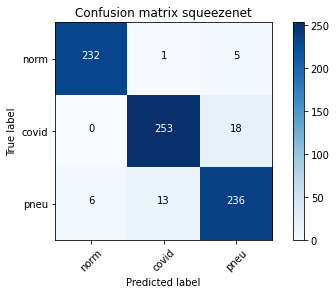

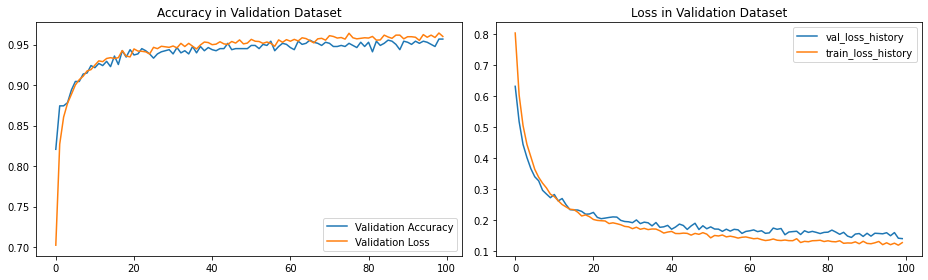


==== END ====
[[231   2   5]
 [  1 257  13]
 [  5  15 235]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.95 0.92]

Precision
[0.97 0.94 0.93]

F1 Score
[0.97 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0935 Acc: 0.4455
val Loss: 1.0237 Acc: 0.5052

Epoch 1/99
----------
train Loss: 1.0187 Acc: 0.4969
val Loss: 0.9817 Acc: 0.5301

Epoch 2/99
----------
train Loss: 0.9769 Acc: 0.5323
val Loss: 0.9341 Acc: 0.5602

Epoch 3/99
----------
train Loss: 0.9469 Acc: 0.5398
val Loss: 0.9141 Acc: 0.5720

Epoch 4/99
----------
train Loss: 0.9063 Acc: 0.5817
val Loss: 0.8711 Acc: 0.6152

Epoch 5/99
----------
train Loss: 0.8738 Acc: 0.6184
val Loss: 0.8428 Acc: 0.63

train Loss: 0.2913 Acc: 0.9132
val Loss: 0.2947 Acc: 0.9084

Epoch 92/99
----------
train Loss: 0.2924 Acc: 0.9142
val Loss: 0.2971 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.2915 Acc: 0.9161
val Loss: 0.2900 Acc: 0.9188

Epoch 94/99
----------
train Loss: 0.2886 Acc: 0.9135
val Loss: 0.2925 Acc: 0.9215

Epoch 95/99
----------
train Loss: 0.2908 Acc: 0.9175
val Loss: 0.2971 Acc: 0.9136

Epoch 96/99
----------
train Loss: 0.2941 Acc: 0.9080
val Loss: 0.2793 Acc: 0.9162

Epoch 97/99
----------
train Loss: 0.2922 Acc: 0.9152
val Loss: 0.2824 Acc: 0.9188

Epoch 98/99
----------
train Loss: 0.2932 Acc: 0.9089
val Loss: 0.2921 Acc: 0.9084

Epoch 99/99
----------
train Loss: 0.2843 Acc: 0.9125
val Loss: 0.2922 Acc: 0.9241


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 4s
Best val Acc: 0.926702
##############################


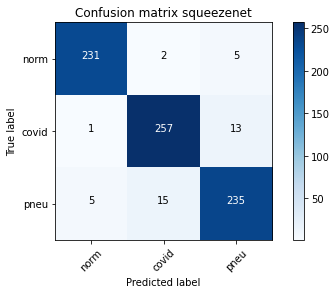

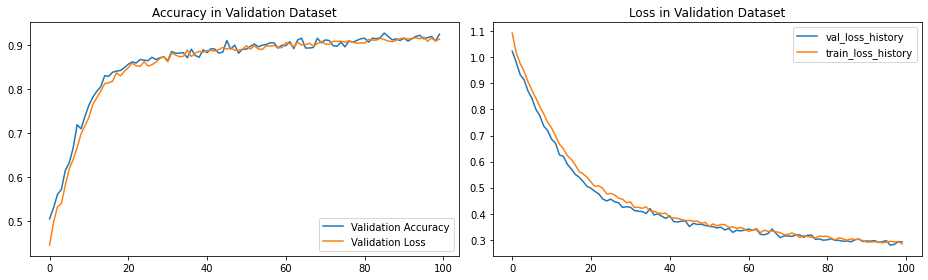


==== END ====
[[231   2   5]
 [  0 251  20]
 [ 15  19 221]]

Sensitivity or recall total
0.9201570680628273

Sensitivity or recall per classes
[0.97 0.93 0.87]

Precision
[0.94 0.92 0.9 ]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1609 Acc: 0.3325
val Loss: 1.1407 Acc: 0.3469

Epoch 1/99
----------
train Loss: 1.1165 Acc: 0.3544
val Loss: 1.0956 Acc: 0.3848

Epoch 2/99
----------
train Loss: 1.0842 Acc: 0.3908
val Loss: 1.0715 Acc: 0.4241

Epoch 3/99
----------
train Loss: 1.0603 Acc: 0.4350
val Loss: 1.0569 Acc: 0.4476

Epoch 4/99
----------
train Loss: 1.0461 Acc: 0.4618
val Loss: 1.0319 Acc: 0.4791

Epoch 5/99
----------
train Loss: 1.0235 Acc: 0.4818
val Loss: 1.0057 Acc: 0.51

train Loss: 0.3135 Acc: 0.9139
val Loss: 0.3098 Acc: 0.9071

Epoch 92/99
----------
train Loss: 0.3145 Acc: 0.9139
val Loss: 0.3137 Acc: 0.9018

Epoch 93/99
----------
train Loss: 0.3141 Acc: 0.9145
val Loss: 0.3025 Acc: 0.9097

Epoch 94/99
----------
train Loss: 0.3128 Acc: 0.9116
val Loss: 0.3113 Acc: 0.9084

Epoch 95/99
----------
train Loss: 0.3142 Acc: 0.9106
val Loss: 0.3091 Acc: 0.9018

Epoch 96/99
----------
train Loss: 0.3081 Acc: 0.9145
val Loss: 0.3064 Acc: 0.9058

Epoch 97/99
----------
train Loss: 0.3049 Acc: 0.9165
val Loss: 0.3085 Acc: 0.9123

Epoch 98/99
----------
train Loss: 0.3057 Acc: 0.9175
val Loss: 0.2973 Acc: 0.9097

Epoch 99/99
----------
train Loss: 0.3012 Acc: 0.9184
val Loss: 0.3031 Acc: 0.9162


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 3s
Best val Acc: 0.916230
##############################


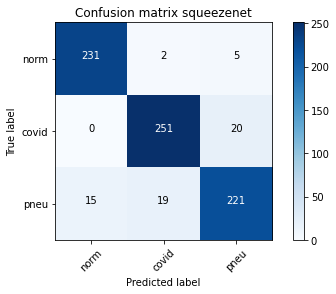

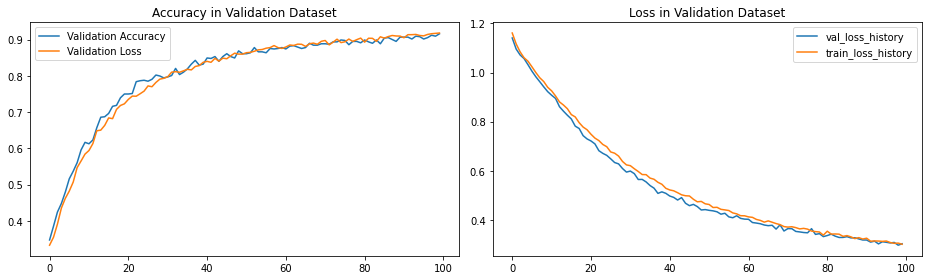


==== END ====
[[224   3  11]
 [  1 249  21]
 [ 12  22 221]]

Sensitivity or recall total
0.9083769633507853

Sensitivity or recall per classes
[0.94 0.92 0.87]

Precision
[0.95 0.91 0.87]

F1 Score
[0.94 0.91 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0994 Acc: 0.3741
val Loss: 1.0589 Acc: 0.4162

Epoch 1/99
----------
train Loss: 1.0686 Acc: 0.4124
val Loss: 1.0375 Acc: 0.4411

Epoch 2/99
----------
train Loss: 1.0478 Acc: 0.4301
val Loss: 1.0267 Acc: 0.4529

Epoch 3/99
----------
train Loss: 1.0311 Acc: 0.4428
val Loss: 1.0185 Acc: 0.4673

Epoch 4/99
----------
train Loss: 1.0112 Acc: 0.4681
val Loss: 1.0015 Acc: 0.4856

Epoch 5/99
----------
train Loss: 0.9958 Acc: 0.4953
val Loss: 0.9788 Acc: 0.50

train Loss: 0.3145 Acc: 0.9112
val Loss: 0.3176 Acc: 0.9071

Epoch 92/99
----------
train Loss: 0.3107 Acc: 0.9158
val Loss: 0.3140 Acc: 0.9018

Epoch 93/99
----------
train Loss: 0.3119 Acc: 0.9109
val Loss: 0.3132 Acc: 0.9097

Epoch 94/99
----------
train Loss: 0.3120 Acc: 0.9165
val Loss: 0.3146 Acc: 0.9188

Epoch 95/99
----------
train Loss: 0.2999 Acc: 0.9198
val Loss: 0.2976 Acc: 0.9123

Epoch 96/99
----------
train Loss: 0.3042 Acc: 0.9125
val Loss: 0.3025 Acc: 0.9097

Epoch 97/99
----------
train Loss: 0.3014 Acc: 0.9125
val Loss: 0.3100 Acc: 0.9058

Epoch 98/99
----------
train Loss: 0.2992 Acc: 0.9178
val Loss: 0.3014 Acc: 0.9084

Epoch 99/99
----------
train Loss: 0.3008 Acc: 0.9171
val Loss: 0.2944 Acc: 0.9202


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 6s
Best val Acc: 0.920157
##############################


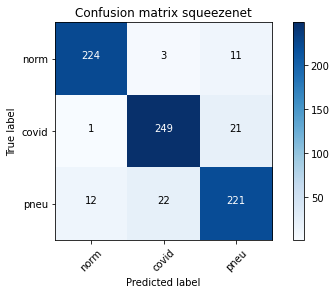

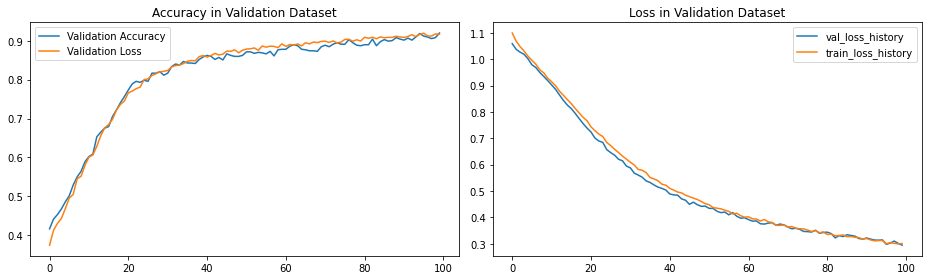


==== END ====
[[220   4  14]
 [  0 252  19]
 [ 12  22 221]]

Sensitivity or recall total
0.9070680628272252

Sensitivity or recall per classes
[0.92 0.93 0.87]

Precision
[0.95 0.91 0.87]

F1 Score
[0.94 0.92 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0978 Acc: 0.3669
val Loss: 1.0724 Acc: 0.3770

Epoch 1/99
----------
train Loss: 1.0394 Acc: 0.4422
val Loss: 1.0192 Acc: 0.4987

Epoch 2/99
----------
train Loss: 0.9840 Acc: 0.5231
val Loss: 0.9634 Acc: 0.5864

Epoch 3/99
----------
train Loss: 0.9389 Acc: 0.5827
val Loss: 0.9098 Acc: 0.6165

Epoch 4/99
----------
train Loss: 0.8930 Acc: 0.6322
val Loss: 0.8595 Acc: 0.6662

Epoch 5/99
----------
train Loss: 0.8551 Acc: 0.6626
val Loss: 0.8126 Acc: 0.7

train Loss: 0.2913 Acc: 0.9119
val Loss: 0.2973 Acc: 0.9110

Epoch 92/99
----------
train Loss: 0.2923 Acc: 0.9165
val Loss: 0.2898 Acc: 0.9123

Epoch 93/99
----------
train Loss: 0.2943 Acc: 0.9145
val Loss: 0.2924 Acc: 0.9110

Epoch 94/99
----------
train Loss: 0.2908 Acc: 0.9148
val Loss: 0.2929 Acc: 0.9123

Epoch 95/99
----------
train Loss: 0.2886 Acc: 0.9168
val Loss: 0.2935 Acc: 0.9110

Epoch 96/99
----------
train Loss: 0.2922 Acc: 0.9119
val Loss: 0.2885 Acc: 0.9097

Epoch 97/99
----------
train Loss: 0.2905 Acc: 0.9125
val Loss: 0.2854 Acc: 0.9162

Epoch 98/99
----------
train Loss: 0.2867 Acc: 0.9161
val Loss: 0.2895 Acc: 0.9136

Epoch 99/99
----------
train Loss: 0.2862 Acc: 0.9165
val Loss: 0.2811 Acc: 0.9149


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 0s
Best val Acc: 0.920157
##############################


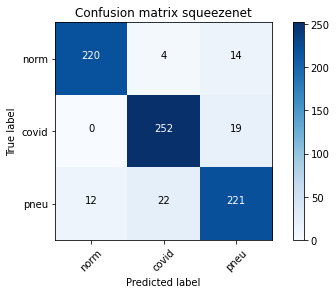

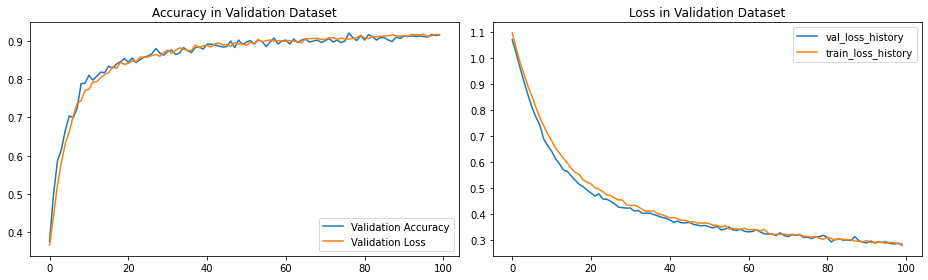


==== END ====
[[226   6   6]
 [  1 250  20]
 [ 18  25 212]]

Sensitivity or recall total
0.900523560209424

Sensitivity or recall per classes
[0.95 0.92 0.83]

Precision
[0.92 0.89 0.89]

F1 Score
[0.94 0.91 0.86]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1214 Acc: 0.3924
val Loss: 1.1166 Acc: 0.3992

Epoch 1/99
----------
train Loss: 1.0875 Acc: 0.4258
val Loss: 1.0833 Acc: 0.4346

Epoch 2/99
----------
train Loss: 1.0641 Acc: 0.4481
val Loss: 1.0674 Acc: 0.4620

Epoch 3/99
----------
train Loss: 1.0475 Acc: 0.4835
val Loss: 1.0524 Acc: 0.4817

Epoch 4/99
----------
train Loss: 1.0220 Acc: 0.5156
val Loss: 1.0255 Acc: 0.5157

Epoch 5/99
----------
train Loss: 1.0056 Acc: 0.5346
val Loss: 1.0029 Acc: 0.55

train Loss: 0.3019 Acc: 0.9139
val Loss: 0.3018 Acc: 0.9175

Epoch 92/99
----------
train Loss: 0.3022 Acc: 0.9158
val Loss: 0.2979 Acc: 0.9162

Epoch 93/99
----------
train Loss: 0.2974 Acc: 0.9230
val Loss: 0.2968 Acc: 0.9162

Epoch 94/99
----------
train Loss: 0.2982 Acc: 0.9178
val Loss: 0.2917 Acc: 0.9202

Epoch 95/99
----------
train Loss: 0.2923 Acc: 0.9204
val Loss: 0.2931 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.2947 Acc: 0.9211
val Loss: 0.2865 Acc: 0.9228

Epoch 97/99
----------
train Loss: 0.2931 Acc: 0.9201
val Loss: 0.2853 Acc: 0.9241

Epoch 98/99
----------
train Loss: 0.2925 Acc: 0.9198
val Loss: 0.2893 Acc: 0.9241

Epoch 99/99
----------
train Loss: 0.2876 Acc: 0.9220
val Loss: 0.2804 Acc: 0.9267


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 4s
Best val Acc: 0.926702
##############################


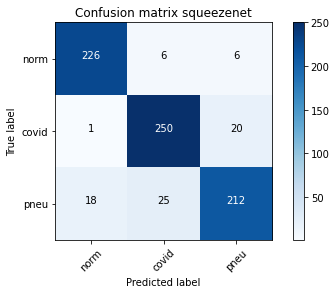

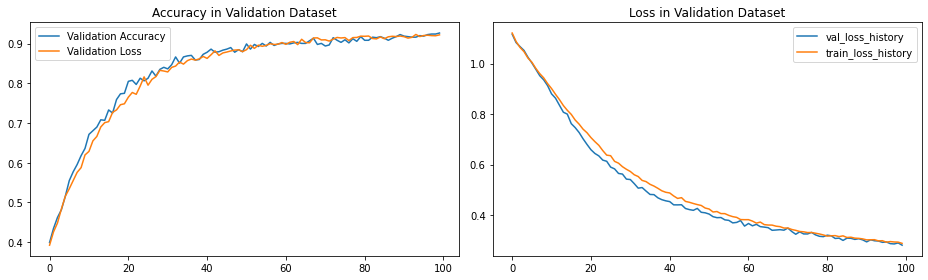


==== END ====
[[227   5   6]
 [  0 255  16]
 [  9  21 225]]

Sensitivity or recall total
0.925392670157068

Sensitivity or recall per classes
[0.95 0.94 0.88]

Precision
[0.96 0.91 0.91]

F1 Score
[0.96 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1363 Acc: 0.3148
val Loss: 1.0939 Acc: 0.3901

Epoch 1/99
----------
train Loss: 1.0760 Acc: 0.4121
val Loss: 1.0586 Acc: 0.4332

Epoch 2/99
----------
train Loss: 1.0492 Acc: 0.4487
val Loss: 1.0274 Acc: 0.4856

Epoch 3/99
----------
train Loss: 1.0306 Acc: 0.4648
val Loss: 1.0007 Acc: 0.5144

Epoch 4/99
----------
train Loss: 1.0007 Acc: 0.5034
val Loss: 0.9750 Acc: 0.5170

Epoch 5/99
----------
train Loss: 0.9779 Acc: 0.5182
val Loss: 0.9426 Acc: 0.54

train Loss: 0.3080 Acc: 0.9165
val Loss: 0.3006 Acc: 0.9175

Epoch 92/99
----------
train Loss: 0.3088 Acc: 0.9148
val Loss: 0.3060 Acc: 0.9058

Epoch 93/99
----------
train Loss: 0.2984 Acc: 0.9155
val Loss: 0.2962 Acc: 0.9123

Epoch 94/99
----------
train Loss: 0.3005 Acc: 0.9184
val Loss: 0.2978 Acc: 0.9136

Epoch 95/99
----------
train Loss: 0.2957 Acc: 0.9171
val Loss: 0.2951 Acc: 0.9045

Epoch 96/99
----------
train Loss: 0.2950 Acc: 0.9178
val Loss: 0.2996 Acc: 0.9149

Epoch 97/99
----------
train Loss: 0.2942 Acc: 0.9119
val Loss: 0.2928 Acc: 0.9110

Epoch 98/99
----------
train Loss: 0.2882 Acc: 0.9207
val Loss: 0.2895 Acc: 0.9058

Epoch 99/99
----------
train Loss: 0.2913 Acc: 0.9125
val Loss: 0.2955 Acc: 0.9110


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 55s
Best val Acc: 0.917539
##############################


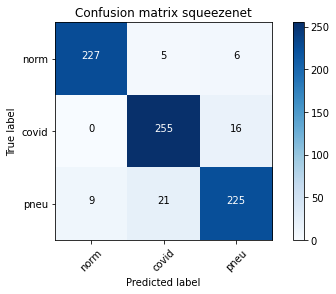

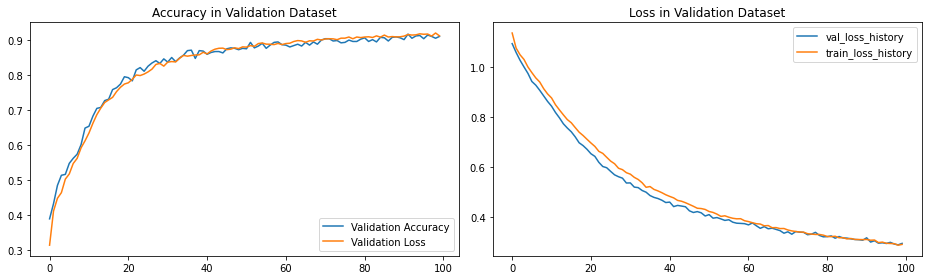


==== END ====
[[220   6  12]
 [  0 247  24]
 [ 12  20 223]]

Sensitivity or recall total
0.9031413612565445

Sensitivity or recall per classes
[0.92 0.91 0.87]

Precision
[0.95 0.9  0.86]

F1 Score
[0.94 0.91 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0942 Acc: 0.3826
val Loss: 1.0431 Acc: 0.4516

Epoch 1/99
----------
train Loss: 1.0149 Acc: 0.4972
val Loss: 0.9679 Acc: 0.5236

Epoch 2/99
----------
train Loss: 0.9460 Acc: 0.5722
val Loss: 0.8970 Acc: 0.6322

Epoch 3/99
----------
train Loss: 0.8959 Acc: 0.6305
val Loss: 0.8503 Acc: 0.6479

Epoch 4/99
----------
train Loss: 0.8418 Acc: 0.6643
val Loss: 0.7893 Acc: 0.6911

Epoch 5/99
----------
train Loss: 0.7992 Acc: 0.6885
val Loss: 0.7452 Acc: 0.7

train Loss: 0.2872 Acc: 0.9129
val Loss: 0.2879 Acc: 0.9045

Epoch 92/99
----------
train Loss: 0.2833 Acc: 0.9161
val Loss: 0.2812 Acc: 0.9188

Epoch 93/99
----------
train Loss: 0.2851 Acc: 0.9165
val Loss: 0.2855 Acc: 0.9136

Epoch 94/99
----------
train Loss: 0.2848 Acc: 0.9217
val Loss: 0.2815 Acc: 0.9149

Epoch 95/99
----------
train Loss: 0.2811 Acc: 0.9165
val Loss: 0.2903 Acc: 0.9162

Epoch 96/99
----------
train Loss: 0.2815 Acc: 0.9161
val Loss: 0.2809 Acc: 0.9084

Epoch 97/99
----------
train Loss: 0.2861 Acc: 0.9139
val Loss: 0.2765 Acc: 0.9162

Epoch 98/99
----------
train Loss: 0.2782 Acc: 0.9158
val Loss: 0.2787 Acc: 0.9110

Epoch 99/99
----------
train Loss: 0.2796 Acc: 0.9145
val Loss: 0.2804 Acc: 0.9110


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 3s
Best val Acc: 0.918848
##############################


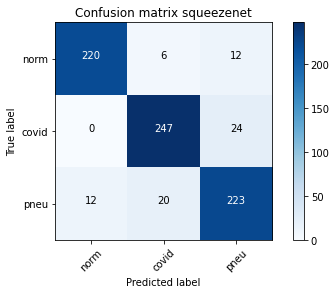

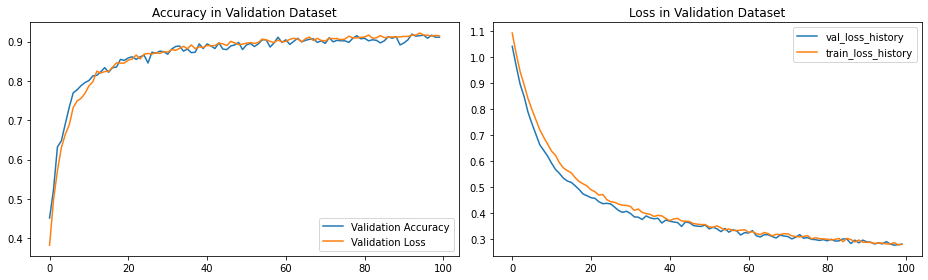


==== END ====
[[229   3   6]
 [  0 254  17]
 [ 13  27 215]]

Sensitivity or recall total
0.9136125654450262

Sensitivity or recall per classes
[0.96 0.94 0.84]

Precision
[0.95 0.89 0.9 ]

F1 Score
[0.95 0.92 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.2380 Acc: 0.3596
val Loss: 1.1764 Acc: 0.3613

Epoch 1/99
----------
train Loss: 1.1483 Acc: 0.3757
val Loss: 1.1078 Acc: 0.4319

Epoch 2/99
----------
train Loss: 1.0923 Acc: 0.4248
val Loss: 1.0597 Acc: 0.4987

Epoch 3/99
----------
train Loss: 1.0547 Acc: 0.4638
val Loss: 1.0296 Acc: 0.4712

Epoch 4/99
----------
train Loss: 1.0371 Acc: 0.4677
val Loss: 1.0038 Acc: 0.4948

Epoch 5/99
----------
train Loss: 1.0126 Acc: 0.4844
val Loss: 0.9875 Acc: 0.4

train Loss: 0.3077 Acc: 0.9171
val Loss: 0.3091 Acc: 0.9149

Epoch 92/99
----------
train Loss: 0.3069 Acc: 0.9191
val Loss: 0.2971 Acc: 0.9123

Epoch 93/99
----------
train Loss: 0.3071 Acc: 0.9139
val Loss: 0.3069 Acc: 0.9254

Epoch 94/99
----------
train Loss: 0.3029 Acc: 0.9181
val Loss: 0.3015 Acc: 0.9162

Epoch 95/99
----------
train Loss: 0.3028 Acc: 0.9181
val Loss: 0.2923 Acc: 0.9071

Epoch 96/99
----------
train Loss: 0.2987 Acc: 0.9191
val Loss: 0.2904 Acc: 0.9241

Epoch 97/99
----------
train Loss: 0.2973 Acc: 0.9211
val Loss: 0.3103 Acc: 0.9058

Epoch 98/99
----------
train Loss: 0.2952 Acc: 0.9188
val Loss: 0.2962 Acc: 0.9175

Epoch 99/99
----------
train Loss: 0.2904 Acc: 0.9250
val Loss: 0.2919 Acc: 0.9149


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 57s
Best val Acc: 0.925393
##############################


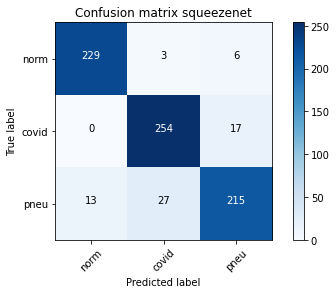

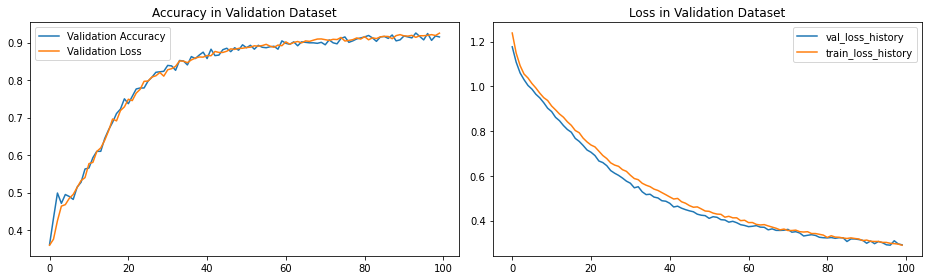


==== END ====
[[226   5   7]
 [  1 250  20]
 [  9  24 222]]

Sensitivity or recall total
0.9136125654450262

Sensitivity or recall per classes
[0.95 0.92 0.87]

Precision
[0.96 0.9  0.89]

F1 Score
[0.95 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.1.weight
	 classifier.1.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1469 Acc: 0.2981
val Loss: 1.1141 Acc: 0.3298

Epoch 1/99
----------
train Loss: 1.1064 Acc: 0.3560
val Loss: 1.0772 Acc: 0.3796

Epoch 2/99
----------
train Loss: 1.0735 Acc: 0.3914
val Loss: 1.0524 Acc: 0.4149

Epoch 3/99
----------
train Loss: 1.0558 Acc: 0.4176
val Loss: 1.0203 Acc: 0.4529

Epoch 4/99
----------
train Loss: 1.0293 Acc: 0.4514
val Loss: 1.0002 Acc: 0.4777

Epoch 5/99
----------
train Loss: 0.9994 Acc: 0.5025
val Loss: 0.9799 Acc: 0.5

train Loss: 0.3107 Acc: 0.9139
val Loss: 0.3023 Acc: 0.9071

Epoch 92/99
----------
train Loss: 0.3104 Acc: 0.9129
val Loss: 0.3117 Acc: 0.9097

Epoch 93/99
----------
train Loss: 0.3071 Acc: 0.9119
val Loss: 0.3158 Acc: 0.9136

Epoch 94/99
----------
train Loss: 0.3047 Acc: 0.9161
val Loss: 0.3153 Acc: 0.9005

Epoch 95/99
----------
train Loss: 0.3065 Acc: 0.9152
val Loss: 0.3073 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.3041 Acc: 0.9148
val Loss: 0.3045 Acc: 0.9123

Epoch 97/99
----------
train Loss: 0.2989 Acc: 0.9125
val Loss: 0.3009 Acc: 0.9123

Epoch 98/99
----------
train Loss: 0.3055 Acc: 0.9119
val Loss: 0.2988 Acc: 0.9162

Epoch 99/99
----------
train Loss: 0.2971 Acc: 0.9139
val Loss: 0.2923 Acc: 0.9202


##############################
------ Summary ------
model -> squeezenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 60s
Best val Acc: 0.920157
##############################


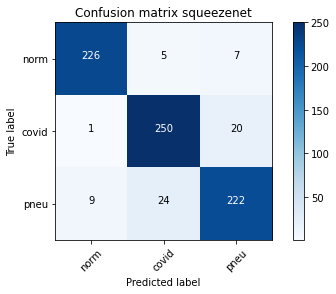

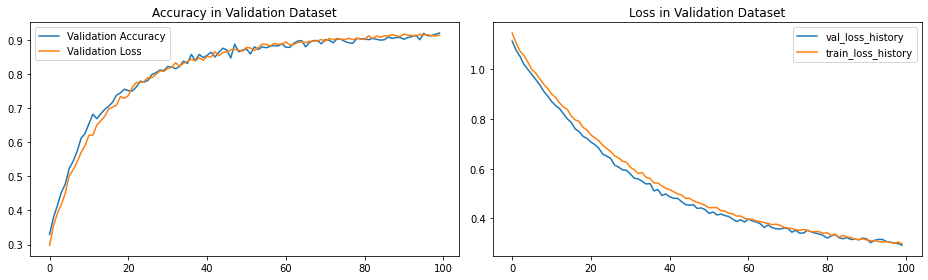


==== END ====
[[225   3  10]
 [  0 253  18]
 [ 11  23 221]]

Sensitivity or recall total
0.9149214659685864

Sensitivity or recall per classes
[0.95 0.93 0.87]

Precision
[0.95 0.91 0.89]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5433 Acc: 0.8202
val Loss: 0.2759 Acc: 0.9372

Epoch 1/99
----------
train Loss: 0.2712 Acc: 0.9243
val Loss: 0.2183 Acc: 0.9463

Epoch 2/99
----------
train Loss: 0.2489 Acc: 0.9175
val Loss: 0.2040 Acc: 0.9424

Epoch 3/99
----------
train Loss: 0.2241 Acc: 0.9292
val Loss: 0.1893 Acc: 0.9372

Epoch 4/99
----------
train Loss: 0.2032 Acc: 0.9361
val Loss: 0.1712 Acc: 0.9490

Epoch 5/99
----------
train Loss: 0.1960 Acc: 0.9404
val Loss: 0.1705 Acc: 0.9516

Ep

train Loss: 0.1153 Acc: 0.9577
val Loss: 0.1076 Acc: 0.9660

Epoch 92/99
----------
train Loss: 0.1238 Acc: 0.9558
val Loss: 0.1056 Acc: 0.9620

Epoch 93/99
----------
train Loss: 0.1208 Acc: 0.9528
val Loss: 0.1267 Acc: 0.9568

Epoch 94/99
----------
train Loss: 0.1167 Acc: 0.9600
val Loss: 0.1313 Acc: 0.9581

Epoch 95/99
----------
train Loss: 0.1150 Acc: 0.9584
val Loss: 0.1293 Acc: 0.9594

Epoch 96/99
----------
train Loss: 0.1126 Acc: 0.9633
val Loss: 0.1095 Acc: 0.9634

Epoch 97/99
----------
train Loss: 0.1128 Acc: 0.9623
val Loss: 0.1154 Acc: 0.9607

Epoch 98/99
----------
train Loss: 0.1216 Acc: 0.9535
val Loss: 0.1146 Acc: 0.9620

Epoch 99/99
----------
train Loss: 0.1104 Acc: 0.9591
val Loss: 0.1248 Acc: 0.9594


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 12s
Best val Acc: 0.971204
##############################


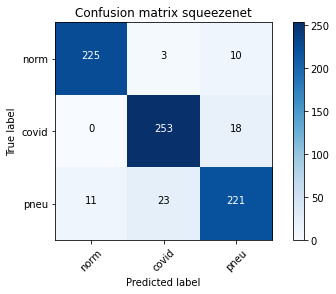

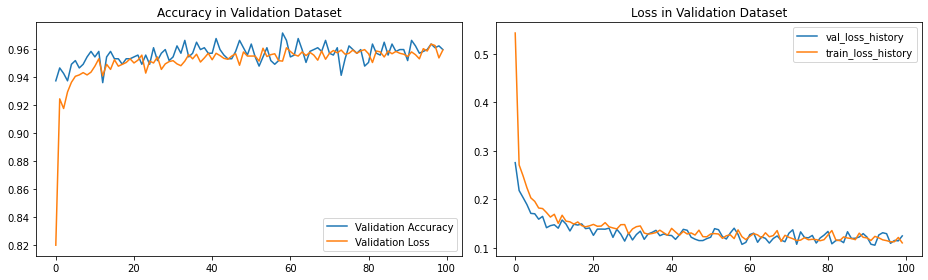


==== END ====
[[233   3   2]
 [  0 255  16]
 [  2  10 243]]

Sensitivity or recall total
0.9568062827225131

Sensitivity or recall per classes
[0.98 0.94 0.95]

Precision
[0.99 0.95 0.93]

F1 Score
[0.99 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5633 Acc: 0.8084
val Loss: 0.3038 Acc: 0.9267

Epoch 1/99
----------
train Loss: 0.2860 Acc: 0.9165
val Loss: 0.2229 Acc: 0.9411

Epoch 2/99
----------
train Loss: 0.2396 Acc: 0.9266
val Loss: 0.1856 Acc: 0.9411

Epoch 3/99
----------
train Loss: 0.2057 Acc: 0.9371
val Loss: 0.2007 Acc: 0.9476

Epoch 4/99
----------
train Loss: 0.2049 Acc: 0.9309
val Loss: 0.1510 Acc: 0.9503

Epoch 5/99
----------
train Loss: 0.1956 Acc: 0.9335
val Loss: 0.1640 Acc: 0.9490

Ep

train Loss: 0.1070 Acc: 0.9623
val Loss: 0.1223 Acc: 0.9568

Epoch 92/99
----------
train Loss: 0.1205 Acc: 0.9545
val Loss: 0.1226 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.1222 Acc: 0.9581
val Loss: 0.1203 Acc: 0.9620

Epoch 94/99
----------
train Loss: 0.1222 Acc: 0.9558
val Loss: 0.1293 Acc: 0.9620

Epoch 95/99
----------
train Loss: 0.1117 Acc: 0.9591
val Loss: 0.1039 Acc: 0.9660

Epoch 96/99
----------
train Loss: 0.1075 Acc: 0.9620
val Loss: 0.1382 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1106 Acc: 0.9604
val Loss: 0.1223 Acc: 0.9568

Epoch 98/99
----------
train Loss: 0.1037 Acc: 0.9613
val Loss: 0.1152 Acc: 0.9660

Epoch 99/99
----------
train Loss: 0.1107 Acc: 0.9584
val Loss: 0.1113 Acc: 0.9647


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 16s
Best val Acc: 0.969895
##############################


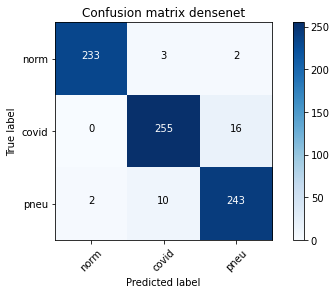

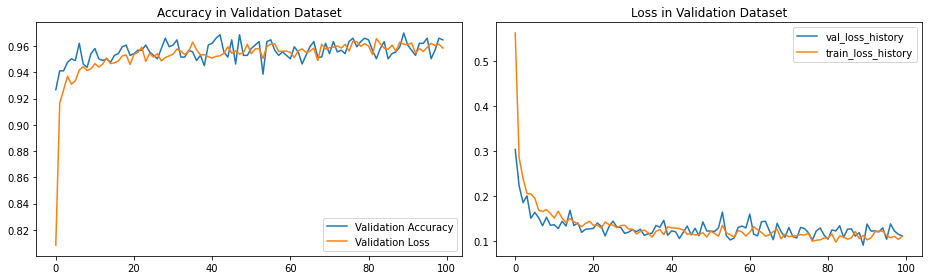


==== END ====
[[235   2   1]
 [  1 260  10]
 [  3   8 244]]

Sensitivity or recall total
0.9672774869109948

Sensitivity or recall per classes
[0.99 0.96 0.96]

Precision
[0.98 0.96 0.96]

F1 Score
[0.99 0.96 0.96]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5522 Acc: 0.8176
val Loss: 0.3131 Acc: 0.8966

Epoch 1/99
----------
train Loss: 0.2787 Acc: 0.9132
val Loss: 0.3007 Acc: 0.8940

Epoch 2/99
----------
train Loss: 0.2320 Acc: 0.9237
val Loss: 0.1740 Acc: 0.9463

Epoch 3/99
----------
train Loss: 0.2194 Acc: 0.9260
val Loss: 0.1879 Acc: 0.9411

Epoch 4/99
----------
train Loss: 0.1985 Acc: 0.9351
val Loss: 0.1848 Acc: 0.9437

Epoch 5/99
----------
train Loss: 0.1770 Acc: 0.9424
val Loss: 0.3958 Acc: 0.8168

Ep

train Loss: 0.1121 Acc: 0.9600
val Loss: 0.1374 Acc: 0.9581

Epoch 92/99
----------
train Loss: 0.1043 Acc: 0.9630
val Loss: 0.1408 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1102 Acc: 0.9613
val Loss: 0.1015 Acc: 0.9620

Epoch 94/99
----------
train Loss: 0.0978 Acc: 0.9620
val Loss: 0.1189 Acc: 0.9647

Epoch 95/99
----------
train Loss: 0.1224 Acc: 0.9577
val Loss: 0.0975 Acc: 0.9620

Epoch 96/99
----------
train Loss: 0.1021 Acc: 0.9633
val Loss: 0.1361 Acc: 0.9555

Epoch 97/99
----------
train Loss: 0.1069 Acc: 0.9597
val Loss: 0.1093 Acc: 0.9647

Epoch 98/99
----------
train Loss: 0.1105 Acc: 0.9587
val Loss: 0.1679 Acc: 0.9555

Epoch 99/99
----------
train Loss: 0.1139 Acc: 0.9577
val Loss: 0.1148 Acc: 0.9542


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 14s
Best val Acc: 0.969895
##############################


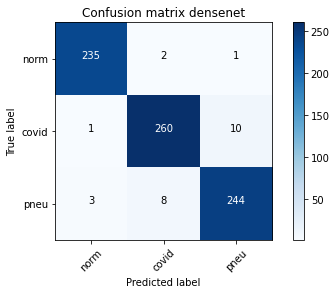

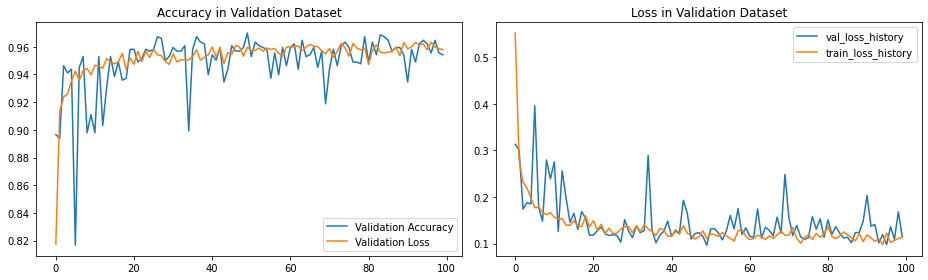


==== END ====
[[234   1   3]
 [  0 254  17]
 [  2  12 241]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.98 0.94 0.95]

Precision
[0.99 0.95 0.92]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5456 Acc: 0.8071
val Loss: 0.2886 Acc: 0.9359

Epoch 1/99
----------
train Loss: 0.2749 Acc: 0.9214
val Loss: 0.2183 Acc: 0.9398

Epoch 2/99
----------
train Loss: 0.2411 Acc: 0.9273
val Loss: 0.2044 Acc: 0.9372

Epoch 3/99
----------
train Loss: 0.2182 Acc: 0.9325
val Loss: 0.1821 Acc: 0.9463

Epoch 4/99
----------
train Loss: 0.2040 Acc: 0.9361
val Loss: 0.1837 Acc: 0.9332

Epoch 5/99
----------
train Loss: 0.1987 Acc: 0.9319
val Loss: 0.1723 Acc: 0.9476

E

train Loss: 0.1169 Acc: 0.9610
val Loss: 0.1376 Acc: 0.9555

Epoch 92/99
----------
train Loss: 0.1226 Acc: 0.9551
val Loss: 0.1220 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.1136 Acc: 0.9571
val Loss: 0.1234 Acc: 0.9568

Epoch 94/99
----------
train Loss: 0.1152 Acc: 0.9600
val Loss: 0.1216 Acc: 0.9594

Epoch 95/99
----------
train Loss: 0.1112 Acc: 0.9584
val Loss: 0.1097 Acc: 0.9607

Epoch 96/99
----------
train Loss: 0.1118 Acc: 0.9584
val Loss: 0.1252 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1174 Acc: 0.9577
val Loss: 0.1065 Acc: 0.9647

Epoch 98/99
----------
train Loss: 0.1250 Acc: 0.9555
val Loss: 0.1570 Acc: 0.9385

Epoch 99/99
----------
train Loss: 0.1137 Acc: 0.9597
val Loss: 0.1325 Acc: 0.9555


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 12s
Best val Acc: 0.969895
##############################


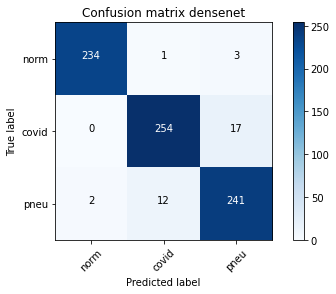

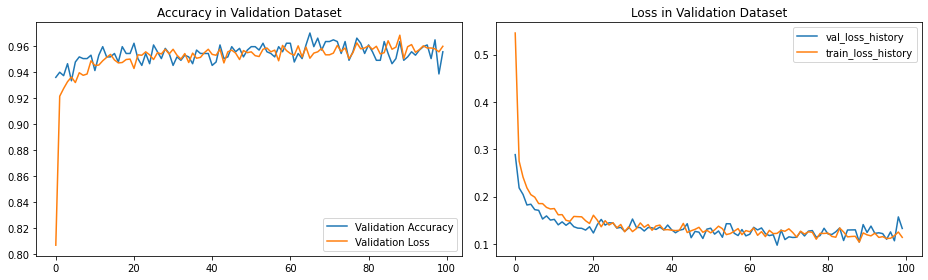


==== END ====
[[234   2   2]
 [  0 261  10]
 [  1  15 239]]

Sensitivity or recall total
0.9607329842931938

Sensitivity or recall per classes
[0.98 0.96 0.94]

Precision
[1.   0.94 0.95]

F1 Score
[0.99 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5120 Acc: 0.8483
val Loss: 0.2912 Acc: 0.9202

Epoch 1/99
----------
train Loss: 0.2669 Acc: 0.9243
val Loss: 0.2088 Acc: 0.9306

Epoch 2/99
----------
train Loss: 0.2257 Acc: 0.9302
val Loss: 0.2274 Acc: 0.9293

Epoch 3/99
----------
train Loss: 0.2035 Acc: 0.9381
val Loss: 0.1813 Acc: 0.9346

Epoch 4/99
----------
train Loss: 0.1818 Acc: 0.9407
val Loss: 0.1623 Acc: 0.9516

Epoch 5/99
----------
train Loss: 0.1835 Acc: 0.9371
val Loss: 0.1557 Acc: 0.9437

E

train Loss: 0.1318 Acc: 0.9532
val Loss: 0.1029 Acc: 0.9607

Epoch 92/99
----------
train Loss: 0.1200 Acc: 0.9538
val Loss: 0.1306 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1007 Acc: 0.9623
val Loss: 0.1175 Acc: 0.9594

Epoch 94/99
----------
train Loss: 0.1108 Acc: 0.9630
val Loss: 0.1228 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1206 Acc: 0.9597
val Loss: 0.1189 Acc: 0.9647

Epoch 96/99
----------
train Loss: 0.1086 Acc: 0.9591
val Loss: 0.1066 Acc: 0.9634

Epoch 97/99
----------
train Loss: 0.1156 Acc: 0.9564
val Loss: 0.1241 Acc: 0.9555

Epoch 98/99
----------
train Loss: 0.1008 Acc: 0.9643
val Loss: 0.1100 Acc: 0.9594

Epoch 99/99
----------
train Loss: 0.1117 Acc: 0.9577
val Loss: 0.1337 Acc: 0.9516


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 16s
Best val Acc: 0.969895
##############################


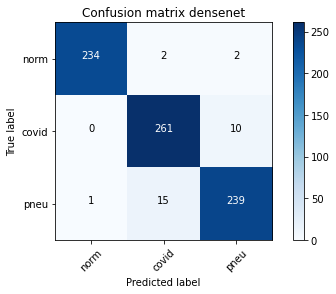

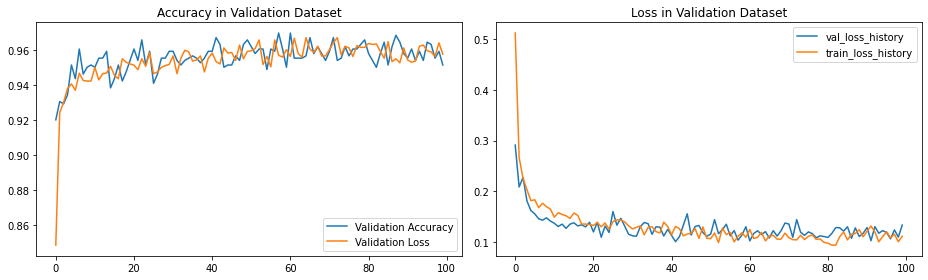


==== END ====
[[234   2   2]
 [  0 260  11]
 [  1   9 245]]

Sensitivity or recall total
0.9672774869109948

Sensitivity or recall per classes
[0.98 0.96 0.96]

Precision
[1.   0.96 0.95]

F1 Score
[0.99 0.96 0.96]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5314 Acc: 0.8208
val Loss: 0.3258 Acc: 0.9031

Epoch 1/99
----------
train Loss: 0.2684 Acc: 0.9198
val Loss: 0.2733 Acc: 0.9058

Epoch 2/99
----------
train Loss: 0.2391 Acc: 0.9256
val Loss: 0.2188 Acc: 0.9215

Epoch 3/99
----------
train Loss: 0.2180 Acc: 0.9250
val Loss: 0.5338 Acc: 0.7448

Epoch 4/99
----------
train Loss: 0.1874 Acc: 0.9335
val Loss: 0.1579 Acc: 0.9490

Epoch 5/99
----------
train Loss: 0.1972 Acc: 0.9329
val Loss: 0.1514 Acc: 0.9529

E

train Loss: 0.1181 Acc: 0.9571
val Loss: 0.1176 Acc: 0.9568

Epoch 92/99
----------
train Loss: 0.1195 Acc: 0.9538
val Loss: 0.1089 Acc: 0.9686

Epoch 93/99
----------
train Loss: 0.1040 Acc: 0.9630
val Loss: 0.1271 Acc: 0.9568

Epoch 94/99
----------
train Loss: 0.1185 Acc: 0.9541
val Loss: 0.2006 Acc: 0.9372

Epoch 95/99
----------
train Loss: 0.1119 Acc: 0.9600
val Loss: 0.1216 Acc: 0.9594

Epoch 96/99
----------
train Loss: 0.1163 Acc: 0.9545
val Loss: 0.1150 Acc: 0.9647

Epoch 97/99
----------
train Loss: 0.1083 Acc: 0.9564
val Loss: 0.1126 Acc: 0.9568

Epoch 98/99
----------
train Loss: 0.0976 Acc: 0.9643
val Loss: 0.0991 Acc: 0.9673

Epoch 99/99
----------
train Loss: 0.1000 Acc: 0.9610
val Loss: 0.1151 Acc: 0.9686


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 21s
Best val Acc: 0.968586
##############################


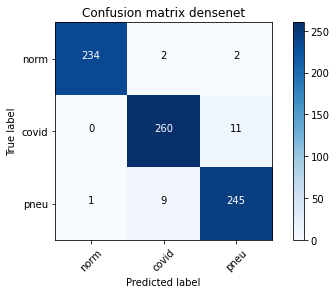

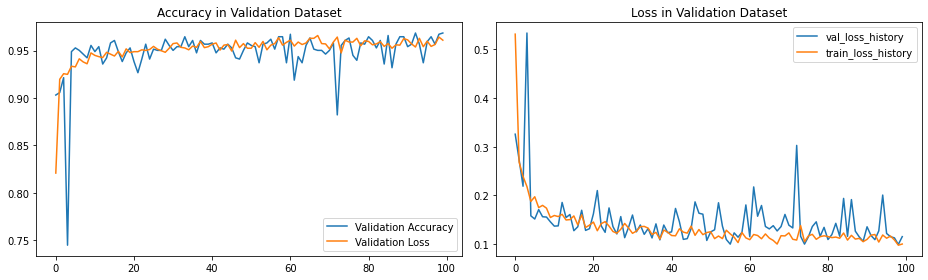


==== END ====
[[235   2   1]
 [  0 258  13]
 [  3  15 237]]

Sensitivity or recall total
0.9554973821989529

Sensitivity or recall per classes
[0.99 0.95 0.93]

Precision
[0.99 0.94 0.94]

F1 Score
[0.99 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5448 Acc: 0.8113
val Loss: 0.3121 Acc: 0.9031

Epoch 1/99
----------
train Loss: 0.2724 Acc: 0.9188
val Loss: 0.2431 Acc: 0.9175

Epoch 2/99
----------
train Loss: 0.2440 Acc: 0.9260
val Loss: 0.2208 Acc: 0.9149

Epoch 3/99
----------
train Loss: 0.2102 Acc: 0.9381
val Loss: 0.1858 Acc: 0.9476

Epoch 4/99
----------
train Loss: 0.2052 Acc: 0.9345
val Loss: 0.1676 Acc: 0.9437

Epoch 5/99
----------
train Loss: 0.1915 Acc: 0.9387
val Loss: 0.1643 Acc: 0.9503

E

train Loss: 0.1184 Acc: 0.9558
val Loss: 0.1130 Acc: 0.9647

Epoch 92/99
----------
train Loss: 0.1153 Acc: 0.9584
val Loss: 0.1156 Acc: 0.9555

Epoch 93/99
----------
train Loss: 0.1105 Acc: 0.9630
val Loss: 0.1179 Acc: 0.9594

Epoch 94/99
----------
train Loss: 0.1290 Acc: 0.9541
val Loss: 0.1198 Acc: 0.9568

Epoch 95/99
----------
train Loss: 0.1194 Acc: 0.9571
val Loss: 0.1135 Acc: 0.9673

Epoch 96/99
----------
train Loss: 0.1200 Acc: 0.9577
val Loss: 0.1307 Acc: 0.9581

Epoch 97/99
----------
train Loss: 0.1162 Acc: 0.9571
val Loss: 0.1310 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1083 Acc: 0.9607
val Loss: 0.1167 Acc: 0.9581

Epoch 99/99
----------
train Loss: 0.1144 Acc: 0.9607
val Loss: 0.1271 Acc: 0.9673


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 19s
Best val Acc: 0.968586
##############################


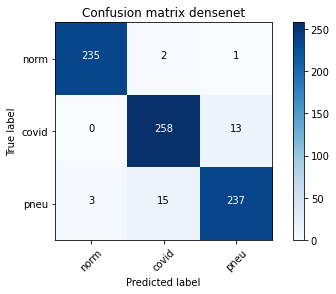

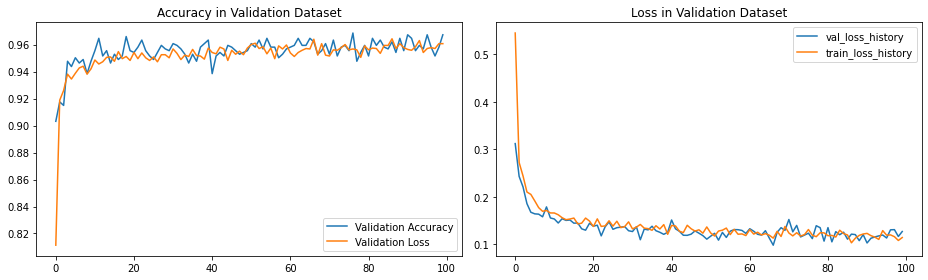


==== END ====
[[235   2   1]
 [  0 257  14]
 [  1  11 243]]

Sensitivity or recall total
0.9620418848167539

Sensitivity or recall per classes
[0.99 0.95 0.95]

Precision
[1.   0.95 0.94]

F1 Score
[0.99 0.95 0.95]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5248 Acc: 0.8339
val Loss: 0.3102 Acc: 0.9215

Epoch 1/99
----------
train Loss: 0.2824 Acc: 0.9188
val Loss: 0.2193 Acc: 0.9385

Epoch 2/99
----------
train Loss: 0.2327 Acc: 0.9217
val Loss: 0.1816 Acc: 0.9450

Epoch 3/99
----------
train Loss: 0.2134 Acc: 0.9309
val Loss: 0.1894 Acc: 0.9359

Epoch 4/99
----------
train Loss: 0.1934 Acc: 0.9381
val Loss: 0.1674 Acc: 0.9490

Epoch 5/99
----------
train Loss: 0.1752 Acc: 0.9424
val Loss: 0.1605 Acc: 0.9476

E

train Loss: 0.1220 Acc: 0.9548
val Loss: 0.1401 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1148 Acc: 0.9610
val Loss: 0.1082 Acc: 0.9594

Epoch 93/99
----------
train Loss: 0.1221 Acc: 0.9532
val Loss: 0.1297 Acc: 0.9594

Epoch 94/99
----------
train Loss: 0.0956 Acc: 0.9659
val Loss: 0.1017 Acc: 0.9634

Epoch 95/99
----------
train Loss: 0.1017 Acc: 0.9636
val Loss: 0.1266 Acc: 0.9660

Epoch 96/99
----------
train Loss: 0.1212 Acc: 0.9548
val Loss: 0.1149 Acc: 0.9660

Epoch 97/99
----------
train Loss: 0.1062 Acc: 0.9633
val Loss: 0.1023 Acc: 0.9634

Epoch 98/99
----------
train Loss: 0.0961 Acc: 0.9640
val Loss: 0.1218 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1093 Acc: 0.9587
val Loss: 0.1268 Acc: 0.9542


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 13s
Best val Acc: 0.975131
##############################


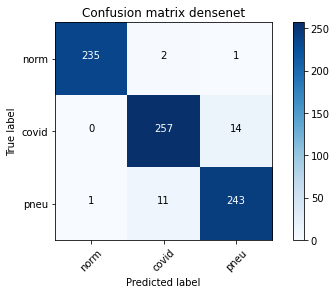

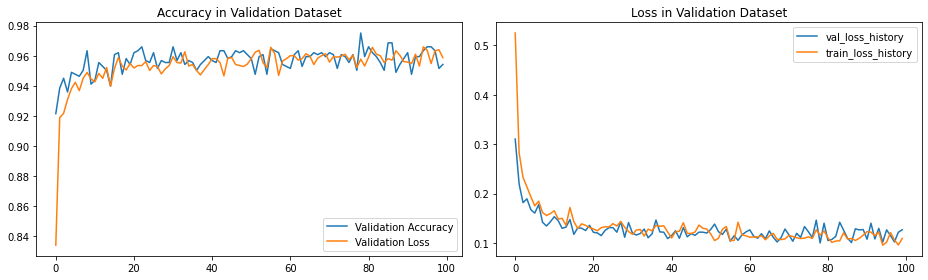


==== END ====
[[234   2   2]
 [  0 259  12]
 [  2  14 239]]

Sensitivity or recall total
0.9581151832460733

Sensitivity or recall per classes
[0.98 0.96 0.94]

Precision
[0.99 0.94 0.94]

F1 Score
[0.99 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4768 Acc: 0.8542
val Loss: 0.2746 Acc: 0.9293

Epoch 1/99
----------
train Loss: 0.2645 Acc: 0.9214
val Loss: 0.2303 Acc: 0.9267

Epoch 2/99
----------
train Loss: 0.2246 Acc: 0.9276
val Loss: 0.2568 Acc: 0.9058

Epoch 3/99
----------
train Loss: 0.2040 Acc: 0.9306
val Loss: 0.1728 Acc: 0.9424

Epoch 4/99
----------
train Loss: 0.1882 Acc: 0.9384
val Loss: 0.3330 Acc: 0.8704

Epoch 5/99
----------
train Loss: 0.1836 Acc: 0.9453
val Loss: 0.1833 Acc: 0.9228

E

train Loss: 0.1112 Acc: 0.9604
val Loss: 0.1195 Acc: 0.9607

Epoch 92/99
----------
train Loss: 0.1121 Acc: 0.9597
val Loss: 0.1244 Acc: 0.9581

Epoch 93/99
----------
train Loss: 0.1140 Acc: 0.9577
val Loss: 0.1150 Acc: 0.9634

Epoch 94/99
----------
train Loss: 0.1168 Acc: 0.9577
val Loss: 0.1140 Acc: 0.9620

Epoch 95/99
----------
train Loss: 0.1055 Acc: 0.9587
val Loss: 0.1362 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1106 Acc: 0.9617
val Loss: 0.1265 Acc: 0.9555

Epoch 97/99
----------
train Loss: 0.1179 Acc: 0.9574
val Loss: 0.1059 Acc: 0.9607

Epoch 98/99
----------
train Loss: 0.1059 Acc: 0.9623
val Loss: 0.1321 Acc: 0.9555

Epoch 99/99
----------
train Loss: 0.1125 Acc: 0.9548
val Loss: 0.1125 Acc: 0.9647


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 12s
Best val Acc: 0.967277
##############################


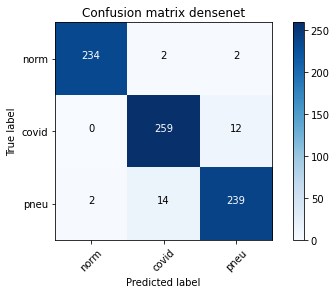

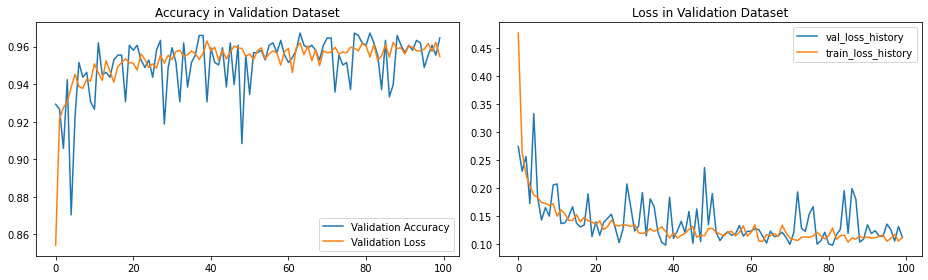


==== END ====
[[232   3   3]
 [  0 262   9]
 [  1  12 242]]

Sensitivity or recall total
0.9633507853403142

Sensitivity or recall per classes
[0.97 0.97 0.95]

Precision
[1.   0.95 0.95]

F1 Score
[0.99 0.96 0.95]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9439 Acc: 0.5968
val Loss: 0.7728 Acc: 0.8312

Epoch 1/99
----------
train Loss: 0.6973 Acc: 0.8392
val Loss: 0.6034 Acc: 0.8809

Epoch 2/99
----------
train Loss: 0.5730 Acc: 0.8818
val Loss: 0.5020 Acc: 0.9149

Epoch 3/99
----------
train Loss: 0.4940 Acc: 0.9001
val Loss: 0.4385 Acc: 0.9123

Epoch 4/99
----------
train Loss: 0.4446 Acc: 0.9057
val Loss: 0.4053 Acc: 0.9123

Epoch 5/99
----------
train Loss: 0.4037 Acc: 0.9122
val Loss: 0.3613 Acc: 0.9280

E

train Loss: 0.1634 Acc: 0.9469
val Loss: 0.1533 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1628 Acc: 0.9456
val Loss: 0.1521 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1586 Acc: 0.9509
val Loss: 0.1510 Acc: 0.9476

Epoch 94/99
----------
train Loss: 0.1673 Acc: 0.9466
val Loss: 0.1564 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1642 Acc: 0.9453
val Loss: 0.1439 Acc: 0.9568

Epoch 96/99
----------
train Loss: 0.1709 Acc: 0.9460
val Loss: 0.1418 Acc: 0.9516

Epoch 97/99
----------
train Loss: 0.1732 Acc: 0.9460
val Loss: 0.1571 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1592 Acc: 0.9469
val Loss: 0.1485 Acc: 0.9542

Epoch 99/99
----------
train Loss: 0.1630 Acc: 0.9479
val Loss: 0.1398 Acc: 0.9463


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 14s
Best val Acc: 0.958115
##############################


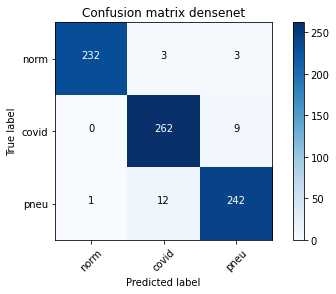

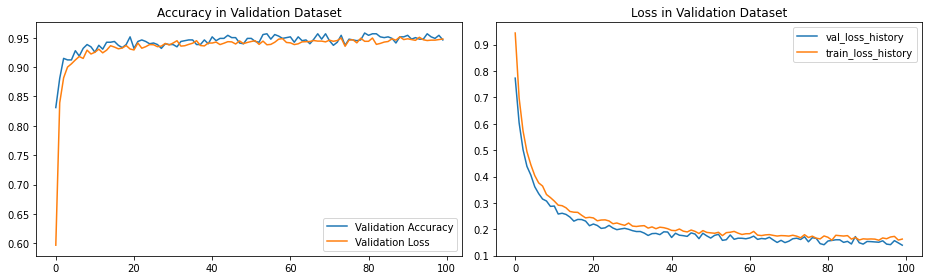


==== END ====
[[235   2   1]
 [  1 255  15]
 [  7  16 232]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.99 0.94 0.91]

Precision
[0.97 0.93 0.94]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9687 Acc: 0.5732
val Loss: 0.8332 Acc: 0.7592

Epoch 1/99
----------
train Loss: 0.7475 Acc: 0.8120
val Loss: 0.6527 Acc: 0.8914

Epoch 2/99
----------
train Loss: 0.6039 Acc: 0.8893
val Loss: 0.5320 Acc: 0.9097

Epoch 3/99
----------
train Loss: 0.5139 Acc: 0.9103
val Loss: 0.4582 Acc: 0.9254

Epoch 4/99
----------
train Loss: 0.4450 Acc: 0.9201
val Loss: 0.4152 Acc: 0.9254

Epoch 5/99
----------
train Loss: 0.4086 Acc: 0.9198
val Loss: 0.3630 Acc: 0.9319

E

train Loss: 0.1397 Acc: 0.9555
val Loss: 0.1334 Acc: 0.9529

Epoch 92/99
----------
train Loss: 0.1469 Acc: 0.9505
val Loss: 0.1300 Acc: 0.9555

Epoch 93/99
----------
train Loss: 0.1373 Acc: 0.9548
val Loss: 0.1383 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1441 Acc: 0.9502
val Loss: 0.1299 Acc: 0.9568

Epoch 95/99
----------
train Loss: 0.1481 Acc: 0.9509
val Loss: 0.1303 Acc: 0.9568

Epoch 96/99
----------
train Loss: 0.1425 Acc: 0.9496
val Loss: 0.1399 Acc: 0.9542

Epoch 97/99
----------
train Loss: 0.1503 Acc: 0.9505
val Loss: 0.1442 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1442 Acc: 0.9492
val Loss: 0.1267 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.1329 Acc: 0.9555
val Loss: 0.1348 Acc: 0.9581


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 10s
Best val Acc: 0.963351
##############################


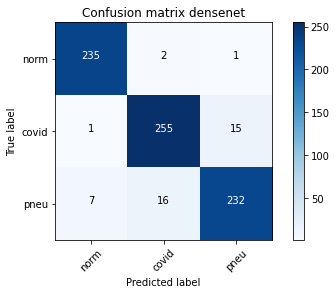

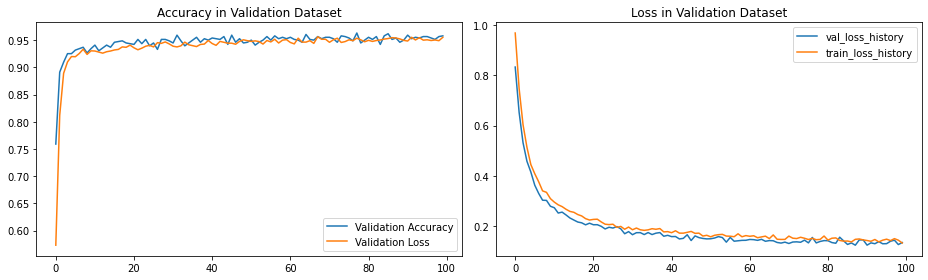


==== END ====
[[234   2   2]
 [  0 256  15]
 [  4  11 240]]

Sensitivity or recall total
0.9554973821989529

Sensitivity or recall per classes
[0.98 0.94 0.94]

Precision
[0.98 0.95 0.93]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8374 Acc: 0.7236
val Loss: 0.6683 Acc: 0.8691

Epoch 1/99
----------
train Loss: 0.6156 Acc: 0.8719
val Loss: 0.5286 Acc: 0.9005

Epoch 2/99
----------
train Loss: 0.5144 Acc: 0.8893
val Loss: 0.4530 Acc: 0.9018

Epoch 3/99
----------
train Loss: 0.4507 Acc: 0.8991
val Loss: 0.4010 Acc: 0.9071

Epoch 4/99
----------
train Loss: 0.4022 Acc: 0.9125
val Loss: 0.3525 Acc: 0.9346

Epoch 5/99
----------
train Loss: 0.3694 Acc: 0.9148
val Loss: 0.3249 Acc: 0.9228

E

train Loss: 0.1445 Acc: 0.9535
val Loss: 0.1335 Acc: 0.9555

Epoch 92/99
----------
train Loss: 0.1253 Acc: 0.9620
val Loss: 0.1346 Acc: 0.9568

Epoch 93/99
----------
train Loss: 0.1451 Acc: 0.9535
val Loss: 0.1321 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1407 Acc: 0.9535
val Loss: 0.1339 Acc: 0.9607

Epoch 95/99
----------
train Loss: 0.1314 Acc: 0.9561
val Loss: 0.1290 Acc: 0.9542

Epoch 96/99
----------
train Loss: 0.1350 Acc: 0.9564
val Loss: 0.1229 Acc: 0.9594

Epoch 97/99
----------
train Loss: 0.1359 Acc: 0.9545
val Loss: 0.1378 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1423 Acc: 0.9489
val Loss: 0.1288 Acc: 0.9542

Epoch 99/99
----------
train Loss: 0.1370 Acc: 0.9545
val Loss: 0.1267 Acc: 0.9607


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 9s
Best val Acc: 0.963351
##############################


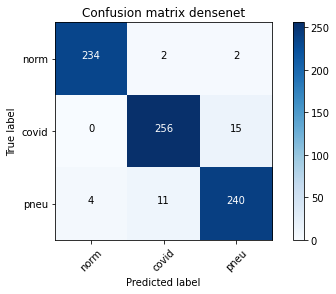

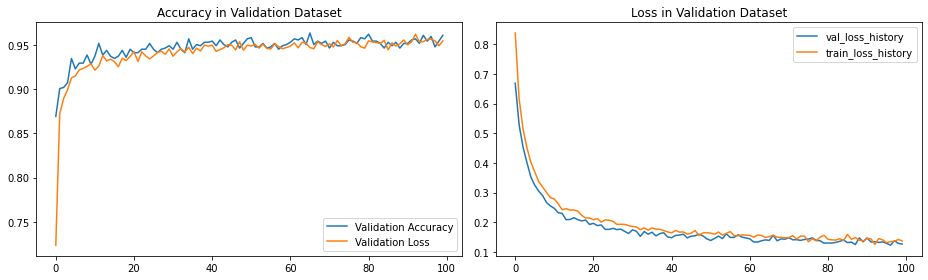


==== END ====
[[234   2   2]
 [  1 255  15]
 [  1   9 245]]

Sensitivity or recall total
0.9607329842931938

Sensitivity or recall per classes
[0.98 0.94 0.96]

Precision
[0.99 0.96 0.94]

F1 Score
[0.99 0.95 0.95]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9857 Acc: 0.5522
val Loss: 0.8179 Acc: 0.7448

Epoch 1/99
----------
train Loss: 0.7221 Acc: 0.8320
val Loss: 0.6232 Acc: 0.8613

Epoch 2/99
----------
train Loss: 0.5855 Acc: 0.8818
val Loss: 0.5148 Acc: 0.9058

Epoch 3/99
----------
train Loss: 0.4987 Acc: 0.8988
val Loss: 0.4527 Acc: 0.9110

Epoch 4/99
----------
train Loss: 0.4472 Acc: 0.9066
val Loss: 0.4064 Acc: 0.9123

Epoch 5/99
----------
train Loss: 0.4056 Acc: 0.9109
val Loss: 0.3718 Acc: 0.9241



train Loss: 0.1675 Acc: 0.9486
val Loss: 0.1493 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1743 Acc: 0.9440
val Loss: 0.1579 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1616 Acc: 0.9486
val Loss: 0.1575 Acc: 0.9450

Epoch 94/99
----------
train Loss: 0.1603 Acc: 0.9443
val Loss: 0.1446 Acc: 0.9450

Epoch 95/99
----------
train Loss: 0.1639 Acc: 0.9446
val Loss: 0.1530 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1657 Acc: 0.9446
val Loss: 0.1380 Acc: 0.9568

Epoch 97/99
----------
train Loss: 0.1649 Acc: 0.9414
val Loss: 0.1435 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1580 Acc: 0.9476
val Loss: 0.1565 Acc: 0.9542

Epoch 99/99
----------
train Loss: 0.1599 Acc: 0.9489
val Loss: 0.1504 Acc: 0.9542


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 9s
Best val Acc: 0.959424
##############################


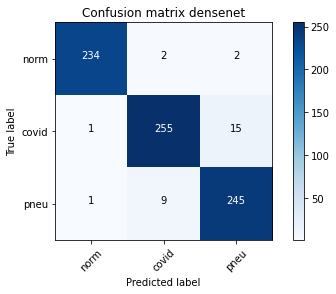

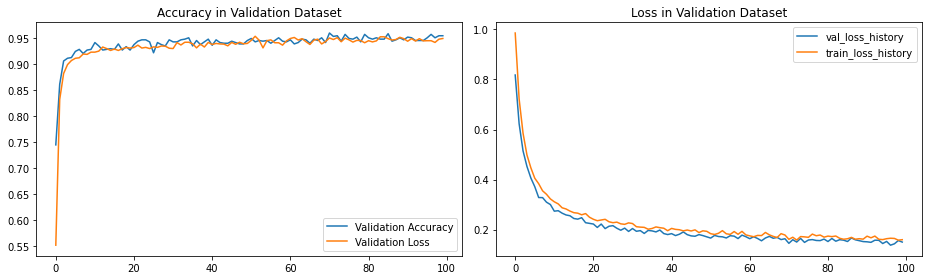


==== END ====
[[234   2   2]
 [  1 256  14]
 [  2  19 234]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.98 0.94 0.92]

Precision
[0.99 0.92 0.94]

F1 Score
[0.99 0.93 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0267 Acc: 0.4707
val Loss: 0.8752 Acc: 0.6741

Epoch 1/99
----------
train Loss: 0.7746 Acc: 0.7756
val Loss: 0.6663 Acc: 0.8613

Epoch 2/99
----------
train Loss: 0.6215 Acc: 0.8592
val Loss: 0.5706 Acc: 0.8678

Epoch 3/99
----------
train Loss: 0.5349 Acc: 0.8834
val Loss: 0.4759 Acc: 0.9058

Epoch 4/99
----------
train Loss: 0.4767 Acc: 0.8988
val Loss: 0.4285 Acc: 0.9018

Epoch 5/99
----------
train Loss: 0.4274 Acc: 0.9004
val Loss: 0.3792 Acc: 0.9215



train Loss: 0.1471 Acc: 0.9499
val Loss: 0.1261 Acc: 0.9607

Epoch 92/99
----------
train Loss: 0.1478 Acc: 0.9479
val Loss: 0.1427 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.1431 Acc: 0.9443
val Loss: 0.1417 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1393 Acc: 0.9519
val Loss: 0.1443 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1339 Acc: 0.9548
val Loss: 0.1406 Acc: 0.9581

Epoch 96/99
----------
train Loss: 0.1415 Acc: 0.9499
val Loss: 0.1342 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1366 Acc: 0.9532
val Loss: 0.1340 Acc: 0.9542

Epoch 98/99
----------
train Loss: 0.1432 Acc: 0.9512
val Loss: 0.1299 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.1467 Acc: 0.9469
val Loss: 0.1378 Acc: 0.9555


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 11s
Best val Acc: 0.960733
##############################


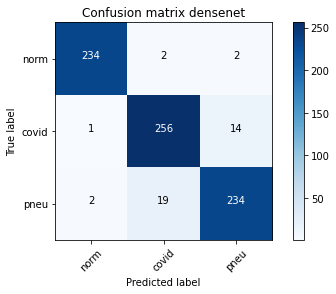

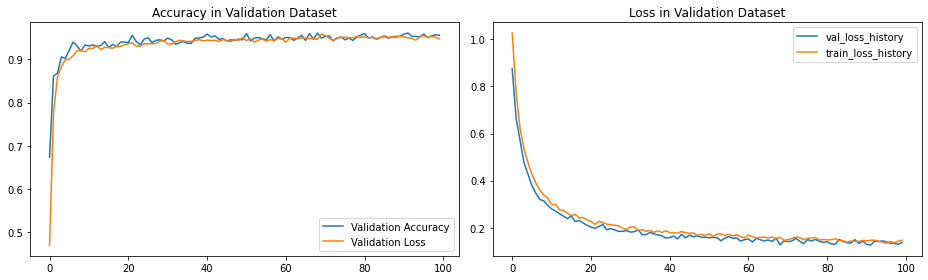


==== END ====
[[233   3   2]
 [  0 258  13]
 [  4  19 232]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.95 0.91]

Precision
[0.98 0.92 0.94]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7657 Acc: 0.7671
val Loss: 0.6182 Acc: 0.8783

Epoch 1/99
----------
train Loss: 0.5699 Acc: 0.8834
val Loss: 0.4974 Acc: 0.9084

Epoch 2/99
----------
train Loss: 0.4762 Acc: 0.9116
val Loss: 0.4341 Acc: 0.9084

Epoch 3/99
----------
train Loss: 0.4265 Acc: 0.9089
val Loss: 0.3869 Acc: 0.9188

Epoch 4/99
----------
train Loss: 0.3823 Acc: 0.9227
val Loss: 0.3396 Acc: 0.9306

Epoch 5/99
----------
train Loss: 0.3504 Acc: 0.9188
val Loss: 0.3340 Acc: 0.9136



train Loss: 0.1394 Acc: 0.9525
val Loss: 0.1223 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1407 Acc: 0.9515
val Loss: 0.1400 Acc: 0.9516

Epoch 93/99
----------
train Loss: 0.1464 Acc: 0.9499
val Loss: 0.1263 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1476 Acc: 0.9496
val Loss: 0.1471 Acc: 0.9529

Epoch 95/99
----------
train Loss: 0.1307 Acc: 0.9564
val Loss: 0.1303 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1421 Acc: 0.9499
val Loss: 0.1321 Acc: 0.9607

Epoch 97/99
----------
train Loss: 0.1336 Acc: 0.9525
val Loss: 0.1353 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1448 Acc: 0.9486
val Loss: 0.1367 Acc: 0.9568

Epoch 99/99
----------
train Loss: 0.1430 Acc: 0.9496
val Loss: 0.1330 Acc: 0.9503


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 9s
Best val Acc: 0.964660
##############################


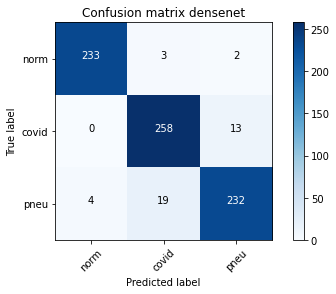

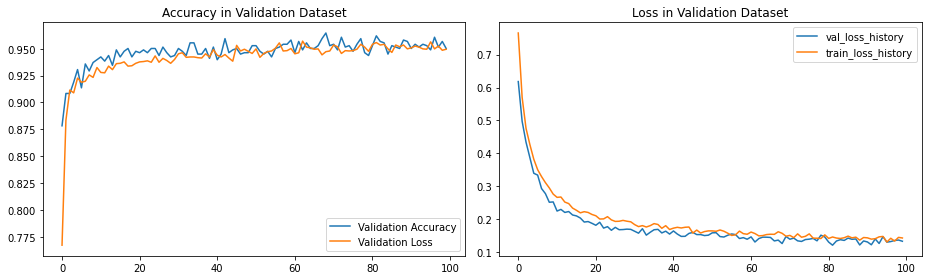


==== END ====
[[235   2   1]
 [  0 260  11]
 [  4  17 234]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.99 0.96 0.92]

Precision
[0.98 0.93 0.95]

F1 Score
[0.99 0.95 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9780 Acc: 0.5594
val Loss: 0.8000 Acc: 0.7932

Epoch 1/99
----------
train Loss: 0.7150 Acc: 0.8493
val Loss: 0.6108 Acc: 0.8835

Epoch 2/99
----------
train Loss: 0.5806 Acc: 0.8850
val Loss: 0.5073 Acc: 0.9071

Epoch 3/99
----------
train Loss: 0.4907 Acc: 0.9053
val Loss: 0.4487 Acc: 0.9149

Epoch 4/99
----------
train Loss: 0.4423 Acc: 0.9122
val Loss: 0.3983 Acc: 0.9136

Epoch 5/99
----------
train Loss: 0.4071 Acc: 0.9103
val Loss: 0.3637 Acc: 0.9175



train Loss: 0.1584 Acc: 0.9515
val Loss: 0.1576 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1628 Acc: 0.9456
val Loss: 0.1403 Acc: 0.9634

Epoch 93/99
----------
train Loss: 0.1705 Acc: 0.9420
val Loss: 0.1522 Acc: 0.9581

Epoch 94/99
----------
train Loss: 0.1623 Acc: 0.9499
val Loss: 0.1438 Acc: 0.9503

Epoch 95/99
----------
train Loss: 0.1620 Acc: 0.9466
val Loss: 0.1496 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1603 Acc: 0.9489
val Loss: 0.1413 Acc: 0.9594

Epoch 97/99
----------
train Loss: 0.1642 Acc: 0.9492
val Loss: 0.1670 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1554 Acc: 0.9489
val Loss: 0.1613 Acc: 0.9437

Epoch 99/99
----------
train Loss: 0.1625 Acc: 0.9499
val Loss: 0.1436 Acc: 0.9555


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 8s
Best val Acc: 0.963351
##############################


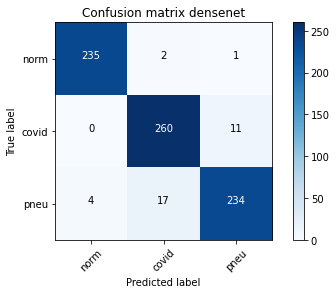

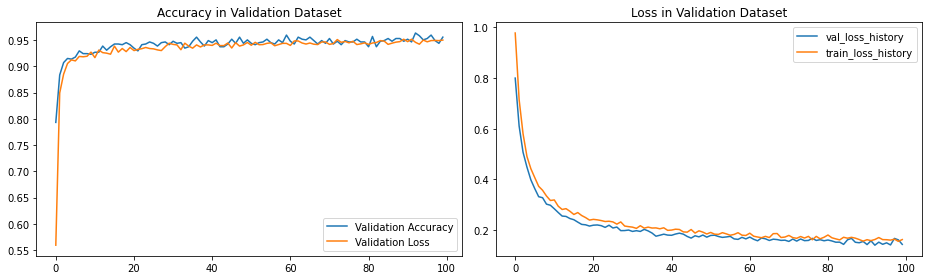


==== END ====
[[235   2   1]
 [  0 259  12]
 [  2  20 233]]

Sensitivity or recall total
0.9515706806282722

Sensitivity or recall per classes
[0.99 0.96 0.91]

Precision
[0.99 0.92 0.95]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9564 Acc: 0.5925
val Loss: 0.8059 Acc: 0.8115

Epoch 1/99
----------
train Loss: 0.7267 Acc: 0.8359
val Loss: 0.6434 Acc: 0.8534

Epoch 2/99
----------
train Loss: 0.5924 Acc: 0.8850
val Loss: 0.5284 Acc: 0.8887

Epoch 3/99
----------
train Loss: 0.5109 Acc: 0.8978
val Loss: 0.4577 Acc: 0.9071

Epoch 4/99
----------
train Loss: 0.4511 Acc: 0.9086
val Loss: 0.4048 Acc: 0.9149

Epoch 5/99
----------
train Loss: 0.4075 Acc: 0.9132
val Loss: 0.3646 Acc: 0.9280



train Loss: 0.1405 Acc: 0.9519
val Loss: 0.1386 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1393 Acc: 0.9525
val Loss: 0.1495 Acc: 0.9516

Epoch 93/99
----------
train Loss: 0.1420 Acc: 0.9538
val Loss: 0.1365 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1402 Acc: 0.9519
val Loss: 0.1350 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1387 Acc: 0.9535
val Loss: 0.1234 Acc: 0.9568

Epoch 96/99
----------
train Loss: 0.1427 Acc: 0.9525
val Loss: 0.1381 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1489 Acc: 0.9509
val Loss: 0.1382 Acc: 0.9581

Epoch 98/99
----------
train Loss: 0.1381 Acc: 0.9532
val Loss: 0.1283 Acc: 0.9581

Epoch 99/99
----------
train Loss: 0.1360 Acc: 0.9528
val Loss: 0.1252 Acc: 0.9607


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 10s
Best val Acc: 0.963351
##############################


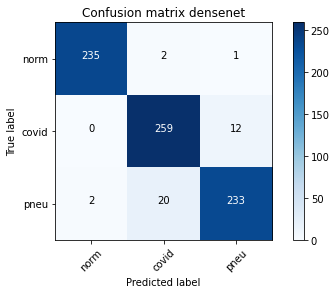

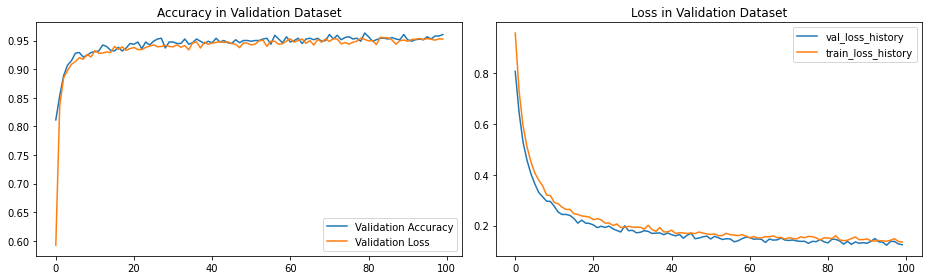


==== END ====
[[231   2   5]
 [  0 256  15]
 [  0  15 240]]

Sensitivity or recall total
0.9515706806282722

Sensitivity or recall per classes
[0.97 0.94 0.94]

Precision
[1.   0.94 0.92]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8170 Acc: 0.7042
val Loss: 0.6720 Acc: 0.8364

Epoch 1/99
----------
train Loss: 0.6135 Acc: 0.8559
val Loss: 0.5337 Acc: 0.8927

Epoch 2/99
----------
train Loss: 0.5143 Acc: 0.8877
val Loss: 0.4582 Acc: 0.9071

Epoch 3/99
----------
train Loss: 0.4442 Acc: 0.9066
val Loss: 0.4015 Acc: 0.9071

Epoch 4/99
----------
train Loss: 0.4069 Acc: 0.9063
val Loss: 0.3577 Acc: 0.9188

Epoch 5/99
----------
train Loss: 0.3716 Acc: 0.9139
val Loss: 0.3353 Acc: 0.9136



train Loss: 0.1516 Acc: 0.9473
val Loss: 0.1558 Acc: 0.9529

Epoch 92/99
----------
train Loss: 0.1467 Acc: 0.9505
val Loss: 0.1352 Acc: 0.9568

Epoch 93/99
----------
train Loss: 0.1414 Acc: 0.9512
val Loss: 0.1414 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1481 Acc: 0.9519
val Loss: 0.1332 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1353 Acc: 0.9561
val Loss: 0.1483 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1358 Acc: 0.9551
val Loss: 0.1429 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1364 Acc: 0.9545
val Loss: 0.1320 Acc: 0.9437

Epoch 98/99
----------
train Loss: 0.1422 Acc: 0.9509
val Loss: 0.1305 Acc: 0.9555

Epoch 99/99
----------
train Loss: 0.1380 Acc: 0.9545
val Loss: 0.1241 Acc: 0.9607


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 15s
Best val Acc: 0.960733
##############################


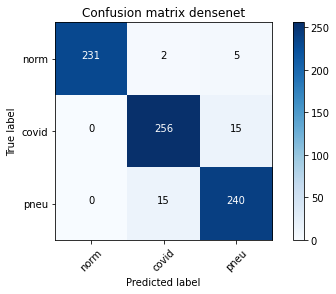

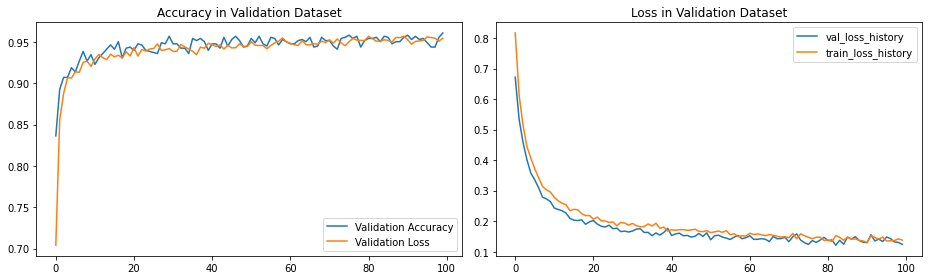


==== END ====
[[234   3   1]
 [  1 258  12]
 [  3  12 240]]

Sensitivity or recall total
0.9581151832460733

Sensitivity or recall per classes
[0.98 0.95 0.94]

Precision
[0.98 0.95 0.95]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1258 Acc: 0.3190
val Loss: 1.0864 Acc: 0.3482

Epoch 1/99
----------
train Loss: 1.0620 Acc: 0.4140
val Loss: 1.0423 Acc: 0.4175

Epoch 2/99
----------
train Loss: 1.0230 Acc: 0.4844
val Loss: 1.0015 Acc: 0.5236

Epoch 3/99
----------
train Loss: 0.9861 Acc: 0.5719
val Loss: 0.9595 Acc: 0.6126

Epoch 4/99
----------
train Loss: 0.9461 Acc: 0.6243
val Loss: 0.9275 Acc: 0.6558

Epoch 5/99
----------
train Loss: 0.9196 Acc: 0.6666
val Loss: 0.8943 Acc: 0.7186

Ep

train Loss: 0.3301 Acc: 0.9240
val Loss: 0.3100 Acc: 0.9372

Epoch 92/99
----------
train Loss: 0.3268 Acc: 0.9214
val Loss: 0.3012 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.3234 Acc: 0.9220
val Loss: 0.3045 Acc: 0.9280

Epoch 94/99
----------
train Loss: 0.3212 Acc: 0.9263
val Loss: 0.3051 Acc: 0.9385

Epoch 95/99
----------
train Loss: 0.3339 Acc: 0.9181
val Loss: 0.2959 Acc: 0.9359

Epoch 96/99
----------
train Loss: 0.3230 Acc: 0.9201
val Loss: 0.2920 Acc: 0.9228

Epoch 97/99
----------
train Loss: 0.3201 Acc: 0.9207
val Loss: 0.2955 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.3223 Acc: 0.9207
val Loss: 0.3027 Acc: 0.9280

Epoch 99/99
----------
train Loss: 0.3137 Acc: 0.9250
val Loss: 0.2985 Acc: 0.9293


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 14s
Best val Acc: 0.939791
##############################


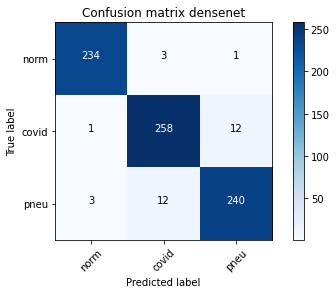

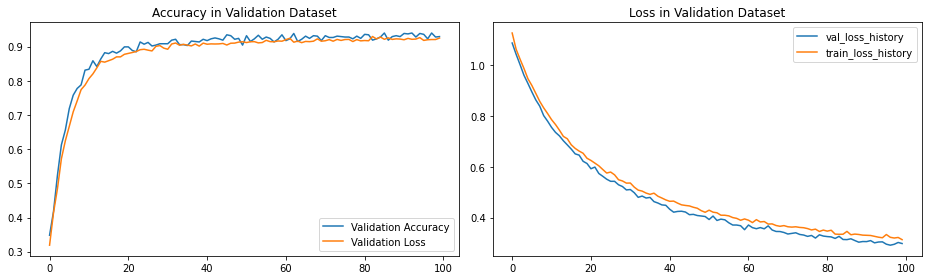


==== END ====
[[228   2   8]
 [  1 257  13]
 [  4  21 230]]

Sensitivity or recall total
0.9358638743455497

Sensitivity or recall per classes
[0.96 0.95 0.9 ]

Precision
[0.98 0.92 0.92]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1188 Acc: 0.3318
val Loss: 1.0980 Acc: 0.3730

Epoch 1/99
----------
train Loss: 1.0779 Acc: 0.4022
val Loss: 1.0527 Acc: 0.4634

Epoch 2/99
----------
train Loss: 1.0423 Acc: 0.4782
val Loss: 1.0304 Acc: 0.4948

Epoch 3/99
----------
train Loss: 1.0057 Acc: 0.5339
val Loss: 1.0015 Acc: 0.5353

Epoch 4/99
----------
train Loss: 0.9801 Acc: 0.5798
val Loss: 0.9706 Acc: 0.6073

Epoch 5/99
----------
train Loss: 0.9507 Acc: 0.6204
val Loss: 0.9310 Acc: 0.6597

Ep

train Loss: 0.3033 Acc: 0.9296
val Loss: 0.2904 Acc: 0.9254

Epoch 92/99
----------
train Loss: 0.2923 Acc: 0.9315
val Loss: 0.2734 Acc: 0.9372

Epoch 93/99
----------
train Loss: 0.3008 Acc: 0.9292
val Loss: 0.2864 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.2944 Acc: 0.9240
val Loss: 0.2818 Acc: 0.9280

Epoch 95/99
----------
train Loss: 0.2872 Acc: 0.9338
val Loss: 0.2761 Acc: 0.9202

Epoch 96/99
----------
train Loss: 0.2909 Acc: 0.9299
val Loss: 0.2737 Acc: 0.9372

Epoch 97/99
----------
train Loss: 0.2946 Acc: 0.9240
val Loss: 0.2843 Acc: 0.9359

Epoch 98/99
----------
train Loss: 0.2844 Acc: 0.9325
val Loss: 0.2673 Acc: 0.9385

Epoch 99/99
----------
train Loss: 0.2877 Acc: 0.9260
val Loss: 0.2732 Acc: 0.9280


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 17s
Best val Acc: 0.938482
##############################


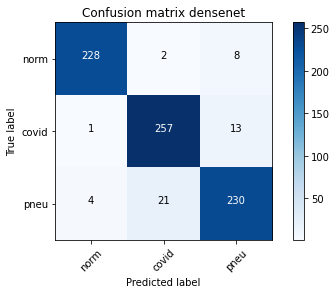

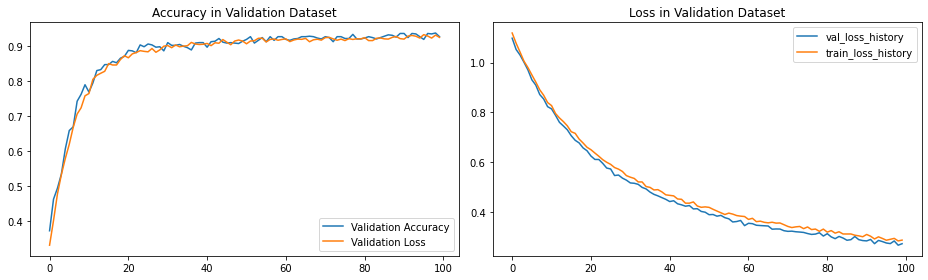


==== END ====
[[233   2   3]
 [  5 249  17]
 [  5  19 231]]

Sensitivity or recall total
0.9332460732984293

Sensitivity or recall per classes
[0.98 0.92 0.91]

Precision
[0.96 0.92 0.92]

F1 Score
[0.97 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1511 Acc: 0.3452
val Loss: 1.1343 Acc: 0.3312

Epoch 1/99
----------
train Loss: 1.0840 Acc: 0.3839
val Loss: 1.0797 Acc: 0.3914

Epoch 2/99
----------
train Loss: 1.0443 Acc: 0.4451
val Loss: 1.0417 Acc: 0.4542

Epoch 3/99
----------
train Loss: 1.0079 Acc: 0.5142
val Loss: 1.0176 Acc: 0.5026

Epoch 4/99
----------
train Loss: 0.9803 Acc: 0.5536
val Loss: 0.9778 Acc: 0.5733

Epoch 5/99
----------
train Loss: 0.9499 Acc: 0.6148
val Loss: 0.9307 Acc: 0.6479

Ep

train Loss: 0.2819 Acc: 0.9358
val Loss: 0.2688 Acc: 0.9385

Epoch 92/99
----------
train Loss: 0.2864 Acc: 0.9329
val Loss: 0.2618 Acc: 0.9385

Epoch 93/99
----------
train Loss: 0.2842 Acc: 0.9276
val Loss: 0.2645 Acc: 0.9319

Epoch 94/99
----------
train Loss: 0.2878 Acc: 0.9247
val Loss: 0.2550 Acc: 0.9411

Epoch 95/99
----------
train Loss: 0.2728 Acc: 0.9361
val Loss: 0.2622 Acc: 0.9306

Epoch 96/99
----------
train Loss: 0.2756 Acc: 0.9358
val Loss: 0.2495 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.2795 Acc: 0.9325
val Loss: 0.2598 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.2781 Acc: 0.9365
val Loss: 0.2620 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.2770 Acc: 0.9306
val Loss: 0.2612 Acc: 0.9241


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.948953
##############################


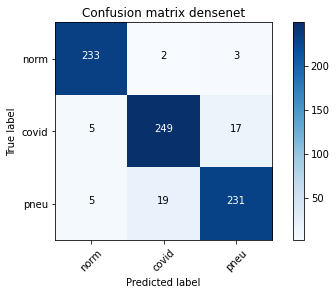

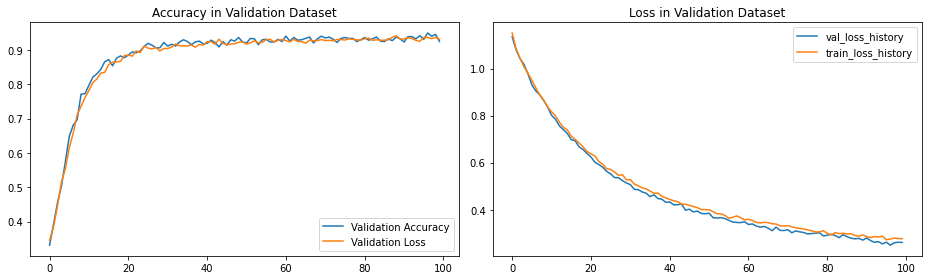


==== END ====
[[233   3   2]
 [  2 248  21]
 [  4  19 232]]

Sensitivity or recall total
0.9332460732984293

Sensitivity or recall per classes
[0.98 0.92 0.91]

Precision
[0.97 0.92 0.91]

F1 Score
[0.98 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1195 Acc: 0.3387
val Loss: 1.0927 Acc: 0.3848

Epoch 1/99
----------
train Loss: 1.0748 Acc: 0.4111
val Loss: 1.0517 Acc: 0.4503

Epoch 2/99
----------
train Loss: 1.0359 Acc: 0.4785
val Loss: 1.0235 Acc: 0.4882

Epoch 3/99
----------
train Loss: 0.9926 Acc: 0.5470
val Loss: 0.9732 Acc: 0.5942

Epoch 4/99
----------
train Loss: 0.9549 Acc: 0.6109
val Loss: 0.9367 Acc: 0.6466

Epoch 5/99
----------
train Loss: 0.9221 Acc: 0.6623
val Loss: 0.9035 Acc: 0.6715

E

train Loss: 0.3326 Acc: 0.9256
val Loss: 0.3081 Acc: 0.9319

Epoch 92/99
----------
train Loss: 0.3256 Acc: 0.9207
val Loss: 0.3078 Acc: 0.9332

Epoch 93/99
----------
train Loss: 0.3265 Acc: 0.9260
val Loss: 0.3029 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.3230 Acc: 0.9286
val Loss: 0.2975 Acc: 0.9228

Epoch 95/99
----------
train Loss: 0.3179 Acc: 0.9276
val Loss: 0.3049 Acc: 0.9306

Epoch 96/99
----------
train Loss: 0.3169 Acc: 0.9247
val Loss: 0.3054 Acc: 0.9280

Epoch 97/99
----------
train Loss: 0.3216 Acc: 0.9224
val Loss: 0.2913 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.3211 Acc: 0.9188
val Loss: 0.3001 Acc: 0.9398

Epoch 99/99
----------
train Loss: 0.3234 Acc: 0.9194
val Loss: 0.2961 Acc: 0.9332


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 22s
Best val Acc: 0.942408
##############################


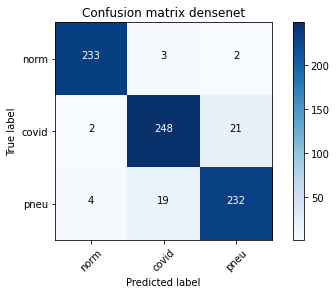

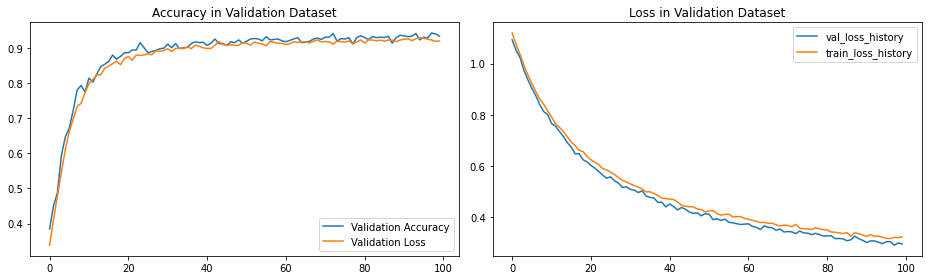


==== END ====
[[229   2   7]
 [  2 253  16]
 [  4  25 226]]

Sensitivity or recall total
0.9267015706806283

Sensitivity or recall per classes
[0.96 0.93 0.89]

Precision
[0.97 0.9  0.91]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0907 Acc: 0.3891
val Loss: 1.0731 Acc: 0.4202

Epoch 1/99
----------
train Loss: 1.0521 Acc: 0.4366
val Loss: 1.0381 Acc: 0.4581

Epoch 2/99
----------
train Loss: 1.0219 Acc: 0.4808
val Loss: 1.0010 Acc: 0.5249

Epoch 3/99
----------
train Loss: 0.9846 Acc: 0.5627
val Loss: 0.9702 Acc: 0.5668

Epoch 4/99
----------
train Loss: 0.9582 Acc: 0.5850
val Loss: 0.9469 Acc: 0.6008

Epoch 5/99
----------
train Loss: 0.9315 Acc: 0.6407
val Loss: 0.9004 Acc: 0.6976

E

train Loss: 0.3038 Acc: 0.9201
val Loss: 0.2776 Acc: 0.9306

Epoch 92/99
----------
train Loss: 0.3034 Acc: 0.9198
val Loss: 0.2844 Acc: 0.9319

Epoch 93/99
----------
train Loss: 0.3025 Acc: 0.9237
val Loss: 0.2679 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.2950 Acc: 0.9230
val Loss: 0.2628 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.2848 Acc: 0.9312
val Loss: 0.2682 Acc: 0.9385

Epoch 96/99
----------
train Loss: 0.2905 Acc: 0.9309
val Loss: 0.2784 Acc: 0.9241

Epoch 97/99
----------
train Loss: 0.2862 Acc: 0.9315
val Loss: 0.2633 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.2852 Acc: 0.9240
val Loss: 0.2675 Acc: 0.9332

Epoch 99/99
----------
train Loss: 0.2877 Acc: 0.9279
val Loss: 0.2655 Acc: 0.9346


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.945026
##############################


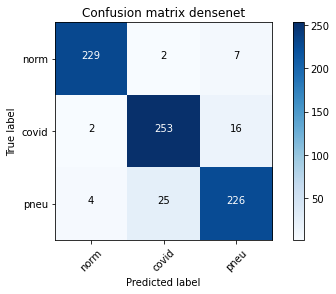

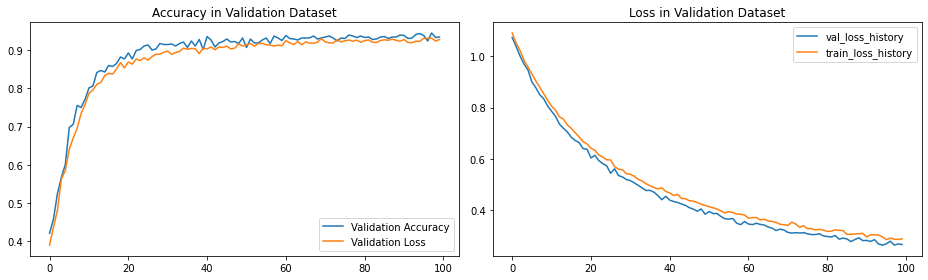


==== END ====
[[230   3   5]
 [  1 252  18]
 [  1  26 228]]

Sensitivity or recall total
0.9293193717277487

Sensitivity or recall per classes
[0.97 0.93 0.89]

Precision
[0.99 0.9  0.91]

F1 Score
[0.98 0.91 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1092 Acc: 0.3786
val Loss: 1.0704 Acc: 0.4398

Epoch 1/99
----------
train Loss: 1.0535 Acc: 0.4383
val Loss: 1.0409 Acc: 0.4568

Epoch 2/99
----------
train Loss: 1.0167 Acc: 0.5090
val Loss: 0.9930 Acc: 0.5366

Epoch 3/99
----------
train Loss: 0.9925 Acc: 0.5411
val Loss: 0.9633 Acc: 0.5877

Epoch 4/99
----------
train Loss: 0.9606 Acc: 0.5794
val Loss: 0.9371 Acc: 0.6099

Epoch 5/99
----------
train Loss: 0.9343 Acc: 0.6204
val Loss: 0.9110 Acc: 0.6702

E

train Loss: 0.3009 Acc: 0.9214
val Loss: 0.2770 Acc: 0.9359

Epoch 92/99
----------
train Loss: 0.3041 Acc: 0.9194
val Loss: 0.2687 Acc: 0.9280

Epoch 93/99
----------
train Loss: 0.2934 Acc: 0.9273
val Loss: 0.2672 Acc: 0.9385

Epoch 94/99
----------
train Loss: 0.2950 Acc: 0.9256
val Loss: 0.2765 Acc: 0.9293

Epoch 95/99
----------
train Loss: 0.2842 Acc: 0.9289
val Loss: 0.2562 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.2900 Acc: 0.9230
val Loss: 0.2758 Acc: 0.9254

Epoch 97/99
----------
train Loss: 0.2877 Acc: 0.9256
val Loss: 0.2648 Acc: 0.9385

Epoch 98/99
----------
train Loss: 0.2860 Acc: 0.9247
val Loss: 0.2573 Acc: 0.9359

Epoch 99/99
----------
train Loss: 0.2821 Acc: 0.9342
val Loss: 0.2612 Acc: 0.9280


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 25s
Best val Acc: 0.950262
##############################


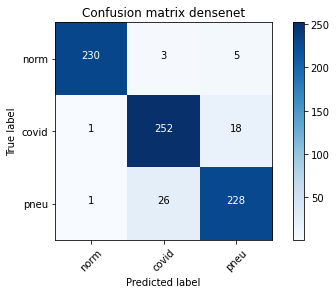

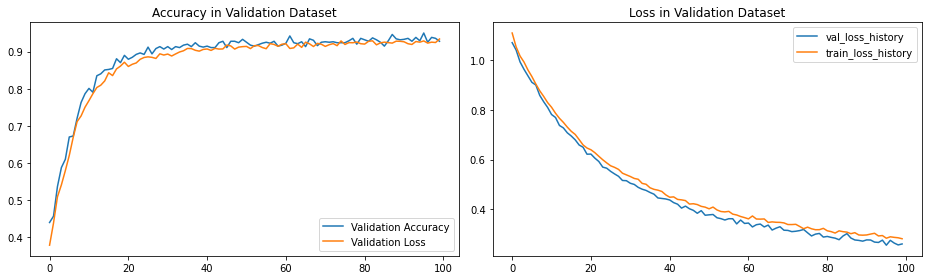


==== END ====
[[230   3   5]
 [  3 251  17]
 [  6  25 224]]

Sensitivity or recall total
0.9227748691099477

Sensitivity or recall per classes
[0.97 0.93 0.88]

Precision
[0.96 0.9  0.91]

F1 Score
[0.96 0.91 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1140 Acc: 0.3521
val Loss: 1.0783 Acc: 0.3835

Epoch 1/99
----------
train Loss: 1.0524 Acc: 0.4389
val Loss: 1.0342 Acc: 0.4581

Epoch 2/99
----------
train Loss: 1.0095 Acc: 0.4959
val Loss: 0.9892 Acc: 0.5065

Epoch 3/99
----------
train Loss: 0.9735 Acc: 0.5696
val Loss: 0.9552 Acc: 0.5720

Epoch 4/99
----------
train Loss: 0.9453 Acc: 0.6037
val Loss: 0.9192 Acc: 0.6518

Epoch 5/99
----------
train Loss: 0.9085 Acc: 0.6538
val Loss: 0.8791 Acc: 0.6911

E

train Loss: 0.3258 Acc: 0.9263
val Loss: 0.3151 Acc: 0.9228

Epoch 92/99
----------
train Loss: 0.3247 Acc: 0.9198
val Loss: 0.2987 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.3283 Acc: 0.9256
val Loss: 0.3086 Acc: 0.9319

Epoch 94/99
----------
train Loss: 0.3220 Acc: 0.9224
val Loss: 0.3023 Acc: 0.9293

Epoch 95/99
----------
train Loss: 0.3255 Acc: 0.9217
val Loss: 0.3015 Acc: 0.9280

Epoch 96/99
----------
train Loss: 0.3241 Acc: 0.9234
val Loss: 0.2937 Acc: 0.9332

Epoch 97/99
----------
train Loss: 0.3201 Acc: 0.9230
val Loss: 0.3015 Acc: 0.9319

Epoch 98/99
----------
train Loss: 0.3224 Acc: 0.9211
val Loss: 0.3021 Acc: 0.9359

Epoch 99/99
----------
train Loss: 0.3127 Acc: 0.9243
val Loss: 0.2897 Acc: 0.9359


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.941099
##############################


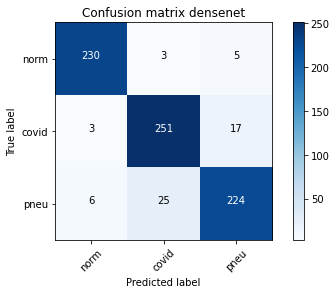

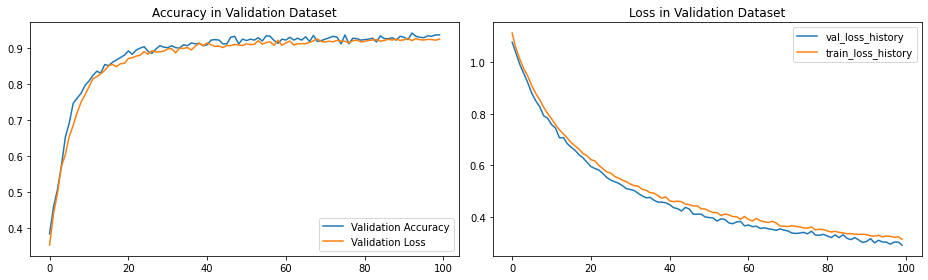


==== END ====
[[232   3   3]
 [  3 251  17]
 [  5  23 227]]

Sensitivity or recall total
0.9293193717277487

Sensitivity or recall per classes
[0.97 0.93 0.89]

Precision
[0.97 0.91 0.92]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1085 Acc: 0.4202
val Loss: 1.0816 Acc: 0.4058

Epoch 1/99
----------
train Loss: 1.0592 Acc: 0.4219
val Loss: 1.0448 Acc: 0.4385

Epoch 2/99
----------
train Loss: 1.0274 Acc: 0.4713
val Loss: 1.0088 Acc: 0.4673

Epoch 3/99
----------
train Loss: 0.9995 Acc: 0.5080
val Loss: 0.9763 Acc: 0.5393

Epoch 4/99
----------
train Loss: 0.9695 Acc: 0.5575
val Loss: 0.9400 Acc: 0.6217

Epoch 5/99
----------
train Loss: 0.9419 Acc: 0.5870
val Loss: 0.9116 Acc: 0.6545

E

train Loss: 0.3027 Acc: 0.9296
val Loss: 0.2792 Acc: 0.9359

Epoch 92/99
----------
train Loss: 0.3009 Acc: 0.9279
val Loss: 0.2781 Acc: 0.9372

Epoch 93/99
----------
train Loss: 0.3041 Acc: 0.9178
val Loss: 0.2726 Acc: 0.9306

Epoch 94/99
----------
train Loss: 0.2948 Acc: 0.9309
val Loss: 0.2769 Acc: 0.9280

Epoch 95/99
----------
train Loss: 0.2971 Acc: 0.9217
val Loss: 0.2649 Acc: 0.9359

Epoch 96/99
----------
train Loss: 0.2952 Acc: 0.9253
val Loss: 0.2723 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.2991 Acc: 0.9266
val Loss: 0.2697 Acc: 0.9293

Epoch 98/99
----------
train Loss: 0.2916 Acc: 0.9256
val Loss: 0.2683 Acc: 0.9424

Epoch 99/99
----------
train Loss: 0.2925 Acc: 0.9335
val Loss: 0.2622 Acc: 0.9346


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 26s
Best val Acc: 0.943717
##############################


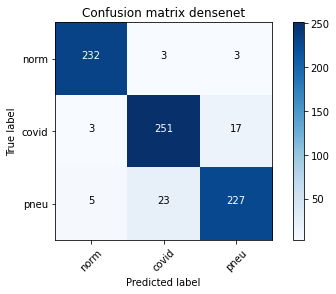

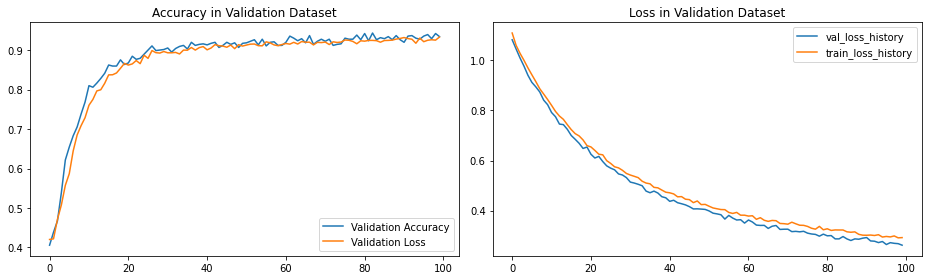


==== END ====
[[232   3   3]
 [  3 253  15]
 [  5  28 222]]

Sensitivity or recall total
0.925392670157068

Sensitivity or recall per classes
[0.97 0.93 0.87]

Precision
[0.97 0.89 0.93]

F1 Score
[0.97 0.91 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.weight
	 classifier.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1416 Acc: 0.3462
val Loss: 1.1155 Acc: 0.3796

Epoch 1/99
----------
train Loss: 1.0889 Acc: 0.4006
val Loss: 1.0796 Acc: 0.4175

Epoch 2/99
----------
train Loss: 1.0509 Acc: 0.4553
val Loss: 1.0241 Acc: 0.4817

Epoch 3/99
----------
train Loss: 1.0216 Acc: 0.5064
val Loss: 0.9959 Acc: 0.5393

Epoch 4/99
----------
train Loss: 0.9810 Acc: 0.5693
val Loss: 0.9717 Acc: 0.5929

Epoch 5/99
----------
train Loss: 0.9579 Acc: 0.6066
val Loss: 0.9364 Acc: 0.6309

Ep

train Loss: 0.2930 Acc: 0.9247
val Loss: 0.2672 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.3003 Acc: 0.9207
val Loss: 0.2589 Acc: 0.9529

Epoch 93/99
----------
train Loss: 0.2903 Acc: 0.9253
val Loss: 0.2695 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.2922 Acc: 0.9283
val Loss: 0.2623 Acc: 0.9372

Epoch 95/99
----------
train Loss: 0.2893 Acc: 0.9256
val Loss: 0.2737 Acc: 0.9202

Epoch 96/99
----------
train Loss: 0.2829 Acc: 0.9273
val Loss: 0.2684 Acc: 0.9280

Epoch 97/99
----------
train Loss: 0.2853 Acc: 0.9286
val Loss: 0.2753 Acc: 0.9385

Epoch 98/99
----------
train Loss: 0.2814 Acc: 0.9273
val Loss: 0.2608 Acc: 0.9346

Epoch 99/99
----------
train Loss: 0.2813 Acc: 0.9315
val Loss: 0.2632 Acc: 0.9450


##############################
------ Summary ------
model -> densenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 26s
Best val Acc: 0.952880
##############################


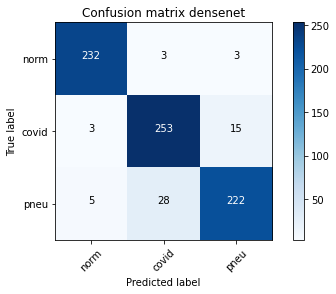

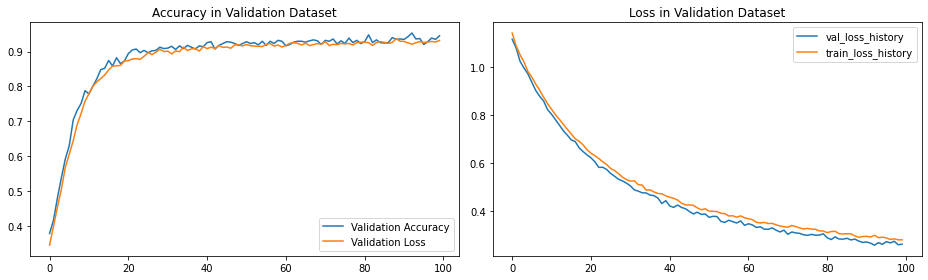


==== END ====
[[232   2   4]
 [  2 248  21]
 [  6  19 230]]

Sensitivity or recall total
0.9293193717277487

Sensitivity or recall per classes
[0.97 0.92 0.9 ]

Precision
[0.97 0.92 0.9 ]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5501 Acc: 0.8038
val Loss: 0.3138 Acc: 0.9084

Epoch 1/99
----------
train Loss: 0.2943 Acc: 0.9129
val Loss: 0.2349 Acc: 0.9332

Epoch 2/99
----------
train Loss: 0.2410 Acc: 0.9253
val Loss: 0.2232 Acc: 0.9332

Epoch 3/99
----------
train Loss: 0.2099 Acc: 0.9401
val Loss: 0.2050 Acc: 0.9319

Epoch 4/99
----------
train Loss: 0.2095 Acc: 0.9279
val Loss: 0.1849 Acc: 0.9385

Epoch 5/99
----------
train Loss: 0.2074 Acc: 0.9270
val Loss: 0.1764 Acc: 0.9411

Epoch 6/99
---------

train Loss: 0.1308 Acc: 0.9499
val Loss: 0.1349 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1239 Acc: 0.9545
val Loss: 0.1440 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1237 Acc: 0.9538
val Loss: 0.1333 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1305 Acc: 0.9515
val Loss: 0.1223 Acc: 0.9594

Epoch 95/99
----------
train Loss: 0.1379 Acc: 0.9505
val Loss: 0.1409 Acc: 0.9424

Epoch 96/99
----------
train Loss: 0.1341 Acc: 0.9551
val Loss: 0.1370 Acc: 0.9555

Epoch 97/99
----------
train Loss: 0.1174 Acc: 0.9551
val Loss: 0.1433 Acc: 0.9463

Epoch 98/99
----------
train Loss: 0.1174 Acc: 0.9574
val Loss: 0.1440 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1355 Acc: 0.9525
val Loss: 0.1349 Acc: 0.9490


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 21s
Best val Acc: 0.959424
##############################


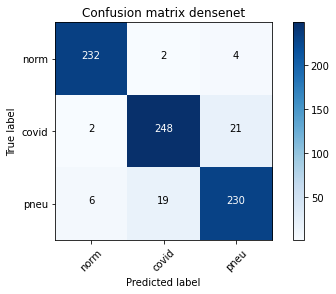

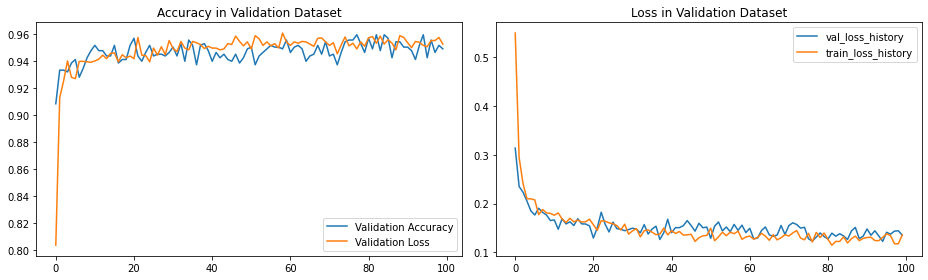


==== END ====
[[231   4   3]
 [  0 257  14]
 [  5  14 236]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.97 0.95 0.93]

Precision
[0.98 0.93 0.93]

F1 Score
[0.97 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5377 Acc: 0.8117
val Loss: 0.3287 Acc: 0.9097

Epoch 1/99
----------
train Loss: 0.2979 Acc: 0.9093
val Loss: 0.2481 Acc: 0.9202

Epoch 2/99
----------
train Loss: 0.2446 Acc: 0.9184
val Loss: 0.2124 Acc: 0.9306

Epoch 3/99
----------
train Loss: 0.2143 Acc: 0.9292
val Loss: 0.2207 Acc: 0.9215

Epoch 4/99
----------
train Loss: 0.2141 Acc: 0.9315
val Loss: 0.1786 Acc: 0.9450

Epoch 5/99
----------
train Loss: 0.1936 Acc: 0.9342
val Loss: 0.2118 Acc: 0.9280

Epoch 6/99
---------

train Loss: 0.1248 Acc: 0.9522
val Loss: 0.1616 Acc: 0.9450

Epoch 92/99
----------
train Loss: 0.1150 Acc: 0.9568
val Loss: 0.1413 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1295 Acc: 0.9522
val Loss: 0.1523 Acc: 0.9463

Epoch 94/99
----------
train Loss: 0.1297 Acc: 0.9558
val Loss: 0.1483 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1314 Acc: 0.9496
val Loss: 0.1585 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1226 Acc: 0.9522
val Loss: 0.1395 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1180 Acc: 0.9577
val Loss: 0.1367 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1190 Acc: 0.9548
val Loss: 0.1569 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1222 Acc: 0.9505
val Loss: 0.1512 Acc: 0.9450


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 17s
Best val Acc: 0.959424
##############################


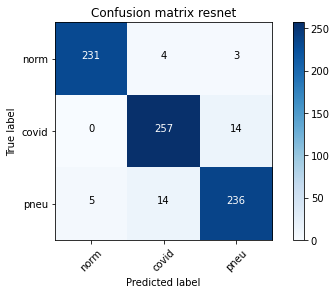

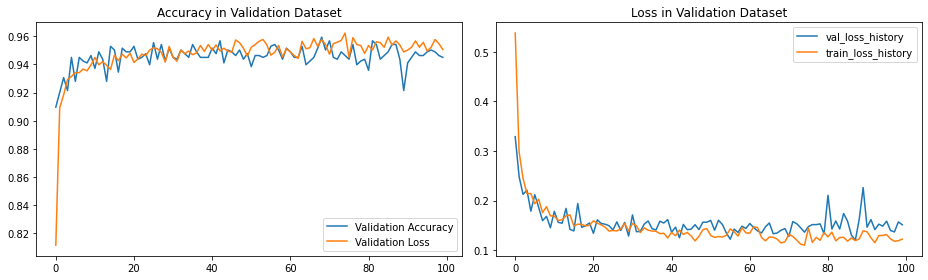


==== END ====
[[229   4   5]
 [  0 262   9]
 [  2  16 237]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.96 0.97 0.93]

Precision
[0.99 0.93 0.94]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4912 Acc: 0.8261
val Loss: 0.2833 Acc: 0.9280

Epoch 1/99
----------
train Loss: 0.2828 Acc: 0.9076
val Loss: 0.2292 Acc: 0.9346

Epoch 2/99
----------
train Loss: 0.2422 Acc: 0.9099
val Loss: 0.1988 Acc: 0.9359

Epoch 3/99
----------
train Loss: 0.2169 Acc: 0.9240
val Loss: 0.1837 Acc: 0.9411

Epoch 4/99
----------
train Loss: 0.1960 Acc: 0.9335
val Loss: 0.1793 Acc: 0.9372

Epoch 5/99
----------
train Loss: 0.1788 Acc: 0.9394
val Loss: 0.1890 Acc: 0.9332

Epoch 6/99
---------

train Loss: 0.1233 Acc: 0.9558
val Loss: 0.2042 Acc: 0.9385

Epoch 92/99
----------
train Loss: 0.1212 Acc: 0.9545
val Loss: 0.1669 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1285 Acc: 0.9482
val Loss: 0.1663 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1319 Acc: 0.9496
val Loss: 0.1571 Acc: 0.9490

Epoch 95/99
----------
train Loss: 0.1339 Acc: 0.9509
val Loss: 0.1556 Acc: 0.9555

Epoch 96/99
----------
train Loss: 0.1267 Acc: 0.9528
val Loss: 0.1578 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1227 Acc: 0.9515
val Loss: 0.1922 Acc: 0.9293

Epoch 98/99
----------
train Loss: 0.1238 Acc: 0.9541
val Loss: 0.2040 Acc: 0.9215

Epoch 99/99
----------
train Loss: 0.1324 Acc: 0.9522
val Loss: 0.1707 Acc: 0.9411


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 15s
Best val Acc: 0.956806
##############################


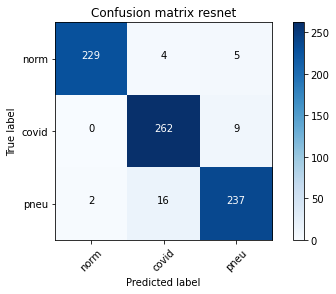

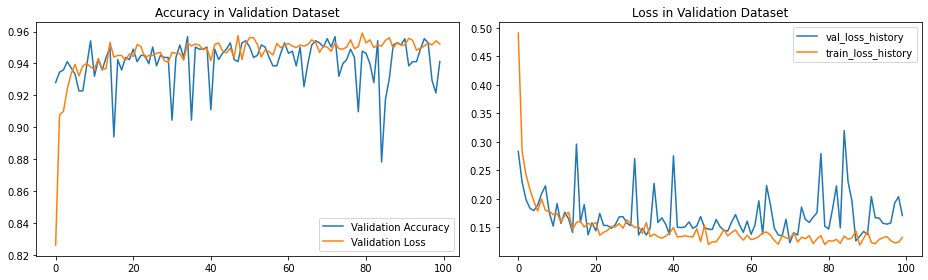


==== END ====
[[231   2   5]
 [  0 253  18]
 [  5  13 237]]

Sensitivity or recall total
0.943717277486911

Sensitivity or recall per classes
[0.97 0.93 0.93]

Precision
[0.98 0.94 0.91]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5464 Acc: 0.7966
val Loss: 0.3137 Acc: 0.9084

Epoch 1/99
----------
train Loss: 0.2812 Acc: 0.9161
val Loss: 0.2331 Acc: 0.9346

Epoch 2/99
----------
train Loss: 0.2513 Acc: 0.9175
val Loss: 0.2153 Acc: 0.9319

Epoch 3/99
----------
train Loss: 0.2170 Acc: 0.9306
val Loss: 0.2066 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.2011 Acc: 0.9404
val Loss: 0.1898 Acc: 0.9293

Epoch 5/99
----------
train Loss: 0.1971 Acc: 0.9378
val Loss: 0.1820 Acc: 0.9346

Epoch 6/99
---------

train Loss: 0.1347 Acc: 0.9482
val Loss: 0.1391 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1264 Acc: 0.9571
val Loss: 0.1446 Acc: 0.9437

Epoch 93/99
----------
train Loss: 0.1290 Acc: 0.9551
val Loss: 0.1541 Acc: 0.9398

Epoch 94/99
----------
train Loss: 0.1220 Acc: 0.9568
val Loss: 0.1542 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1288 Acc: 0.9587
val Loss: 0.1388 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1288 Acc: 0.9571
val Loss: 0.1605 Acc: 0.9424

Epoch 97/99
----------
train Loss: 0.1203 Acc: 0.9555
val Loss: 0.1428 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1343 Acc: 0.9525
val Loss: 0.1412 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1199 Acc: 0.9574
val Loss: 0.1464 Acc: 0.9490


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 21s
Best val Acc: 0.963351
##############################


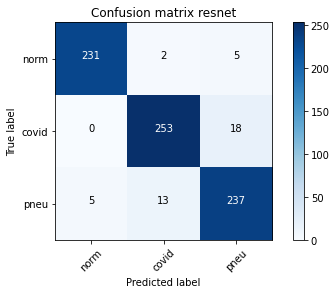

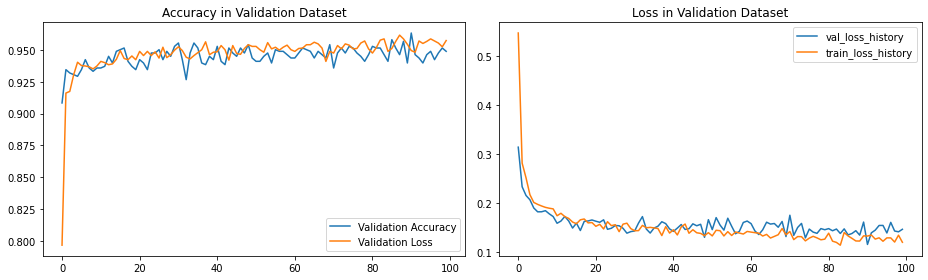


==== END ====
[[232   3   3]
 [  1 257  13]
 [  5  10 240]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.97 0.95 0.94]

Precision
[0.97 0.95 0.94]

F1 Score
[0.97 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5526 Acc: 0.8110
val Loss: 0.3411 Acc: 0.9005

Epoch 1/99
----------
train Loss: 0.2939 Acc: 0.9096
val Loss: 0.2399 Acc: 0.9162

Epoch 2/99
----------
train Loss: 0.2381 Acc: 0.9237
val Loss: 0.2124 Acc: 0.9293

Epoch 3/99
----------
train Loss: 0.2334 Acc: 0.9214
val Loss: 0.2121 Acc: 0.9254

Epoch 4/99
----------
train Loss: 0.2048 Acc: 0.9302
val Loss: 0.1808 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.1863 Acc: 0.9361
val Loss: 0.1812 Acc: 0.9372

Epoch 6/99
--------

train Loss: 0.1281 Acc: 0.9535
val Loss: 0.1416 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1264 Acc: 0.9509
val Loss: 0.1330 Acc: 0.9476

Epoch 93/99
----------
train Loss: 0.1250 Acc: 0.9551
val Loss: 0.1465 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1258 Acc: 0.9555
val Loss: 0.1811 Acc: 0.9346

Epoch 95/99
----------
train Loss: 0.1139 Acc: 0.9574
val Loss: 0.1611 Acc: 0.9437

Epoch 96/99
----------
train Loss: 0.1304 Acc: 0.9525
val Loss: 0.1620 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1318 Acc: 0.9515
val Loss: 0.1511 Acc: 0.9529

Epoch 98/99
----------
train Loss: 0.1323 Acc: 0.9551
val Loss: 0.1624 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1069 Acc: 0.9594
val Loss: 0.1599 Acc: 0.9490


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 20s
Best val Acc: 0.959424
##############################


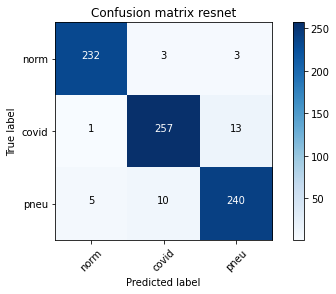

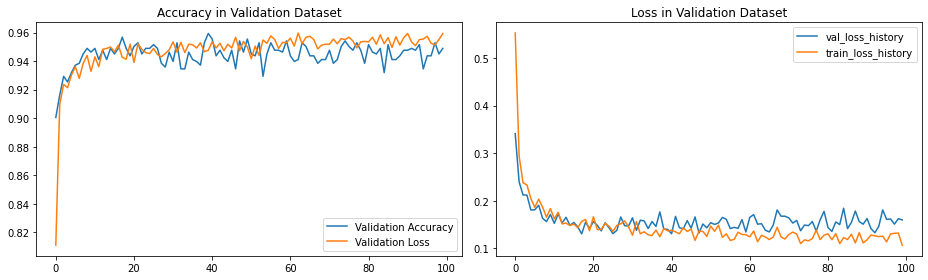


==== END ====
[[230   4   4]
 [  0 264   7]
 [  3  17 235]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.97 0.97 0.92]

Precision
[0.99 0.93 0.96]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5623 Acc: 0.8153
val Loss: 0.4748 Acc: 0.7866

Epoch 1/99
----------
train Loss: 0.2849 Acc: 0.9083
val Loss: 0.2549 Acc: 0.9215

Epoch 2/99
----------
train Loss: 0.2457 Acc: 0.9161
val Loss: 0.2965 Acc: 0.8809

Epoch 3/99
----------
train Loss: 0.2253 Acc: 0.9220
val Loss: 0.1766 Acc: 0.9319

Epoch 4/99
----------
train Loss: 0.2017 Acc: 0.9329
val Loss: 0.1834 Acc: 0.9385

Epoch 5/99
----------
train Loss: 0.1941 Acc: 0.9279
val Loss: 0.1745 Acc: 0.9398

Epoch 6/99
--------

train Loss: 0.1383 Acc: 0.9512
val Loss: 0.2291 Acc: 0.9202

Epoch 92/99
----------
train Loss: 0.1319 Acc: 0.9486
val Loss: 0.1703 Acc: 0.9372

Epoch 93/99
----------
train Loss: 0.1218 Acc: 0.9522
val Loss: 0.2146 Acc: 0.9372

Epoch 94/99
----------
train Loss: 0.1299 Acc: 0.9532
val Loss: 0.1629 Acc: 0.9385

Epoch 95/99
----------
train Loss: 0.1421 Acc: 0.9469
val Loss: 0.1397 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1303 Acc: 0.9509
val Loss: 0.1333 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1163 Acc: 0.9594
val Loss: 0.1445 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1272 Acc: 0.9522
val Loss: 0.2184 Acc: 0.9346

Epoch 99/99
----------
train Loss: 0.1321 Acc: 0.9522
val Loss: 0.1325 Acc: 0.9647


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 12s
Best val Acc: 0.964660
##############################


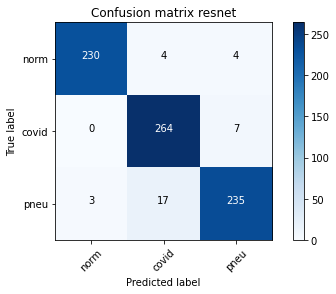

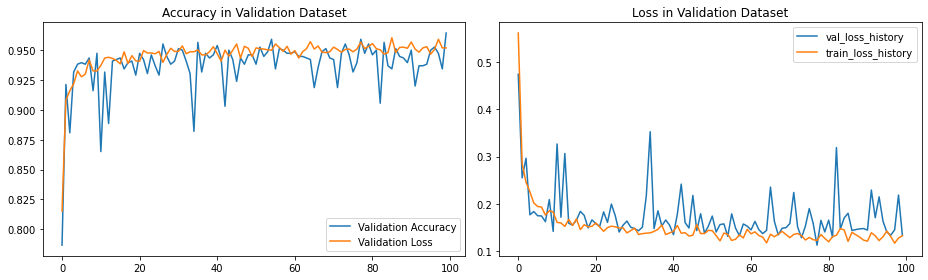


==== END ====
[[234   2   2]
 [  0 252  19]
 [  3  10 242]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.98 0.93 0.95]

Precision
[0.99 0.95 0.92]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5369 Acc: 0.8221
val Loss: 0.3117 Acc: 0.9162

Epoch 1/99
----------
train Loss: 0.2925 Acc: 0.9093
val Loss: 0.2605 Acc: 0.9188

Epoch 2/99
----------
train Loss: 0.2507 Acc: 0.9204
val Loss: 0.2183 Acc: 0.9280

Epoch 3/99
----------
train Loss: 0.2348 Acc: 0.9207
val Loss: 0.2047 Acc: 0.9267

Epoch 4/99
----------
train Loss: 0.2103 Acc: 0.9345
val Loss: 0.1913 Acc: 0.9385

Epoch 5/99
----------
train Loss: 0.1969 Acc: 0.9391
val Loss: 0.1927 Acc: 0.9385

Epoch 6/99
--------

train Loss: 0.1312 Acc: 0.9505
val Loss: 0.1235 Acc: 0.9594

Epoch 92/99
----------
train Loss: 0.1203 Acc: 0.9555
val Loss: 0.1446 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1186 Acc: 0.9587
val Loss: 0.1314 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1272 Acc: 0.9581
val Loss: 0.1287 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1195 Acc: 0.9587
val Loss: 0.1737 Acc: 0.9372

Epoch 96/99
----------
train Loss: 0.1289 Acc: 0.9535
val Loss: 0.1606 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1415 Acc: 0.9476
val Loss: 0.1715 Acc: 0.9542

Epoch 98/99
----------
train Loss: 0.1283 Acc: 0.9548
val Loss: 0.1551 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1170 Acc: 0.9564
val Loss: 0.1205 Acc: 0.9568


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 14s
Best val Acc: 0.962042
##############################


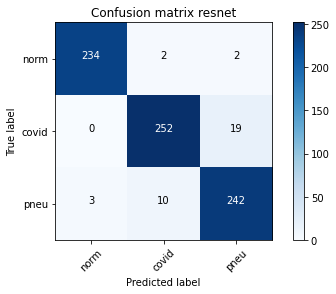

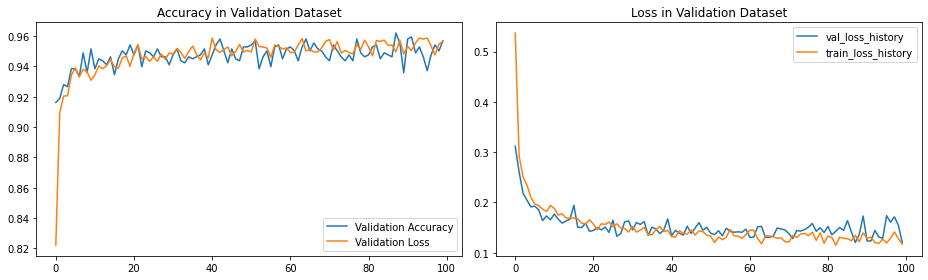


==== END ====
[[232   4   2]
 [  0 260  11]
 [  2  22 231]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.99 0.91 0.95]

F1 Score
[0.98 0.93 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5622 Acc: 0.7995
val Loss: 0.3756 Acc: 0.8717

Epoch 1/99
----------
train Loss: 0.2837 Acc: 0.9168
val Loss: 0.2414 Acc: 0.9267

Epoch 2/99
----------
train Loss: 0.2442 Acc: 0.9224
val Loss: 0.2092 Acc: 0.9319

Epoch 3/99
----------
train Loss: 0.2134 Acc: 0.9332
val Loss: 0.2058 Acc: 0.9332

Epoch 4/99
----------
train Loss: 0.2015 Acc: 0.9296
val Loss: 0.1907 Acc: 0.9398

Epoch 5/99
----------
train Loss: 0.1912 Acc: 0.9371
val Loss: 0.1832 Acc: 0.9346

Epoch 6/99
--------

train Loss: 0.1218 Acc: 0.9545
val Loss: 0.1422 Acc: 0.9594

Epoch 92/99
----------
train Loss: 0.1273 Acc: 0.9502
val Loss: 0.1482 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1091 Acc: 0.9617
val Loss: 0.1453 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1202 Acc: 0.9564
val Loss: 0.1531 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1291 Acc: 0.9532
val Loss: 0.1465 Acc: 0.9581

Epoch 96/99
----------
train Loss: 0.1196 Acc: 0.9574
val Loss: 0.1661 Acc: 0.9424

Epoch 97/99
----------
train Loss: 0.1290 Acc: 0.9519
val Loss: 0.1364 Acc: 0.9542

Epoch 98/99
----------
train Loss: 0.1276 Acc: 0.9538
val Loss: 0.1550 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1145 Acc: 0.9617
val Loss: 0.1411 Acc: 0.9568


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.959424
##############################


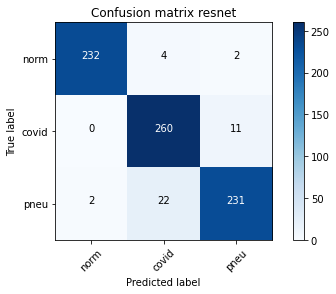

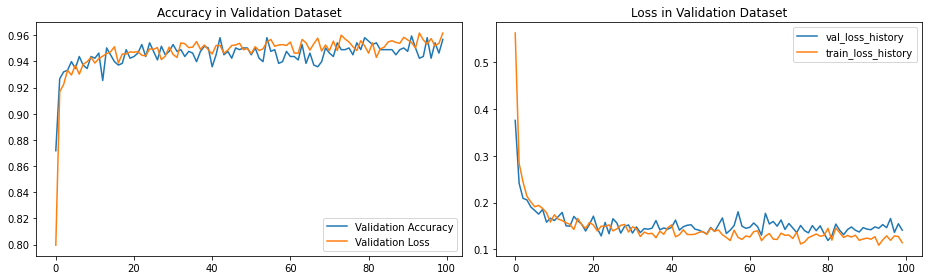


==== END ====
[[234   3   1]
 [  0 260  11]
 [  6  20 229]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.96 0.9 ]

Precision
[0.97 0.92 0.95]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5022 Acc: 0.8271
val Loss: 0.2963 Acc: 0.9097

Epoch 1/99
----------
train Loss: 0.2859 Acc: 0.9083
val Loss: 0.2600 Acc: 0.9110

Epoch 2/99
----------
train Loss: 0.2408 Acc: 0.9224
val Loss: 0.2233 Acc: 0.9267

Epoch 3/99
----------
train Loss: 0.2299 Acc: 0.9230
val Loss: 0.2215 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.2088 Acc: 0.9279
val Loss: 0.2013 Acc: 0.9241

Epoch 5/99
----------
train Loss: 0.1919 Acc: 0.9374
val Loss: 0.1861 Acc: 0.9372

Epoch 6/99
--------

train Loss: 0.1266 Acc: 0.9571
val Loss: 0.1576 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1208 Acc: 0.9555
val Loss: 0.2000 Acc: 0.9306

Epoch 93/99
----------
train Loss: 0.1234 Acc: 0.9541
val Loss: 0.1789 Acc: 0.9372

Epoch 94/99
----------
train Loss: 0.1248 Acc: 0.9581
val Loss: 0.1727 Acc: 0.9450

Epoch 95/99
----------
train Loss: 0.1239 Acc: 0.9509
val Loss: 0.1544 Acc: 0.9476

Epoch 96/99
----------
train Loss: 0.1192 Acc: 0.9561
val Loss: 0.1429 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1303 Acc: 0.9492
val Loss: 0.3212 Acc: 0.8966

Epoch 98/99
----------
train Loss: 0.1186 Acc: 0.9538
val Loss: 0.1492 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1173 Acc: 0.9535
val Loss: 0.2014 Acc: 0.9463


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 13s
Best val Acc: 0.958115
##############################


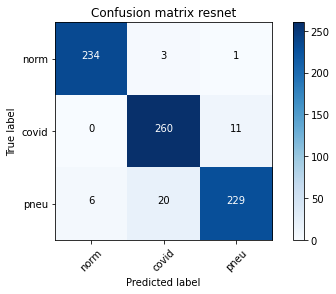

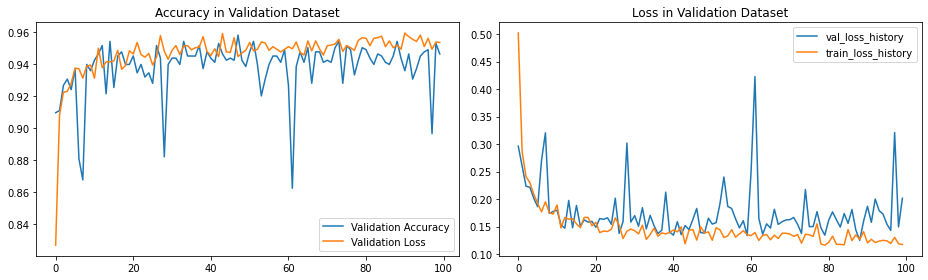


==== END ====
[[231   2   5]
 [  0 256  15]
 [  4  10 241]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.97 0.94 0.95]

Precision
[0.98 0.96 0.92]

F1 Score
[0.98 0.95 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9137 Acc: 0.6083
val Loss: 0.7805 Acc: 0.7723

Epoch 1/99
----------
train Loss: 0.6886 Acc: 0.8149
val Loss: 0.5914 Acc: 0.8573

Epoch 2/99
----------
train Loss: 0.5702 Acc: 0.8601
val Loss: 0.4943 Acc: 0.8887

Epoch 3/99
----------
train Loss: 0.4908 Acc: 0.8840
val Loss: 0.4388 Acc: 0.9123

Epoch 4/99
----------
train Loss: 0.4482 Acc: 0.8913
val Loss: 0.4019 Acc: 0.9084

Epoch 5/99
----------
train Loss: 0.4146 Acc: 0.8965
val Loss: 0.3648 Acc: 0.9058

Epoch 6/99
--------

train Loss: 0.1769 Acc: 0.9414
val Loss: 0.1624 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1768 Acc: 0.9433
val Loss: 0.1566 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1800 Acc: 0.9391
val Loss: 0.1733 Acc: 0.9463

Epoch 94/99
----------
train Loss: 0.1717 Acc: 0.9424
val Loss: 0.1709 Acc: 0.9398

Epoch 95/99
----------
train Loss: 0.1877 Acc: 0.9338
val Loss: 0.1680 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.1697 Acc: 0.9499
val Loss: 0.1776 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1814 Acc: 0.9371
val Loss: 0.1588 Acc: 0.9437

Epoch 98/99
----------
train Loss: 0.1766 Acc: 0.9417
val Loss: 0.1641 Acc: 0.9411

Epoch 99/99
----------
train Loss: 0.1756 Acc: 0.9440
val Loss: 0.1710 Acc: 0.9450


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.951571
##############################


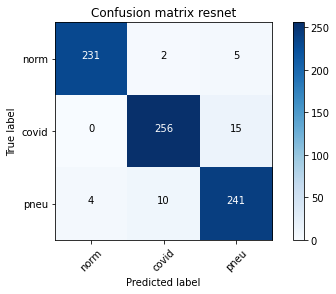

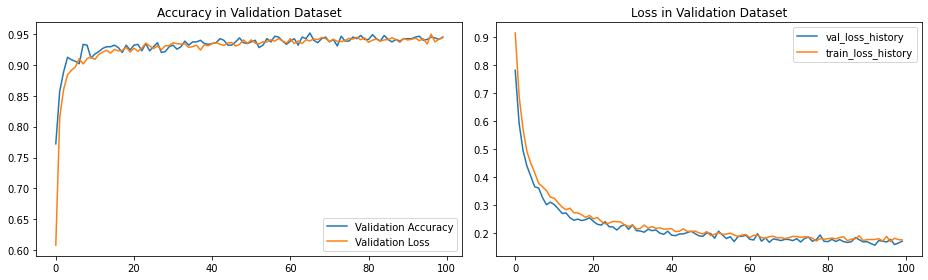


==== END ====
[[230   3   5]
 [  1 256  14]
 [  4  19 232]]

Sensitivity or recall total
0.9397905759162304

Sensitivity or recall per classes
[0.97 0.94 0.91]

Precision
[0.98 0.92 0.92]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0336 Acc: 0.4939
val Loss: 0.8880 Acc: 0.6623

Epoch 1/99
----------
train Loss: 0.7727 Acc: 0.7655
val Loss: 0.6839 Acc: 0.8325

Epoch 2/99
----------
train Loss: 0.6274 Acc: 0.8447
val Loss: 0.5693 Acc: 0.8639

Epoch 3/99
----------
train Loss: 0.5352 Acc: 0.8772
val Loss: 0.4868 Acc: 0.8743

Epoch 4/99
----------
train Loss: 0.4762 Acc: 0.8850
val Loss: 0.4330 Acc: 0.8966

Epoch 5/99
----------
train Loss: 0.4244 Acc: 0.9004
val Loss: 0.3923 Acc: 0.9018

Epoch 6/99
--------

train Loss: 0.1512 Acc: 0.9522
val Loss: 0.1551 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1665 Acc: 0.9430
val Loss: 0.1580 Acc: 0.9385

Epoch 93/99
----------
train Loss: 0.1562 Acc: 0.9450
val Loss: 0.1684 Acc: 0.9319

Epoch 94/99
----------
train Loss: 0.1558 Acc: 0.9469
val Loss: 0.1517 Acc: 0.9503

Epoch 95/99
----------
train Loss: 0.1560 Acc: 0.9460
val Loss: 0.1561 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.1577 Acc: 0.9443
val Loss: 0.1555 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.1570 Acc: 0.9450
val Loss: 0.1661 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1480 Acc: 0.9502
val Loss: 0.1660 Acc: 0.9437

Epoch 99/99
----------
train Loss: 0.1490 Acc: 0.9499
val Loss: 0.1514 Acc: 0.9437


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 19s
Best val Acc: 0.956806
##############################


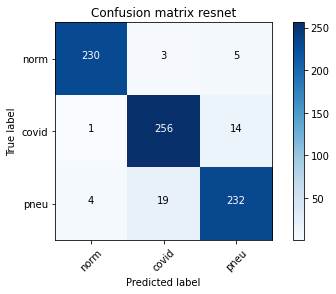

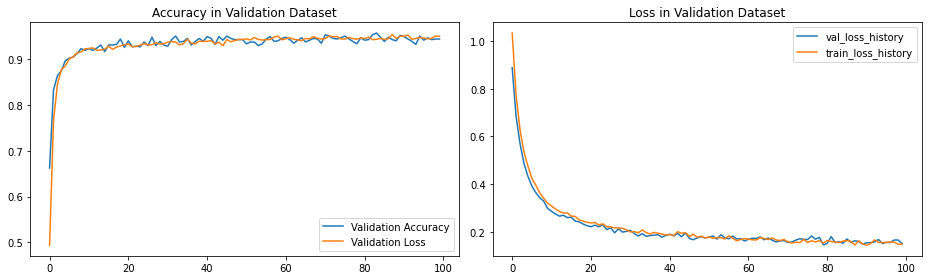


==== END ====
[[233   2   3]
 [  3 246  22]
 [  5  13 237]]

Sensitivity or recall total
0.93717277486911

Sensitivity or recall per classes
[0.98 0.91 0.93]

Precision
[0.97 0.94 0.9 ]

F1 Score
[0.97 0.92 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7969 Acc: 0.7134
val Loss: 0.6372 Acc: 0.8298

Epoch 1/99
----------
train Loss: 0.5996 Acc: 0.8588
val Loss: 0.5274 Acc: 0.8743

Epoch 2/99
----------
train Loss: 0.5007 Acc: 0.8932
val Loss: 0.4423 Acc: 0.9123

Epoch 3/99
----------
train Loss: 0.4406 Acc: 0.8972
val Loss: 0.3951 Acc: 0.9254

Epoch 4/99
----------
train Loss: 0.4053 Acc: 0.9063
val Loss: 0.3566 Acc: 0.9175

Epoch 5/99
----------
train Loss: 0.3640 Acc: 0.9103
val Loss: 0.3274 Acc: 0.9228

Epoch 6/99
----------

train Loss: 0.1519 Acc: 0.9479
val Loss: 0.1509 Acc: 0.9450

Epoch 92/99
----------
train Loss: 0.1578 Acc: 0.9489
val Loss: 0.1451 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1465 Acc: 0.9460
val Loss: 0.1477 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1467 Acc: 0.9499
val Loss: 0.1512 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1545 Acc: 0.9450
val Loss: 0.1417 Acc: 0.9529

Epoch 96/99
----------
train Loss: 0.1531 Acc: 0.9505
val Loss: 0.1470 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1502 Acc: 0.9486
val Loss: 0.1467 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1502 Acc: 0.9486
val Loss: 0.1527 Acc: 0.9476

Epoch 99/99
----------
train Loss: 0.1504 Acc: 0.9466
val Loss: 0.1493 Acc: 0.9463


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 20s
Best val Acc: 0.958115
##############################


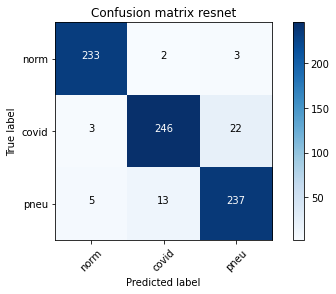

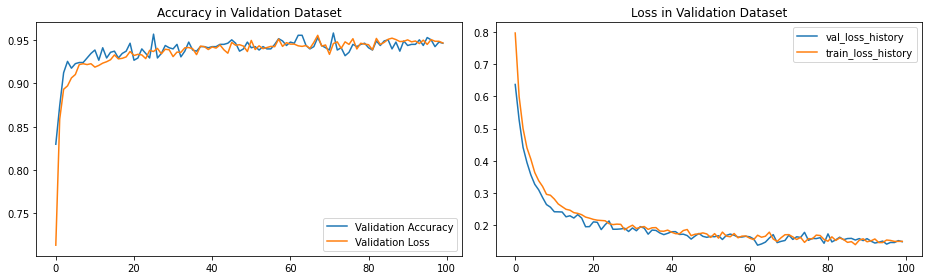


==== END ====
[[232   4   2]
 [  0 262   9]
 [  6  20 229]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.97 0.9 ]

Precision
[0.97 0.92 0.95]

F1 Score
[0.97 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0131 Acc: 0.4713
val Loss: 0.8417 Acc: 0.6924

Epoch 1/99
----------
train Loss: 0.7514 Acc: 0.7602
val Loss: 0.6319 Acc: 0.8233

Epoch 2/99
----------
train Loss: 0.6067 Acc: 0.8490
val Loss: 0.5350 Acc: 0.8861

Epoch 3/99
----------
train Loss: 0.5168 Acc: 0.8749
val Loss: 0.4611 Acc: 0.9071

Epoch 4/99
----------
train Loss: 0.4608 Acc: 0.8962
val Loss: 0.4261 Acc: 0.9045

Epoch 5/99
----------
train Loss: 0.4239 Acc: 0.8958
val Loss: 0.3836 Acc: 0.9084

Epoch 6/99
-------

train Loss: 0.1643 Acc: 0.9473
val Loss: 0.1741 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1715 Acc: 0.9443
val Loss: 0.1684 Acc: 0.9476

Epoch 93/99
----------
train Loss: 0.1647 Acc: 0.9479
val Loss: 0.1750 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1699 Acc: 0.9446
val Loss: 0.1685 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1786 Acc: 0.9424
val Loss: 0.1810 Acc: 0.9398

Epoch 96/99
----------
train Loss: 0.1659 Acc: 0.9469
val Loss: 0.1627 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.1791 Acc: 0.9374
val Loss: 0.1620 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1825 Acc: 0.9414
val Loss: 0.1613 Acc: 0.9516

Epoch 99/99
----------
train Loss: 0.1734 Acc: 0.9401
val Loss: 0.1777 Acc: 0.9372


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.955497
##############################


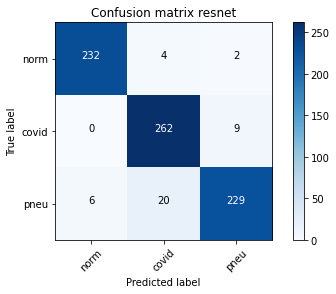

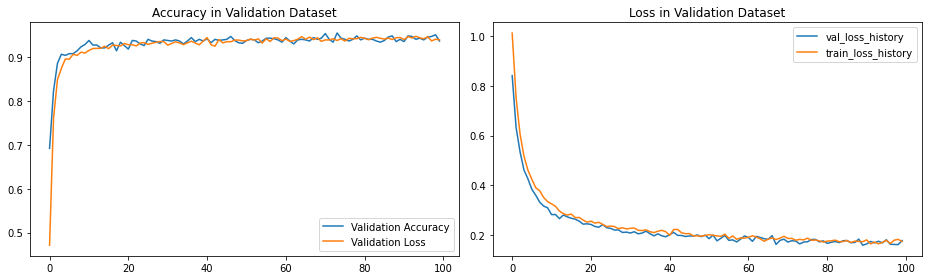


==== END ====
[[230   3   5]
 [  2 258  11]
 [  4  18 233]]

Sensitivity or recall total
0.943717277486911

Sensitivity or recall per classes
[0.97 0.95 0.91]

Precision
[0.97 0.92 0.94]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9413 Acc: 0.5775
val Loss: 0.8194 Acc: 0.6963

Epoch 1/99
----------
train Loss: 0.7307 Acc: 0.7845
val Loss: 0.6376 Acc: 0.8233

Epoch 2/99
----------
train Loss: 0.6061 Acc: 0.8418
val Loss: 0.5263 Acc: 0.8835

Epoch 3/99
----------
train Loss: 0.5161 Acc: 0.8883
val Loss: 0.4767 Acc: 0.8966

Epoch 4/99
----------
train Loss: 0.4603 Acc: 0.8945
val Loss: 0.4157 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.4127 Acc: 0.9057
val Loss: 0.3810 Acc: 0.9136

Epoch 6/99
--------

train Loss: 0.1564 Acc: 0.9460
val Loss: 0.1570 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1599 Acc: 0.9414
val Loss: 0.1512 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1530 Acc: 0.9502
val Loss: 0.1599 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1535 Acc: 0.9496
val Loss: 0.1499 Acc: 0.9490

Epoch 95/99
----------
train Loss: 0.1543 Acc: 0.9489
val Loss: 0.1580 Acc: 0.9398

Epoch 96/99
----------
train Loss: 0.1571 Acc: 0.9453
val Loss: 0.1686 Acc: 0.9372

Epoch 97/99
----------
train Loss: 0.1430 Acc: 0.9512
val Loss: 0.1606 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1460 Acc: 0.9505
val Loss: 0.1402 Acc: 0.9581

Epoch 99/99
----------
train Loss: 0.1529 Acc: 0.9492
val Loss: 0.1555 Acc: 0.9476


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 15s
Best val Acc: 0.958115
##############################


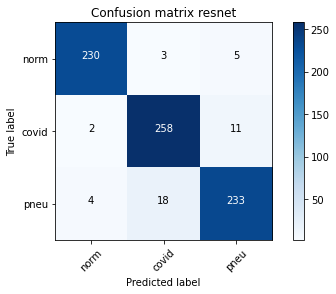

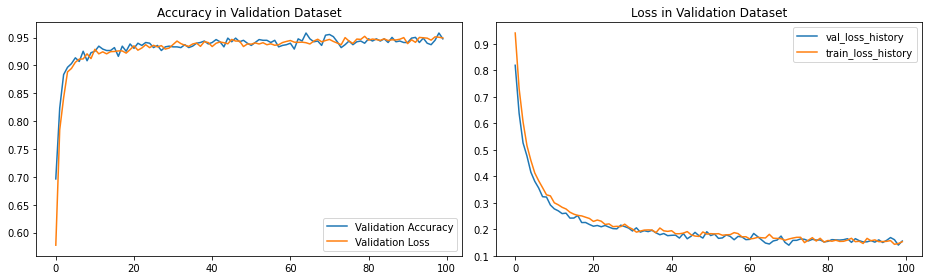


==== END ====
[[230   3   5]
 [  1 258  12]
 [  6  20 229]]

Sensitivity or recall total
0.9384816753926701

Sensitivity or recall per classes
[0.97 0.95 0.9 ]

Precision
[0.97 0.92 0.93]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8543 Acc: 0.6554
val Loss: 0.7247 Acc: 0.7277

Epoch 1/99
----------
train Loss: 0.6375 Acc: 0.8271
val Loss: 0.5642 Acc: 0.8521

Epoch 2/99
----------
train Loss: 0.5374 Acc: 0.8716
val Loss: 0.4768 Acc: 0.8783

Epoch 3/99
----------
train Loss: 0.4659 Acc: 0.8870
val Loss: 0.4338 Acc: 0.8835

Epoch 4/99
----------
train Loss: 0.4150 Acc: 0.9030
val Loss: 0.3896 Acc: 0.9110

Epoch 5/99
----------
train Loss: 0.3784 Acc: 0.9089
val Loss: 0.3552 Acc: 0.9058

Epoch 6/99
-------

train Loss: 0.1533 Acc: 0.9453
val Loss: 0.1588 Acc: 0.9529

Epoch 92/99
----------
train Loss: 0.1438 Acc: 0.9509
val Loss: 0.1553 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1479 Acc: 0.9541
val Loss: 0.1537 Acc: 0.9437

Epoch 94/99
----------
train Loss: 0.1476 Acc: 0.9548
val Loss: 0.1503 Acc: 0.9450

Epoch 95/99
----------
train Loss: 0.1562 Acc: 0.9489
val Loss: 0.1609 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1501 Acc: 0.9466
val Loss: 0.1532 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1476 Acc: 0.9489
val Loss: 0.1552 Acc: 0.9555

Epoch 98/99
----------
train Loss: 0.1481 Acc: 0.9453
val Loss: 0.1478 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1519 Acc: 0.9469
val Loss: 0.1576 Acc: 0.9516


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 13s
Best val Acc: 0.955497
##############################


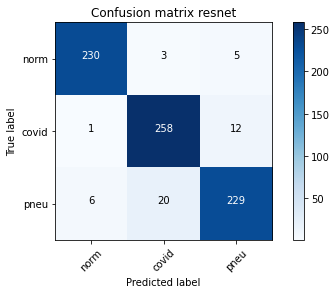

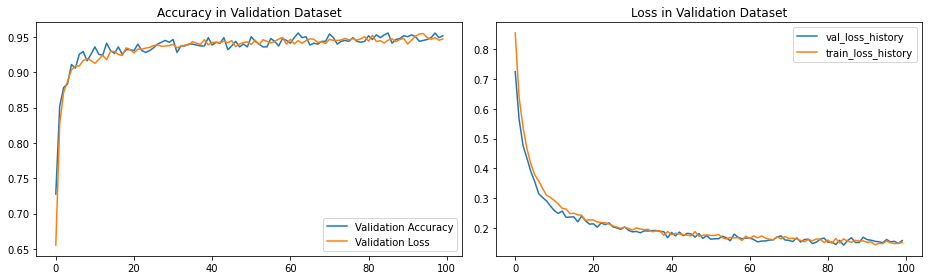


==== END ====
[[232   3   3]
 [  1 259  11]
 [  3  20 232]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.98 0.92 0.94]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9731 Acc: 0.5657
val Loss: 0.8196 Acc: 0.7264

Epoch 1/99
----------
train Loss: 0.7146 Acc: 0.8054
val Loss: 0.6366 Acc: 0.8312

Epoch 2/99
----------
train Loss: 0.5798 Acc: 0.8647
val Loss: 0.5251 Acc: 0.8783

Epoch 3/99
----------
train Loss: 0.5083 Acc: 0.8814
val Loss: 0.4404 Acc: 0.9084

Epoch 4/99
----------
train Loss: 0.4539 Acc: 0.9011
val Loss: 0.4109 Acc: 0.9058

Epoch 5/99
----------
train Loss: 0.4156 Acc: 0.9044
val Loss: 0.3675 Acc: 0.9306

Epoch 6/99
-------

train Loss: 0.1723 Acc: 0.9407
val Loss: 0.1807 Acc: 0.9411

Epoch 92/99
----------
train Loss: 0.1830 Acc: 0.9365
val Loss: 0.1750 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1751 Acc: 0.9407
val Loss: 0.1553 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1744 Acc: 0.9365
val Loss: 0.1809 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1788 Acc: 0.9374
val Loss: 0.1536 Acc: 0.9398

Epoch 96/99
----------
train Loss: 0.1719 Acc: 0.9453
val Loss: 0.1617 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1664 Acc: 0.9469
val Loss: 0.1739 Acc: 0.9437

Epoch 98/99
----------
train Loss: 0.1587 Acc: 0.9479
val Loss: 0.1735 Acc: 0.9332

Epoch 99/99
----------
train Loss: 0.1685 Acc: 0.9512
val Loss: 0.1688 Acc: 0.9463


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 13s
Best val Acc: 0.950262
##############################


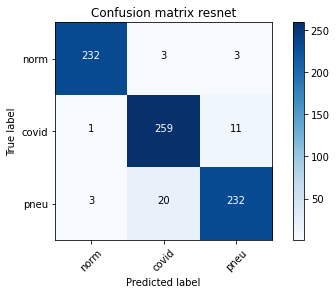

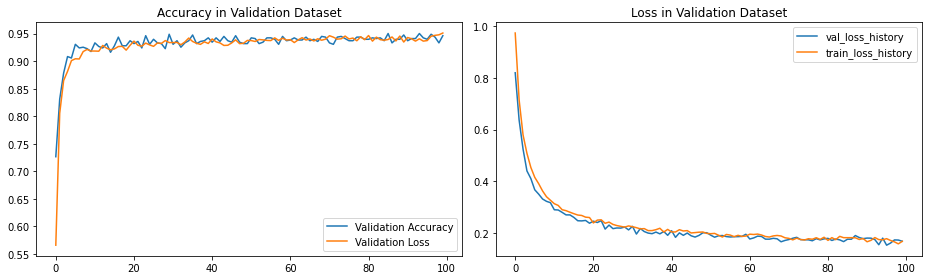


==== END ====
[[234   3   1]
 [  0 257  14]
 [  6  16 233]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.98 0.95 0.91]

Precision
[0.97 0.93 0.94]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0310 Acc: 0.4989
val Loss: 0.8786 Acc: 0.6754

Epoch 1/99
----------
train Loss: 0.7757 Acc: 0.7678
val Loss: 0.6800 Acc: 0.8233

Epoch 2/99
----------
train Loss: 0.6283 Acc: 0.8533
val Loss: 0.5568 Acc: 0.8914

Epoch 3/99
----------
train Loss: 0.5340 Acc: 0.8854
val Loss: 0.4704 Acc: 0.9162

Epoch 4/99
----------
train Loss: 0.4800 Acc: 0.8840
val Loss: 0.4324 Acc: 0.9071

Epoch 5/99
----------
train Loss: 0.4219 Acc: 0.9063
val Loss: 0.3922 Acc: 0.9136

Epoch 6/99
-------

train Loss: 0.1537 Acc: 0.9466
val Loss: 0.1505 Acc: 0.9359

Epoch 92/99
----------
train Loss: 0.1605 Acc: 0.9446
val Loss: 0.1461 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.1509 Acc: 0.9433
val Loss: 0.1531 Acc: 0.9463

Epoch 94/99
----------
train Loss: 0.1569 Acc: 0.9482
val Loss: 0.1516 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1668 Acc: 0.9420
val Loss: 0.1573 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1493 Acc: 0.9489
val Loss: 0.1582 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1487 Acc: 0.9538
val Loss: 0.1511 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1478 Acc: 0.9519
val Loss: 0.1696 Acc: 0.9411

Epoch 99/99
----------
train Loss: 0.1498 Acc: 0.9505
val Loss: 0.1485 Acc: 0.9490


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 9s
Best val Acc: 0.958115
##############################


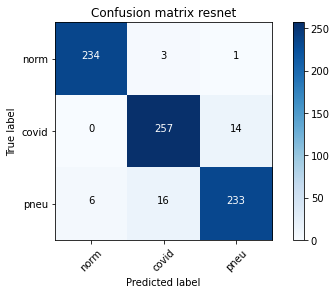

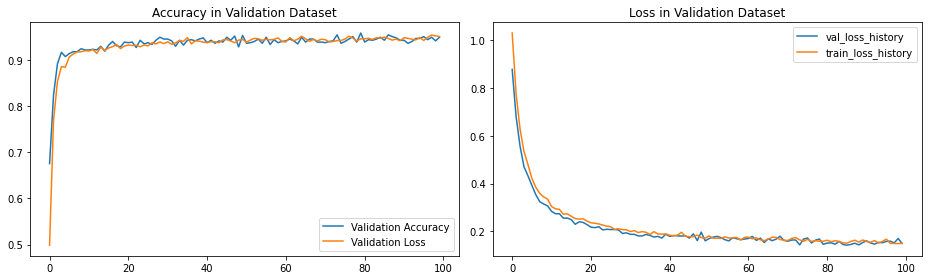


==== END ====
[[233   3   2]
 [  1 259  11]
 [  7  23 225]]

Sensitivity or recall total
0.9384816753926701

Sensitivity or recall per classes
[0.98 0.96 0.88]

Precision
[0.97 0.91 0.95]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8350 Acc: 0.6947
val Loss: 0.6576 Acc: 0.8534

Epoch 1/99
----------
train Loss: 0.6164 Acc: 0.8647
val Loss: 0.5351 Acc: 0.8861

Epoch 2/99
----------
train Loss: 0.5150 Acc: 0.8814
val Loss: 0.4512 Acc: 0.9110

Epoch 3/99
----------
train Loss: 0.4535 Acc: 0.8949
val Loss: 0.3935 Acc: 0.9149

Epoch 4/99
----------
train Loss: 0.4032 Acc: 0.9086
val Loss: 0.3658 Acc: 0.9202

Epoch 5/99
----------
train Loss: 0.3651 Acc: 0.9142
val Loss: 0.3441 Acc: 0.9149

Epoch 6/99
-------

train Loss: 0.1540 Acc: 0.9469
val Loss: 0.1468 Acc: 0.9450

Epoch 92/99
----------
train Loss: 0.1496 Acc: 0.9486
val Loss: 0.1532 Acc: 0.9476

Epoch 93/99
----------
train Loss: 0.1441 Acc: 0.9486
val Loss: 0.1472 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1505 Acc: 0.9499
val Loss: 0.1609 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1560 Acc: 0.9443
val Loss: 0.1552 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1443 Acc: 0.9489
val Loss: 0.1727 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.1509 Acc: 0.9492
val Loss: 0.1490 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1528 Acc: 0.9482
val Loss: 0.1560 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1640 Acc: 0.9371
val Loss: 0.1477 Acc: 0.9450


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 10s
Best val Acc: 0.955497
##############################


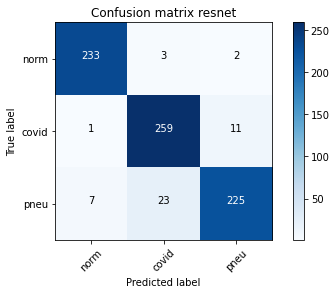

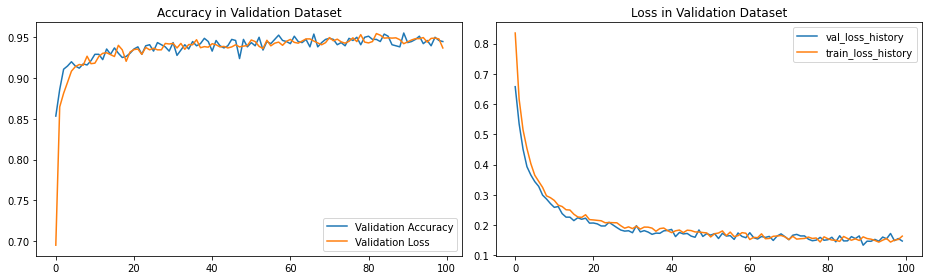


==== END ====
[[233   3   2]
 [  1 253  17]
 [  6  16 233]]

Sensitivity or recall total
0.9410994764397905

Sensitivity or recall per classes
[0.98 0.93 0.91]

Precision
[0.97 0.93 0.92]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1607 Acc: 0.2896
val Loss: 1.0841 Acc: 0.3861

Epoch 1/99
----------
train Loss: 1.0704 Acc: 0.4150
val Loss: 1.0624 Acc: 0.4463

Epoch 2/99
----------
train Loss: 1.0334 Acc: 0.4707
val Loss: 1.0135 Acc: 0.5039

Epoch 3/99
----------
train Loss: 0.9842 Acc: 0.5388
val Loss: 0.9850 Acc: 0.5262

Epoch 4/99
----------
train Loss: 0.9597 Acc: 0.5581
val Loss: 0.9521 Acc: 0.5694

Epoch 5/99
----------
train Loss: 0.9270 Acc: 0.5997
val Loss: 0.9354 Acc: 0.5877

Epoch 6/99
---------

train Loss: 0.3268 Acc: 0.9240
val Loss: 0.3099 Acc: 0.9280

Epoch 92/99
----------
train Loss: 0.3312 Acc: 0.9152
val Loss: 0.3246 Acc: 0.9110

Epoch 93/99
----------
train Loss: 0.3327 Acc: 0.9224
val Loss: 0.3156 Acc: 0.9123

Epoch 94/99
----------
train Loss: 0.3280 Acc: 0.9158
val Loss: 0.3157 Acc: 0.9228

Epoch 95/99
----------
train Loss: 0.3235 Acc: 0.9234
val Loss: 0.3091 Acc: 0.9202

Epoch 96/99
----------
train Loss: 0.3283 Acc: 0.9211
val Loss: 0.2979 Acc: 0.9346

Epoch 97/99
----------
train Loss: 0.3285 Acc: 0.9247
val Loss: 0.3071 Acc: 0.9280

Epoch 98/99
----------
train Loss: 0.3263 Acc: 0.9184
val Loss: 0.3005 Acc: 0.9215

Epoch 99/99
----------
train Loss: 0.3205 Acc: 0.9240
val Loss: 0.3087 Acc: 0.9254


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 15s
Best val Acc: 0.934555
##############################


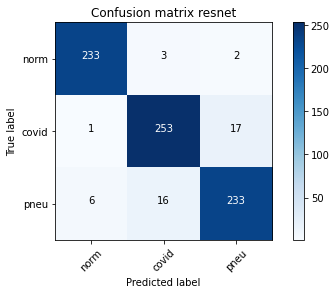

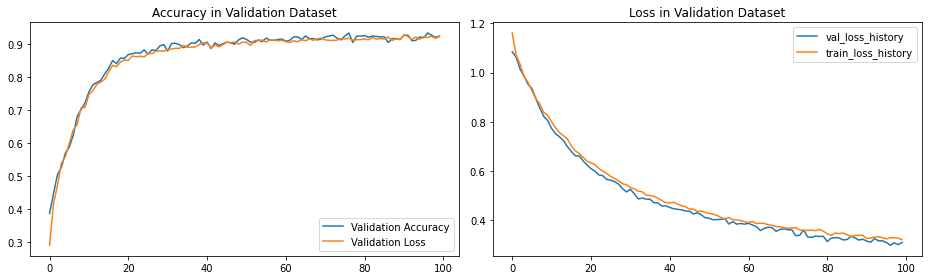


==== END ====
[[224   4  10]
 [  1 254  16]
 [ 13  19 223]]

Sensitivity or recall total
0.9175392670157068

Sensitivity or recall per classes
[0.94 0.94 0.87]

Precision
[0.94 0.92 0.9 ]

F1 Score
[0.94 0.93 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1569 Acc: 0.3544
val Loss: 1.1114 Acc: 0.3691

Epoch 1/99
----------
train Loss: 1.0908 Acc: 0.3911
val Loss: 1.0791 Acc: 0.4031

Epoch 2/99
----------
train Loss: 1.0502 Acc: 0.4301
val Loss: 1.0438 Acc: 0.4594

Epoch 3/99
----------
train Loss: 1.0196 Acc: 0.4625
val Loss: 1.0185 Acc: 0.5013

Epoch 4/99
----------
train Loss: 0.9989 Acc: 0.5044
val Loss: 0.9783 Acc: 0.5458

Epoch 5/99
----------
train Loss: 0.9708 Acc: 0.5522
val Loss: 0.9530 Acc: 0.5877

Epoch 6/99
---------

train Loss: 0.3137 Acc: 0.9171
val Loss: 0.3108 Acc: 0.9202

Epoch 92/99
----------
train Loss: 0.3150 Acc: 0.9171
val Loss: 0.3015 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.3138 Acc: 0.9155
val Loss: 0.3047 Acc: 0.9149

Epoch 94/99
----------
train Loss: 0.3066 Acc: 0.9227
val Loss: 0.2988 Acc: 0.9188

Epoch 95/99
----------
train Loss: 0.3049 Acc: 0.9227
val Loss: 0.3031 Acc: 0.9175

Epoch 96/99
----------
train Loss: 0.3080 Acc: 0.9148
val Loss: 0.2864 Acc: 0.9267

Epoch 97/99
----------
train Loss: 0.3070 Acc: 0.9191
val Loss: 0.2872 Acc: 0.9149

Epoch 98/99
----------
train Loss: 0.3052 Acc: 0.9201
val Loss: 0.2869 Acc: 0.9293

Epoch 99/99
----------
train Loss: 0.2982 Acc: 0.9217
val Loss: 0.2874 Acc: 0.9254


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 11s
Best val Acc: 0.929319
##############################


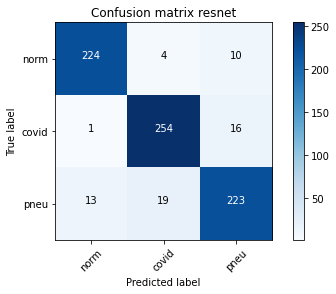

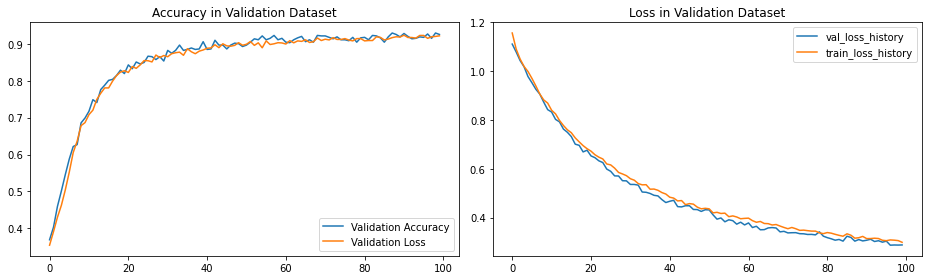


==== END ====
[[227   2   9]
 [  3 251  17]
 [ 11  21 223]]

Sensitivity or recall total
0.9175392670157068

Sensitivity or recall per classes
[0.95 0.93 0.87]

Precision
[0.94 0.92 0.9 ]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1416 Acc: 0.3596
val Loss: 1.1255 Acc: 0.3743

Epoch 1/99
----------
train Loss: 1.0848 Acc: 0.3934
val Loss: 1.0672 Acc: 0.4175

Epoch 2/99
----------
train Loss: 1.0468 Acc: 0.4471
val Loss: 1.0340 Acc: 0.4503

Epoch 3/99
----------
train Loss: 1.0117 Acc: 0.4884
val Loss: 0.9971 Acc: 0.5013

Epoch 4/99
----------
train Loss: 0.9833 Acc: 0.5247
val Loss: 0.9575 Acc: 0.5484

Epoch 5/99
----------
train Loss: 0.9520 Acc: 0.5621
val Loss: 0.9386 Acc: 0.5628

Epoch 6/99
---------

train Loss: 0.3153 Acc: 0.9132
val Loss: 0.2864 Acc: 0.9228

Epoch 92/99
----------
train Loss: 0.3054 Acc: 0.9161
val Loss: 0.2976 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.3057 Acc: 0.9175
val Loss: 0.2802 Acc: 0.9280

Epoch 94/99
----------
train Loss: 0.3077 Acc: 0.9168
val Loss: 0.2860 Acc: 0.9267

Epoch 95/99
----------
train Loss: 0.3076 Acc: 0.9129
val Loss: 0.2892 Acc: 0.9084

Epoch 96/99
----------
train Loss: 0.3093 Acc: 0.9148
val Loss: 0.2826 Acc: 0.9202

Epoch 97/99
----------
train Loss: 0.3010 Acc: 0.9188
val Loss: 0.2805 Acc: 0.9215

Epoch 98/99
----------
train Loss: 0.2988 Acc: 0.9211
val Loss: 0.2746 Acc: 0.9293

Epoch 99/99
----------
train Loss: 0.2944 Acc: 0.9217
val Loss: 0.2695 Acc: 0.9319


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 12s
Best val Acc: 0.939791
##############################


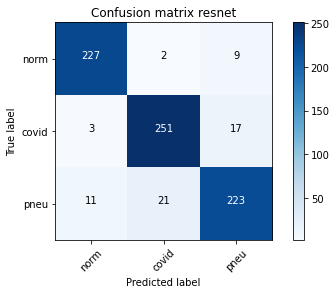

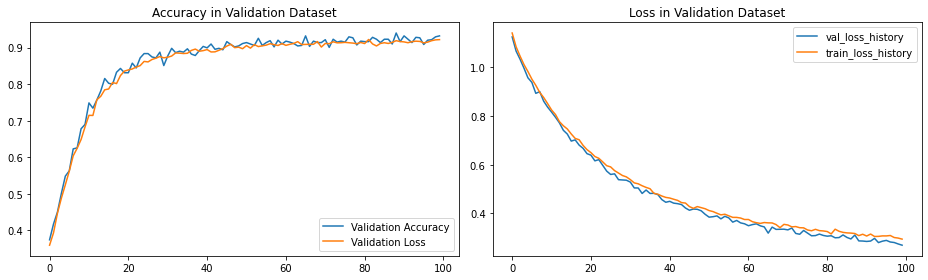


==== END ====
[[228   3   7]
 [  2 258  11]
 [  6  23 226]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.96 0.95 0.89]

Precision
[0.97 0.91 0.93]

F1 Score
[0.96 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1340 Acc: 0.3534
val Loss: 1.0763 Acc: 0.4136

Epoch 1/99
----------
train Loss: 1.0476 Acc: 0.4605
val Loss: 1.0360 Acc: 0.4712

Epoch 2/99
----------
train Loss: 1.0071 Acc: 0.5084
val Loss: 0.9701 Acc: 0.5550

Epoch 3/99
----------
train Loss: 0.9718 Acc: 0.5696
val Loss: 0.9521 Acc: 0.5668

Epoch 4/99
----------
train Loss: 0.9411 Acc: 0.5971
val Loss: 0.9199 Acc: 0.6257

Epoch 5/99
----------
train Loss: 0.9080 Acc: 0.6462
val Loss: 0.8738 Acc: 0.6859

Epoch 6/99
--------

train Loss: 0.3359 Acc: 0.9155
val Loss: 0.3244 Acc: 0.9123

Epoch 92/99
----------
train Loss: 0.3271 Acc: 0.9211
val Loss: 0.3216 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.3368 Acc: 0.9168
val Loss: 0.3213 Acc: 0.9136

Epoch 94/99
----------
train Loss: 0.3316 Acc: 0.9122
val Loss: 0.3108 Acc: 0.9202

Epoch 95/99
----------
train Loss: 0.3275 Acc: 0.9129
val Loss: 0.3223 Acc: 0.9202

Epoch 96/99
----------
train Loss: 0.3235 Acc: 0.9240
val Loss: 0.3142 Acc: 0.9097

Epoch 97/99
----------
train Loss: 0.3229 Acc: 0.9194
val Loss: 0.3202 Acc: 0.9110

Epoch 98/99
----------
train Loss: 0.3212 Acc: 0.9201
val Loss: 0.3117 Acc: 0.9254

Epoch 99/99
----------
train Loss: 0.3153 Acc: 0.9234
val Loss: 0.3086 Acc: 0.9241


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 12s
Best val Acc: 0.925393
##############################


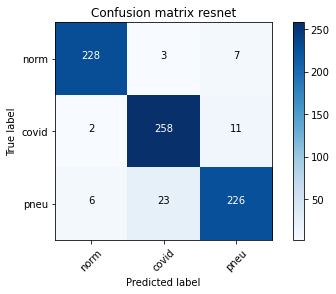

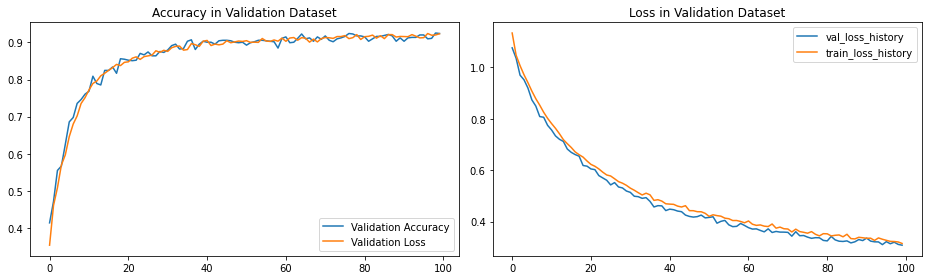


==== END ====
[[230   3   5]
 [  1 255  15]
 [  9  27 219]]

Sensitivity or recall total
0.9214659685863874

Sensitivity or recall per classes
[0.97 0.94 0.86]

Precision
[0.96 0.89 0.92]

F1 Score
[0.96 0.92 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1018 Acc: 0.3685
val Loss: 1.0816 Acc: 0.4071

Epoch 1/99
----------
train Loss: 1.0530 Acc: 0.4229
val Loss: 1.0213 Acc: 0.4764

Epoch 2/99
----------
train Loss: 1.0259 Acc: 0.4556
val Loss: 1.0046 Acc: 0.4895

Epoch 3/99
----------
train Loss: 0.9898 Acc: 0.5093
val Loss: 0.9620 Acc: 0.5654

Epoch 4/99
----------
train Loss: 0.9528 Acc: 0.5585
val Loss: 0.9325 Acc: 0.5812

Epoch 5/99
----------
train Loss: 0.9290 Acc: 0.5883
val Loss: 0.9016 Acc: 0.6309

Epoch 6/99
--------

train Loss: 0.3105 Acc: 0.9109
val Loss: 0.2726 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.3074 Acc: 0.9217
val Loss: 0.2912 Acc: 0.9319

Epoch 93/99
----------
train Loss: 0.3043 Acc: 0.9204
val Loss: 0.2851 Acc: 0.9332

Epoch 94/99
----------
train Loss: 0.2978 Acc: 0.9230
val Loss: 0.2849 Acc: 0.9280

Epoch 95/99
----------
train Loss: 0.3031 Acc: 0.9191
val Loss: 0.2880 Acc: 0.9267

Epoch 96/99
----------
train Loss: 0.3025 Acc: 0.9220
val Loss: 0.2870 Acc: 0.9280

Epoch 97/99
----------
train Loss: 0.2929 Acc: 0.9214
val Loss: 0.2920 Acc: 0.9188

Epoch 98/99
----------
train Loss: 0.2926 Acc: 0.9211
val Loss: 0.2766 Acc: 0.9306

Epoch 99/99
----------
train Loss: 0.2992 Acc: 0.9201
val Loss: 0.2756 Acc: 0.9306


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 8s
Best val Acc: 0.946335
##############################


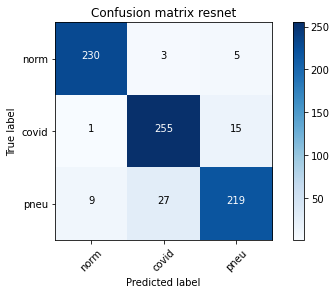

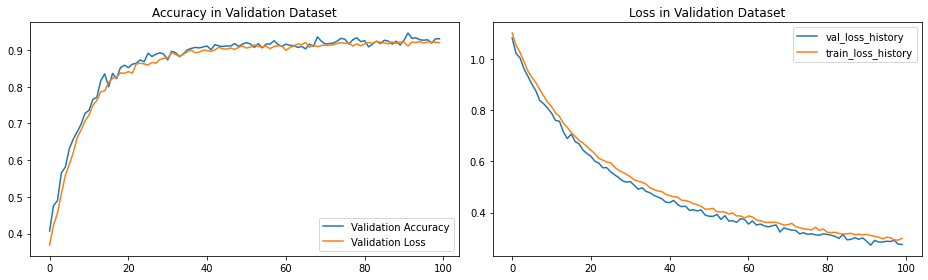


==== END ====
[[231   2   5]
 [  1 254  16]
 [  8  18 229]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.97 0.94 0.9 ]

Precision
[0.96 0.93 0.92]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0982 Acc: 0.3806
val Loss: 1.0683 Acc: 0.4018

Epoch 1/99
----------
train Loss: 1.0430 Acc: 0.4314
val Loss: 1.0372 Acc: 0.4254

Epoch 2/99
----------
train Loss: 1.0117 Acc: 0.4726
val Loss: 0.9911 Acc: 0.5092

Epoch 3/99
----------
train Loss: 0.9752 Acc: 0.5264
val Loss: 0.9730 Acc: 0.5209

Epoch 4/99
----------
train Loss: 0.9491 Acc: 0.5611
val Loss: 0.9435 Acc: 0.5838

Epoch 5/99
----------
train Loss: 0.9252 Acc: 0.6060
val Loss: 0.9062 Acc: 0.6113

Epoch 6/99
--------

train Loss: 0.3003 Acc: 0.9198
val Loss: 0.2871 Acc: 0.9241

Epoch 92/99
----------
train Loss: 0.2965 Acc: 0.9214
val Loss: 0.2921 Acc: 0.9202

Epoch 93/99
----------
train Loss: 0.2955 Acc: 0.9230
val Loss: 0.2746 Acc: 0.9280

Epoch 94/99
----------
train Loss: 0.3031 Acc: 0.9171
val Loss: 0.2715 Acc: 0.9319

Epoch 95/99
----------
train Loss: 0.2990 Acc: 0.9243
val Loss: 0.2817 Acc: 0.9241

Epoch 96/99
----------
train Loss: 0.3006 Acc: 0.9204
val Loss: 0.2799 Acc: 0.9319

Epoch 97/99
----------
train Loss: 0.2931 Acc: 0.9214
val Loss: 0.2704 Acc: 0.9359

Epoch 98/99
----------
train Loss: 0.2786 Acc: 0.9260
val Loss: 0.2771 Acc: 0.9280

Epoch 99/99
----------
train Loss: 0.2988 Acc: 0.9158
val Loss: 0.2757 Acc: 0.9254


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 5s
Best val Acc: 0.935864
##############################


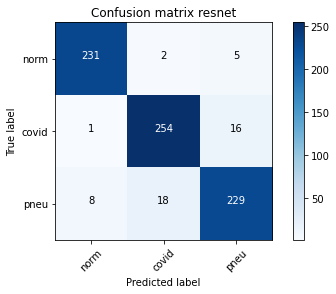

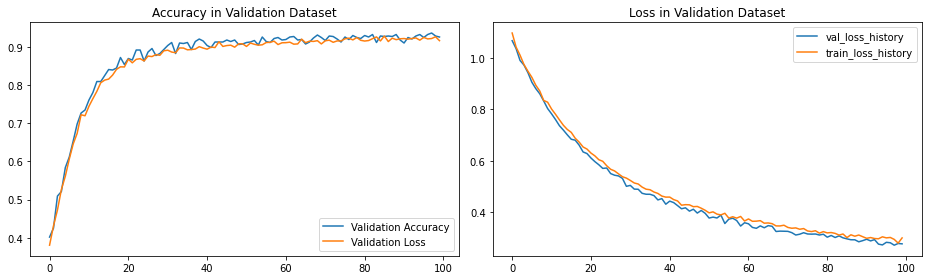


==== END ====
[[228   3   7]
 [  0 260  11]
 [  6  26 223]]

Sensitivity or recall total
0.930628272251309

Sensitivity or recall per classes
[0.96 0.96 0.87]

Precision
[0.97 0.9  0.93]

F1 Score
[0.97 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.2142 Acc: 0.3262
val Loss: 1.1795 Acc: 0.3665

Epoch 1/99
----------
train Loss: 1.1594 Acc: 0.3501
val Loss: 1.1247 Acc: 0.3861

Epoch 2/99
----------
train Loss: 1.1042 Acc: 0.4039
val Loss: 1.0846 Acc: 0.4254

Epoch 3/99
----------
train Loss: 1.0605 Acc: 0.4566
val Loss: 1.0415 Acc: 0.4843

Epoch 4/99
----------
train Loss: 1.0211 Acc: 0.5034
val Loss: 0.9841 Acc: 0.5314

Epoch 5/99
----------
train Loss: 0.9880 Acc: 0.5427
val Loss: 0.9686 Acc: 0.5641

Epoch 6/99
---------

train Loss: 0.3345 Acc: 0.9188
val Loss: 0.3301 Acc: 0.9018

Epoch 92/99
----------
train Loss: 0.3374 Acc: 0.9122
val Loss: 0.3207 Acc: 0.9149

Epoch 93/99
----------
train Loss: 0.3334 Acc: 0.9109
val Loss: 0.3105 Acc: 0.9241

Epoch 94/99
----------
train Loss: 0.3320 Acc: 0.9142
val Loss: 0.3103 Acc: 0.9267

Epoch 95/99
----------
train Loss: 0.3305 Acc: 0.9112
val Loss: 0.3074 Acc: 0.9136

Epoch 96/99
----------
train Loss: 0.3284 Acc: 0.9155
val Loss: 0.3181 Acc: 0.9202

Epoch 97/99
----------
train Loss: 0.3384 Acc: 0.9089
val Loss: 0.3047 Acc: 0.9332

Epoch 98/99
----------
train Loss: 0.3171 Acc: 0.9217
val Loss: 0.3330 Acc: 0.9031

Epoch 99/99
----------
train Loss: 0.3349 Acc: 0.9089
val Loss: 0.3103 Acc: 0.9162


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 8s
Best val Acc: 0.933246
##############################


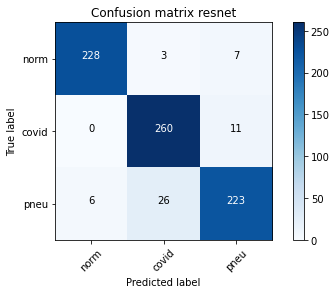

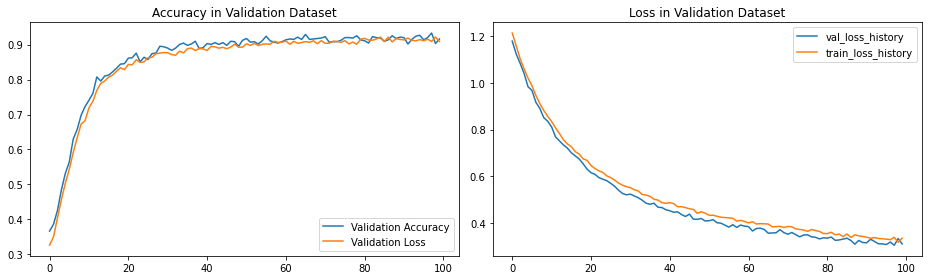


==== END ====
[[225   4   9]
 [  1 257  13]
 [  5  24 226]]

Sensitivity or recall total
0.9267015706806283

Sensitivity or recall per classes
[0.95 0.95 0.89]

Precision
[0.97 0.9  0.91]

F1 Score
[0.96 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1492 Acc: 0.3479
val Loss: 1.0933 Acc: 0.3560

Epoch 1/99
----------
train Loss: 1.0566 Acc: 0.3793
val Loss: 1.0339 Acc: 0.4136

Epoch 2/99
----------
train Loss: 1.0127 Acc: 0.4556
val Loss: 0.9966 Acc: 0.4895

Epoch 3/99
----------
train Loss: 0.9818 Acc: 0.5038
val Loss: 0.9463 Acc: 0.5510

Epoch 4/99
----------
train Loss: 0.9545 Acc: 0.5637
val Loss: 0.9393 Acc: 0.5864

Epoch 5/99
----------
train Loss: 0.9306 Acc: 0.5922
val Loss: 0.9114 Acc: 0.6113

Epoch 6/99
--------

train Loss: 0.3147 Acc: 0.9188
val Loss: 0.2858 Acc: 0.9332

Epoch 92/99
----------
train Loss: 0.2989 Acc: 0.9289
val Loss: 0.2881 Acc: 0.9241

Epoch 93/99
----------
train Loss: 0.3083 Acc: 0.9217
val Loss: 0.2957 Acc: 0.9228

Epoch 94/99
----------
train Loss: 0.3047 Acc: 0.9165
val Loss: 0.2952 Acc: 0.9241

Epoch 95/99
----------
train Loss: 0.3013 Acc: 0.9204
val Loss: 0.2764 Acc: 0.9228

Epoch 96/99
----------
train Loss: 0.3040 Acc: 0.9198
val Loss: 0.2935 Acc: 0.9136

Epoch 97/99
----------
train Loss: 0.3004 Acc: 0.9217
val Loss: 0.2840 Acc: 0.9228

Epoch 98/99
----------
train Loss: 0.2936 Acc: 0.9220
val Loss: 0.2901 Acc: 0.9267

Epoch 99/99
----------
train Loss: 0.2935 Acc: 0.9263
val Loss: 0.2843 Acc: 0.9254


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 5s
Best val Acc: 0.933246
##############################


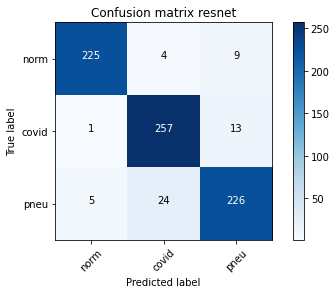

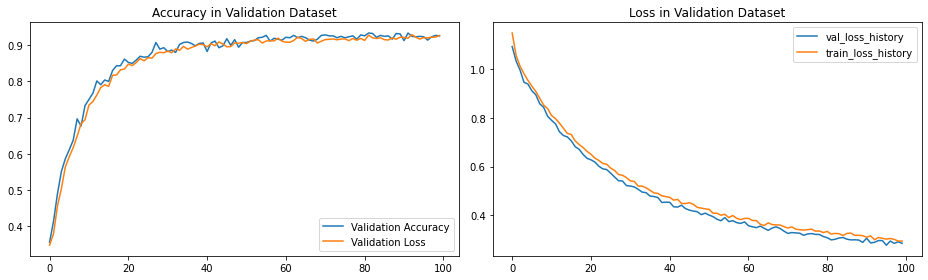


==== END ====
[[228   3   7]
 [  1 252  18]
 [  7  27 221]]

Sensitivity or recall total
0.9175392670157068

Sensitivity or recall per classes
[0.96 0.93 0.87]

Precision
[0.97 0.89 0.9 ]

F1 Score
[0.96 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0874 Acc: 0.3904
val Loss: 1.0729 Acc: 0.4149

Epoch 1/99
----------
train Loss: 1.0418 Acc: 0.4586
val Loss: 1.0166 Acc: 0.4751

Epoch 2/99
----------
train Loss: 1.0108 Acc: 0.5090
val Loss: 0.9860 Acc: 0.5366

Epoch 3/99
----------
train Loss: 0.9758 Acc: 0.5382
val Loss: 0.9567 Acc: 0.5641

Epoch 4/99
----------
train Loss: 0.9465 Acc: 0.5876
val Loss: 0.9334 Acc: 0.5746

Epoch 5/99
----------
train Loss: 0.9214 Acc: 0.6227
val Loss: 0.9171 Acc: 0.6296

Epoch 6/99
--------

train Loss: 0.3052 Acc: 0.9224
val Loss: 0.2842 Acc: 0.9241

Epoch 92/99
----------
train Loss: 0.3056 Acc: 0.9191
val Loss: 0.2797 Acc: 0.9306

Epoch 93/99
----------
train Loss: 0.2944 Acc: 0.9260
val Loss: 0.2797 Acc: 0.9293

Epoch 94/99
----------
train Loss: 0.3022 Acc: 0.9191
val Loss: 0.2779 Acc: 0.9332

Epoch 95/99
----------
train Loss: 0.2962 Acc: 0.9214
val Loss: 0.2845 Acc: 0.9254

Epoch 96/99
----------
train Loss: 0.2944 Acc: 0.9188
val Loss: 0.2729 Acc: 0.9359

Epoch 97/99
----------
train Loss: 0.2897 Acc: 0.9256
val Loss: 0.2775 Acc: 0.9319

Epoch 98/99
----------
train Loss: 0.2874 Acc: 0.9289
val Loss: 0.2834 Acc: 0.9188

Epoch 99/99
----------
train Loss: 0.2872 Acc: 0.9289
val Loss: 0.2746 Acc: 0.9332


##############################
------ Summary ------
model -> resnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 3s
Best val Acc: 0.935864
##############################


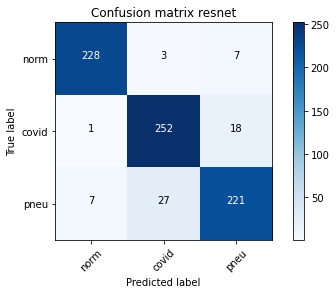

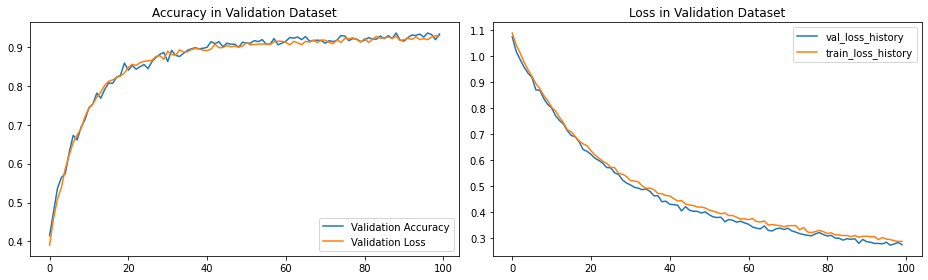


==== END ====
[[228   4   6]
 [  2 252  17]
 [ 11  25 219]]

Sensitivity or recall total
0.9149214659685864

Sensitivity or recall per classes
[0.96 0.93 0.86]

Precision
[0.95 0.9  0.9 ]

F1 Score
[0.95 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4377 Acc: 0.8097
val Loss: 0.3321 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.3416 Acc: 0.8739
val Loss: 0.3403 Acc: 0.8848

Epoch 2/99
----------
train Loss: 0.3108 Acc: 0.8798
val Loss: 0.3170 Acc: 0.8822

Epoch 3/99
----------
train Loss: 0.3001 Acc: 0.8867
val Loss: 0.2813 Acc: 0.9031

Epoch 4/99
----------
train Loss: 0.2778 Acc: 0.8955
val Loss: 0.2453 Acc: 0.9149

Epoch 5/99
----------
train Loss: 0.3032 Acc: 0.8880
val Loss: 0.2695 Acc: 0.8979


train Loss: 0.2356 Acc: 0.9142
val Loss: 0.2591 Acc: 0.9097

Epoch 92/99
----------
train Loss: 0.2314 Acc: 0.9119
val Loss: 0.2262 Acc: 0.9280

Epoch 93/99
----------
train Loss: 0.2576 Acc: 0.9021
val Loss: 0.3418 Acc: 0.8940

Epoch 94/99
----------
train Loss: 0.2575 Acc: 0.8998
val Loss: 0.2506 Acc: 0.9110

Epoch 95/99
----------
train Loss: 0.2692 Acc: 0.9004
val Loss: 0.2599 Acc: 0.9071

Epoch 96/99
----------
train Loss: 0.2254 Acc: 0.9168
val Loss: 0.2011 Acc: 0.9306

Epoch 97/99
----------
train Loss: 0.2282 Acc: 0.9178
val Loss: 0.2303 Acc: 0.9123

Epoch 98/99
----------
train Loss: 0.2230 Acc: 0.9135
val Loss: 0.2724 Acc: 0.9149

Epoch 99/99
----------
train Loss: 0.2637 Acc: 0.9053
val Loss: 0.1976 Acc: 0.9359


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 8s
Best val Acc: 0.935864
##############################


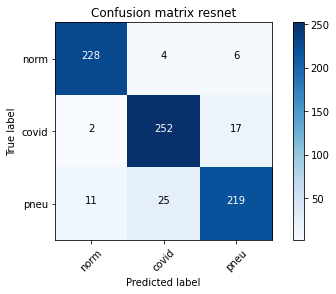

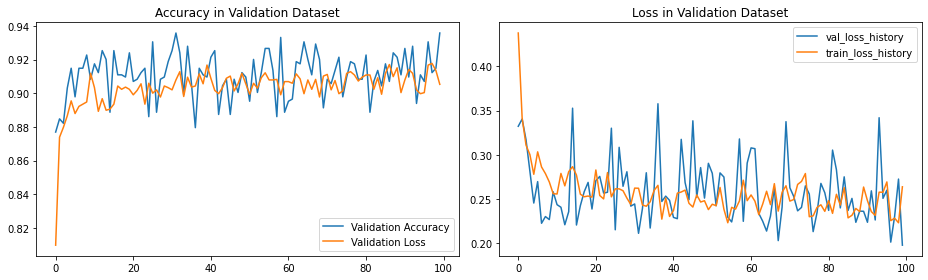


==== END ====
[[230   1   7]
 [  0 260  11]
 [  9  24 222]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.97 0.96 0.87]

Precision
[0.96 0.91 0.93]

F1 Score
[0.96 0.94 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4475 Acc: 0.8218
val Loss: 0.3216 Acc: 0.8861

Epoch 1/99
----------
train Loss: 0.3027 Acc: 0.8909
val Loss: 0.2968 Acc: 0.8953

Epoch 2/99
----------
train Loss: 0.2793 Acc: 0.8929
val Loss: 0.3468 Acc: 0.8770

Epoch 3/99
----------
train Loss: 0.2864 Acc: 0.8883
val Loss: 0.2461 Acc: 0.9005

Epoch 4/99
----------
train Loss: 0.2631 Acc: 0.9004
val Loss: 0.2686 Acc: 0.9018

Epoch 5/99
----------
train Loss: 0.2543 Acc: 0.9053
val Loss: 0.2645 Acc: 0.8940


train Loss: 0.2305 Acc: 0.9066
val Loss: 0.2122 Acc: 0.9372

Epoch 92/99
----------
train Loss: 0.2301 Acc: 0.9155
val Loss: 0.2772 Acc: 0.9097

Epoch 93/99
----------
train Loss: 0.2160 Acc: 0.9224
val Loss: 0.2883 Acc: 0.8992

Epoch 94/99
----------
train Loss: 0.2212 Acc: 0.9139
val Loss: 0.2370 Acc: 0.9215

Epoch 95/99
----------
train Loss: 0.1995 Acc: 0.9253
val Loss: 0.2533 Acc: 0.9031

Epoch 96/99
----------
train Loss: 0.2321 Acc: 0.9103
val Loss: 0.2605 Acc: 0.8966

Epoch 97/99
----------
train Loss: 0.2314 Acc: 0.9132
val Loss: 0.2934 Acc: 0.8979

Epoch 98/99
----------
train Loss: 0.2124 Acc: 0.9243
val Loss: 0.2645 Acc: 0.9123

Epoch 99/99
----------
train Loss: 0.2174 Acc: 0.9217
val Loss: 0.2622 Acc: 0.9254


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 5s
Best val Acc: 0.937173
##############################


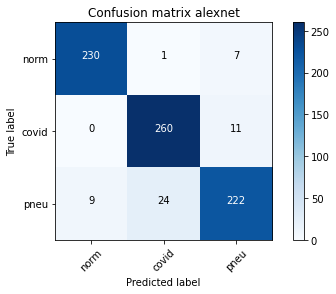

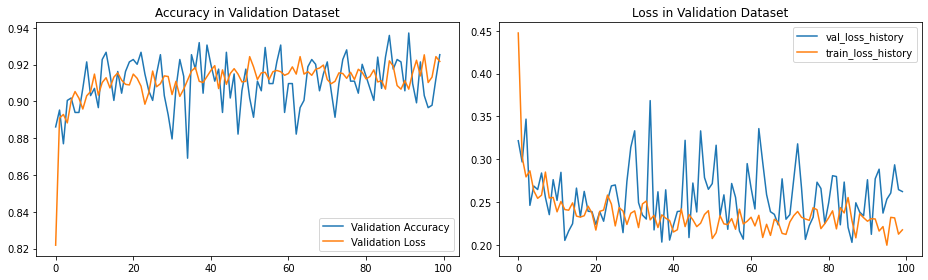


==== END ====
[[223   2  13]
 [  0 257  14]
 [  4  22 229]]

Sensitivity or recall total
0.9280104712041884

Sensitivity or recall per classes
[0.94 0.95 0.9 ]

Precision
[0.98 0.91 0.89]

F1 Score
[0.96 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5165 Acc: 0.8176
val Loss: 0.3678 Acc: 0.8626

Epoch 1/99
----------
train Loss: 0.3164 Acc: 0.8821
val Loss: 0.3102 Acc: 0.8835

Epoch 2/99
----------
train Loss: 0.3106 Acc: 0.8827
val Loss: 0.4915 Acc: 0.7880

Epoch 3/99
----------
train Loss: 0.2866 Acc: 0.8906
val Loss: 0.2631 Acc: 0.9058

Epoch 4/99
----------
train Loss: 0.2876 Acc: 0.8860
val Loss: 0.3055 Acc: 0.8809

Epoch 5/99
----------
train Loss: 0.2821 Acc: 0.8991
val Loss: 0.3010 Acc: 0.8966


train Loss: 0.2396 Acc: 0.9178
val Loss: 0.2650 Acc: 0.9071

Epoch 92/99
----------
train Loss: 0.2414 Acc: 0.9096
val Loss: 0.3465 Acc: 0.8796

Epoch 93/99
----------
train Loss: 0.2521 Acc: 0.9093
val Loss: 0.3526 Acc: 0.8796

Epoch 94/99
----------
train Loss: 0.2573 Acc: 0.9004
val Loss: 0.2145 Acc: 0.9332

Epoch 95/99
----------
train Loss: 0.2538 Acc: 0.9089
val Loss: 0.3197 Acc: 0.8901

Epoch 96/99
----------
train Loss: 0.2505 Acc: 0.9063
val Loss: 0.1977 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.2380 Acc: 0.9112
val Loss: 0.2811 Acc: 0.8979

Epoch 98/99
----------
train Loss: 0.2518 Acc: 0.9106
val Loss: 0.2557 Acc: 0.9084

Epoch 99/99
----------
train Loss: 0.2464 Acc: 0.9109
val Loss: 0.2327 Acc: 0.9254


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 6s
Best val Acc: 0.939791
##############################


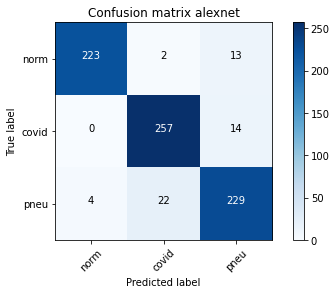

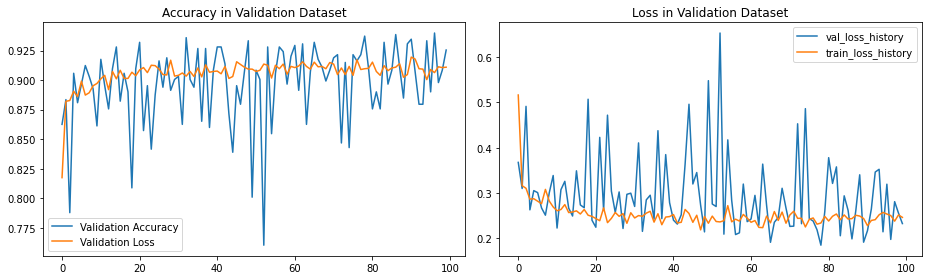


==== END ====
[[230   2   6]
 [  0 256  15]
 [  3  16 236]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.97 0.94 0.93]

Precision
[0.99 0.93 0.92]

F1 Score
[0.98 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4559 Acc: 0.8054
val Loss: 0.2780 Acc: 0.9018

Epoch 1/99
----------
train Loss: 0.3212 Acc: 0.8765
val Loss: 0.2867 Acc: 0.8901

Epoch 2/99
----------
train Loss: 0.3302 Acc: 0.8729
val Loss: 0.2755 Acc: 0.9084

Epoch 3/99
----------
train Loss: 0.3038 Acc: 0.8844
val Loss: 0.2754 Acc: 0.8992

Epoch 4/99
----------
train Loss: 0.2989 Acc: 0.8814
val Loss: 0.2790 Acc: 0.9071

Epoch 5/99
----------
train Loss: 0.2787 Acc: 0.8949
val Loss: 0.2712 Acc: 0.8979

train Loss: 0.2603 Acc: 0.9050
val Loss: 0.2045 Acc: 0.9319

Epoch 92/99
----------
train Loss: 0.2522 Acc: 0.9076
val Loss: 0.2795 Acc: 0.9058

Epoch 93/99
----------
train Loss: 0.2287 Acc: 0.9198
val Loss: 0.2206 Acc: 0.9202

Epoch 94/99
----------
train Loss: 0.2467 Acc: 0.9063
val Loss: 0.3054 Acc: 0.8940

Epoch 95/99
----------
train Loss: 0.2420 Acc: 0.9086
val Loss: 0.2340 Acc: 0.9110

Epoch 96/99
----------
train Loss: 0.2580 Acc: 0.9103
val Loss: 0.2101 Acc: 0.9359

Epoch 97/99
----------
train Loss: 0.2399 Acc: 0.9142
val Loss: 0.2707 Acc: 0.9097

Epoch 98/99
----------
train Loss: 0.2216 Acc: 0.9129
val Loss: 0.2066 Acc: 0.9228

Epoch 99/99
----------
train Loss: 0.2184 Acc: 0.9217
val Loss: 0.2378 Acc: 0.9149


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 8s
Best val Acc: 0.937173
##############################


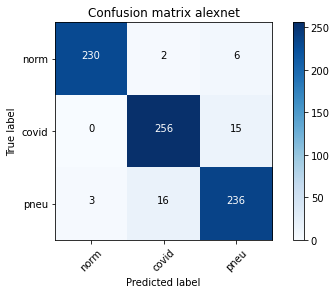

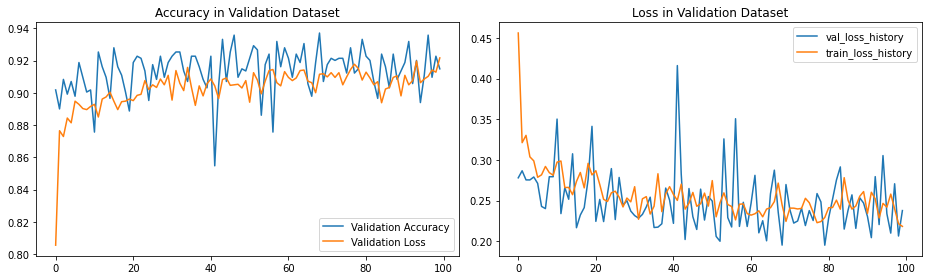


==== END ====
[[227   3   8]
 [  1 255  15]
 [  3  24 228]]

Sensitivity or recall total
0.9293193717277487

Sensitivity or recall per classes
[0.95 0.94 0.89]

Precision
[0.98 0.9  0.91]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4089 Acc: 0.8333
val Loss: 0.2902 Acc: 0.9058

Epoch 1/99
----------
train Loss: 0.2998 Acc: 0.8821
val Loss: 0.2890 Acc: 0.8953

Epoch 2/99
----------
train Loss: 0.2963 Acc: 0.8863
val Loss: 0.2725 Acc: 0.8940

Epoch 3/99
----------
train Loss: 0.3003 Acc: 0.8893
val Loss: 0.3089 Acc: 0.8848

Epoch 4/99
----------
train Loss: 0.2699 Acc: 0.8988
val Loss: 0.2574 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.2691 Acc: 0.8962
val Loss: 0.3142 Acc: 0.8848

train Loss: 0.2418 Acc: 0.9122
val Loss: 0.2249 Acc: 0.9306

Epoch 92/99
----------
train Loss: 0.2055 Acc: 0.9260
val Loss: 0.2672 Acc: 0.9045

Epoch 93/99
----------
train Loss: 0.2201 Acc: 0.9168
val Loss: 0.2868 Acc: 0.9045

Epoch 94/99
----------
train Loss: 0.2267 Acc: 0.9220
val Loss: 0.2414 Acc: 0.9136

Epoch 95/99
----------
train Loss: 0.2310 Acc: 0.9145
val Loss: 0.2598 Acc: 0.9136

Epoch 96/99
----------
train Loss: 0.2103 Acc: 0.9175
val Loss: 0.2227 Acc: 0.9202

Epoch 97/99
----------
train Loss: 0.2286 Acc: 0.9148
val Loss: 0.2623 Acc: 0.8953

Epoch 98/99
----------
train Loss: 0.2377 Acc: 0.9132
val Loss: 0.2049 Acc: 0.9319

Epoch 99/99
----------
train Loss: 0.2433 Acc: 0.9093
val Loss: 0.2588 Acc: 0.9071


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 7s
Best val Acc: 0.937173
##############################


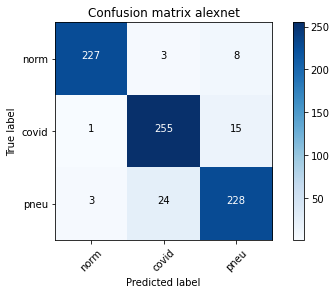

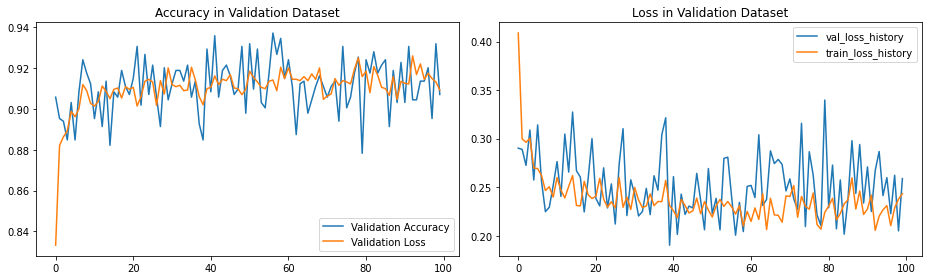


==== END ====
[[226   2  10]
 [  0 254  17]
 [  3  20 232]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.95 0.94 0.91]

Precision
[0.99 0.92 0.9 ]

F1 Score
[0.97 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4833 Acc: 0.8225
val Loss: 0.3104 Acc: 0.8914

Epoch 1/99
----------
train Loss: 0.3022 Acc: 0.8795
val Loss: 0.2857 Acc: 0.8901

Epoch 2/99
----------
train Loss: 0.3233 Acc: 0.8768
val Loss: 0.3358 Acc: 0.8796

Epoch 3/99
----------
train Loss: 0.2890 Acc: 0.8863
val Loss: 0.3904 Acc: 0.8599

Epoch 4/99
----------
train Loss: 0.2896 Acc: 0.8922
val Loss: 0.3891 Acc: 0.8495

Epoch 5/99
----------
train Loss: 0.2643 Acc: 0.8978
val Loss: 0.2824 Acc: 0.8835

train Loss: 0.2252 Acc: 0.9165
val Loss: 0.2675 Acc: 0.9097

Epoch 92/99
----------
train Loss: 0.2492 Acc: 0.9093
val Loss: 0.4339 Acc: 0.8599

Epoch 93/99
----------
train Loss: 0.2356 Acc: 0.9112
val Loss: 0.5309 Acc: 0.8285

Epoch 94/99
----------
train Loss: 0.2362 Acc: 0.9116
val Loss: 0.2698 Acc: 0.9045

Epoch 95/99
----------
train Loss: 0.2268 Acc: 0.9132
val Loss: 0.1792 Acc: 0.9359

Epoch 96/99
----------
train Loss: 0.2312 Acc: 0.9125
val Loss: 0.2386 Acc: 0.9241

Epoch 97/99
----------
train Loss: 0.2453 Acc: 0.9083
val Loss: 0.2647 Acc: 0.9136

Epoch 98/99
----------
train Loss: 0.2410 Acc: 0.9103
val Loss: 0.2319 Acc: 0.9215

Epoch 99/99
----------
train Loss: 0.2402 Acc: 0.9122
val Loss: 0.3590 Acc: 0.8783


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 4s
Best val Acc: 0.938482
##############################


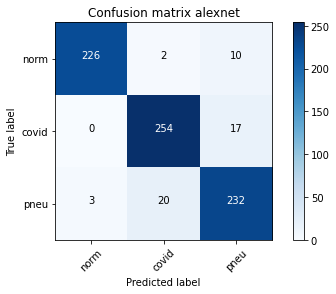

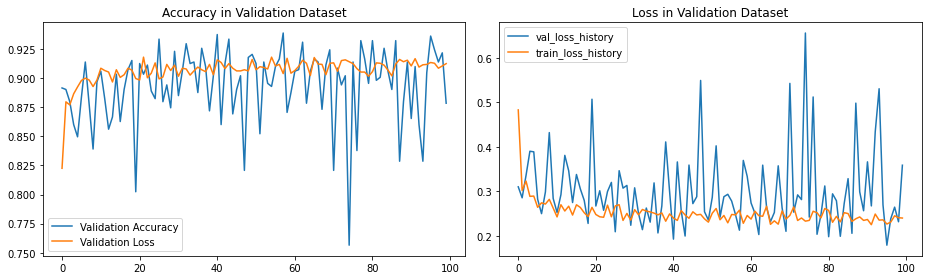


==== END ====
[[233   2   3]
 [  0 261  10]
 [  6  38 211]]

Sensitivity or recall total
0.9227748691099477

Sensitivity or recall per classes
[0.98 0.96 0.83]

Precision
[0.97 0.87 0.94]

F1 Score
[0.98 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4549 Acc: 0.8110
val Loss: 0.4126 Acc: 0.8482

Epoch 1/99
----------
train Loss: 0.3435 Acc: 0.8687
val Loss: 0.4250 Acc: 0.8508

Epoch 2/99
----------
train Loss: 0.3099 Acc: 0.8782
val Loss: 0.2712 Acc: 0.9005

Epoch 3/99
----------
train Loss: 0.3155 Acc: 0.8821
val Loss: 0.2347 Acc: 0.9175

Epoch 4/99
----------
train Loss: 0.2976 Acc: 0.8877
val Loss: 0.2583 Acc: 0.9136

Epoch 5/99
----------
train Loss: 0.3207 Acc: 0.8752
val Loss: 0.2373 Acc: 0.9149

train Loss: 0.2239 Acc: 0.9161
val Loss: 0.2196 Acc: 0.9267

Epoch 92/99
----------
train Loss: 0.2365 Acc: 0.9106
val Loss: 0.2659 Acc: 0.9018

Epoch 93/99
----------
train Loss: 0.2445 Acc: 0.9073
val Loss: 0.2617 Acc: 0.9058

Epoch 94/99
----------
train Loss: 0.2319 Acc: 0.9109
val Loss: 0.2179 Acc: 0.9267

Epoch 95/99
----------
train Loss: 0.2176 Acc: 0.9201
val Loss: 0.2574 Acc: 0.9175

Epoch 96/99
----------
train Loss: 0.2505 Acc: 0.9047
val Loss: 0.2839 Acc: 0.9031

Epoch 97/99
----------
train Loss: 0.2321 Acc: 0.9109
val Loss: 0.2226 Acc: 0.9202

Epoch 98/99
----------
train Loss: 0.2422 Acc: 0.9119
val Loss: 0.2659 Acc: 0.9005

Epoch 99/99
----------
train Loss: 0.2429 Acc: 0.9076
val Loss: 0.2285 Acc: 0.9241


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 4s
Best val Acc: 0.933246
##############################


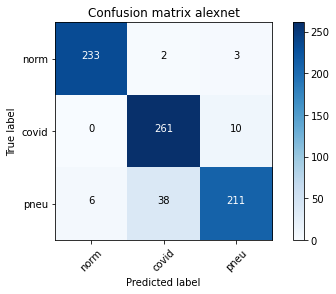

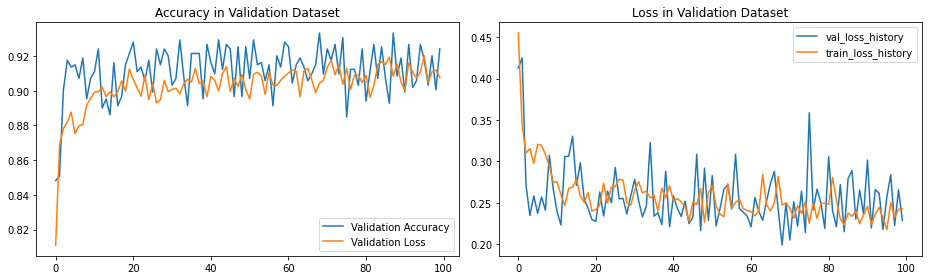


==== END ====
[[224   4  10]
 [  0 259  12]
 [  2  25 228]]

Sensitivity or recall total
0.930628272251309

Sensitivity or recall per classes
[0.94 0.96 0.89]

Precision
[0.99 0.9  0.91]

F1 Score
[0.97 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4524 Acc: 0.8084
val Loss: 0.3101 Acc: 0.8914

Epoch 1/99
----------
train Loss: 0.2997 Acc: 0.8863
val Loss: 0.2837 Acc: 0.8979

Epoch 2/99
----------
train Loss: 0.2812 Acc: 0.8949
val Loss: 0.2912 Acc: 0.8914

Epoch 3/99
----------
train Loss: 0.2753 Acc: 0.8945
val Loss: 0.2516 Acc: 0.9084

Epoch 4/99
----------
train Loss: 0.2575 Acc: 0.9011
val Loss: 0.2568 Acc: 0.9084

Epoch 5/99
----------
train Loss: 0.2502 Acc: 0.9021
val Loss: 0.2739 Acc: 0.9097


train Loss: 0.2281 Acc: 0.9158
val Loss: 0.2493 Acc: 0.9175

Epoch 92/99
----------
train Loss: 0.2013 Acc: 0.9184
val Loss: 0.2669 Acc: 0.9058

Epoch 93/99
----------
train Loss: 0.2466 Acc: 0.9080
val Loss: 0.2224 Acc: 0.9123

Epoch 94/99
----------
train Loss: 0.2394 Acc: 0.9122
val Loss: 0.2068 Acc: 0.9293

Epoch 95/99
----------
train Loss: 0.2181 Acc: 0.9188
val Loss: 0.2255 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.2277 Acc: 0.9109
val Loss: 0.2388 Acc: 0.9267

Epoch 97/99
----------
train Loss: 0.2284 Acc: 0.9168
val Loss: 0.2490 Acc: 0.9058

Epoch 98/99
----------
train Loss: 0.2379 Acc: 0.9168
val Loss: 0.2464 Acc: 0.9149

Epoch 99/99
----------
train Loss: 0.2405 Acc: 0.9106
val Loss: 0.2591 Acc: 0.9123


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 6s
Best val Acc: 0.937173
##############################


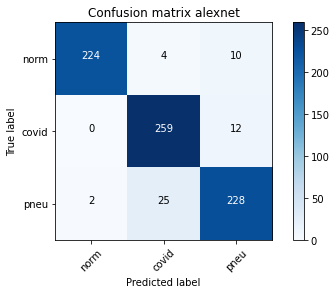

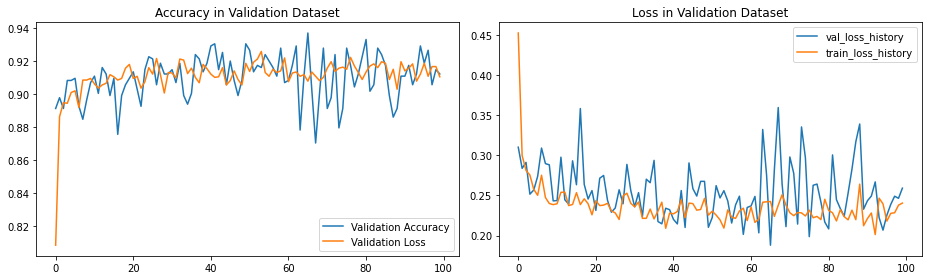


==== END ====
[[229   1   8]
 [  0 258  13]
 [  4  20 231]]

Sensitivity or recall total
0.9397905759162304

Sensitivity or recall per classes
[0.96 0.95 0.91]

Precision
[0.98 0.92 0.92]

F1 Score
[0.97 0.94 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5482 Acc: 0.8143
val Loss: 0.4229 Acc: 0.8312

Epoch 1/99
----------
train Loss: 0.3047 Acc: 0.8834
val Loss: 0.4256 Acc: 0.8390

Epoch 2/99
----------
train Loss: 0.3010 Acc: 0.8811
val Loss: 0.4827 Acc: 0.8128

Epoch 3/99
----------
train Loss: 0.2844 Acc: 0.8909
val Loss: 0.2880 Acc: 0.8848

Epoch 4/99
----------
train Loss: 0.2982 Acc: 0.8873
val Loss: 0.2357 Acc: 0.9162

Epoch 5/99
----------
train Loss: 0.2867 Acc: 0.8913
val Loss: 0.3620 Acc: 0.8639

train Loss: 0.2389 Acc: 0.9145
val Loss: 0.2516 Acc: 0.9136

Epoch 92/99
----------
train Loss: 0.2444 Acc: 0.9083
val Loss: 0.3595 Acc: 0.8809

Epoch 93/99
----------
train Loss: 0.2432 Acc: 0.9086
val Loss: 0.1899 Acc: 0.9385

Epoch 94/99
----------
train Loss: 0.2457 Acc: 0.9152
val Loss: 0.3573 Acc: 0.8809

Epoch 95/99
----------
train Loss: 0.2474 Acc: 0.9089
val Loss: 0.2225 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.2399 Acc: 0.9103
val Loss: 0.2518 Acc: 0.9084

Epoch 97/99
----------
train Loss: 0.2097 Acc: 0.9207
val Loss: 0.2446 Acc: 0.9267

Epoch 98/99
----------
train Loss: 0.2332 Acc: 0.9139
val Loss: 0.2119 Acc: 0.9254

Epoch 99/99
----------
train Loss: 0.2347 Acc: 0.9178
val Loss: 0.2330 Acc: 0.9254


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 3s
Best val Acc: 0.938482
##############################


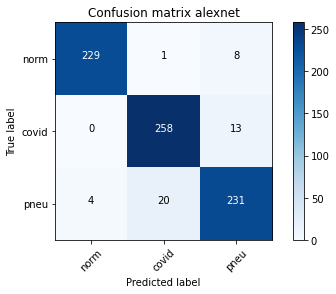

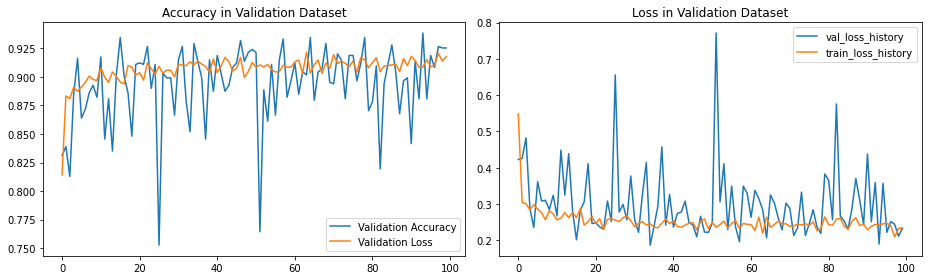


==== END ====
[[232   3   3]
 [  1 256  14]
 [  7  21 227]]

Sensitivity or recall total
0.9358638743455497

Sensitivity or recall per classes
[0.97 0.94 0.89]

Precision
[0.97 0.91 0.93]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6761 Acc: 0.7317
val Loss: 0.4615 Acc: 0.8429

Epoch 1/99
----------
train Loss: 0.4422 Acc: 0.8425
val Loss: 0.3916 Acc: 0.8665

Epoch 2/99
----------
train Loss: 0.4082 Acc: 0.8549
val Loss: 0.3844 Acc: 0.8678

Epoch 3/99
----------
train Loss: 0.3727 Acc: 0.8651
val Loss: 0.3341 Acc: 0.8874

Epoch 4/99
----------
train Loss: 0.3498 Acc: 0.8716
val Loss: 0.3279 Acc: 0.8874

Epoch 5/99
----------
train Loss: 0.3409 Acc: 0.8706
val Loss: 0.3175 Acc: 0.8835

train Loss: 0.2394 Acc: 0.9070
val Loss: 0.2293 Acc: 0.9175

Epoch 92/99
----------
train Loss: 0.2372 Acc: 0.9106
val Loss: 0.2448 Acc: 0.9071

Epoch 93/99
----------
train Loss: 0.2366 Acc: 0.9129
val Loss: 0.2349 Acc: 0.9188

Epoch 94/99
----------
train Loss: 0.2584 Acc: 0.8981
val Loss: 0.2309 Acc: 0.9228

Epoch 95/99
----------
train Loss: 0.2453 Acc: 0.9024
val Loss: 0.2263 Acc: 0.9215

Epoch 96/99
----------
train Loss: 0.2357 Acc: 0.9112
val Loss: 0.2249 Acc: 0.9162

Epoch 97/99
----------
train Loss: 0.2417 Acc: 0.9070
val Loss: 0.2293 Acc: 0.9202

Epoch 98/99
----------
train Loss: 0.2530 Acc: 0.9076
val Loss: 0.2214 Acc: 0.9228

Epoch 99/99
----------
train Loss: 0.2371 Acc: 0.9165
val Loss: 0.2295 Acc: 0.9175


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 3s
Best val Acc: 0.926702
##############################


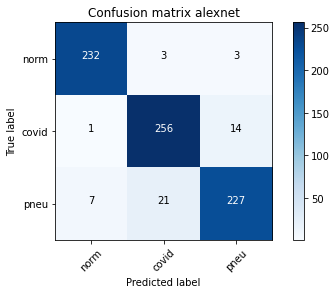

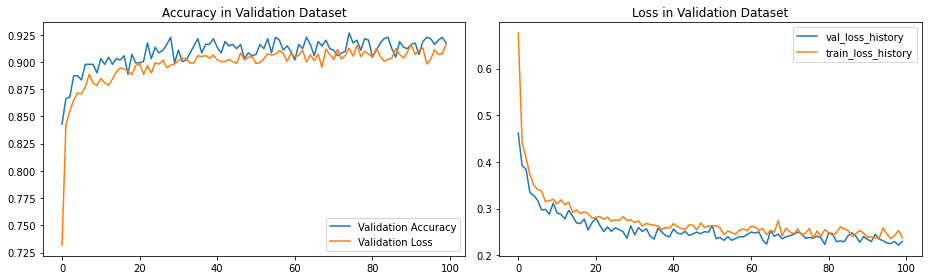


==== END ====
[[223   4  11]
 [  0 255  16]
 [  5  31 219]]

Sensitivity or recall total
0.912303664921466

Sensitivity or recall per classes
[0.94 0.94 0.86]

Precision
[0.98 0.88 0.89]

F1 Score
[0.96 0.91 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7650 Acc: 0.6767
val Loss: 0.5679 Acc: 0.8259

Epoch 1/99
----------
train Loss: 0.5038 Acc: 0.8320
val Loss: 0.4457 Acc: 0.8534

Epoch 2/99
----------
train Loss: 0.4200 Acc: 0.8660
val Loss: 0.4114 Acc: 0.8613

Epoch 3/99
----------
train Loss: 0.3833 Acc: 0.8644
val Loss: 0.3619 Acc: 0.8730

Epoch 4/99
----------
train Loss: 0.3615 Acc: 0.8749
val Loss: 0.3520 Acc: 0.8757

Epoch 5/99
----------
train Loss: 0.3414 Acc: 0.8791
val Loss: 0.3277 Acc: 0.8914


train Loss: 0.2208 Acc: 0.9158
val Loss: 0.2435 Acc: 0.9110

Epoch 92/99
----------
train Loss: 0.2260 Acc: 0.9142
val Loss: 0.2539 Acc: 0.9058

Epoch 93/99
----------
train Loss: 0.2182 Acc: 0.9175
val Loss: 0.2267 Acc: 0.9188

Epoch 94/99
----------
train Loss: 0.2082 Acc: 0.9204
val Loss: 0.2286 Acc: 0.9071

Epoch 95/99
----------
train Loss: 0.2085 Acc: 0.9198
val Loss: 0.2275 Acc: 0.9123

Epoch 96/99
----------
train Loss: 0.2139 Acc: 0.9188
val Loss: 0.2498 Acc: 0.9110

Epoch 97/99
----------
train Loss: 0.2142 Acc: 0.9198
val Loss: 0.2297 Acc: 0.9162

Epoch 98/99
----------
train Loss: 0.2149 Acc: 0.9204
val Loss: 0.2377 Acc: 0.9097

Epoch 99/99
----------
train Loss: 0.2272 Acc: 0.9103
val Loss: 0.2448 Acc: 0.9084


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 26m 59s
Best val Acc: 0.928010
##############################


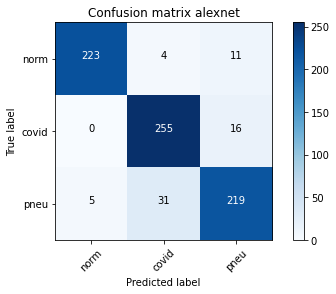

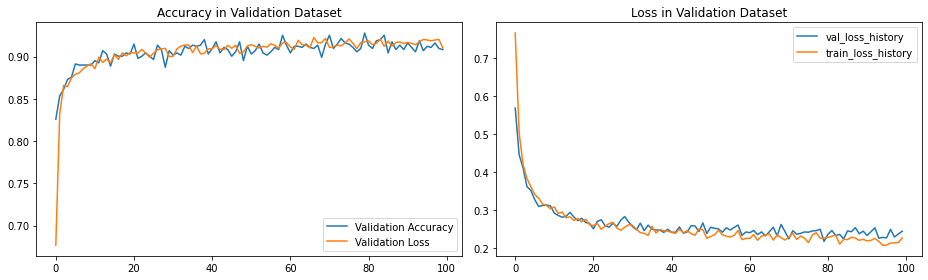


==== END ====
[[214   4  20]
 [  0 251  20]
 [  3  22 230]]

Sensitivity or recall total
0.9096858638743456

Sensitivity or recall per classes
[0.9  0.93 0.9 ]

Precision
[0.99 0.91 0.85]

F1 Score
[0.94 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5334 Acc: 0.8045
val Loss: 0.4154 Acc: 0.8743

Epoch 1/99
----------
train Loss: 0.3972 Acc: 0.8673
val Loss: 0.3756 Acc: 0.8783

Epoch 2/99
----------
train Loss: 0.3671 Acc: 0.8768
val Loss: 0.3428 Acc: 0.8874

Epoch 3/99
----------
train Loss: 0.3472 Acc: 0.8745
val Loss: 0.3292 Acc: 0.8874

Epoch 4/99
----------
train Loss: 0.3284 Acc: 0.8775
val Loss: 0.3142 Acc: 0.8927

Epoch 5/99
----------
train Loss: 0.3230 Acc: 0.8827
val Loss: 0.3092 Acc: 0.8901

train Loss: 0.2139 Acc: 0.9227
val Loss: 0.2227 Acc: 0.9175

Epoch 92/99
----------
train Loss: 0.2128 Acc: 0.9198
val Loss: 0.2351 Acc: 0.9058

Epoch 93/99
----------
train Loss: 0.2155 Acc: 0.9217
val Loss: 0.2676 Acc: 0.8966

Epoch 94/99
----------
train Loss: 0.2109 Acc: 0.9201
val Loss: 0.2576 Acc: 0.9018

Epoch 95/99
----------
train Loss: 0.2312 Acc: 0.9119
val Loss: 0.2394 Acc: 0.9149

Epoch 96/99
----------
train Loss: 0.2044 Acc: 0.9230
val Loss: 0.2338 Acc: 0.9202

Epoch 97/99
----------
train Loss: 0.2159 Acc: 0.9204
val Loss: 0.2165 Acc: 0.9175

Epoch 98/99
----------
train Loss: 0.2207 Acc: 0.9142
val Loss: 0.2355 Acc: 0.9110

Epoch 99/99
----------
train Loss: 0.2181 Acc: 0.9230
val Loss: 0.2361 Acc: 0.9149


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 1s
Best val Acc: 0.924084
##############################


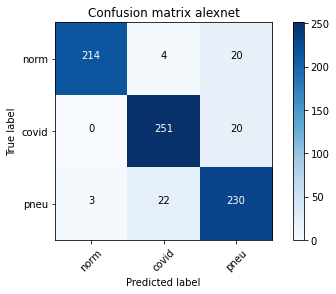

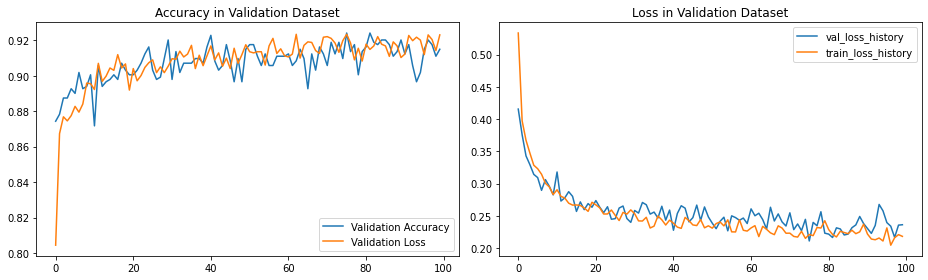


==== END ====
[[220   2  16]
 [  0 257  14]
 [  3  28 224]]

Sensitivity or recall total
0.9175392670157068

Sensitivity or recall per classes
[0.92 0.95 0.88]

Precision
[0.99 0.9  0.88]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6499 Acc: 0.7511
val Loss: 0.4430 Acc: 0.8547

Epoch 1/99
----------
train Loss: 0.4368 Acc: 0.8483
val Loss: 0.3868 Acc: 0.8678

Epoch 2/99
----------
train Loss: 0.3924 Acc: 0.8703
val Loss: 0.3499 Acc: 0.8809

Epoch 3/99
----------
train Loss: 0.3694 Acc: 0.8654
val Loss: 0.3316 Acc: 0.8796

Epoch 4/99
----------
train Loss: 0.3537 Acc: 0.8696
val Loss: 0.3382 Acc: 0.8717

Epoch 5/99
----------
train Loss: 0.3458 Acc: 0.8716
val Loss: 0.3083 Acc: 0.890

train Loss: 0.2534 Acc: 0.9021
val Loss: 0.2388 Acc: 0.9058

Epoch 92/99
----------
train Loss: 0.2465 Acc: 0.9093
val Loss: 0.2307 Acc: 0.9149

Epoch 93/99
----------
train Loss: 0.2458 Acc: 0.9086
val Loss: 0.2441 Acc: 0.9149

Epoch 94/99
----------
train Loss: 0.2460 Acc: 0.9103
val Loss: 0.2442 Acc: 0.9123

Epoch 95/99
----------
train Loss: 0.2488 Acc: 0.9050
val Loss: 0.2381 Acc: 0.9071

Epoch 96/99
----------
train Loss: 0.2430 Acc: 0.9096
val Loss: 0.2314 Acc: 0.9188

Epoch 97/99
----------
train Loss: 0.2534 Acc: 0.9089
val Loss: 0.2350 Acc: 0.9162

Epoch 98/99
----------
train Loss: 0.2501 Acc: 0.9129
val Loss: 0.2372 Acc: 0.9110

Epoch 99/99
----------
train Loss: 0.2491 Acc: 0.9060
val Loss: 0.2346 Acc: 0.9110


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 4s
Best val Acc: 0.925393
##############################


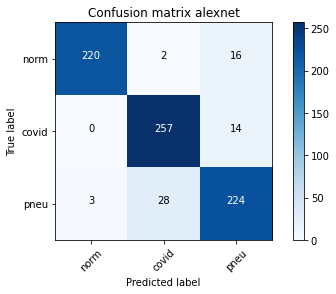

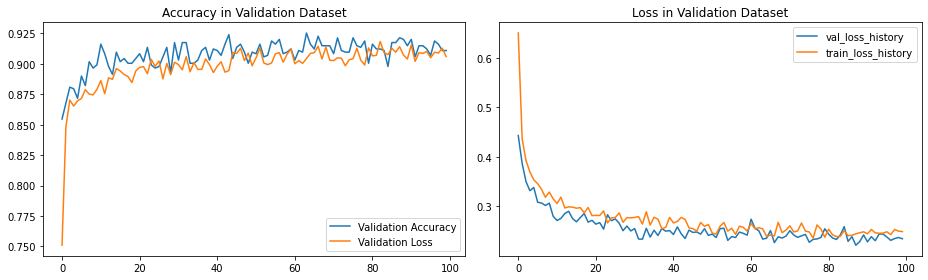


==== END ====
[[219   4  15]
 [  1 248  22]
 [  4  19 232]]

Sensitivity or recall total
0.9149214659685864

Sensitivity or recall per classes
[0.92 0.92 0.91]

Precision
[0.98 0.92 0.86]

F1 Score
[0.95 0.92 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7462 Acc: 0.7059
val Loss: 0.5509 Acc: 0.8364

Epoch 1/99
----------
train Loss: 0.4973 Acc: 0.8398
val Loss: 0.4317 Acc: 0.8613

Epoch 2/99
----------
train Loss: 0.4171 Acc: 0.8605
val Loss: 0.3925 Acc: 0.8613

Epoch 3/99
----------
train Loss: 0.3872 Acc: 0.8595
val Loss: 0.3686 Acc: 0.8730

Epoch 4/99
----------
train Loss: 0.3629 Acc: 0.8755
val Loss: 0.3447 Acc: 0.8848

Epoch 5/99
----------
train Loss: 0.3439 Acc: 0.8768
val Loss: 0.3301 Acc: 0.887

train Loss: 0.2201 Acc: 0.9165
val Loss: 0.2312 Acc: 0.9123

Epoch 92/99
----------
train Loss: 0.2210 Acc: 0.9181
val Loss: 0.2344 Acc: 0.9162

Epoch 93/99
----------
train Loss: 0.2242 Acc: 0.9214
val Loss: 0.2341 Acc: 0.9084

Epoch 94/99
----------
train Loss: 0.2233 Acc: 0.9168
val Loss: 0.2328 Acc: 0.9123

Epoch 95/99
----------
train Loss: 0.2248 Acc: 0.9139
val Loss: 0.2422 Acc: 0.9110

Epoch 96/99
----------
train Loss: 0.2265 Acc: 0.9178
val Loss: 0.2325 Acc: 0.9162

Epoch 97/99
----------
train Loss: 0.2225 Acc: 0.9158
val Loss: 0.2386 Acc: 0.9110

Epoch 98/99
----------
train Loss: 0.2191 Acc: 0.9224
val Loss: 0.2237 Acc: 0.9110

Epoch 99/99
----------
train Loss: 0.2178 Acc: 0.9211
val Loss: 0.2588 Acc: 0.9045


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 12s
Best val Acc: 0.925393
##############################


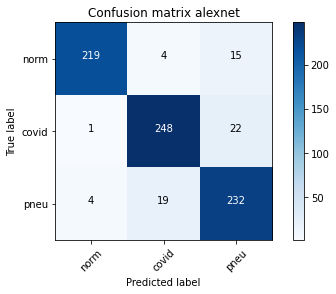

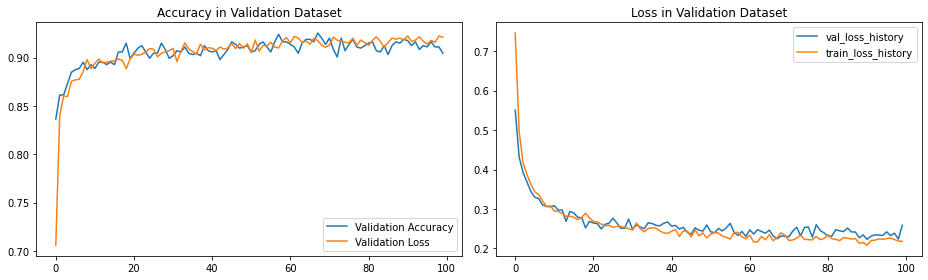


==== END ====
[[219   5  14]
 [  0 255  16]
 [  3  26 226]]

Sensitivity or recall total
0.9162303664921466

Sensitivity or recall per classes
[0.92 0.94 0.89]

Precision
[0.99 0.89 0.88]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5916 Acc: 0.7861
val Loss: 0.4683 Acc: 0.8442

Epoch 1/99
----------
train Loss: 0.4197 Acc: 0.8631
val Loss: 0.3967 Acc: 0.8652

Epoch 2/99
----------
train Loss: 0.3781 Acc: 0.8736
val Loss: 0.3518 Acc: 0.8730

Epoch 3/99
----------
train Loss: 0.3514 Acc: 0.8775
val Loss: 0.3334 Acc: 0.8743

Epoch 4/99
----------
train Loss: 0.3392 Acc: 0.8778
val Loss: 0.3308 Acc: 0.8783

Epoch 5/99
----------
train Loss: 0.3255 Acc: 0.8847
val Loss: 0.3211 Acc: 0.895

train Loss: 0.2262 Acc: 0.9122
val Loss: 0.2380 Acc: 0.9097

Epoch 92/99
----------
train Loss: 0.2152 Acc: 0.9227
val Loss: 0.2562 Acc: 0.9031

Epoch 93/99
----------
train Loss: 0.2180 Acc: 0.9191
val Loss: 0.2569 Acc: 0.9071

Epoch 94/99
----------
train Loss: 0.2253 Acc: 0.9148
val Loss: 0.2347 Acc: 0.9149

Epoch 95/99
----------
train Loss: 0.2217 Acc: 0.9119
val Loss: 0.2427 Acc: 0.9123

Epoch 96/99
----------
train Loss: 0.2146 Acc: 0.9217
val Loss: 0.2372 Acc: 0.9136

Epoch 97/99
----------
train Loss: 0.2209 Acc: 0.9165
val Loss: 0.2261 Acc: 0.9175

Epoch 98/99
----------
train Loss: 0.2192 Acc: 0.9178
val Loss: 0.2314 Acc: 0.9136

Epoch 99/99
----------
train Loss: 0.2308 Acc: 0.9181
val Loss: 0.2297 Acc: 0.9123


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 3s
Best val Acc: 0.926702
##############################


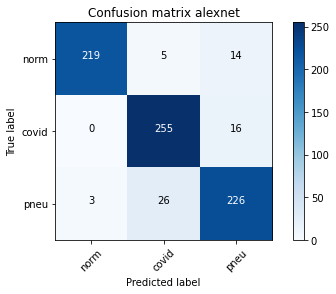

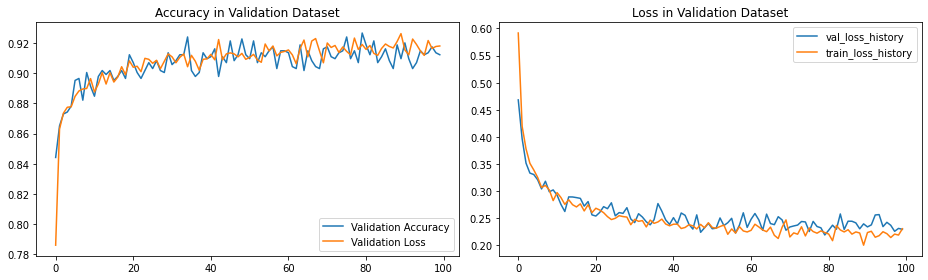


==== END ====
[[220   2  16]
 [  0 255  16]
 [  4  26 225]]

Sensitivity or recall total
0.9162303664921466

Sensitivity or recall per classes
[0.92 0.94 0.88]

Precision
[0.98 0.9  0.88]

F1 Score
[0.95 0.92 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6872 Acc: 0.7170
val Loss: 0.4492 Acc: 0.8613

Epoch 1/99
----------
train Loss: 0.4467 Acc: 0.8425
val Loss: 0.4008 Acc: 0.8599

Epoch 2/99
----------
train Loss: 0.3961 Acc: 0.8618
val Loss: 0.3566 Acc: 0.8717

Epoch 3/99
----------
train Loss: 0.3713 Acc: 0.8618
val Loss: 0.3515 Acc: 0.8757

Epoch 4/99
----------
train Loss: 0.3564 Acc: 0.8706
val Loss: 0.3159 Acc: 0.8953

Epoch 5/99
----------
train Loss: 0.3502 Acc: 0.8759
val Loss: 0.2971 Acc: 0.897

train Loss: 0.2166 Acc: 0.9230
val Loss: 0.2341 Acc: 0.9058

Epoch 92/99
----------
train Loss: 0.2551 Acc: 0.9073
val Loss: 0.2435 Acc: 0.9123

Epoch 93/99
----------
train Loss: 0.2439 Acc: 0.9109
val Loss: 0.2301 Acc: 0.9149

Epoch 94/99
----------
train Loss: 0.2399 Acc: 0.9155
val Loss: 0.2354 Acc: 0.9228

Epoch 95/99
----------
train Loss: 0.2447 Acc: 0.9086
val Loss: 0.2265 Acc: 0.9149

Epoch 96/99
----------
train Loss: 0.2506 Acc: 0.9063
val Loss: 0.2203 Acc: 0.9110

Epoch 97/99
----------
train Loss: 0.2472 Acc: 0.9047
val Loss: 0.2329 Acc: 0.9228

Epoch 98/99
----------
train Loss: 0.2404 Acc: 0.9063
val Loss: 0.2197 Acc: 0.9162

Epoch 99/99
----------
train Loss: 0.2363 Acc: 0.9125
val Loss: 0.2255 Acc: 0.9202


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 5s
Best val Acc: 0.929319
##############################


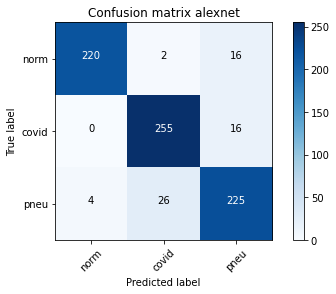

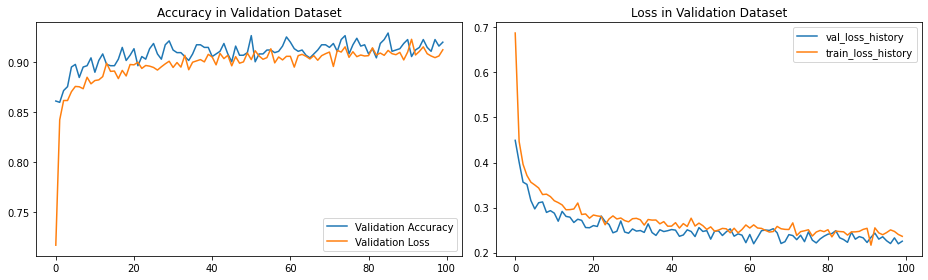


==== END ====
[[216   4  18]
 [  0 260  11]
 [  5  32 218]]

Sensitivity or recall total
0.9083769633507853

Sensitivity or recall per classes
[0.91 0.96 0.85]

Precision
[0.98 0.88 0.88]

F1 Score
[0.94 0.92 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7126 Acc: 0.7301
val Loss: 0.5445 Acc: 0.8416

Epoch 1/99
----------
train Loss: 0.4814 Acc: 0.8382
val Loss: 0.4569 Acc: 0.8469

Epoch 2/99
----------
train Loss: 0.4183 Acc: 0.8523
val Loss: 0.3919 Acc: 0.8599

Epoch 3/99
----------
train Loss: 0.3761 Acc: 0.8693
val Loss: 0.3612 Acc: 0.8639

Epoch 4/99
----------
train Loss: 0.3603 Acc: 0.8703
val Loss: 0.3330 Acc: 0.8914

Epoch 5/99
----------
train Loss: 0.3373 Acc: 0.8811
val Loss: 0.3330 Acc: 0.871

train Loss: 0.2282 Acc: 0.9135
val Loss: 0.2355 Acc: 0.9188

Epoch 92/99
----------
train Loss: 0.2212 Acc: 0.9152
val Loss: 0.2259 Acc: 0.9188

Epoch 93/99
----------
train Loss: 0.2181 Acc: 0.9112
val Loss: 0.2332 Acc: 0.9188

Epoch 94/99
----------
train Loss: 0.2279 Acc: 0.9145
val Loss: 0.2201 Acc: 0.9215

Epoch 95/99
----------
train Loss: 0.2342 Acc: 0.9116
val Loss: 0.2440 Acc: 0.9084

Epoch 96/99
----------
train Loss: 0.2259 Acc: 0.9152
val Loss: 0.2405 Acc: 0.9175

Epoch 97/99
----------
train Loss: 0.2074 Acc: 0.9247
val Loss: 0.2172 Acc: 0.9228

Epoch 98/99
----------
train Loss: 0.2220 Acc: 0.9194
val Loss: 0.2504 Acc: 0.9018

Epoch 99/99
----------
train Loss: 0.2200 Acc: 0.9142
val Loss: 0.2259 Acc: 0.9202


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 4s
Best val Acc: 0.924084
##############################


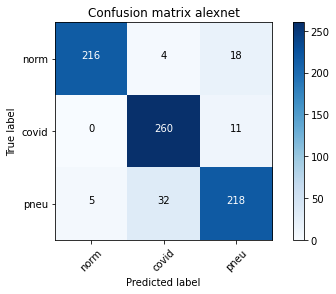

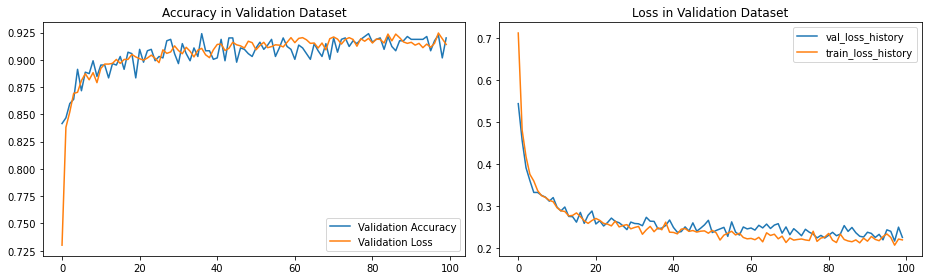


==== END ====
[[221   5  12]
 [  0 254  17]
 [  5  26 224]]

Sensitivity or recall total
0.9149214659685864

Sensitivity or recall per classes
[0.93 0.94 0.88]

Precision
[0.98 0.89 0.89]

F1 Score
[0.95 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5576 Acc: 0.8005
val Loss: 0.4269 Acc: 0.8652

Epoch 1/99
----------
train Loss: 0.4060 Acc: 0.8618
val Loss: 0.3783 Acc: 0.8730

Epoch 2/99
----------
train Loss: 0.3677 Acc: 0.8716
val Loss: 0.3446 Acc: 0.8743

Epoch 3/99
----------
train Loss: 0.3538 Acc: 0.8723
val Loss: 0.3285 Acc: 0.8783

Epoch 4/99
----------
train Loss: 0.3229 Acc: 0.8935
val Loss: 0.3358 Acc: 0.8717

Epoch 5/99
----------
train Loss: 0.3279 Acc: 0.8840
val Loss: 0.3101 Acc: 0.886

train Loss: 0.2170 Acc: 0.9175
val Loss: 0.2119 Acc: 0.9228

Epoch 92/99
----------
train Loss: 0.2133 Acc: 0.9224
val Loss: 0.2260 Acc: 0.9215

Epoch 93/99
----------
train Loss: 0.2279 Acc: 0.9135
val Loss: 0.2227 Acc: 0.9175

Epoch 94/99
----------
train Loss: 0.2274 Acc: 0.9070
val Loss: 0.2228 Acc: 0.9175

Epoch 95/99
----------
train Loss: 0.2206 Acc: 0.9217
val Loss: 0.2293 Acc: 0.9241

Epoch 96/99
----------
train Loss: 0.2265 Acc: 0.9178
val Loss: 0.2435 Acc: 0.9175

Epoch 97/99
----------
train Loss: 0.2084 Acc: 0.9256
val Loss: 0.2436 Acc: 0.9018

Epoch 98/99
----------
train Loss: 0.2207 Acc: 0.9194
val Loss: 0.2476 Acc: 0.9097

Epoch 99/99
----------
train Loss: 0.2232 Acc: 0.9214
val Loss: 0.2247 Acc: 0.9162


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 2s
Best val Acc: 0.926702
##############################


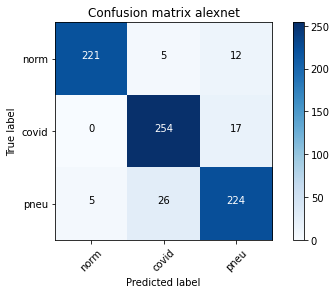

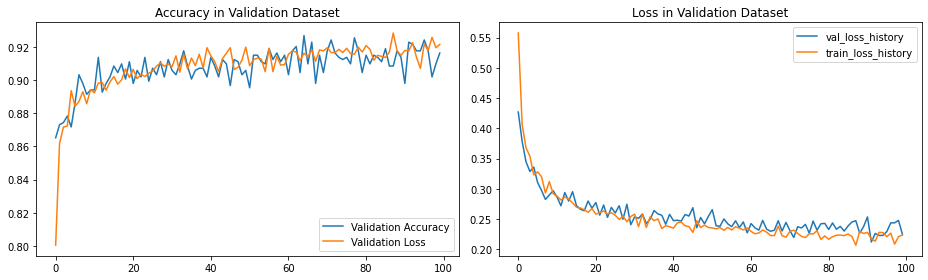


==== END ====
[[219   5  14]
 [  0 258  13]
 [  4  24 227]]

Sensitivity or recall total
0.9214659685863874

Sensitivity or recall per classes
[0.92 0.95 0.89]

Precision
[0.98 0.9  0.89]

F1 Score
[0.95 0.92 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0641 Acc: 0.4261
val Loss: 0.8974 Acc: 0.6440

Epoch 1/99
----------
train Loss: 0.8454 Acc: 0.6738
val Loss: 0.7532 Acc: 0.7369

Epoch 2/99
----------
train Loss: 0.7282 Acc: 0.7517
val Loss: 0.6624 Acc: 0.7906

Epoch 3/99
----------
train Loss: 0.6610 Acc: 0.7750
val Loss: 0.6190 Acc: 0.7971

Epoch 4/99
----------
train Loss: 0.6191 Acc: 0.7920
val Loss: 0.5671 Acc: 0.8259

Epoch 5/99
----------
train Loss: 0.5902 Acc: 0.8084
val Loss: 0.5460 Acc: 0.8338


train Loss: 0.3122 Acc: 0.8850
val Loss: 0.3077 Acc: 0.8809

Epoch 92/99
----------
train Loss: 0.3182 Acc: 0.8877
val Loss: 0.2877 Acc: 0.8979

Epoch 93/99
----------
train Loss: 0.3182 Acc: 0.8831
val Loss: 0.2952 Acc: 0.9031

Epoch 94/99
----------
train Loss: 0.3127 Acc: 0.8791
val Loss: 0.2929 Acc: 0.8953

Epoch 95/99
----------
train Loss: 0.3178 Acc: 0.8827
val Loss: 0.2843 Acc: 0.9045

Epoch 96/99
----------
train Loss: 0.3210 Acc: 0.8824
val Loss: 0.2842 Acc: 0.8927

Epoch 97/99
----------
train Loss: 0.3221 Acc: 0.8857
val Loss: 0.2822 Acc: 0.9005

Epoch 98/99
----------
train Loss: 0.3125 Acc: 0.8844
val Loss: 0.2881 Acc: 0.8992

Epoch 99/99
----------
train Loss: 0.3106 Acc: 0.8854
val Loss: 0.2964 Acc: 0.8940


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 10s
Best val Acc: 0.904450
##############################


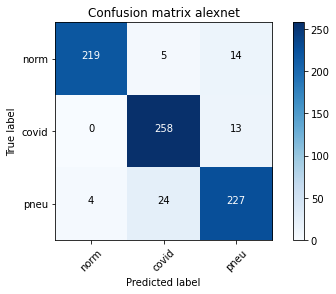

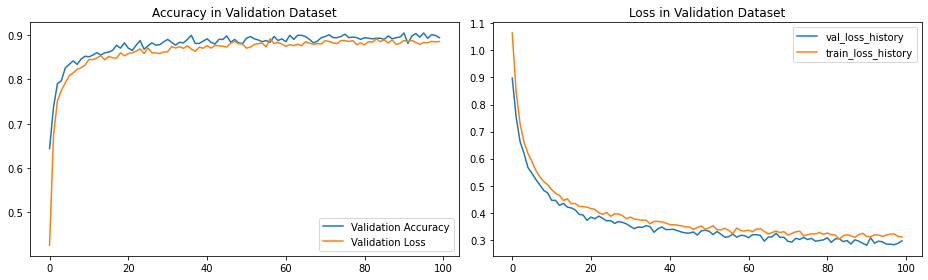


==== END ====
[[222   5  11]
 [  0 249  22]
 [  7  25 223]]

Sensitivity or recall total
0.9083769633507853

Sensitivity or recall per classes
[0.93 0.92 0.87]

Precision
[0.97 0.89 0.87]

F1 Score
[0.95 0.91 0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0902 Acc: 0.3629
val Loss: 1.0137 Acc: 0.5170

Epoch 1/99
----------
train Loss: 0.9661 Acc: 0.5463
val Loss: 0.9007 Acc: 0.6819

Epoch 2/99
----------
train Loss: 0.8770 Acc: 0.6413
val Loss: 0.8174 Acc: 0.7657

Epoch 3/99
----------
train Loss: 0.7960 Acc: 0.7144
val Loss: 0.7514 Acc: 0.7723

Epoch 4/99
----------
train Loss: 0.7470 Acc: 0.7504
val Loss: 0.7026 Acc: 0.7997

Epoch 5/99
----------
train Loss: 0.7019 Acc: 0.7740
val Loss: 0.6605 Acc: 0.8207


train Loss: 0.2912 Acc: 0.8916
val Loss: 0.2954 Acc: 0.8992

Epoch 92/99
----------
train Loss: 0.2878 Acc: 0.8955
val Loss: 0.3043 Acc: 0.9018

Epoch 93/99
----------
train Loss: 0.2919 Acc: 0.8916
val Loss: 0.2975 Acc: 0.8979

Epoch 94/99
----------
train Loss: 0.2809 Acc: 0.9073
val Loss: 0.2896 Acc: 0.8953

Epoch 95/99
----------
train Loss: 0.2888 Acc: 0.8906
val Loss: 0.2916 Acc: 0.8848

Epoch 96/99
----------
train Loss: 0.2902 Acc: 0.8945
val Loss: 0.3001 Acc: 0.8848

Epoch 97/99
----------
train Loss: 0.2880 Acc: 0.8958
val Loss: 0.2844 Acc: 0.9045

Epoch 98/99
----------
train Loss: 0.2938 Acc: 0.8968
val Loss: 0.2847 Acc: 0.8940

Epoch 99/99
----------
train Loss: 0.2941 Acc: 0.8870
val Loss: 0.2944 Acc: 0.8874


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 12s
Best val Acc: 0.904450
##############################


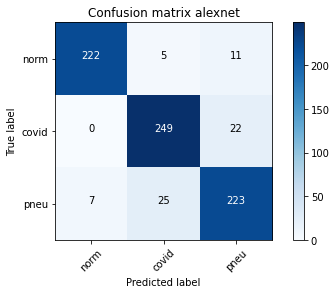

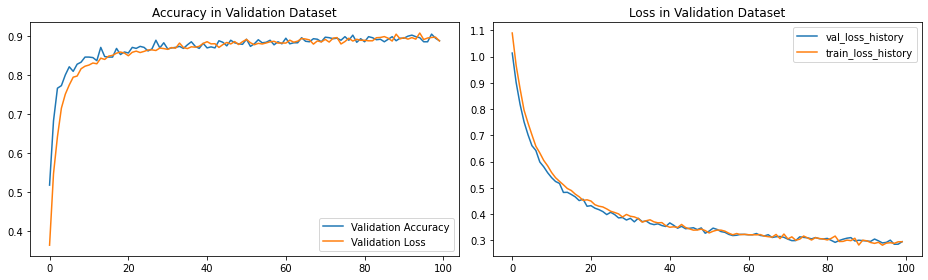


==== END ====
[[212   5  21]
 [  0 247  24]
 [  3  28 224]]

Sensitivity or recall total
0.893979057591623

Sensitivity or recall per classes
[0.89 0.91 0.88]

Precision
[0.99 0.88 0.83]

F1 Score
[0.94 0.9  0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9996 Acc: 0.5175
val Loss: 0.8845 Acc: 0.7120

Epoch 1/99
----------
train Loss: 0.8567 Acc: 0.6803
val Loss: 0.7934 Acc: 0.7552

Epoch 2/99
----------
train Loss: 0.7731 Acc: 0.7298
val Loss: 0.7232 Acc: 0.7866

Epoch 3/99
----------
train Loss: 0.7206 Acc: 0.7642
val Loss: 0.6676 Acc: 0.8220

Epoch 4/99
----------
train Loss: 0.6785 Acc: 0.7835
val Loss: 0.6437 Acc: 0.8220

Epoch 5/99
----------
train Loss: 0.6316 Acc: 0.8051
val Loss: 0.5949 Acc: 0.8351



train Loss: 0.2910 Acc: 0.8913
val Loss: 0.2866 Acc: 0.9031

Epoch 92/99
----------
train Loss: 0.2918 Acc: 0.8935
val Loss: 0.2916 Acc: 0.8848

Epoch 93/99
----------
train Loss: 0.2831 Acc: 0.9021
val Loss: 0.2836 Acc: 0.9018

Epoch 94/99
----------
train Loss: 0.2843 Acc: 0.8968
val Loss: 0.2702 Acc: 0.9031

Epoch 95/99
----------
train Loss: 0.2908 Acc: 0.8975
val Loss: 0.2843 Acc: 0.8940

Epoch 96/99
----------
train Loss: 0.2886 Acc: 0.8926
val Loss: 0.2957 Acc: 0.8953

Epoch 97/99
----------
train Loss: 0.2908 Acc: 0.8906
val Loss: 0.2948 Acc: 0.8874

Epoch 98/99
----------
train Loss: 0.2926 Acc: 0.8913
val Loss: 0.2865 Acc: 0.8966

Epoch 99/99
----------
train Loss: 0.2848 Acc: 0.8998
val Loss: 0.2955 Acc: 0.8914


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 12s
Best val Acc: 0.908377
##############################


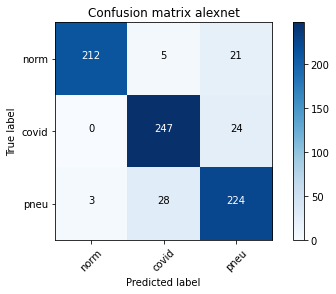

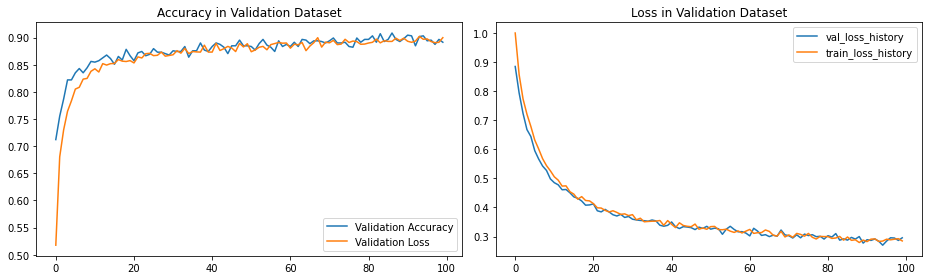


==== END ====
[[215   7  16]
 [  0 246  25]
 [  3  30 222]]

Sensitivity or recall total
0.893979057591623

Sensitivity or recall per classes
[0.9  0.91 0.87]

Precision
[0.99 0.87 0.84]

F1 Score
[0.94 0.89 0.86]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0578 Acc: 0.4392
val Loss: 0.8722 Acc: 0.6649

Epoch 1/99
----------
train Loss: 0.8260 Acc: 0.6777
val Loss: 0.7281 Acc: 0.7906

Epoch 2/99
----------
train Loss: 0.7255 Acc: 0.7511
val Loss: 0.6662 Acc: 0.8024

Epoch 3/99
----------
train Loss: 0.6532 Acc: 0.7845
val Loss: 0.6092 Acc: 0.8154

Epoch 4/99
----------
train Loss: 0.6177 Acc: 0.7963
val Loss: 0.5556 Acc: 0.8312

Epoch 5/99
----------
train Loss: 0.5855 Acc: 0.8054
val Loss: 0.5335 Acc: 0.8416


train Loss: 0.3134 Acc: 0.8847
val Loss: 0.2844 Acc: 0.8914

Epoch 92/99
----------
train Loss: 0.3081 Acc: 0.8811
val Loss: 0.3030 Acc: 0.8901

Epoch 93/99
----------
train Loss: 0.3040 Acc: 0.8909
val Loss: 0.2859 Acc: 0.9005

Epoch 94/99
----------
train Loss: 0.3237 Acc: 0.8854
val Loss: 0.2898 Acc: 0.9005

Epoch 95/99
----------
train Loss: 0.3099 Acc: 0.8909
val Loss: 0.2860 Acc: 0.9031

Epoch 96/99
----------
train Loss: 0.3089 Acc: 0.8860
val Loss: 0.2945 Acc: 0.8848

Epoch 97/99
----------
train Loss: 0.3151 Acc: 0.8890
val Loss: 0.2910 Acc: 0.8966

Epoch 98/99
----------
train Loss: 0.3166 Acc: 0.8840
val Loss: 0.2878 Acc: 0.9005

Epoch 99/99
----------
train Loss: 0.3014 Acc: 0.8926
val Loss: 0.2877 Acc: 0.8966


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 10s
Best val Acc: 0.908377
##############################


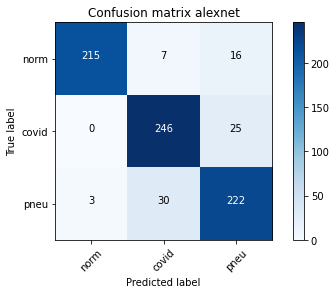

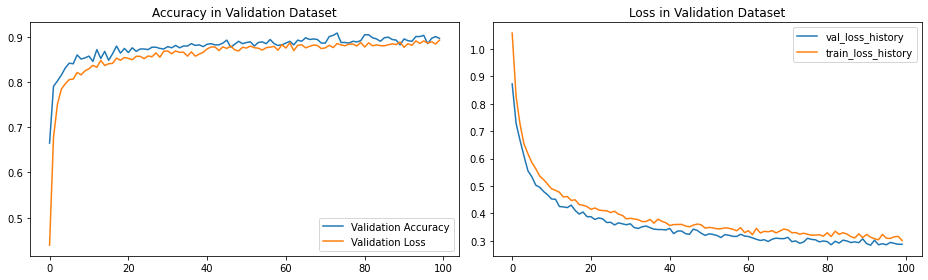


==== END ====
[[216   5  17]
 [  0 249  22]
 [  8  31 216]]

Sensitivity or recall total
0.8913612565445026

Sensitivity or recall per classes
[0.91 0.92 0.85]

Precision
[0.96 0.87 0.85]

F1 Score
[0.94 0.9  0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0724 Acc: 0.3917
val Loss: 1.0025 Acc: 0.4817

Epoch 1/99
----------
train Loss: 0.9450 Acc: 0.5572
val Loss: 0.8944 Acc: 0.6924

Epoch 2/99
----------
train Loss: 0.8665 Acc: 0.6462
val Loss: 0.8129 Acc: 0.7552

Epoch 3/99
----------
train Loss: 0.7905 Acc: 0.7059
val Loss: 0.7532 Acc: 0.7893

Epoch 4/99
----------
train Loss: 0.7425 Acc: 0.7429
val Loss: 0.7032 Acc: 0.7958

Epoch 5/99
----------
train Loss: 0.6994 Acc: 0.7665
val Loss: 0.6634 Acc: 0.8194

train Loss: 0.2997 Acc: 0.8877
val Loss: 0.2958 Acc: 0.8861

Epoch 92/99
----------
train Loss: 0.2963 Acc: 0.8939
val Loss: 0.2899 Acc: 0.8992

Epoch 93/99
----------
train Loss: 0.3065 Acc: 0.8837
val Loss: 0.3003 Acc: 0.8966

Epoch 94/99
----------
train Loss: 0.3018 Acc: 0.8883
val Loss: 0.2828 Acc: 0.8992

Epoch 95/99
----------
train Loss: 0.3108 Acc: 0.8873
val Loss: 0.2935 Acc: 0.9018

Epoch 96/99
----------
train Loss: 0.2896 Acc: 0.8998
val Loss: 0.2985 Acc: 0.8887

Epoch 97/99
----------
train Loss: 0.2893 Acc: 0.8968
val Loss: 0.2976 Acc: 0.8914

Epoch 98/99
----------
train Loss: 0.2961 Acc: 0.8896
val Loss: 0.2814 Acc: 0.8979

Epoch 99/99
----------
train Loss: 0.2967 Acc: 0.8991
val Loss: 0.2931 Acc: 0.8861


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 10s
Best val Acc: 0.903141
##############################


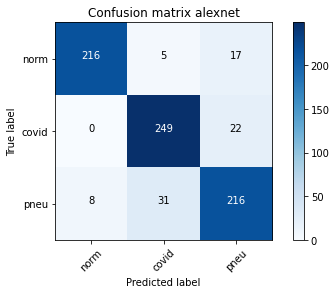

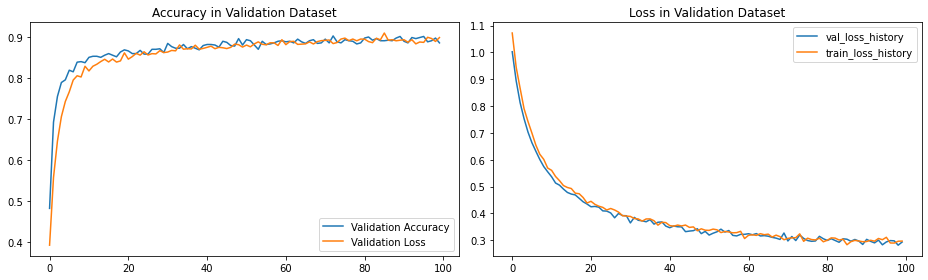


==== END ====
[[211   7  20]
 [  0 251  20]
 [  5  30 220]]

Sensitivity or recall total
0.8926701570680629

Sensitivity or recall per classes
[0.89 0.93 0.86]

Precision
[0.98 0.87 0.85]

F1 Score
[0.93 0.9  0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9179 Acc: 0.5798
val Loss: 0.8267 Acc: 0.7448

Epoch 1/99
----------
train Loss: 0.7960 Acc: 0.7206
val Loss: 0.7495 Acc: 0.7945

Epoch 2/99
----------
train Loss: 0.7321 Acc: 0.7557
val Loss: 0.6921 Acc: 0.8076

Epoch 3/99
----------
train Loss: 0.6836 Acc: 0.7730
val Loss: 0.6430 Acc: 0.8154

Epoch 4/99
----------
train Loss: 0.6367 Acc: 0.7972
val Loss: 0.6045 Acc: 0.8285

Epoch 5/99
----------
train Loss: 0.6024 Acc: 0.8159
val Loss: 0.5722 Acc: 0.8351

train Loss: 0.2794 Acc: 0.9014
val Loss: 0.2995 Acc: 0.8979

Epoch 92/99
----------
train Loss: 0.2874 Acc: 0.8935
val Loss: 0.2868 Acc: 0.8835

Epoch 93/99
----------
train Loss: 0.2953 Acc: 0.8906
val Loss: 0.2934 Acc: 0.9005

Epoch 94/99
----------
train Loss: 0.2836 Acc: 0.8988
val Loss: 0.2910 Acc: 0.8848

Epoch 95/99
----------
train Loss: 0.2855 Acc: 0.8942
val Loss: 0.2895 Acc: 0.8914

Epoch 96/99
----------
train Loss: 0.2866 Acc: 0.8942
val Loss: 0.2895 Acc: 0.8992

Epoch 97/99
----------
train Loss: 0.2864 Acc: 0.8988
val Loss: 0.2863 Acc: 0.9071

Epoch 98/99
----------
train Loss: 0.2828 Acc: 0.8922
val Loss: 0.2943 Acc: 0.8874

Epoch 99/99
----------
train Loss: 0.2801 Acc: 0.8952
val Loss: 0.2881 Acc: 0.8979


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 9s
Best val Acc: 0.907068
##############################


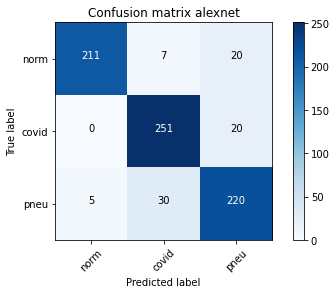

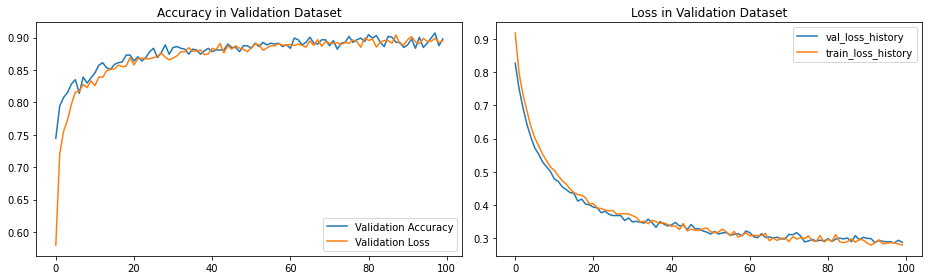


==== END ====
[[213   6  19]
 [  0 248  23]
 [  4  31 220]]

Sensitivity or recall total
0.8913612565445026

Sensitivity or recall per classes
[0.89 0.92 0.86]

Precision
[0.98 0.87 0.84]

F1 Score
[0.94 0.89 0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9830 Acc: 0.5011
val Loss: 0.8565 Acc: 0.6623

Epoch 1/99
----------
train Loss: 0.8185 Acc: 0.6721
val Loss: 0.7283 Acc: 0.7893

Epoch 2/99
----------
train Loss: 0.7150 Acc: 0.7553
val Loss: 0.6452 Acc: 0.8089

Epoch 3/99
----------
train Loss: 0.6527 Acc: 0.7953
val Loss: 0.5985 Acc: 0.8403

Epoch 4/99
----------
train Loss: 0.6188 Acc: 0.8015
val Loss: 0.5623 Acc: 0.8377

Epoch 5/99
----------
train Loss: 0.5735 Acc: 0.8241
val Loss: 0.5275 Acc: 0.8482

train Loss: 0.3073 Acc: 0.8847
val Loss: 0.2921 Acc: 0.8901

Epoch 92/99
----------
train Loss: 0.3108 Acc: 0.8893
val Loss: 0.2954 Acc: 0.8927

Epoch 93/99
----------
train Loss: 0.3044 Acc: 0.8906
val Loss: 0.2923 Acc: 0.8966

Epoch 94/99
----------
train Loss: 0.3191 Acc: 0.8840
val Loss: 0.2889 Acc: 0.8992

Epoch 95/99
----------
train Loss: 0.3094 Acc: 0.8857
val Loss: 0.2909 Acc: 0.8940

Epoch 96/99
----------
train Loss: 0.3046 Acc: 0.8896
val Loss: 0.2823 Acc: 0.9018

Epoch 97/99
----------
train Loss: 0.3021 Acc: 0.8899
val Loss: 0.2979 Acc: 0.8953

Epoch 98/99
----------
train Loss: 0.3055 Acc: 0.8896
val Loss: 0.2779 Acc: 0.9058

Epoch 99/99
----------
train Loss: 0.3145 Acc: 0.8814
val Loss: 0.2790 Acc: 0.8953


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 16s
Best val Acc: 0.905759
##############################


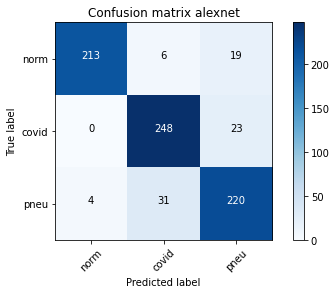

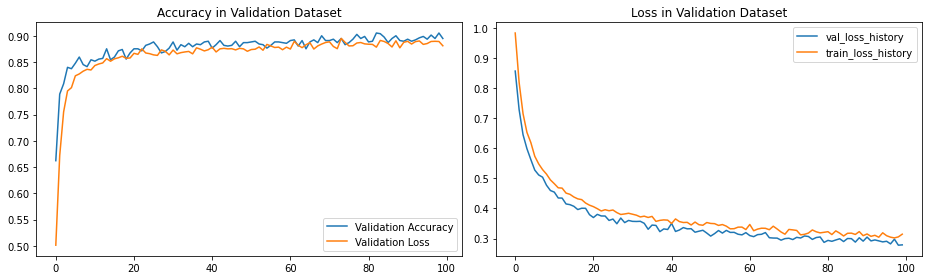


==== END ====
[[221   7  10]
 [  1 249  21]
 [  8  31 216]]

Sensitivity or recall total
0.8979057591623036

Sensitivity or recall per classes
[0.93 0.92 0.85]

Precision
[0.96 0.87 0.87]

F1 Score
[0.94 0.89 0.86]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0518 Acc: 0.4255
val Loss: 0.9820 Acc: 0.5314

Epoch 1/99
----------
train Loss: 0.9344 Acc: 0.5755
val Loss: 0.8702 Acc: 0.6976

Epoch 2/99
----------
train Loss: 0.8448 Acc: 0.6803
val Loss: 0.7913 Acc: 0.7631

Epoch 3/99
----------
train Loss: 0.7742 Acc: 0.7357
val Loss: 0.7280 Acc: 0.8063

Epoch 4/99
----------
train Loss: 0.7202 Acc: 0.7619
val Loss: 0.6836 Acc: 0.8338

Epoch 5/99
----------
train Loss: 0.6766 Acc: 0.7874
val Loss: 0.6417 Acc: 0.8325

train Loss: 0.2919 Acc: 0.8909
val Loss: 0.2784 Acc: 0.9045

Epoch 92/99
----------
train Loss: 0.2999 Acc: 0.8926
val Loss: 0.2894 Acc: 0.8914

Epoch 93/99
----------
train Loss: 0.2887 Acc: 0.8955
val Loss: 0.2910 Acc: 0.8914

Epoch 94/99
----------
train Loss: 0.3101 Acc: 0.8818
val Loss: 0.2875 Acc: 0.8992

Epoch 95/99
----------
train Loss: 0.2923 Acc: 0.8962
val Loss: 0.2810 Acc: 0.9005

Epoch 96/99
----------
train Loss: 0.2793 Acc: 0.9027
val Loss: 0.3021 Acc: 0.8953

Epoch 97/99
----------
train Loss: 0.2959 Acc: 0.8913
val Loss: 0.2946 Acc: 0.8887

Epoch 98/99
----------
train Loss: 0.2840 Acc: 0.8988
val Loss: 0.2953 Acc: 0.8887

Epoch 99/99
----------
train Loss: 0.2860 Acc: 0.8962
val Loss: 0.2928 Acc: 0.8940


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 14s
Best val Acc: 0.905759
##############################


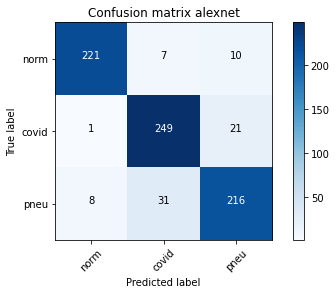

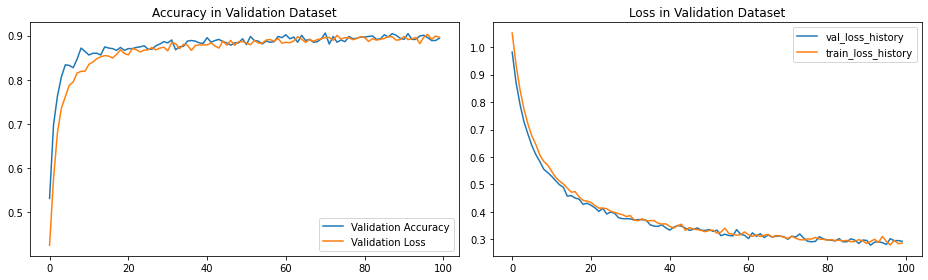


==== END ====
[[211   6  21]
 [  0 247  24]
 [  7  33 215]]

Sensitivity or recall total
0.8808900523560209

Sensitivity or recall per classes
[0.89 0.91 0.84]

Precision
[0.97 0.86 0.83]

F1 Score
[0.93 0.89 0.83]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9982 Acc: 0.5310
val Loss: 0.8837 Acc: 0.7212

Epoch 1/99
----------
train Loss: 0.8506 Acc: 0.6990
val Loss: 0.7853 Acc: 0.7932

Epoch 2/99
----------
train Loss: 0.7666 Acc: 0.7583
val Loss: 0.7204 Acc: 0.8207

Epoch 3/99
----------
train Loss: 0.7069 Acc: 0.7868
val Loss: 0.6673 Acc: 0.8259

Epoch 4/99
----------
train Loss: 0.6535 Acc: 0.8054
val Loss: 0.6272 Acc: 0.8364

Epoch 5/99
----------
train Loss: 0.6192 Acc: 0.8126
val Loss: 0.5859 Acc: 0.8469

train Loss: 0.2852 Acc: 0.8958
val Loss: 0.2949 Acc: 0.8901

Epoch 92/99
----------
train Loss: 0.2899 Acc: 0.8935
val Loss: 0.2864 Acc: 0.8979

Epoch 93/99
----------
train Loss: 0.2767 Acc: 0.8981
val Loss: 0.2893 Acc: 0.9005

Epoch 94/99
----------
train Loss: 0.2887 Acc: 0.8903
val Loss: 0.2879 Acc: 0.8992

Epoch 95/99
----------
train Loss: 0.2902 Acc: 0.8939
val Loss: 0.2879 Acc: 0.9097

Epoch 96/99
----------
train Loss: 0.2895 Acc: 0.8965
val Loss: 0.2915 Acc: 0.8979

Epoch 97/99
----------
train Loss: 0.2744 Acc: 0.8962
val Loss: 0.2747 Acc: 0.9058

Epoch 98/99
----------
train Loss: 0.2882 Acc: 0.8962
val Loss: 0.2949 Acc: 0.8901

Epoch 99/99
----------
train Loss: 0.2863 Acc: 0.8981
val Loss: 0.2772 Acc: 0.9005


##############################
------ Summary ------
model -> alexnet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 13s
Best val Acc: 0.909686
##############################


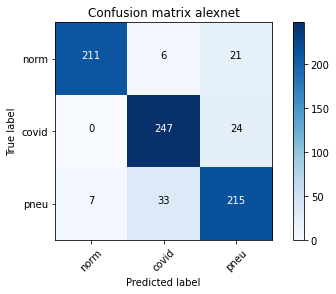

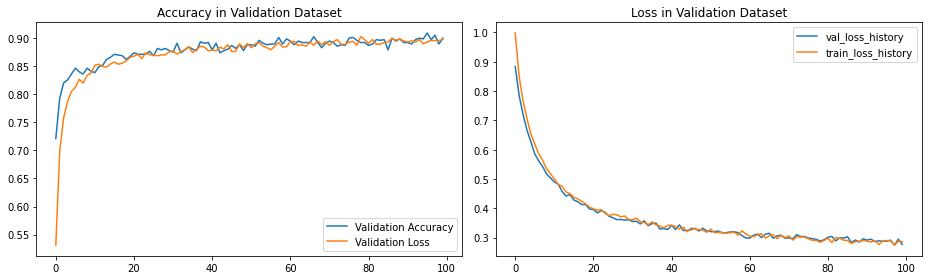


==== END ====
[[212   5  21]
 [  0 249  22]
 [  4  30 221]]

Sensitivity or recall total
0.8926701570680629

Sensitivity or recall per classes
[0.89 0.92 0.87]

Precision
[0.98 0.88 0.84]

F1 Score
[0.93 0.9  0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4989 Acc: 0.8284
val Loss: 0.2744 Acc: 0.9280

Epoch 1/99
----------
train Loss: 0.2787 Acc: 0.9132
val Loss: 0.2240 Acc: 0.9306

Epoch 2/99
----------
train Loss: 0.2388 Acc: 0.9243
val Loss: 0.2044 Acc: 0.9306

Epoch 3/99
----------
train Loss: 0.2284 Acc: 0.9211
val Loss: 0.2010 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.2188 Acc: 0.9220
val Loss: 0.1935 Acc: 0.9398

Epoch 5/99
----------
train Loss: 0.2135 Acc: 0.9296
val Loss: 0.1807 Acc: 0.9476

Epo

train Loss: 0.1383 Acc: 0.9482
val Loss: 0.1484 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1493 Acc: 0.9486
val Loss: 0.1488 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1503 Acc: 0.9466
val Loss: 0.1379 Acc: 0.9476

Epoch 94/99
----------
train Loss: 0.1506 Acc: 0.9453
val Loss: 0.1428 Acc: 0.9529

Epoch 95/99
----------
train Loss: 0.1526 Acc: 0.9456
val Loss: 0.1581 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1405 Acc: 0.9486
val Loss: 0.1442 Acc: 0.9503

Epoch 97/99
----------
train Loss: 0.1443 Acc: 0.9476
val Loss: 0.1734 Acc: 0.9437

Epoch 98/99
----------
train Loss: 0.1506 Acc: 0.9446
val Loss: 0.1402 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1491 Acc: 0.9492
val Loss: 0.1349 Acc: 0.9476


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 17s
Best val Acc: 0.962042
##############################


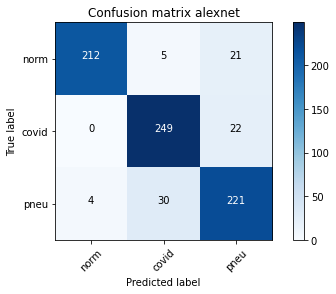

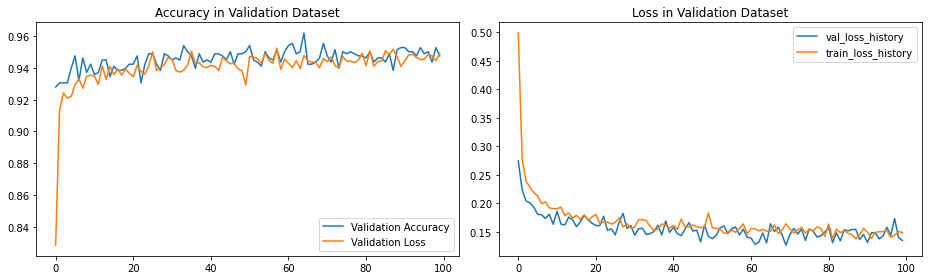


==== END ====
[[232   3   3]
 [  0 261  10]
 [  3  20 232]]

Sensitivity or recall total
0.9489528795811518

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.99 0.92 0.95]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.3386 Acc: 0.8814
val Loss: 0.2057 Acc: 0.9280

Epoch 1/99
----------
train Loss: 0.2126 Acc: 0.9266
val Loss: 0.1743 Acc: 0.9411

Epoch 2/99
----------
train Loss: 0.1989 Acc: 0.9306
val Loss: 0.1797 Acc: 0.9372

Epoch 3/99
----------
train Loss: 0.1954 Acc: 0.9325
val Loss: 0.1570 Acc: 0.9411

Epoch 4/99
----------
train Loss: 0.1899 Acc: 0.9306
val Loss: 0.1804 Acc: 0.9332

Epoch 5/99
----------
train Loss: 0.1899 Acc: 0.9312
val Loss: 0.1472 Acc: 0.9516

Epo

train Loss: 0.1637 Acc: 0.9420
val Loss: 0.2498 Acc: 0.9319

Epoch 92/99
----------
train Loss: 0.1996 Acc: 0.9391
val Loss: 0.1584 Acc: 0.9568

Epoch 93/99
----------
train Loss: 0.1469 Acc: 0.9486
val Loss: 0.1478 Acc: 0.9476

Epoch 94/99
----------
train Loss: 0.1812 Acc: 0.9394
val Loss: 0.1541 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1614 Acc: 0.9446
val Loss: 0.1484 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1634 Acc: 0.9427
val Loss: 0.1610 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.2076 Acc: 0.9345
val Loss: 0.1584 Acc: 0.9542

Epoch 98/99
----------
train Loss: 0.1783 Acc: 0.9414
val Loss: 0.1780 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1439 Acc: 0.9545
val Loss: 0.1546 Acc: 0.9437


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 28s
Best val Acc: 0.960733
##############################


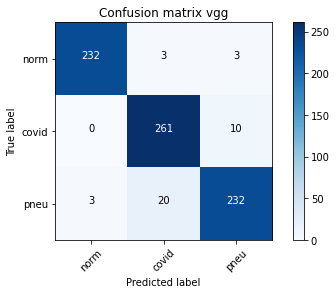

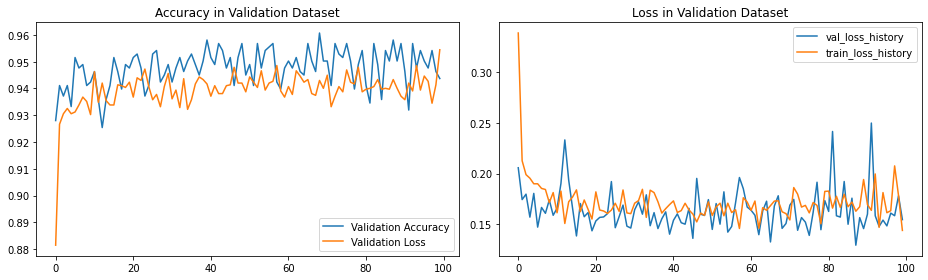


==== END ====
[[234   1   3]
 [  0 257  14]
 [  3  17 235]]

Sensitivity or recall total
0.9502617801047121

Sensitivity or recall per classes
[0.98 0.95 0.92]

Precision
[0.99 0.93 0.93]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4268 Acc: 0.8605
val Loss: 0.2296 Acc: 0.9293

Epoch 1/99
----------
train Loss: 0.2185 Acc: 0.9247
val Loss: 0.2426 Acc: 0.9175

Epoch 2/99
----------
train Loss: 0.2093 Acc: 0.9283
val Loss: 0.3345 Acc: 0.8835

Epoch 3/99
----------
train Loss: 0.1956 Acc: 0.9325
val Loss: 0.1821 Acc: 0.9385

Epoch 4/99
----------
train Loss: 0.1720 Acc: 0.9397
val Loss: 0.1693 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.1930 Acc: 0.9299
val Loss: 0.1505 Acc: 0.9490

Epo

train Loss: 0.1778 Acc: 0.9401
val Loss: 0.1525 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1994 Acc: 0.9319
val Loss: 0.1526 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1671 Acc: 0.9420
val Loss: 0.1783 Acc: 0.9450

Epoch 94/99
----------
train Loss: 0.1622 Acc: 0.9401
val Loss: 0.1594 Acc: 0.9529

Epoch 95/99
----------
train Loss: 0.1500 Acc: 0.9499
val Loss: 0.1685 Acc: 0.9437

Epoch 96/99
----------
train Loss: 0.1905 Acc: 0.9273
val Loss: 0.1458 Acc: 0.9555

Epoch 97/99
----------
train Loss: 0.1694 Acc: 0.9440
val Loss: 0.1815 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1733 Acc: 0.9404
val Loss: 0.1931 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1849 Acc: 0.9384
val Loss: 0.1744 Acc: 0.9516


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 30s
Best val Acc: 0.960733
##############################


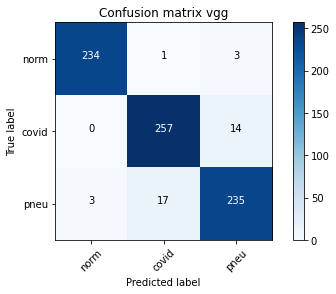

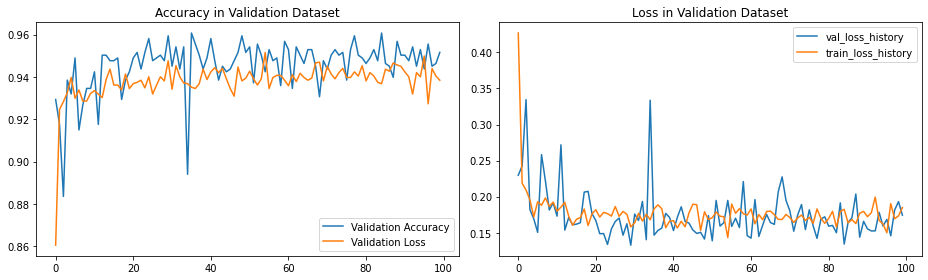


==== END ====
[[229   2   7]
 [  0 252  19]
 [  3   7 245]]

Sensitivity or recall total
0.9502617801047121

Sensitivity or recall per classes
[0.96 0.93 0.96]

Precision
[0.99 0.97 0.9 ]

F1 Score
[0.97 0.95 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4977 Acc: 0.8411
val Loss: 0.2851 Acc: 0.9228

Epoch 1/99
----------
train Loss: 0.2789 Acc: 0.9132
val Loss: 0.2250 Acc: 0.9319

Epoch 2/99
----------
train Loss: 0.2420 Acc: 0.9145
val Loss: 0.2175 Acc: 0.9346

Epoch 3/99
----------
train Loss: 0.2285 Acc: 0.9240
val Loss: 0.2015 Acc: 0.9372

Epoch 4/99
----------
train Loss: 0.2089 Acc: 0.9289
val Loss: 0.1808 Acc: 0.9398

Epoch 5/99
----------
train Loss: 0.1987 Acc: 0.9358
val Loss: 0.1790 Acc: 0.9398

Ep

train Loss: 0.1447 Acc: 0.9446
val Loss: 0.1328 Acc: 0.9542

Epoch 92/99
----------
train Loss: 0.1420 Acc: 0.9502
val Loss: 0.1561 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1532 Acc: 0.9420
val Loss: 0.1439 Acc: 0.9555

Epoch 94/99
----------
train Loss: 0.1416 Acc: 0.9519
val Loss: 0.1294 Acc: 0.9555

Epoch 95/99
----------
train Loss: 0.1469 Acc: 0.9460
val Loss: 0.1463 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1464 Acc: 0.9486
val Loss: 0.1451 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1407 Acc: 0.9473
val Loss: 0.1552 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1386 Acc: 0.9496
val Loss: 0.1434 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1484 Acc: 0.9473
val Loss: 0.1354 Acc: 0.9529


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 28s
Best val Acc: 0.964660
##############################


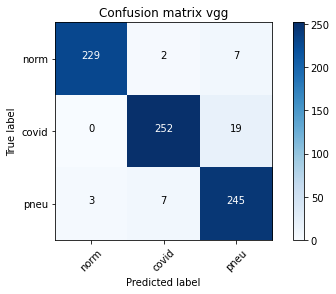

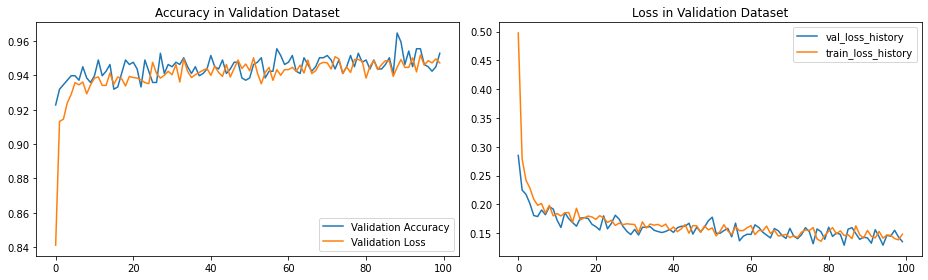


==== END ====
[[233   3   2]
 [  1 261   9]
 [  4  22 229]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.96 0.9 ]

Precision
[0.98 0.91 0.95]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.3368 Acc: 0.8847
val Loss: 0.2130 Acc: 0.9280

Epoch 1/99
----------
train Loss: 0.2209 Acc: 0.9214
val Loss: 0.1878 Acc: 0.9359

Epoch 2/99
----------
train Loss: 0.2053 Acc: 0.9234
val Loss: 0.1780 Acc: 0.9411

Epoch 3/99
----------
train Loss: 0.1874 Acc: 0.9289
val Loss: 0.1761 Acc: 0.9385

Epoch 4/99
----------
train Loss: 0.1851 Acc: 0.9325
val Loss: 0.1909 Acc: 0.9398

Epoch 5/99
----------
train Loss: 0.1753 Acc: 0.9306
val Loss: 0.1939 Acc: 0.9319

Ep

train Loss: 0.1757 Acc: 0.9420
val Loss: 0.1809 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1719 Acc: 0.9417
val Loss: 0.1555 Acc: 0.9503

Epoch 93/99
----------
train Loss: 0.1582 Acc: 0.9456
val Loss: 0.1813 Acc: 0.9450

Epoch 94/99
----------
train Loss: 0.1646 Acc: 0.9430
val Loss: 0.1793 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1766 Acc: 0.9325
val Loss: 0.1750 Acc: 0.9516

Epoch 96/99
----------
train Loss: 0.1851 Acc: 0.9368
val Loss: 0.1569 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1635 Acc: 0.9450
val Loss: 0.1624 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1489 Acc: 0.9499
val Loss: 0.1436 Acc: 0.9542

Epoch 99/99
----------
train Loss: 0.1664 Acc: 0.9482
val Loss: 0.1762 Acc: 0.9516


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 31s
Best val Acc: 0.962042
##############################


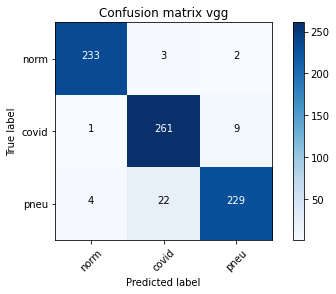

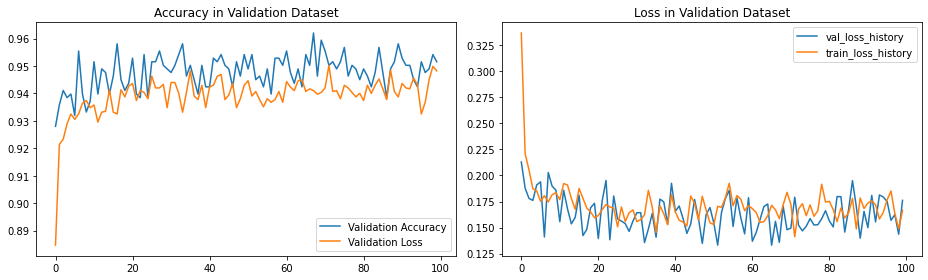


==== END ====
[[233   3   2]
 [  0 257  14]
 [  4  14 237]]

Sensitivity or recall total
0.9515706806282722

Sensitivity or recall per classes
[0.98 0.95 0.93]

Precision
[0.98 0.94 0.94]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.3825 Acc: 0.8700
val Loss: 0.2868 Acc: 0.9149

Epoch 1/99
----------
train Loss: 0.2218 Acc: 0.9194
val Loss: 0.1960 Acc: 0.9280

Epoch 2/99
----------
train Loss: 0.2119 Acc: 0.9283
val Loss: 0.3460 Acc: 0.8573

Epoch 3/99
----------
train Loss: 0.2083 Acc: 0.9286
val Loss: 0.1550 Acc: 0.9503

Epoch 4/99
----------
train Loss: 0.1887 Acc: 0.9302
val Loss: 0.3353 Acc: 0.8861

Epoch 5/99
----------
train Loss: 0.1826 Acc: 0.9312
val Loss: 0.2088 Acc: 0.9398

Ep

train Loss: 0.1613 Acc: 0.9437
val Loss: 0.1858 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1697 Acc: 0.9404
val Loss: 0.1559 Acc: 0.9476

Epoch 93/99
----------
train Loss: 0.1744 Acc: 0.9391
val Loss: 0.1509 Acc: 0.9463

Epoch 94/99
----------
train Loss: 0.1808 Acc: 0.9374
val Loss: 0.1414 Acc: 0.9542

Epoch 95/99
----------
train Loss: 0.1871 Acc: 0.9338
val Loss: 0.1962 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.1618 Acc: 0.9437
val Loss: 0.1730 Acc: 0.9424

Epoch 97/99
----------
train Loss: 0.1822 Acc: 0.9407
val Loss: 0.1656 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1778 Acc: 0.9404
val Loss: 0.1340 Acc: 0.9581

Epoch 99/99
----------
train Loss: 0.1788 Acc: 0.9401
val Loss: 0.1796 Acc: 0.9411


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 29s
Best val Acc: 0.958115
##############################


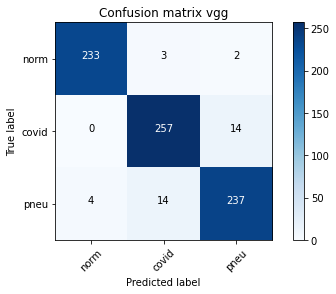

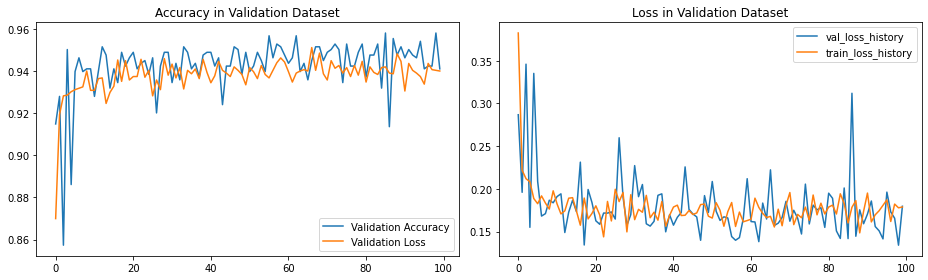


==== END ====
[[232   3   3]
 [  0 262   9]
 [  4  20 231]]

Sensitivity or recall total
0.9489528795811518

Sensitivity or recall per classes
[0.97 0.97 0.91]

Precision
[0.98 0.92 0.95]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5004 Acc: 0.8369
val Loss: 0.2865 Acc: 0.9228

Epoch 1/99
----------
train Loss: 0.2891 Acc: 0.9063
val Loss: 0.2182 Acc: 0.9385

Epoch 2/99
----------
train Loss: 0.2432 Acc: 0.9230
val Loss: 0.2106 Acc: 0.9306

Epoch 3/99
----------
train Loss: 0.2398 Acc: 0.9152
val Loss: 0.2033 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.2103 Acc: 0.9312
val Loss: 0.1913 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.2048 Acc: 0.9299
val Loss: 0.1883 Acc: 0.9346

Ep

train Loss: 0.1379 Acc: 0.9502
val Loss: 0.1433 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1345 Acc: 0.9538
val Loss: 0.1550 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1426 Acc: 0.9522
val Loss: 0.1346 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1471 Acc: 0.9502
val Loss: 0.1367 Acc: 0.9555

Epoch 95/99
----------
train Loss: 0.1378 Acc: 0.9492
val Loss: 0.1513 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1422 Acc: 0.9453
val Loss: 0.1434 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1503 Acc: 0.9430
val Loss: 0.1490 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1484 Acc: 0.9473
val Loss: 0.1499 Acc: 0.9424

Epoch 99/99
----------
train Loss: 0.1467 Acc: 0.9443
val Loss: 0.1430 Acc: 0.9476


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 25s
Best val Acc: 0.958115
##############################


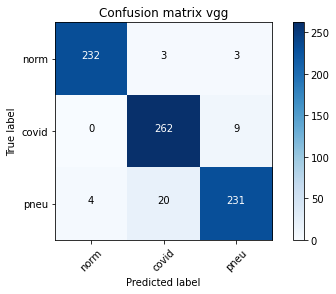

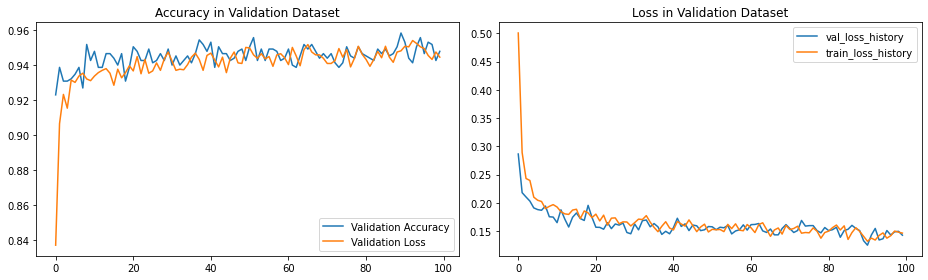


==== END ====
[[232   2   4]
 [  0 258  13]
 [  4  12 239]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.97 0.95 0.94]

Precision
[0.98 0.95 0.93]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.3479 Acc: 0.8739
val Loss: 0.2204 Acc: 0.9202

Epoch 1/99
----------
train Loss: 0.2049 Acc: 0.9296
val Loss: 0.1770 Acc: 0.9411

Epoch 2/99
----------
train Loss: 0.2035 Acc: 0.9296
val Loss: 0.1767 Acc: 0.9293

Epoch 3/99
----------
train Loss: 0.1866 Acc: 0.9329
val Loss: 0.1749 Acc: 0.9398

Epoch 4/99
----------
train Loss: 0.1928 Acc: 0.9276
val Loss: 0.1764 Acc: 0.9293

Epoch 5/99
----------
train Loss: 0.1684 Acc: 0.9374
val Loss: 0.1733 Acc: 0.9411

Ep

train Loss: 0.1900 Acc: 0.9325
val Loss: 0.1650 Acc: 0.9555

Epoch 92/99
----------
train Loss: 0.1721 Acc: 0.9446
val Loss: 0.1677 Acc: 0.9516

Epoch 93/99
----------
train Loss: 0.1841 Acc: 0.9391
val Loss: 0.1455 Acc: 0.9568

Epoch 94/99
----------
train Loss: 0.1583 Acc: 0.9430
val Loss: 0.1818 Acc: 0.9490

Epoch 95/99
----------
train Loss: 0.1650 Acc: 0.9407
val Loss: 0.1499 Acc: 0.9476

Epoch 96/99
----------
train Loss: 0.1944 Acc: 0.9306
val Loss: 0.1533 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1679 Acc: 0.9414
val Loss: 0.1708 Acc: 0.9463

Epoch 98/99
----------
train Loss: 0.1615 Acc: 0.9466
val Loss: 0.1654 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1778 Acc: 0.9401
val Loss: 0.1474 Acc: 0.9555


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 24s
Best val Acc: 0.958115
##############################


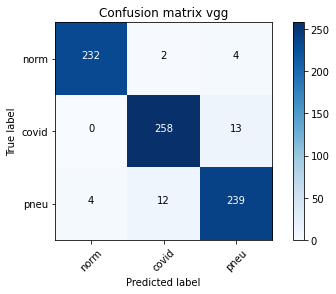

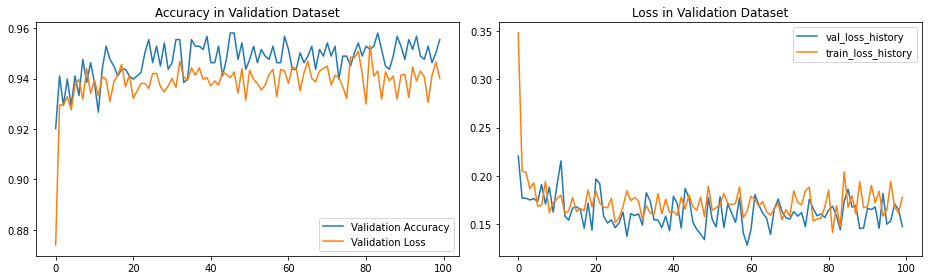


==== END ====
[[233   3   2]
 [  0 256  15]
 [  3  10 242]]

Sensitivity or recall total
0.9568062827225131

Sensitivity or recall per classes
[0.98 0.94 0.95]

Precision
[0.99 0.95 0.93]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.4159 Acc: 0.8578
val Loss: 0.3034 Acc: 0.8874

Epoch 1/99
----------
train Loss: 0.2232 Acc: 0.9152
val Loss: 0.1795 Acc: 0.9332

Epoch 2/99
----------
train Loss: 0.1931 Acc: 0.9286
val Loss: 0.1880 Acc: 0.9332

Epoch 3/99
----------
train Loss: 0.2086 Acc: 0.9266
val Loss: 0.1822 Acc: 0.9411

Epoch 4/99
----------
train Loss: 0.1941 Acc: 0.9292
val Loss: 0.1533 Acc: 0.9476

Epoch 5/99
----------
train Loss: 0.2018 Acc: 0.9256
val Loss: 0.2080 Acc: 0.9202

Ep

train Loss: 0.1824 Acc: 0.9355
val Loss: 0.2183 Acc: 0.9346

Epoch 92/99
----------
train Loss: 0.1580 Acc: 0.9456
val Loss: 0.1763 Acc: 0.9463

Epoch 93/99
----------
train Loss: 0.1711 Acc: 0.9410
val Loss: 0.1589 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1737 Acc: 0.9394
val Loss: 0.1814 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1919 Acc: 0.9332
val Loss: 0.1754 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1763 Acc: 0.9374
val Loss: 0.1499 Acc: 0.9411

Epoch 97/99
----------
train Loss: 0.1723 Acc: 0.9391
val Loss: 0.1762 Acc: 0.9463

Epoch 98/99
----------
train Loss: 0.1657 Acc: 0.9410
val Loss: 0.2028 Acc: 0.9385

Epoch 99/99
----------
train Loss: 0.1790 Acc: 0.9387
val Loss: 0.1794 Acc: 0.9424


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 31s
Best val Acc: 0.963351
##############################


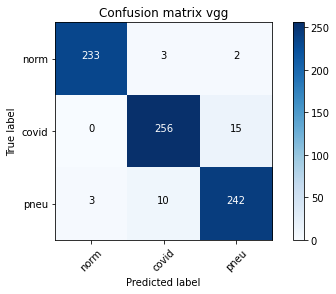

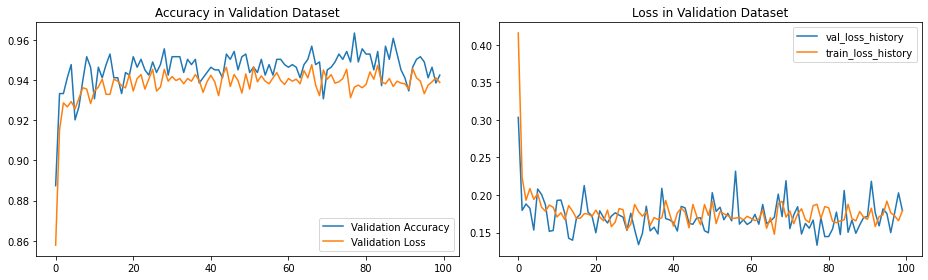


==== END ====
[[235   1   2]
 [  0 255  16]
 [  4  13 238]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.99 0.94 0.93]

Precision
[0.98 0.95 0.93]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9378 Acc: 0.5968
val Loss: 0.7315 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.6472 Acc: 0.8490
val Loss: 0.5373 Acc: 0.9123

Epoch 2/99
----------
train Loss: 0.5271 Acc: 0.8827
val Loss: 0.4468 Acc: 0.9123

Epoch 3/99
----------
train Loss: 0.4502 Acc: 0.8991
val Loss: 0.4021 Acc: 0.9149

Epoch 4/99
----------
train Loss: 0.4138 Acc: 0.9060
val Loss: 0.3467 Acc: 0.9241

Epoch 5/99
----------
train Loss: 0.3774 Acc: 0.9093
val Loss: 0.3338 Acc: 0.9254

Ep

train Loss: 0.1845 Acc: 0.9378
val Loss: 0.1765 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1891 Acc: 0.9384
val Loss: 0.1780 Acc: 0.9332

Epoch 93/99
----------
train Loss: 0.1828 Acc: 0.9407
val Loss: 0.1800 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.1960 Acc: 0.9325
val Loss: 0.1771 Acc: 0.9450

Epoch 95/99
----------
train Loss: 0.1935 Acc: 0.9329
val Loss: 0.1761 Acc: 0.9372

Epoch 96/99
----------
train Loss: 0.1771 Acc: 0.9401
val Loss: 0.1676 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.1866 Acc: 0.9342
val Loss: 0.1897 Acc: 0.9411

Epoch 98/99
----------
train Loss: 0.1888 Acc: 0.9345
val Loss: 0.1747 Acc: 0.9424

Epoch 99/99
----------
train Loss: 0.1867 Acc: 0.9348
val Loss: 0.1872 Acc: 0.9332


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.946335
##############################


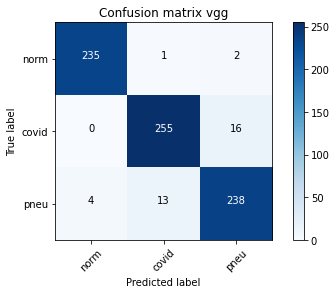

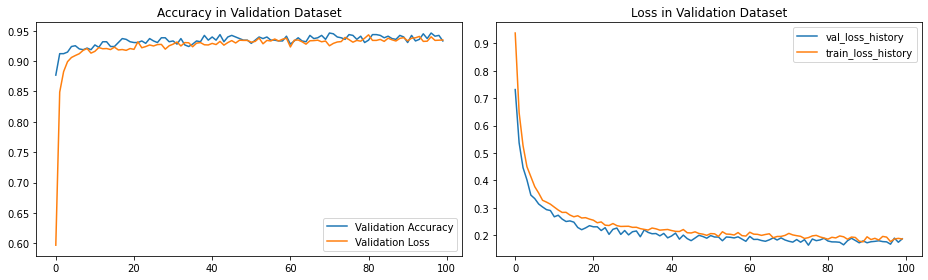


==== END ====
[[227   4   7]
 [  0 256  15]
 [  6  19 230]]

Sensitivity or recall total
0.9332460732984293

Sensitivity or recall per classes
[0.95 0.94 0.9 ]

Precision
[0.97 0.92 0.91]

F1 Score
[0.96 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7496 Acc: 0.7625
val Loss: 0.5151 Acc: 0.9175

Epoch 1/99
----------
train Loss: 0.4514 Acc: 0.8968
val Loss: 0.3652 Acc: 0.9202

Epoch 2/99
----------
train Loss: 0.3528 Acc: 0.9139
val Loss: 0.3060 Acc: 0.9202

Epoch 3/99
----------
train Loss: 0.3110 Acc: 0.9139
val Loss: 0.2658 Acc: 0.9332

Epoch 4/99
----------
train Loss: 0.2773 Acc: 0.9237
val Loss: 0.2476 Acc: 0.9280

Epoch 5/99
----------
train Loss: 0.2655 Acc: 0.9217
val Loss: 0.2338 Acc: 0.9319

Ep

train Loss: 0.1476 Acc: 0.9482
val Loss: 0.1518 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1588 Acc: 0.9414
val Loss: 0.1583 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1394 Acc: 0.9512
val Loss: 0.1453 Acc: 0.9476

Epoch 94/99
----------
train Loss: 0.1466 Acc: 0.9443
val Loss: 0.1446 Acc: 0.9503

Epoch 95/99
----------
train Loss: 0.1436 Acc: 0.9446
val Loss: 0.1508 Acc: 0.9450

Epoch 96/99
----------
train Loss: 0.1498 Acc: 0.9440
val Loss: 0.1482 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1514 Acc: 0.9450
val Loss: 0.1355 Acc: 0.9568

Epoch 98/99
----------
train Loss: 0.1544 Acc: 0.9440
val Loss: 0.1503 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1391 Acc: 0.9489
val Loss: 0.1455 Acc: 0.9490


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 27s
Best val Acc: 0.956806
##############################


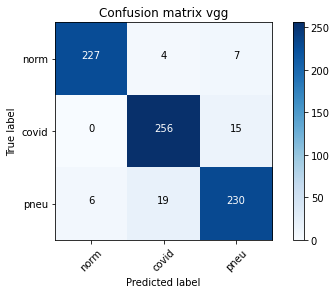

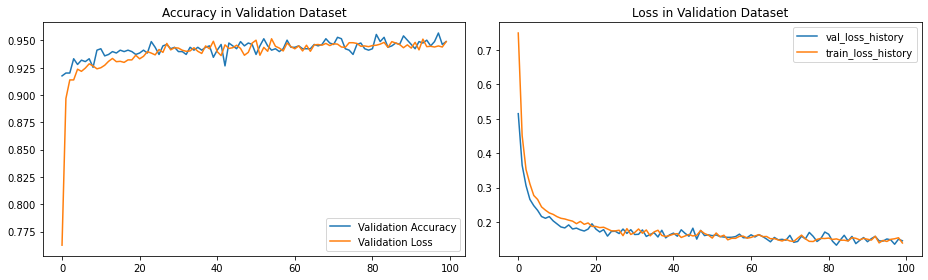


==== END ====
[[233   3   2]
 [  0 260  11]
 [  6  15 234]]

Sensitivity or recall total
0.9515706806282722

Sensitivity or recall per classes
[0.98 0.96 0.92]

Precision
[0.97 0.94 0.95]

F1 Score
[0.98 0.95 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5400 Acc: 0.8572
val Loss: 0.3706 Acc: 0.9202

Epoch 1/99
----------
train Loss: 0.3513 Acc: 0.9116
val Loss: 0.3007 Acc: 0.9215

Epoch 2/99
----------
train Loss: 0.2955 Acc: 0.9201
val Loss: 0.2578 Acc: 0.9267

Epoch 3/99
----------
train Loss: 0.2680 Acc: 0.9204
val Loss: 0.2344 Acc: 0.9359

Epoch 4/99
----------
train Loss: 0.2470 Acc: 0.9292
val Loss: 0.2218 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.2388 Acc: 0.9204
val Loss: 0.2024 Acc: 0.9385

Ep

train Loss: 0.1532 Acc: 0.9443
val Loss: 0.1461 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1422 Acc: 0.9528
val Loss: 0.1513 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.1484 Acc: 0.9479
val Loss: 0.1498 Acc: 0.9490

Epoch 94/99
----------
train Loss: 0.1408 Acc: 0.9486
val Loss: 0.1463 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1340 Acc: 0.9538
val Loss: 0.1566 Acc: 0.9516

Epoch 96/99
----------
train Loss: 0.1486 Acc: 0.9505
val Loss: 0.1435 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1535 Acc: 0.9443
val Loss: 0.1568 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1481 Acc: 0.9486
val Loss: 0.1559 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1484 Acc: 0.9469
val Loss: 0.1388 Acc: 0.9476


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 28s
Best val Acc: 0.954188
##############################


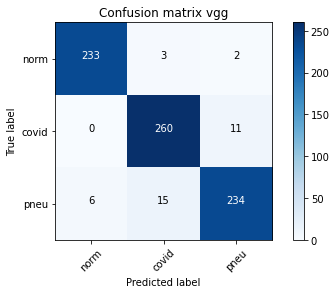

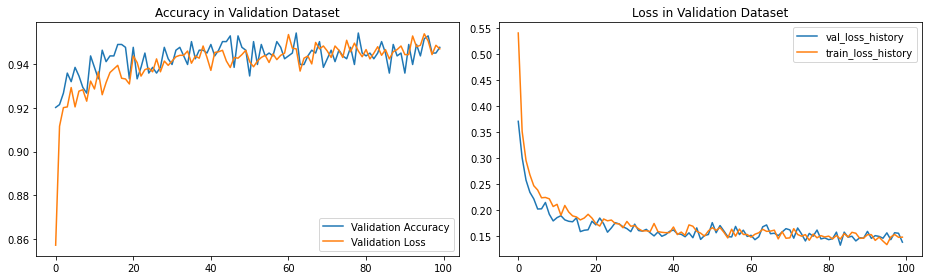


==== END ====
[[232   3   3]
 [  0 258  13]
 [  4  27 224]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.97 0.95 0.88]

Precision
[0.98 0.9  0.93]

F1 Score
[0.98 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9270 Acc: 0.6096
val Loss: 0.7284 Acc: 0.8861

Epoch 1/99
----------
train Loss: 0.6475 Acc: 0.8536
val Loss: 0.5428 Acc: 0.9031

Epoch 2/99
----------
train Loss: 0.5173 Acc: 0.8962
val Loss: 0.4405 Acc: 0.9215

Epoch 3/99
----------
train Loss: 0.4484 Acc: 0.9057
val Loss: 0.3955 Acc: 0.9202

Epoch 4/99
----------
train Loss: 0.4009 Acc: 0.9037
val Loss: 0.3577 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.3748 Acc: 0.9171
val Loss: 0.3289 Acc: 0.9188

E

train Loss: 0.1873 Acc: 0.9322
val Loss: 0.1743 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1937 Acc: 0.9319
val Loss: 0.1871 Acc: 0.9293

Epoch 93/99
----------
train Loss: 0.1854 Acc: 0.9371
val Loss: 0.1775 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1773 Acc: 0.9397
val Loss: 0.1669 Acc: 0.9411

Epoch 95/99
----------
train Loss: 0.1794 Acc: 0.9414
val Loss: 0.1809 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.1859 Acc: 0.9358
val Loss: 0.1658 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1908 Acc: 0.9342
val Loss: 0.1742 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.1815 Acc: 0.9374
val Loss: 0.1863 Acc: 0.9319

Epoch 99/99
----------
train Loss: 0.1853 Acc: 0.9404
val Loss: 0.1760 Acc: 0.9398


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 25s
Best val Acc: 0.952880
##############################


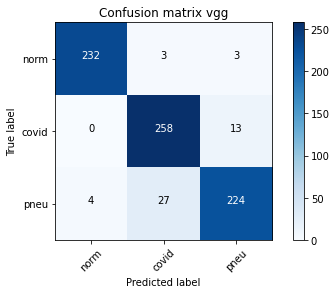

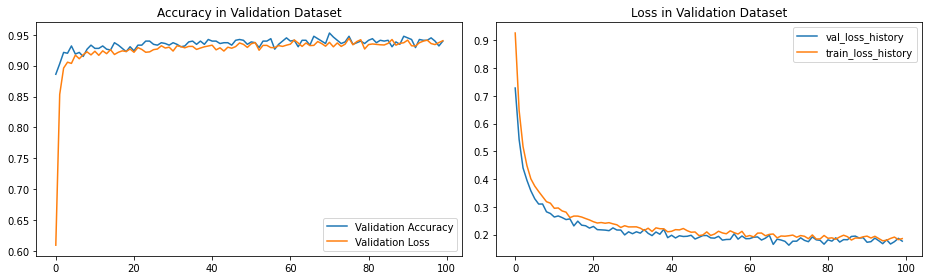


==== END ====
[[231   3   4]
 [  0 257  14]
 [  7  20 228]]

Sensitivity or recall total
0.93717277486911

Sensitivity or recall per classes
[0.97 0.95 0.89]

Precision
[0.97 0.92 0.93]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7485 Acc: 0.7697
val Loss: 0.5099 Acc: 0.9215

Epoch 1/99
----------
train Loss: 0.4512 Acc: 0.9112
val Loss: 0.3593 Acc: 0.9241

Epoch 2/99
----------
train Loss: 0.3553 Acc: 0.9155
val Loss: 0.3007 Acc: 0.9202

Epoch 3/99
----------
train Loss: 0.3075 Acc: 0.9178
val Loss: 0.2642 Acc: 0.9241

Epoch 4/99
----------
train Loss: 0.2796 Acc: 0.9204
val Loss: 0.2493 Acc: 0.9332

Epoch 5/99
----------
train Loss: 0.2516 Acc: 0.9302
val Loss: 0.2224 Acc: 0.9306

Epo

train Loss: 0.1539 Acc: 0.9463
val Loss: 0.1445 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1517 Acc: 0.9460
val Loss: 0.1471 Acc: 0.9437

Epoch 93/99
----------
train Loss: 0.1502 Acc: 0.9466
val Loss: 0.1456 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1445 Acc: 0.9479
val Loss: 0.1497 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1392 Acc: 0.9482
val Loss: 0.1597 Acc: 0.9437

Epoch 96/99
----------
train Loss: 0.1401 Acc: 0.9489
val Loss: 0.1372 Acc: 0.9568

Epoch 97/99
----------
train Loss: 0.1462 Acc: 0.9466
val Loss: 0.1577 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1525 Acc: 0.9381
val Loss: 0.1620 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1347 Acc: 0.9519
val Loss: 0.1519 Acc: 0.9463


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 31s
Best val Acc: 0.956806
##############################


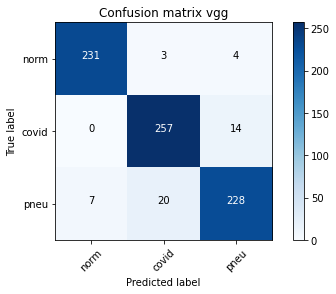

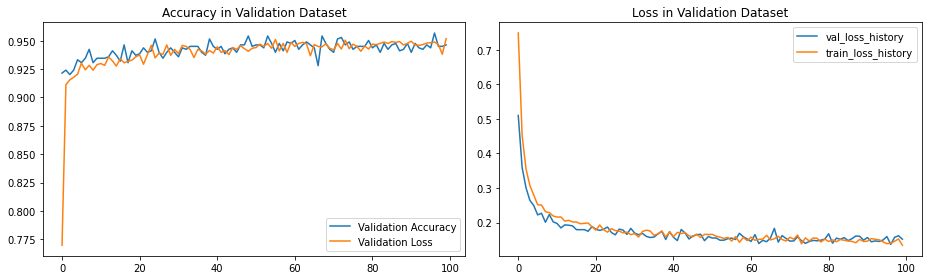


==== END ====
[[232   3   3]
 [  0 258  13]
 [  1  17 237]]

Sensitivity or recall total
0.9515706806282722

Sensitivity or recall per classes
[0.97 0.95 0.93]

Precision
[1.   0.93 0.94]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5353 Acc: 0.8605
val Loss: 0.3548 Acc: 0.9188

Epoch 1/99
----------
train Loss: 0.3433 Acc: 0.9086
val Loss: 0.2850 Acc: 0.9280

Epoch 2/99
----------
train Loss: 0.2914 Acc: 0.9152
val Loss: 0.2509 Acc: 0.9293

Epoch 3/99
----------
train Loss: 0.2689 Acc: 0.9243
val Loss: 0.2381 Acc: 0.9241

Epoch 4/99
----------
train Loss: 0.2507 Acc: 0.9247
val Loss: 0.2111 Acc: 0.9332

Epoch 5/99
----------
train Loss: 0.2348 Acc: 0.9237
val Loss: 0.2182 Acc: 0.9306

E

train Loss: 0.1479 Acc: 0.9460
val Loss: 0.1501 Acc: 0.9516

Epoch 92/99
----------
train Loss: 0.1477 Acc: 0.9469
val Loss: 0.1479 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1592 Acc: 0.9427
val Loss: 0.1636 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1514 Acc: 0.9486
val Loss: 0.1531 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1421 Acc: 0.9456
val Loss: 0.1488 Acc: 0.9437

Epoch 96/99
----------
train Loss: 0.1405 Acc: 0.9522
val Loss: 0.1538 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1287 Acc: 0.9558
val Loss: 0.1555 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1486 Acc: 0.9469
val Loss: 0.1524 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1375 Acc: 0.9489
val Loss: 0.1548 Acc: 0.9490


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 25s
Best val Acc: 0.952880
##############################


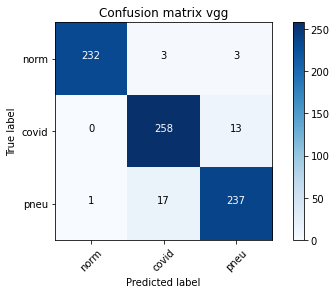

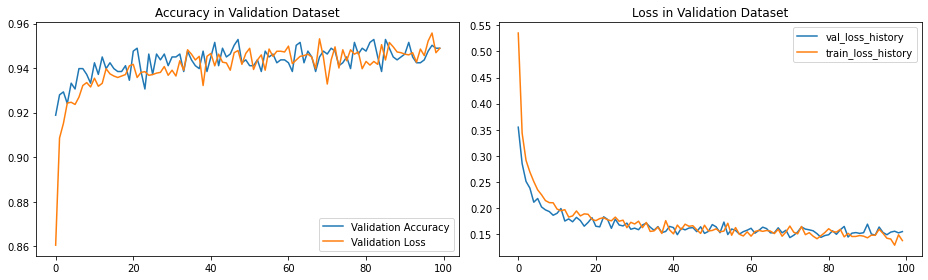


==== END ====
[[232   3   3]
 [  0 261  10]
 [  4  19 232]]

Sensitivity or recall total
0.9489528795811518

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.98 0.92 0.95]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9096 Acc: 0.6151
val Loss: 0.7152 Acc: 0.8757

Epoch 1/99
----------
train Loss: 0.6436 Acc: 0.8549
val Loss: 0.5465 Acc: 0.8992

Epoch 2/99
----------
train Loss: 0.5187 Acc: 0.8906
val Loss: 0.4497 Acc: 0.9045

Epoch 3/99
----------
train Loss: 0.4469 Acc: 0.9070
val Loss: 0.3924 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.4083 Acc: 0.8981
val Loss: 0.3653 Acc: 0.9202

Epoch 5/99
----------
train Loss: 0.3758 Acc: 0.9109
val Loss: 0.3373 Acc: 0.9110

E

train Loss: 0.1729 Acc: 0.9440
val Loss: 0.1871 Acc: 0.9332

Epoch 92/99
----------
train Loss: 0.1963 Acc: 0.9312
val Loss: 0.1752 Acc: 0.9385

Epoch 93/99
----------
train Loss: 0.1936 Acc: 0.9289
val Loss: 0.1857 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1851 Acc: 0.9374
val Loss: 0.1913 Acc: 0.9385

Epoch 95/99
----------
train Loss: 0.1793 Acc: 0.9401
val Loss: 0.1744 Acc: 0.9359

Epoch 96/99
----------
train Loss: 0.1842 Acc: 0.9374
val Loss: 0.1697 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.1739 Acc: 0.9414
val Loss: 0.1712 Acc: 0.9411

Epoch 98/99
----------
train Loss: 0.1865 Acc: 0.9397
val Loss: 0.1562 Acc: 0.9398

Epoch 99/99
----------
train Loss: 0.1837 Acc: 0.9374
val Loss: 0.1719 Acc: 0.9411


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 22s
Best val Acc: 0.943717
##############################


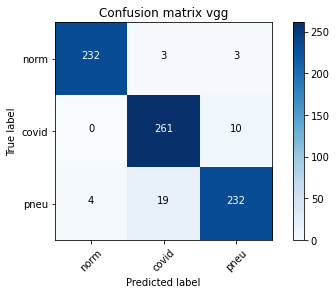

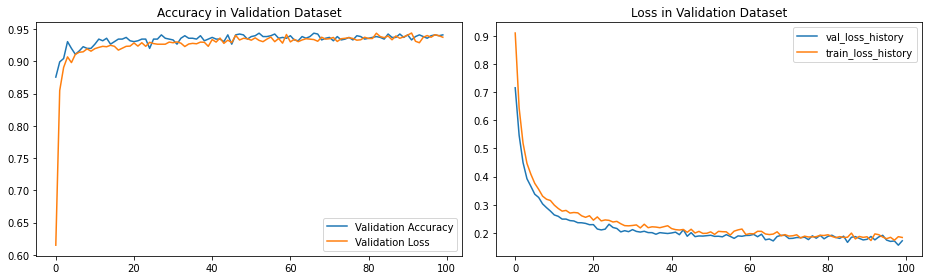


==== END ====
[[232   2   4]
 [  0 253  18]
 [  6  20 229]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.97 0.93 0.9 ]

Precision
[0.97 0.92 0.91]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7645 Acc: 0.7642
val Loss: 0.5238 Acc: 0.8992

Epoch 1/99
----------
train Loss: 0.4545 Acc: 0.8981
val Loss: 0.3595 Acc: 0.9293

Epoch 2/99
----------
train Loss: 0.3577 Acc: 0.9086
val Loss: 0.3055 Acc: 0.9293

Epoch 3/99
----------
train Loss: 0.3145 Acc: 0.9152
val Loss: 0.2711 Acc: 0.9267

Epoch 4/99
----------
train Loss: 0.2819 Acc: 0.9188
val Loss: 0.2395 Acc: 0.9385

Epoch 5/99
----------
train Loss: 0.2587 Acc: 0.9211
val Loss: 0.2164 Acc: 0.9385

E

train Loss: 0.1477 Acc: 0.9522
val Loss: 0.1462 Acc: 0.9490

Epoch 92/99
----------
train Loss: 0.1448 Acc: 0.9545
val Loss: 0.1522 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1529 Acc: 0.9430
val Loss: 0.1806 Acc: 0.9332

Epoch 94/99
----------
train Loss: 0.1540 Acc: 0.9453
val Loss: 0.1751 Acc: 0.9398

Epoch 95/99
----------
train Loss: 0.1628 Acc: 0.9417
val Loss: 0.1447 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1424 Acc: 0.9489
val Loss: 0.1491 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1377 Acc: 0.9469
val Loss: 0.1493 Acc: 0.9463

Epoch 98/99
----------
train Loss: 0.1509 Acc: 0.9460
val Loss: 0.1596 Acc: 0.9424

Epoch 99/99
----------
train Loss: 0.1346 Acc: 0.9555
val Loss: 0.1472 Acc: 0.9450


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 18s
Best val Acc: 0.956806
##############################


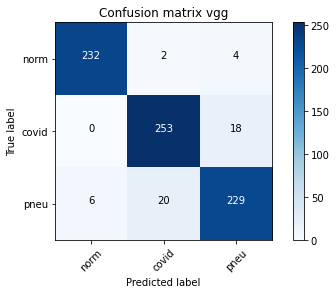

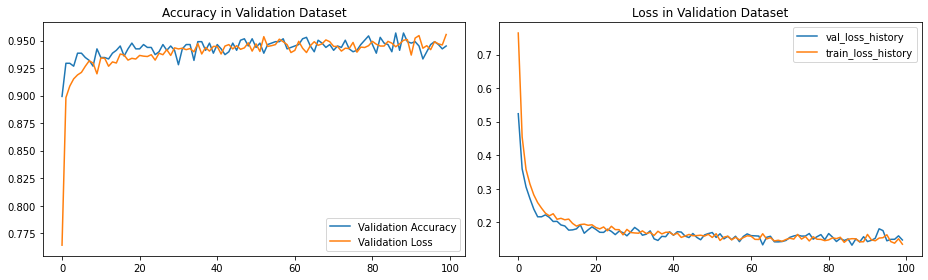


==== END ====
[[231   3   4]
 [  1 255  15]
 [  5  16 234]]

Sensitivity or recall total
0.9424083769633508

Sensitivity or recall per classes
[0.97 0.94 0.92]

Precision
[0.97 0.93 0.92]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5555 Acc: 0.8533
val Loss: 0.3698 Acc: 0.9228

Epoch 1/99
----------
train Loss: 0.3524 Acc: 0.9194
val Loss: 0.2936 Acc: 0.9202

Epoch 2/99
----------
train Loss: 0.3027 Acc: 0.9175
val Loss: 0.2621 Acc: 0.9306

Epoch 3/99
----------
train Loss: 0.2703 Acc: 0.9224
val Loss: 0.2352 Acc: 0.9332

Epoch 4/99
----------
train Loss: 0.2471 Acc: 0.9243
val Loss: 0.2311 Acc: 0.9319

Epoch 5/99
----------
train Loss: 0.2332 Acc: 0.9279
val Loss: 0.2123 Acc: 0.9372

E

train Loss: 0.1358 Acc: 0.9535
val Loss: 0.1592 Acc: 0.9463

Epoch 92/99
----------
train Loss: 0.1548 Acc: 0.9440
val Loss: 0.1463 Acc: 0.9463

Epoch 93/99
----------
train Loss: 0.1488 Acc: 0.9486
val Loss: 0.1534 Acc: 0.9437

Epoch 94/99
----------
train Loss: 0.1387 Acc: 0.9515
val Loss: 0.1540 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1522 Acc: 0.9443
val Loss: 0.1434 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1511 Acc: 0.9486
val Loss: 0.1323 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.1440 Acc: 0.9515
val Loss: 0.1425 Acc: 0.9503

Epoch 98/99
----------
train Loss: 0.1447 Acc: 0.9463
val Loss: 0.1558 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1477 Acc: 0.9456
val Loss: 0.1619 Acc: 0.9476


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.956806
##############################


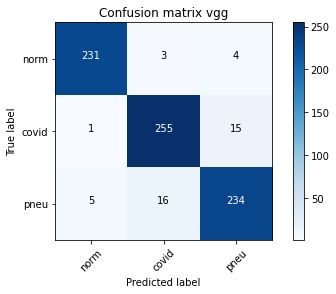

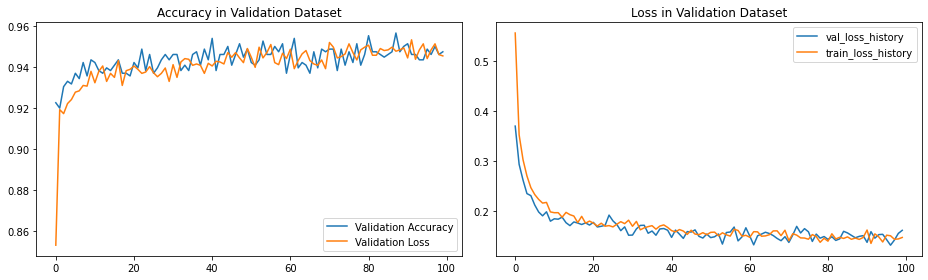


==== END ====
[[233   3   2]
 [  0 259  12]
 [  2  17 236]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.98 0.96 0.93]

Precision
[0.99 0.93 0.94]

F1 Score
[0.99 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0737 Acc: 0.4039
val Loss: 1.0155 Acc: 0.6060

Epoch 1/99
----------
train Loss: 1.0122 Acc: 0.5188
val Loss: 0.9629 Acc: 0.6872

Epoch 2/99
----------
train Loss: 0.9630 Acc: 0.5837
val Loss: 0.9185 Acc: 0.7369

Epoch 3/99
----------
train Loss: 0.9166 Acc: 0.6669
val Loss: 0.8699 Acc: 0.8168

Epoch 4/99
----------
train Loss: 0.8771 Acc: 0.6924
val Loss: 0.8367 Acc: 0.8298

Epoch 5/99
----------
train Loss: 0.8483 Acc: 0.7268
val Loss: 0.8023 Acc: 0.8665

Epo

train Loss: 0.3088 Acc: 0.9178
val Loss: 0.2863 Acc: 0.9228

Epoch 92/99
----------
train Loss: 0.3227 Acc: 0.9125
val Loss: 0.2907 Acc: 0.9241

Epoch 93/99
----------
train Loss: 0.3137 Acc: 0.9184
val Loss: 0.2970 Acc: 0.9254

Epoch 94/99
----------
train Loss: 0.3216 Acc: 0.9125
val Loss: 0.2804 Acc: 0.9306

Epoch 95/99
----------
train Loss: 0.3080 Acc: 0.9256
val Loss: 0.2852 Acc: 0.9293

Epoch 96/99
----------
train Loss: 0.3048 Acc: 0.9230
val Loss: 0.2803 Acc: 0.9385

Epoch 97/99
----------
train Loss: 0.3159 Acc: 0.9139
val Loss: 0.2871 Acc: 0.9293

Epoch 98/99
----------
train Loss: 0.3063 Acc: 0.9132
val Loss: 0.2755 Acc: 0.9241

Epoch 99/99
----------
train Loss: 0.3037 Acc: 0.9171
val Loss: 0.2770 Acc: 0.9228


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 20s
Best val Acc: 0.938482
##############################


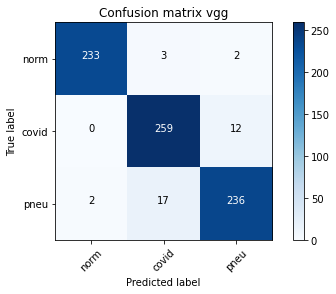

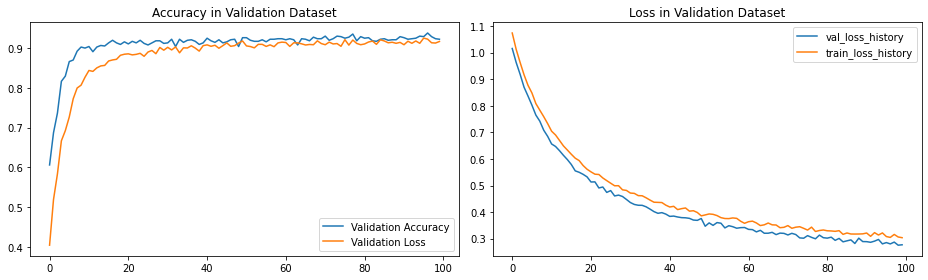


==== END ====
[[232   3   3]
 [  2 253  16]
 [  7  19 229]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.97 0.93 0.9 ]

Precision
[0.96 0.92 0.92]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0941 Acc: 0.3711
val Loss: 1.0350 Acc: 0.4660

Epoch 1/99
----------
train Loss: 0.9995 Acc: 0.5156
val Loss: 0.9362 Acc: 0.7356

Epoch 2/99
----------
train Loss: 0.9170 Acc: 0.6587
val Loss: 0.8547 Acc: 0.8272

Epoch 3/99
----------
train Loss: 0.8429 Acc: 0.7468
val Loss: 0.7789 Acc: 0.8809

Epoch 4/99
----------
train Loss: 0.7836 Acc: 0.7858
val Loss: 0.7256 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.7282 Acc: 0.8290
val Loss: 0.6754 Acc: 0.8966

Epo

train Loss: 0.2094 Acc: 0.9358
val Loss: 0.1907 Acc: 0.9398

Epoch 92/99
----------
train Loss: 0.2171 Acc: 0.9309
val Loss: 0.1898 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.2238 Acc: 0.9296
val Loss: 0.2053 Acc: 0.9332

Epoch 94/99
----------
train Loss: 0.2178 Acc: 0.9253
val Loss: 0.1986 Acc: 0.9385

Epoch 95/99
----------
train Loss: 0.2137 Acc: 0.9322
val Loss: 0.1850 Acc: 0.9372

Epoch 96/99
----------
train Loss: 0.2168 Acc: 0.9302
val Loss: 0.1977 Acc: 0.9319

Epoch 97/99
----------
train Loss: 0.2115 Acc: 0.9306
val Loss: 0.1921 Acc: 0.9359

Epoch 98/99
----------
train Loss: 0.2161 Acc: 0.9322
val Loss: 0.1960 Acc: 0.9385

Epoch 99/99
----------
train Loss: 0.2080 Acc: 0.9342
val Loss: 0.1907 Acc: 0.9385


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 22s
Best val Acc: 0.945026
##############################


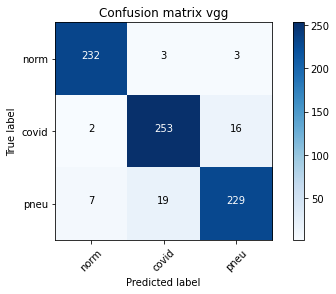

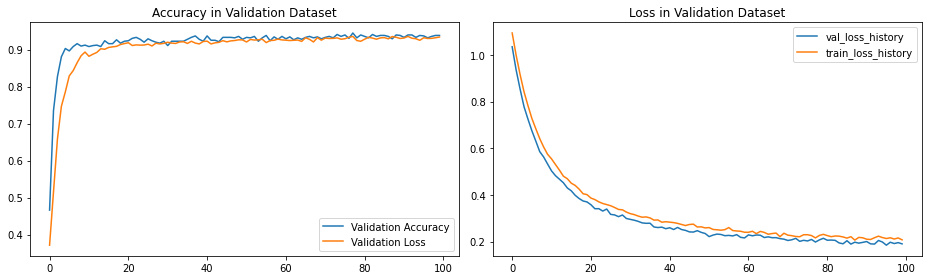


==== END ====
[[232   3   3]
 [  0 257  14]
 [  3  26 226]]

Sensitivity or recall total
0.9358638743455497

Sensitivity or recall per classes
[0.97 0.95 0.89]

Precision
[0.99 0.9  0.93]

F1 Score
[0.98 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0009 Acc: 0.5267
val Loss: 0.9064 Acc: 0.8010

Epoch 1/99
----------
train Loss: 0.8858 Acc: 0.7052
val Loss: 0.8205 Acc: 0.8639

Epoch 2/99
----------
train Loss: 0.8057 Acc: 0.7891
val Loss: 0.7445 Acc: 0.8861

Epoch 3/99
----------
train Loss: 0.7437 Acc: 0.8228
val Loss: 0.6902 Acc: 0.8848

Epoch 4/99
----------
train Loss: 0.6876 Acc: 0.8519
val Loss: 0.6393 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.6434 Acc: 0.8693
val Loss: 0.5916 Acc: 0.9110

Epo

train Loss: 0.2084 Acc: 0.9273
val Loss: 0.1724 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.2103 Acc: 0.9279
val Loss: 0.1919 Acc: 0.9332

Epoch 93/99
----------
train Loss: 0.2127 Acc: 0.9329
val Loss: 0.1945 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.2106 Acc: 0.9329
val Loss: 0.1874 Acc: 0.9398

Epoch 95/99
----------
train Loss: 0.2010 Acc: 0.9355
val Loss: 0.1952 Acc: 0.9346

Epoch 96/99
----------
train Loss: 0.2065 Acc: 0.9329
val Loss: 0.1907 Acc: 0.9306

Epoch 97/99
----------
train Loss: 0.2142 Acc: 0.9273
val Loss: 0.1933 Acc: 0.9306

Epoch 98/99
----------
train Loss: 0.1935 Acc: 0.9381
val Loss: 0.2027 Acc: 0.9332

Epoch 99/99
----------
train Loss: 0.1959 Acc: 0.9414
val Loss: 0.1959 Acc: 0.9385


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 21s
Best val Acc: 0.943717
##############################


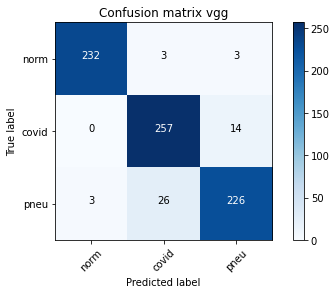

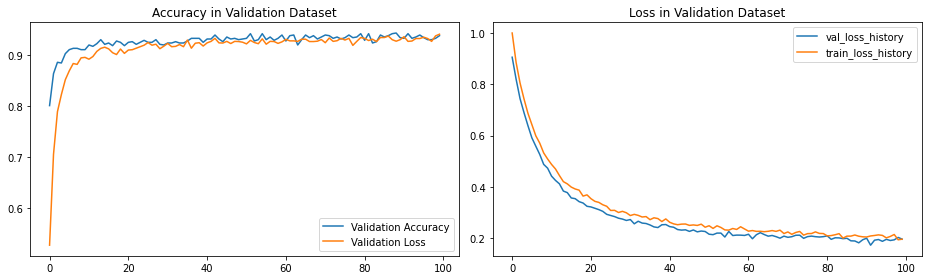


==== END ====
[[228   3   7]
 [  0 261  10]
 [  6  24 225]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.96 0.96 0.88]

Precision
[0.97 0.91 0.93]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0946 Acc: 0.3691
val Loss: 1.0488 Acc: 0.4686

Epoch 1/99
----------
train Loss: 1.0336 Acc: 0.4818
val Loss: 0.9889 Acc: 0.6217

Epoch 2/99
----------
train Loss: 0.9866 Acc: 0.5486
val Loss: 0.9408 Acc: 0.6819

Epoch 3/99
----------
train Loss: 0.9407 Acc: 0.6214
val Loss: 0.8980 Acc: 0.7853

Epoch 4/99
----------
train Loss: 0.8941 Acc: 0.6803
val Loss: 0.8488 Acc: 0.8272

Epoch 5/99
----------
train Loss: 0.8599 Acc: 0.7144
val Loss: 0.8156 Acc: 0.8272

Ep

train Loss: 0.3086 Acc: 0.9204
val Loss: 0.2804 Acc: 0.9267

Epoch 92/99
----------
train Loss: 0.3146 Acc: 0.9155
val Loss: 0.2844 Acc: 0.9332

Epoch 93/99
----------
train Loss: 0.3119 Acc: 0.9194
val Loss: 0.2768 Acc: 0.9267

Epoch 94/99
----------
train Loss: 0.3082 Acc: 0.9224
val Loss: 0.2837 Acc: 0.9228

Epoch 95/99
----------
train Loss: 0.3131 Acc: 0.9135
val Loss: 0.2790 Acc: 0.9293

Epoch 96/99
----------
train Loss: 0.3048 Acc: 0.9211
val Loss: 0.2822 Acc: 0.9267

Epoch 97/99
----------
train Loss: 0.3100 Acc: 0.9175
val Loss: 0.2817 Acc: 0.9110

Epoch 98/99
----------
train Loss: 0.3052 Acc: 0.9168
val Loss: 0.2784 Acc: 0.9267

Epoch 99/99
----------
train Loss: 0.3047 Acc: 0.9168
val Loss: 0.2778 Acc: 0.9241


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 25s
Best val Acc: 0.933246
##############################


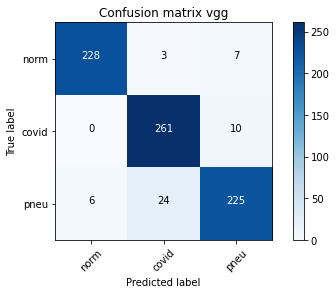

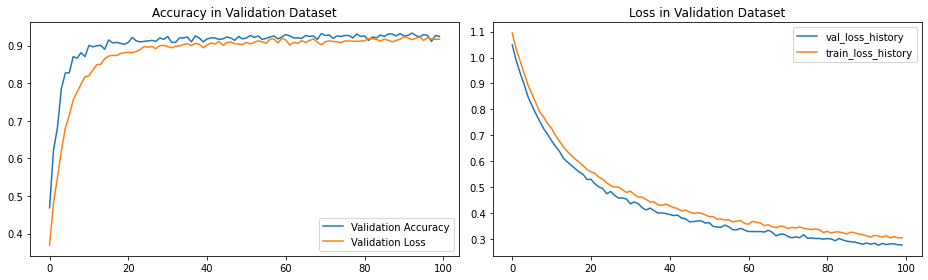


==== END ====
[[232   3   3]
 [  0 259  12]
 [  5  27 223]]

Sensitivity or recall total
0.9345549738219895

Sensitivity or recall per classes
[0.97 0.96 0.87]

Precision
[0.98 0.9  0.94]

F1 Score
[0.98 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0573 Acc: 0.4451
val Loss: 0.9886 Acc: 0.6728

Epoch 1/99
----------
train Loss: 0.9677 Acc: 0.5942
val Loss: 0.8917 Acc: 0.8272

Epoch 2/99
----------
train Loss: 0.8913 Acc: 0.6996
val Loss: 0.8269 Acc: 0.8704

Epoch 3/99
----------
train Loss: 0.8178 Acc: 0.7740
val Loss: 0.7627 Acc: 0.8966

Epoch 4/99
----------
train Loss: 0.7614 Acc: 0.8198
val Loss: 0.6969 Acc: 0.8953

Epoch 5/99
----------
train Loss: 0.7072 Acc: 0.8474
val Loss: 0.6469 Acc: 0.8992

Ep

train Loss: 0.2135 Acc: 0.9306
val Loss: 0.1900 Acc: 0.9411

Epoch 92/99
----------
train Loss: 0.2134 Acc: 0.9302
val Loss: 0.2099 Acc: 0.9293

Epoch 93/99
----------
train Loss: 0.2035 Acc: 0.9348
val Loss: 0.1926 Acc: 0.9372

Epoch 94/99
----------
train Loss: 0.2123 Acc: 0.9302
val Loss: 0.1843 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.2089 Acc: 0.9292
val Loss: 0.1950 Acc: 0.9346

Epoch 96/99
----------
train Loss: 0.2102 Acc: 0.9279
val Loss: 0.2045 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.2163 Acc: 0.9270
val Loss: 0.1989 Acc: 0.9385

Epoch 98/99
----------
train Loss: 0.2116 Acc: 0.9266
val Loss: 0.1917 Acc: 0.9372

Epoch 99/99
----------
train Loss: 0.2096 Acc: 0.9345
val Loss: 0.2008 Acc: 0.9398


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.947644
##############################


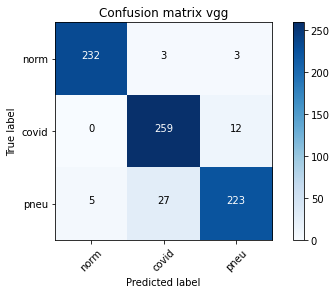

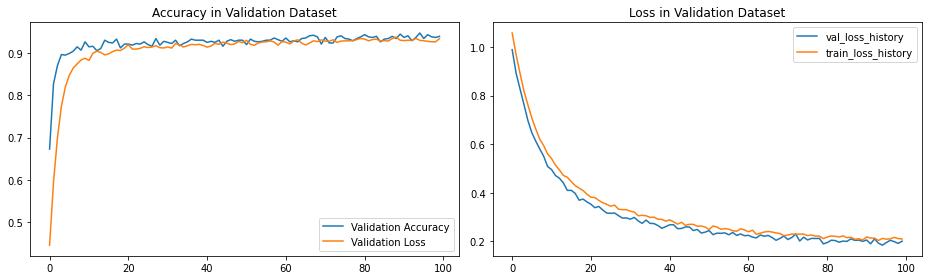


==== END ====
[[230   4   4]
 [  0 257  14]
 [  6  23 226]]

Sensitivity or recall total
0.9332460732984293

Sensitivity or recall per classes
[0.97 0.95 0.89]

Precision
[0.97 0.9  0.93]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9952 Acc: 0.5421
val Loss: 0.9057 Acc: 0.8102

Epoch 1/99
----------
train Loss: 0.8796 Acc: 0.7029
val Loss: 0.8160 Acc: 0.8455

Epoch 2/99
----------
train Loss: 0.8023 Acc: 0.7861
val Loss: 0.7509 Acc: 0.8665

Epoch 3/99
----------
train Loss: 0.7447 Acc: 0.8136
val Loss: 0.6875 Acc: 0.8887

Epoch 4/99
----------
train Loss: 0.6893 Acc: 0.8464
val Loss: 0.6412 Acc: 0.8887

Epoch 5/99
----------
train Loss: 0.6463 Acc: 0.8588
val Loss: 0.5996 Acc: 0.8887

Ep

train Loss: 0.2100 Acc: 0.9332
val Loss: 0.1970 Acc: 0.9332

Epoch 92/99
----------
train Loss: 0.2015 Acc: 0.9332
val Loss: 0.1889 Acc: 0.9359

Epoch 93/99
----------
train Loss: 0.2106 Acc: 0.9276
val Loss: 0.1887 Acc: 0.9319

Epoch 94/99
----------
train Loss: 0.2099 Acc: 0.9335
val Loss: 0.1880 Acc: 0.9332

Epoch 95/99
----------
train Loss: 0.2056 Acc: 0.9332
val Loss: 0.2017 Acc: 0.9346

Epoch 96/99
----------
train Loss: 0.2075 Acc: 0.9283
val Loss: 0.1933 Acc: 0.9267

Epoch 97/99
----------
train Loss: 0.1997 Acc: 0.9332
val Loss: 0.2030 Acc: 0.9319

Epoch 98/99
----------
train Loss: 0.2039 Acc: 0.9348
val Loss: 0.1878 Acc: 0.9372

Epoch 99/99
----------
train Loss: 0.2079 Acc: 0.9276
val Loss: 0.1905 Acc: 0.9411


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 27s
Best val Acc: 0.945026
##############################


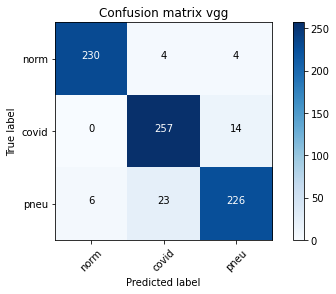

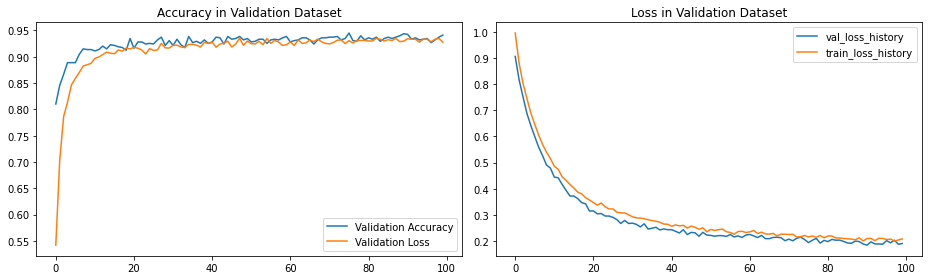


==== END ====
[[232   3   3]
 [  1 251  19]
 [  6  20 229]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.97 0.93 0.9 ]

Precision
[0.97 0.92 0.91]

F1 Score
[0.97 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1121 Acc: 0.3567
val Loss: 1.0711 Acc: 0.4594

Epoch 1/99
----------
train Loss: 1.0497 Acc: 0.4592
val Loss: 1.0125 Acc: 0.5995

Epoch 2/99
----------
train Loss: 0.9909 Acc: 0.5529
val Loss: 0.9606 Acc: 0.7277

Epoch 3/99
----------
train Loss: 0.9500 Acc: 0.6230
val Loss: 0.9072 Acc: 0.8154

Epoch 4/99
----------
train Loss: 0.9015 Acc: 0.6885
val Loss: 0.8707 Acc: 0.8377

Epoch 5/99
----------
train Loss: 0.8679 Acc: 0.7239
val Loss: 0.8214 Acc: 0.8691

Ep

train Loss: 0.3142 Acc: 0.9152
val Loss: 0.2879 Acc: 0.9241

Epoch 92/99
----------
train Loss: 0.3104 Acc: 0.9240
val Loss: 0.2861 Acc: 0.9319

Epoch 93/99
----------
train Loss: 0.3126 Acc: 0.9152
val Loss: 0.2780 Acc: 0.9215

Epoch 94/99
----------
train Loss: 0.3147 Acc: 0.9184
val Loss: 0.2864 Acc: 0.9188

Epoch 95/99
----------
train Loss: 0.3059 Acc: 0.9256
val Loss: 0.2816 Acc: 0.9306

Epoch 96/99
----------
train Loss: 0.3065 Acc: 0.9132
val Loss: 0.2918 Acc: 0.9280

Epoch 97/99
----------
train Loss: 0.3007 Acc: 0.9250
val Loss: 0.2904 Acc: 0.9175

Epoch 98/99
----------
train Loss: 0.3095 Acc: 0.9175
val Loss: 0.2757 Acc: 0.9306

Epoch 99/99
----------
train Loss: 0.3009 Acc: 0.9204
val Loss: 0.2829 Acc: 0.9162


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 30m 29s
Best val Acc: 0.934555
##############################


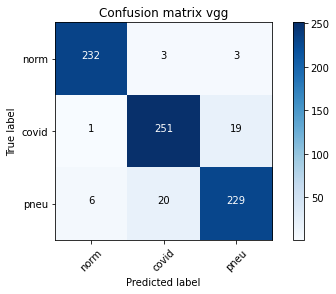

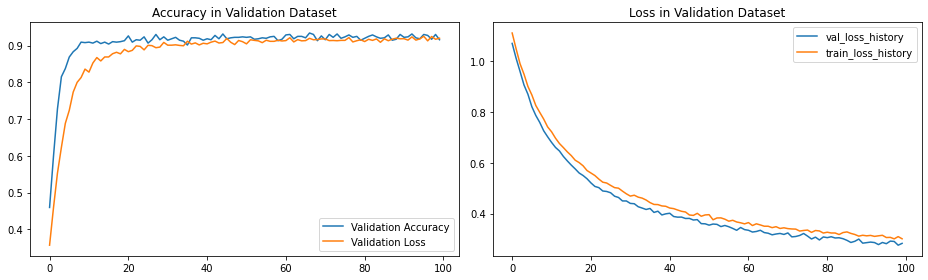


==== END ====
[[229   3   6]
 [  0 251  20]
 [  5  30 220]]

Sensitivity or recall total
0.9162303664921466

Sensitivity or recall per classes
[0.96 0.93 0.86]

Precision
[0.98 0.88 0.89]

F1 Score
[0.97 0.9  0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0684 Acc: 0.4229
val Loss: 0.9959 Acc: 0.6780

Epoch 1/99
----------
train Loss: 0.9692 Acc: 0.5860
val Loss: 0.8976 Acc: 0.8403

Epoch 2/99
----------
train Loss: 0.8837 Acc: 0.7127
val Loss: 0.8264 Acc: 0.8599

Epoch 3/99
----------
train Loss: 0.8192 Acc: 0.7688
val Loss: 0.7571 Acc: 0.8992

Epoch 4/99
----------
train Loss: 0.7599 Acc: 0.8143
val Loss: 0.7082 Acc: 0.8914

Epoch 5/99
----------
train Loss: 0.7119 Acc: 0.8379
val Loss: 0.6630 Acc: 0.8874

Ep

train Loss: 0.2120 Acc: 0.9319
val Loss: 0.2078 Acc: 0.9306

Epoch 92/99
----------
train Loss: 0.2098 Acc: 0.9361
val Loss: 0.2062 Acc: 0.9241

Epoch 93/99
----------
train Loss: 0.2077 Acc: 0.9348
val Loss: 0.2029 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.2041 Acc: 0.9365
val Loss: 0.1858 Acc: 0.9411

Epoch 95/99
----------
train Loss: 0.2136 Acc: 0.9348
val Loss: 0.1921 Acc: 0.9411

Epoch 96/99
----------
train Loss: 0.2120 Acc: 0.9302
val Loss: 0.1935 Acc: 0.9293

Epoch 97/99
----------
train Loss: 0.2079 Acc: 0.9338
val Loss: 0.1917 Acc: 0.9359

Epoch 98/99
----------
train Loss: 0.2096 Acc: 0.9345
val Loss: 0.1953 Acc: 0.9293

Epoch 99/99
----------
train Loss: 0.2016 Acc: 0.9371
val Loss: 0.1972 Acc: 0.9359


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.945026
##############################


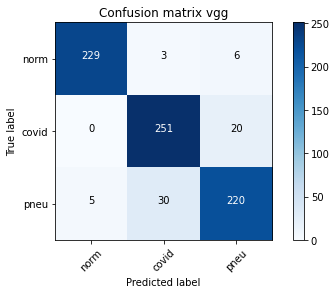

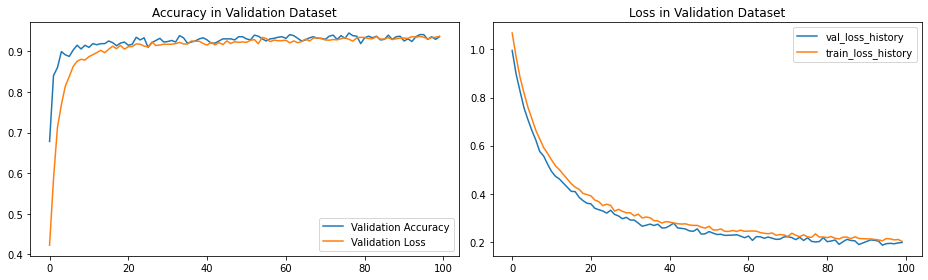


==== END ====
[[232   2   4]
 [  0 255  16]
 [  6  24 225]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.97 0.94 0.88]

Precision
[0.97 0.91 0.92]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 classifier.6.weight
	 classifier.6.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0040 Acc: 0.5175
val Loss: 0.9129 Acc: 0.7958

Epoch 1/99
----------
train Loss: 0.8819 Acc: 0.7101
val Loss: 0.8220 Acc: 0.8678

Epoch 2/99
----------
train Loss: 0.8127 Acc: 0.7776
val Loss: 0.7592 Acc: 0.8783

Epoch 3/99
----------
train Loss: 0.7481 Acc: 0.8238
val Loss: 0.6984 Acc: 0.8953

Epoch 4/99
----------
train Loss: 0.7013 Acc: 0.8372
val Loss: 0.6486 Acc: 0.8901

Epoch 5/99
----------
train Loss: 0.6490 Acc: 0.8634
val Loss: 0.6071 Acc: 0.9071

Ep

train Loss: 0.2084 Acc: 0.9292
val Loss: 0.1934 Acc: 0.9398

Epoch 92/99
----------
train Loss: 0.2068 Acc: 0.9332
val Loss: 0.1941 Acc: 0.9306

Epoch 93/99
----------
train Loss: 0.2076 Acc: 0.9332
val Loss: 0.1960 Acc: 0.9372

Epoch 94/99
----------
train Loss: 0.1998 Acc: 0.9358
val Loss: 0.2097 Acc: 0.9359

Epoch 95/99
----------
train Loss: 0.2102 Acc: 0.9260
val Loss: 0.1992 Acc: 0.9372

Epoch 96/99
----------
train Loss: 0.2053 Acc: 0.9292
val Loss: 0.1902 Acc: 0.9332

Epoch 97/99
----------
train Loss: 0.2044 Acc: 0.9315
val Loss: 0.2032 Acc: 0.9306

Epoch 98/99
----------
train Loss: 0.1909 Acc: 0.9361
val Loss: 0.1973 Acc: 0.9293

Epoch 99/99
----------
train Loss: 0.2053 Acc: 0.9325
val Loss: 0.2079 Acc: 0.9293


##############################
------ Summary ------
model -> vgg
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 30m 23s
Best val Acc: 0.948953
##############################


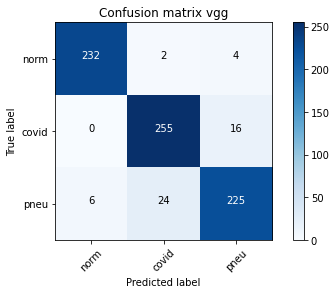

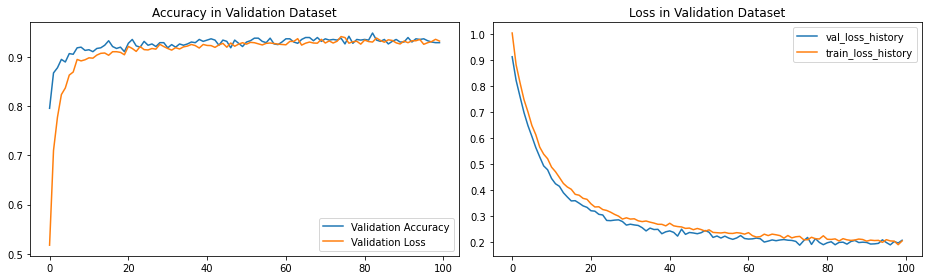


==== END ====
[[231   3   4]
 [  1 252  18]
 [  4  18 233]]

Sensitivity or recall total
0.93717277486911

Sensitivity or recall per classes
[0.97 0.93 0.91]

Precision
[0.98 0.92 0.91]

F1 Score
[0.97 0.93 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8089 Acc: 0.7078
val Loss: 0.5594 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.4970 Acc: 0.8729
val Loss: 0.4151 Acc: 0.9058

Epoch 2/99
----------
train Loss: 0.3969 Acc: 0.8985
val Loss: 0.3514 Acc: 0.9123

Epoch 3/99
----------
train Loss: 0.3472 Acc: 0.9070
val Loss: 0.3211 Acc: 0.9097

Epoch 4/99
----------
train Loss: 0.3304 Acc: 0.9037
val Loss: 0.3129 Acc: 0.9045

Epoch 5/99
----------
train Loss: 0.3053 Acc: 0.9103
val Loss: 0.2823 Acc: 0.9280

Epoch 6/99
--------

train Loss: 0.1832 Acc: 0.9381
val Loss: 0.1503 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1689 Acc: 0.9427
val Loss: 0.1641 Acc: 0.9437

Epoch 93/99
----------
train Loss: 0.1697 Acc: 0.9414
val Loss: 0.1667 Acc: 0.9398

Epoch 94/99
----------
train Loss: 0.1755 Acc: 0.9371
val Loss: 0.1686 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1795 Acc: 0.9407
val Loss: 0.1670 Acc: 0.9450

Epoch 96/99
----------
train Loss: 0.1752 Acc: 0.9424
val Loss: 0.1544 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1688 Acc: 0.9414
val Loss: 0.1583 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1767 Acc: 0.9361
val Loss: 0.1737 Acc: 0.9372

Epoch 99/99
----------
train Loss: 0.1735 Acc: 0.9365
val Loss: 0.1562 Acc: 0.9516


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 23s
Best val Acc: 0.958115
##############################


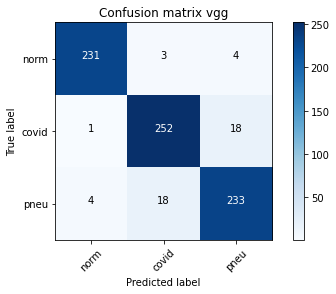

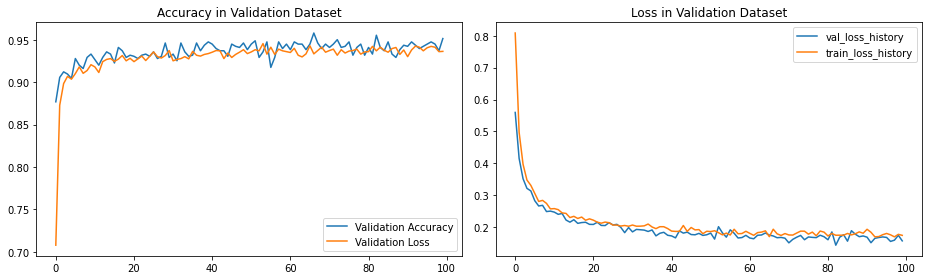


==== END ====
[[231   4   3]
 [  1 259  11]
 [  6  17 232]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.97 0.93 0.94]

F1 Score
[0.97 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6029 Acc: 0.8225
val Loss: 0.3924 Acc: 0.8848

Epoch 1/99
----------
train Loss: 0.3540 Acc: 0.8985
val Loss: 0.3088 Acc: 0.9031

Epoch 2/99
----------
train Loss: 0.2945 Acc: 0.9086
val Loss: 0.2632 Acc: 0.9162

Epoch 3/99
----------
train Loss: 0.2684 Acc: 0.9132
val Loss: 0.2709 Acc: 0.9110

Epoch 4/99
----------
train Loss: 0.2397 Acc: 0.9217
val Loss: 0.2186 Acc: 0.9372

Epoch 5/99
----------
train Loss: 0.2405 Acc: 0.9152
val Loss: 0.2383 Acc: 0.9110

Epoch 6/99
------

train Loss: 0.1638 Acc: 0.9410
val Loss: 0.1675 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1548 Acc: 0.9433
val Loss: 0.1383 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1669 Acc: 0.9410
val Loss: 0.1554 Acc: 0.9516

Epoch 94/99
----------
train Loss: 0.1661 Acc: 0.9433
val Loss: 0.1595 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1736 Acc: 0.9368
val Loss: 0.1384 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1779 Acc: 0.9378
val Loss: 0.1333 Acc: 0.9490

Epoch 97/99
----------
train Loss: 0.1797 Acc: 0.9309
val Loss: 0.1544 Acc: 0.9542

Epoch 98/99
----------
train Loss: 0.1780 Acc: 0.9361
val Loss: 0.1379 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1708 Acc: 0.9378
val Loss: 0.1446 Acc: 0.9463


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 20s
Best val Acc: 0.958115
##############################


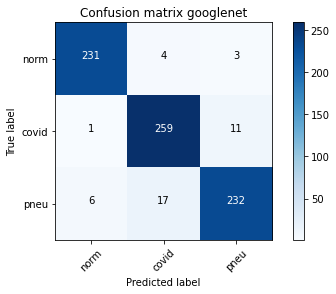

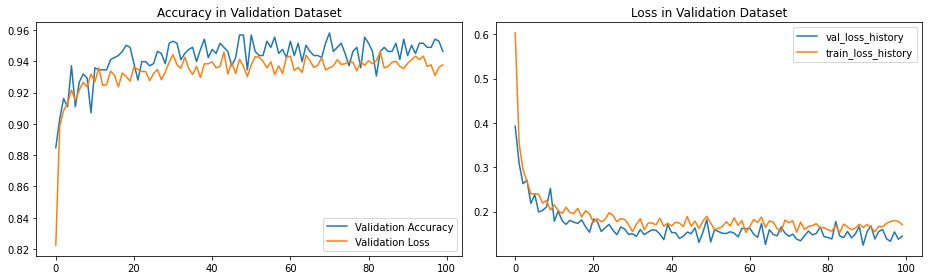


==== END ====
[[230   3   5]
 [  1 260  10]
 [  3  20 232]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.98 0.92 0.94]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5339 Acc: 0.8221
val Loss: 0.4515 Acc: 0.8272

Epoch 1/99
----------
train Loss: 0.3414 Acc: 0.8899
val Loss: 0.2807 Acc: 0.9175

Epoch 2/99
----------
train Loss: 0.2823 Acc: 0.9129
val Loss: 0.2743 Acc: 0.9045

Epoch 3/99
----------
train Loss: 0.2728 Acc: 0.9057
val Loss: 0.2475 Acc: 0.9215

Epoch 4/99
----------
train Loss: 0.2371 Acc: 0.9243
val Loss: 0.2210 Acc: 0.9228

Epoch 5/99
----------
train Loss: 0.2480 Acc: 0.9155
val Loss: 0.2229 Acc: 0.9280

Epoch 6/99
------

train Loss: 0.1578 Acc: 0.9410
val Loss: 0.1543 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1699 Acc: 0.9348
val Loss: 0.1569 Acc: 0.9476

Epoch 93/99
----------
train Loss: 0.1696 Acc: 0.9378
val Loss: 0.1396 Acc: 0.9529

Epoch 94/99
----------
train Loss: 0.1688 Acc: 0.9391
val Loss: 0.1242 Acc: 0.9634

Epoch 95/99
----------
train Loss: 0.1608 Acc: 0.9397
val Loss: 0.1447 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1507 Acc: 0.9401
val Loss: 0.1564 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1568 Acc: 0.9453
val Loss: 0.1550 Acc: 0.9516

Epoch 98/99
----------
train Loss: 0.1579 Acc: 0.9473
val Loss: 0.1314 Acc: 0.9555

Epoch 99/99
----------
train Loss: 0.1849 Acc: 0.9292
val Loss: 0.1233 Acc: 0.9529


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.963351
##############################


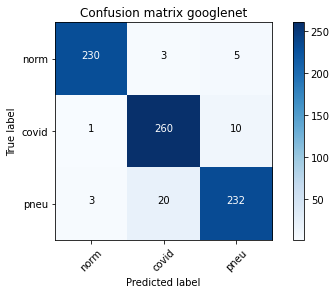

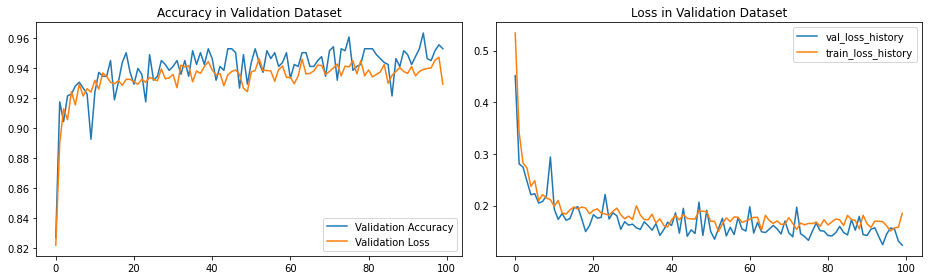


==== END ====
[[233   2   3]
 [  1 254  16]
 [  4  15 236]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.94 0.93]

Precision
[0.98 0.94 0.93]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8116 Acc: 0.7124
val Loss: 0.5593 Acc: 0.8953

Epoch 1/99
----------
train Loss: 0.5003 Acc: 0.8614
val Loss: 0.4133 Acc: 0.9005

Epoch 2/99
----------
train Loss: 0.3982 Acc: 0.8994
val Loss: 0.3728 Acc: 0.8992

Epoch 3/99
----------
train Loss: 0.3588 Acc: 0.8981
val Loss: 0.3348 Acc: 0.9136

Epoch 4/99
----------
train Loss: 0.3250 Acc: 0.9083
val Loss: 0.3076 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.3077 Acc: 0.9125
val Loss: 0.2837 Acc: 0.9175

Epoch 6/99
-----

train Loss: 0.1711 Acc: 0.9384
val Loss: 0.1487 Acc: 0.9516

Epoch 92/99
----------
train Loss: 0.1751 Acc: 0.9371
val Loss: 0.1745 Acc: 0.9385

Epoch 93/99
----------
train Loss: 0.1774 Acc: 0.9381
val Loss: 0.1608 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1791 Acc: 0.9338
val Loss: 0.1531 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1734 Acc: 0.9404
val Loss: 0.1621 Acc: 0.9476

Epoch 96/99
----------
train Loss: 0.1821 Acc: 0.9365
val Loss: 0.1585 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1765 Acc: 0.9342
val Loss: 0.1724 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.1866 Acc: 0.9365
val Loss: 0.1535 Acc: 0.9529

Epoch 99/99
----------
train Loss: 0.1703 Acc: 0.9378
val Loss: 0.1642 Acc: 0.9424


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 17s
Best val Acc: 0.962042
##############################


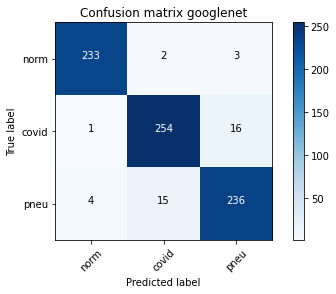

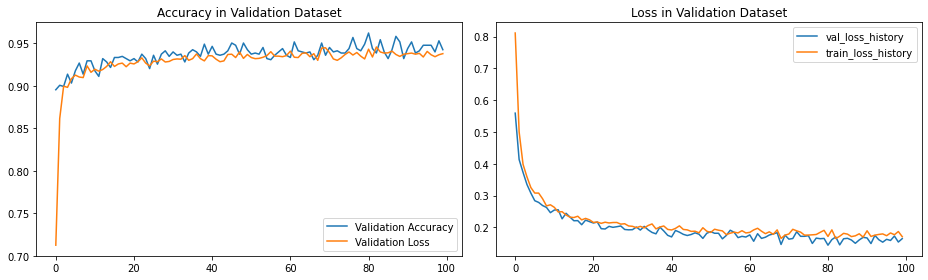


==== END ====
[[232   5   1]
 [  2 255  14]
 [  4  13 238]]

Sensitivity or recall total
0.9489528795811518

Sensitivity or recall per classes
[0.97 0.94 0.93]

Precision
[0.97 0.93 0.94]

F1 Score
[0.97 0.94 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6610 Acc: 0.7661
val Loss: 0.4012 Acc: 0.9123

Epoch 1/99
----------
train Loss: 0.3596 Acc: 0.9004
val Loss: 0.3241 Acc: 0.9149

Epoch 2/99
----------
train Loss: 0.2990 Acc: 0.9086
val Loss: 0.2611 Acc: 0.9202

Epoch 3/99
----------
train Loss: 0.2651 Acc: 0.9158
val Loss: 0.2436 Acc: 0.9202

Epoch 4/99
----------
train Loss: 0.2595 Acc: 0.9129
val Loss: 0.2791 Acc: 0.9136

Epoch 5/99
----------
train Loss: 0.2493 Acc: 0.9129
val Loss: 0.2263 Acc: 0.9162

Epoch 6/99
-----

train Loss: 0.1809 Acc: 0.9348
val Loss: 0.1390 Acc: 0.9476

Epoch 92/99
----------
train Loss: 0.1704 Acc: 0.9427
val Loss: 0.1302 Acc: 0.9542

Epoch 93/99
----------
train Loss: 0.1625 Acc: 0.9417
val Loss: 0.1427 Acc: 0.9490

Epoch 94/99
----------
train Loss: 0.1858 Acc: 0.9306
val Loss: 0.1459 Acc: 0.9594

Epoch 95/99
----------
train Loss: 0.1607 Acc: 0.9371
val Loss: 0.1314 Acc: 0.9555

Epoch 96/99
----------
train Loss: 0.1680 Acc: 0.9387
val Loss: 0.1491 Acc: 0.9411

Epoch 97/99
----------
train Loss: 0.1543 Acc: 0.9446
val Loss: 0.1665 Acc: 0.9359

Epoch 98/99
----------
train Loss: 0.1622 Acc: 0.9371
val Loss: 0.1517 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1674 Acc: 0.9397
val Loss: 0.1285 Acc: 0.9503


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 14s
Best val Acc: 0.962042
##############################


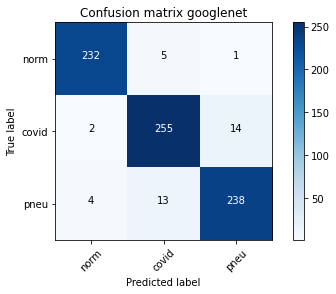

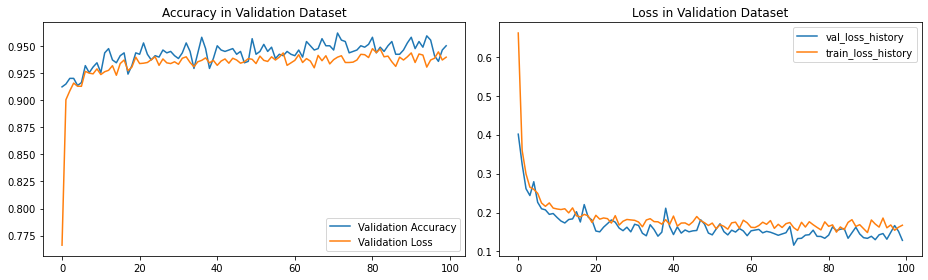


==== END ====
[[233   3   2]
 [  1 263   7]
 [  4  18 233]]

Sensitivity or recall total
0.9541884816753927

Sensitivity or recall per classes
[0.98 0.97 0.91]

Precision
[0.98 0.93 0.96]

F1 Score
[0.98 0.95 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5494 Acc: 0.8100
val Loss: 0.3651 Acc: 0.8992

Epoch 1/99
----------
train Loss: 0.3260 Acc: 0.8958
val Loss: 0.3717 Acc: 0.8586

Epoch 2/99
----------
train Loss: 0.2902 Acc: 0.9093
val Loss: 0.3147 Acc: 0.8848

Epoch 3/99
----------
train Loss: 0.2755 Acc: 0.9080
val Loss: 0.2291 Acc: 0.9202

Epoch 4/99
----------
train Loss: 0.2562 Acc: 0.9080
val Loss: 0.2208 Acc: 0.9306

Epoch 5/99
----------
train Loss: 0.2290 Acc: 0.9214
val Loss: 0.2165 Acc: 0.9267

Epoch 6/99
-----

train Loss: 0.1659 Acc: 0.9381
val Loss: 0.1633 Acc: 0.9411

Epoch 92/99
----------
train Loss: 0.1567 Acc: 0.9420
val Loss: 0.1623 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1714 Acc: 0.9381
val Loss: 0.1348 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1668 Acc: 0.9384
val Loss: 0.1654 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1569 Acc: 0.9410
val Loss: 0.1576 Acc: 0.9398

Epoch 96/99
----------
train Loss: 0.1546 Acc: 0.9450
val Loss: 0.1531 Acc: 0.9437

Epoch 97/99
----------
train Loss: 0.1541 Acc: 0.9440
val Loss: 0.1388 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1751 Acc: 0.9345
val Loss: 0.1534 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1624 Acc: 0.9420
val Loss: 0.1623 Acc: 0.9476


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 19s
Best val Acc: 0.955497
##############################


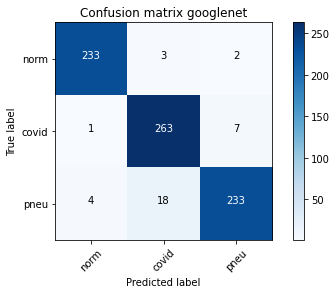

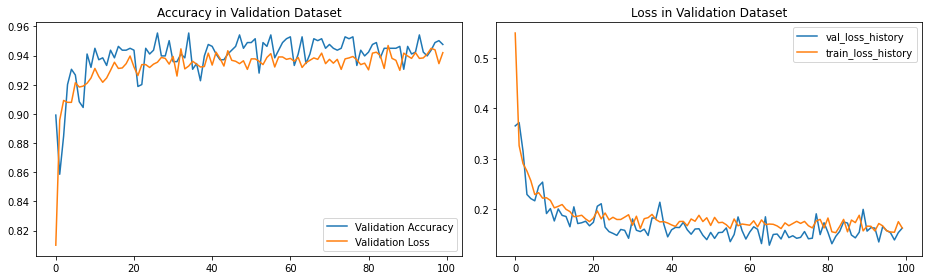


==== END ====
[[231   3   4]
 [  0 258  13]
 [  2  21 232]]

Sensitivity or recall total
0.943717277486911

Sensitivity or recall per classes
[0.97 0.95 0.91]

Precision
[0.99 0.91 0.93]

F1 Score
[0.98 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.7972 Acc: 0.7203
val Loss: 0.5502 Acc: 0.8874

Epoch 1/99
----------
train Loss: 0.5044 Acc: 0.8762
val Loss: 0.4220 Acc: 0.8874

Epoch 2/99
----------
train Loss: 0.3963 Acc: 0.9004
val Loss: 0.3515 Acc: 0.8979

Epoch 3/99
----------
train Loss: 0.3492 Acc: 0.9030
val Loss: 0.3253 Acc: 0.9110

Epoch 4/99
----------
train Loss: 0.3313 Acc: 0.8955
val Loss: 0.2988 Acc: 0.9031

Epoch 5/99
----------
train Loss: 0.3041 Acc: 0.9129
val Loss: 0.2902 Acc: 0.9136

Epoch 6/99
------

train Loss: 0.1714 Acc: 0.9391
val Loss: 0.1555 Acc: 0.9503

Epoch 92/99
----------
train Loss: 0.1783 Acc: 0.9358
val Loss: 0.1795 Acc: 0.9359

Epoch 93/99
----------
train Loss: 0.1770 Acc: 0.9384
val Loss: 0.1586 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1820 Acc: 0.9325
val Loss: 0.1586 Acc: 0.9516

Epoch 95/99
----------
train Loss: 0.1784 Acc: 0.9351
val Loss: 0.1653 Acc: 0.9437

Epoch 96/99
----------
train Loss: 0.1780 Acc: 0.9381
val Loss: 0.1631 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1727 Acc: 0.9417
val Loss: 0.1655 Acc: 0.9411

Epoch 98/99
----------
train Loss: 0.1667 Acc: 0.9440
val Loss: 0.1744 Acc: 0.9450

Epoch 99/99
----------
train Loss: 0.1703 Acc: 0.9381
val Loss: 0.1581 Acc: 0.9503


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 21s
Best val Acc: 0.952880
##############################


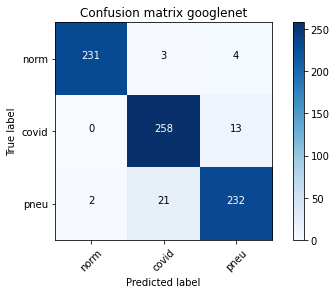

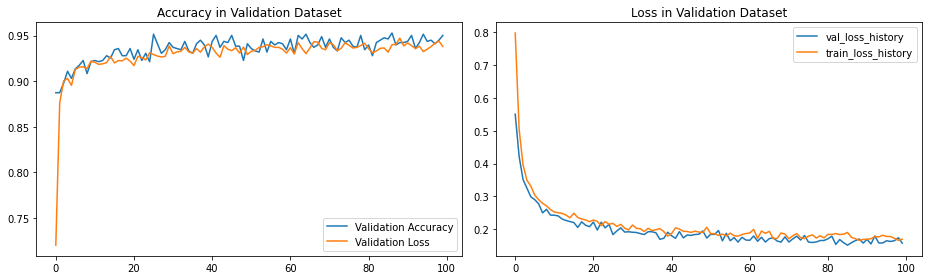


==== END ====
[[233   3   2]
 [  1 258  12]
 [  2  16 237]]

Sensitivity or recall total
0.9528795811518325

Sensitivity or recall per classes
[0.98 0.95 0.93]

Precision
[0.99 0.93 0.94]

F1 Score
[0.98 0.94 0.94]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.6540 Acc: 0.7730
val Loss: 0.4408 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.3778 Acc: 0.8840
val Loss: 0.3068 Acc: 0.9280

Epoch 2/99
----------
train Loss: 0.3112 Acc: 0.9004
val Loss: 0.2543 Acc: 0.9215

Epoch 3/99
----------
train Loss: 0.2660 Acc: 0.9161
val Loss: 0.2355 Acc: 0.9306

Epoch 4/99
----------
train Loss: 0.2502 Acc: 0.9230
val Loss: 0.2265 Acc: 0.9215

Epoch 5/99
----------
train Loss: 0.2407 Acc: 0.9181
val Loss: 0.2197 Acc: 0.9254

Epoch 6/99
-----

train Loss: 0.1677 Acc: 0.9368
val Loss: 0.1894 Acc: 0.9385

Epoch 92/99
----------
train Loss: 0.1714 Acc: 0.9338
val Loss: 0.1417 Acc: 0.9463

Epoch 93/99
----------
train Loss: 0.1722 Acc: 0.9381
val Loss: 0.1386 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1675 Acc: 0.9394
val Loss: 0.1468 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1592 Acc: 0.9381
val Loss: 0.1440 Acc: 0.9516

Epoch 96/99
----------
train Loss: 0.1718 Acc: 0.9391
val Loss: 0.1442 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1537 Acc: 0.9433
val Loss: 0.1624 Acc: 0.9476

Epoch 98/99
----------
train Loss: 0.1788 Acc: 0.9335
val Loss: 0.1577 Acc: 0.9503

Epoch 99/99
----------
train Loss: 0.1673 Acc: 0.9384
val Loss: 0.1259 Acc: 0.9568


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.964660
##############################


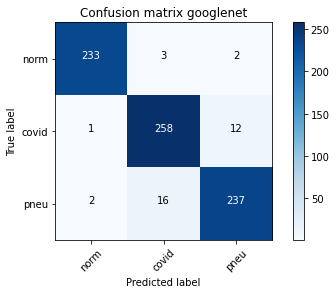

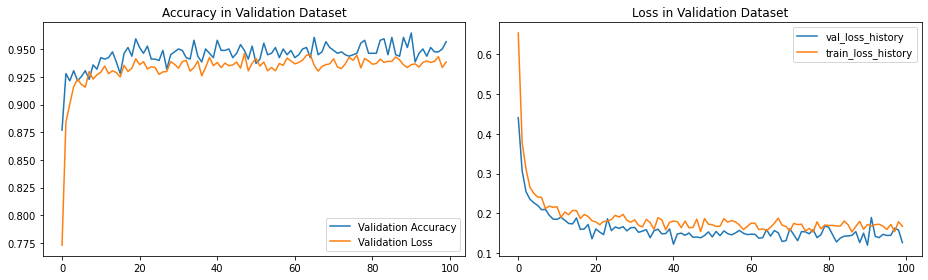


==== END ====
[[234   3   1]
 [  0 253  18]
 [  3  15 237]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.98 0.93 0.93]

Precision
[0.99 0.93 0.93]

F1 Score
[0.99 0.93 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.5500 Acc: 0.8156
val Loss: 0.3805 Acc: 0.8730

Epoch 1/99
----------
train Loss: 0.3373 Acc: 0.8949
val Loss: 0.3745 Acc: 0.8586

Epoch 2/99
----------
train Loss: 0.2892 Acc: 0.9073
val Loss: 0.2637 Acc: 0.9149

Epoch 3/99
----------
train Loss: 0.2668 Acc: 0.9089
val Loss: 0.2594 Acc: 0.9162

Epoch 4/99
----------
train Loss: 0.2540 Acc: 0.9122
val Loss: 0.2100 Acc: 0.9293

Epoch 5/99
----------
train Loss: 0.2280 Acc: 0.9191
val Loss: 0.2125 Acc: 0.9267

Epoch 6/99
-----

train Loss: 0.1664 Acc: 0.9387
val Loss: 0.1652 Acc: 0.9398

Epoch 92/99
----------
train Loss: 0.1612 Acc: 0.9446
val Loss: 0.1509 Acc: 0.9463

Epoch 93/99
----------
train Loss: 0.1558 Acc: 0.9414
val Loss: 0.1410 Acc: 0.9490

Epoch 94/99
----------
train Loss: 0.1663 Acc: 0.9368
val Loss: 0.1533 Acc: 0.9529

Epoch 95/99
----------
train Loss: 0.1827 Acc: 0.9358
val Loss: 0.1445 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1640 Acc: 0.9358
val Loss: 0.1424 Acc: 0.9516

Epoch 97/99
----------
train Loss: 0.1749 Acc: 0.9368
val Loss: 0.1623 Acc: 0.9450

Epoch 98/99
----------
train Loss: 0.1698 Acc: 0.9401
val Loss: 0.1633 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1529 Acc: 0.9463
val Loss: 0.1435 Acc: 0.9555


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 14s
Best val Acc: 0.959424
##############################


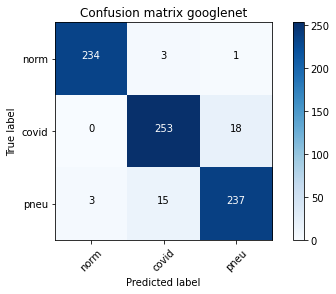

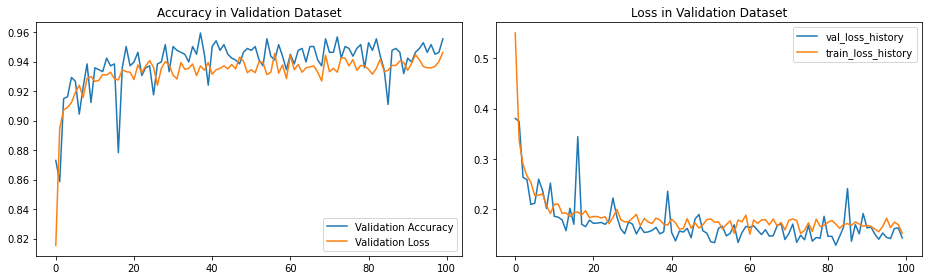


==== END ====
[[232   3   3]
 [  0 261  10]
 [  3  21 231]]

Sensitivity or recall total
0.9476439790575916

Sensitivity or recall per classes
[0.97 0.96 0.91]

Precision
[0.99 0.92 0.95]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0493 Acc: 0.4700
val Loss: 0.9856 Acc: 0.6531

Epoch 1/99
----------
train Loss: 0.9453 Acc: 0.6666
val Loss: 0.8924 Acc: 0.7762

Epoch 2/99
----------
train Loss: 0.8627 Acc: 0.7642
val Loss: 0.8198 Acc: 0.8325

Epoch 3/99
----------
train Loss: 0.7986 Acc: 0.8015
val Loss: 0.7574 Acc: 0.8573

Epoch 4/99
----------
train Loss: 0.7448 Acc: 0.8300
val Loss: 0.7047 Acc: 0.8691

Epoch 5/99
----------
train Loss: 0.6959 Acc: 0.8483
val Loss: 0.6625 Acc: 0.8757

Epoch 6/99
-----

train Loss: 0.2653 Acc: 0.9165
val Loss: 0.2603 Acc: 0.9215

Epoch 92/99
----------
train Loss: 0.2602 Acc: 0.9234
val Loss: 0.2637 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.2565 Acc: 0.9227
val Loss: 0.2536 Acc: 0.9228

Epoch 94/99
----------
train Loss: 0.2543 Acc: 0.9260
val Loss: 0.2571 Acc: 0.9110

Epoch 95/99
----------
train Loss: 0.2624 Acc: 0.9194
val Loss: 0.2498 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.2633 Acc: 0.9191
val Loss: 0.2494 Acc: 0.9202

Epoch 97/99
----------
train Loss: 0.2577 Acc: 0.9227
val Loss: 0.2522 Acc: 0.9202

Epoch 98/99
----------
train Loss: 0.2546 Acc: 0.9263
val Loss: 0.2493 Acc: 0.9149

Epoch 99/99
----------
train Loss: 0.2633 Acc: 0.9165
val Loss: 0.2523 Acc: 0.9202


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 18s
Best val Acc: 0.930628
##############################


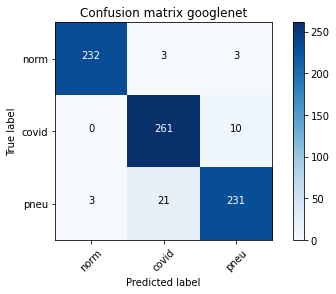

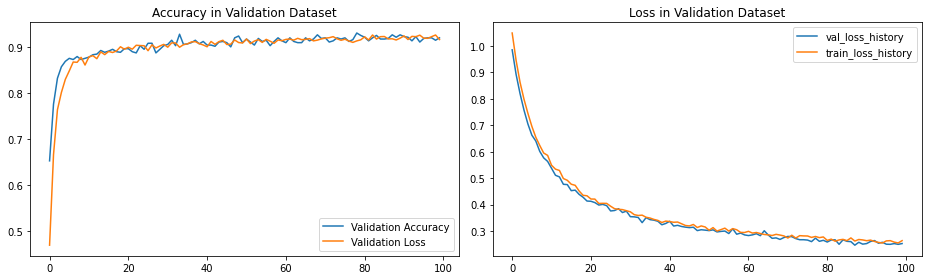


==== END ====
[[228   3   7]
 [  3 252  16]
 [  2  24 229]]

Sensitivity or recall total
0.9280104712041884

Sensitivity or recall per classes
[0.96 0.93 0.9 ]

Precision
[0.98 0.9  0.91]

F1 Score
[0.97 0.92 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0102 Acc: 0.5450
val Loss: 0.9032 Acc: 0.8024

Epoch 1/99
----------
train Loss: 0.8383 Acc: 0.7674
val Loss: 0.7592 Acc: 0.8403

Epoch 2/99
----------
train Loss: 0.7126 Acc: 0.8500
val Loss: 0.6547 Acc: 0.8914

Epoch 3/99
----------
train Loss: 0.6390 Acc: 0.8683
val Loss: 0.5904 Acc: 0.8914

Epoch 4/99
----------
train Loss: 0.5764 Acc: 0.8762
val Loss: 0.5415 Acc: 0.8979

Epoch 5/99
----------
train Loss: 0.5234 Acc: 0.8949
val Loss: 0.4824 Acc: 0.9071

Epoch 6/99
-----

train Loss: 0.1937 Acc: 0.9306
val Loss: 0.1776 Acc: 0.9372

Epoch 92/99
----------
train Loss: 0.1915 Acc: 0.9378
val Loss: 0.1832 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.2038 Acc: 0.9263
val Loss: 0.1746 Acc: 0.9385

Epoch 94/99
----------
train Loss: 0.1978 Acc: 0.9296
val Loss: 0.1888 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.2046 Acc: 0.9315
val Loss: 0.1901 Acc: 0.9332

Epoch 96/99
----------
train Loss: 0.2000 Acc: 0.9312
val Loss: 0.1886 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1879 Acc: 0.9342
val Loss: 0.1954 Acc: 0.9385

Epoch 98/99
----------
train Loss: 0.1912 Acc: 0.9319
val Loss: 0.1795 Acc: 0.9346

Epoch 99/99
----------
train Loss: 0.1936 Acc: 0.9335
val Loss: 0.1820 Acc: 0.9476


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 14s
Best val Acc: 0.947644
##############################


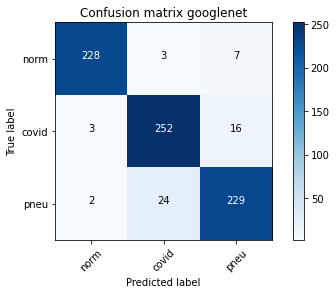

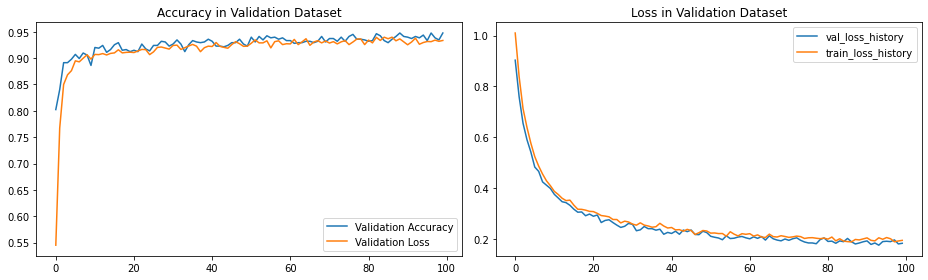


==== END ====
[[230   4   4]
 [  3 246  22]
 [  7  15 233]]

Sensitivity or recall total
0.9280104712041884

Sensitivity or recall per classes
[0.97 0.91 0.91]

Precision
[0.96 0.93 0.9 ]

F1 Score
[0.96 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8835 Acc: 0.6960
val Loss: 0.7462 Acc: 0.8586

Epoch 1/99
----------
train Loss: 0.7090 Acc: 0.8421
val Loss: 0.6371 Acc: 0.8874

Epoch 2/99
----------
train Loss: 0.6175 Acc: 0.8670
val Loss: 0.5699 Acc: 0.8940

Epoch 3/99
----------
train Loss: 0.5563 Acc: 0.8880
val Loss: 0.5079 Acc: 0.9018

Epoch 4/99
----------
train Loss: 0.5096 Acc: 0.8913
val Loss: 0.4782 Acc: 0.8914

Epoch 5/99
----------
train Loss: 0.4563 Acc: 0.9008
val Loss: 0.4317 Acc: 0.9031

Epoch 6/99
-----

train Loss: 0.1948 Acc: 0.9309
val Loss: 0.1696 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1888 Acc: 0.9296
val Loss: 0.1656 Acc: 0.9516

Epoch 93/99
----------
train Loss: 0.1906 Acc: 0.9312
val Loss: 0.1765 Acc: 0.9463

Epoch 94/99
----------
train Loss: 0.1926 Acc: 0.9348
val Loss: 0.1807 Acc: 0.9359

Epoch 95/99
----------
train Loss: 0.1948 Acc: 0.9322
val Loss: 0.1890 Acc: 0.9306

Epoch 96/99
----------
train Loss: 0.1921 Acc: 0.9338
val Loss: 0.1771 Acc: 0.9359

Epoch 97/99
----------
train Loss: 0.1871 Acc: 0.9338
val Loss: 0.1844 Acc: 0.9372

Epoch 98/99
----------
train Loss: 0.1829 Acc: 0.9414
val Loss: 0.1818 Acc: 0.9346

Epoch 99/99
----------
train Loss: 0.1831 Acc: 0.9397
val Loss: 0.1848 Acc: 0.9411


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 16s
Best val Acc: 0.951571
##############################


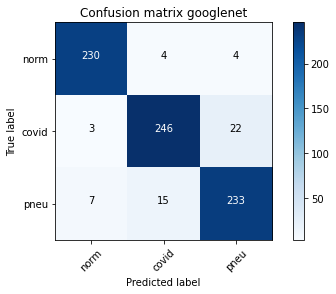

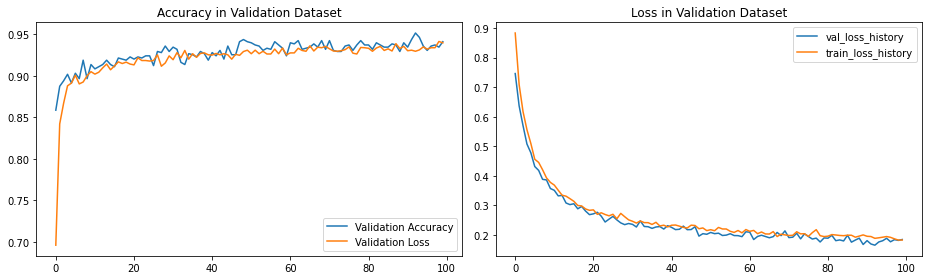


==== END ====
[[231   3   4]
 [  1 253  17]
 [  5  17 233]]

Sensitivity or recall total
0.9384816753926701

Sensitivity or recall per classes
[0.97 0.93 0.91]

Precision
[0.97 0.93 0.92]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0569 Acc: 0.4373
val Loss: 0.9980 Acc: 0.5890

Epoch 1/99
----------
train Loss: 0.9580 Acc: 0.6361
val Loss: 0.9039 Acc: 0.7500

Epoch 2/99
----------
train Loss: 0.8768 Acc: 0.7330
val Loss: 0.8378 Acc: 0.8010

Epoch 3/99
----------
train Loss: 0.8075 Acc: 0.8084
val Loss: 0.7685 Acc: 0.8495

Epoch 4/99
----------
train Loss: 0.7509 Acc: 0.8336
val Loss: 0.7210 Acc: 0.8586

Epoch 5/99
----------
train Loss: 0.7005 Acc: 0.8539
val Loss: 0.6791 Acc: 0.8547

Epoch 6/99
----

train Loss: 0.2701 Acc: 0.9188
val Loss: 0.2692 Acc: 0.9123

Epoch 92/99
----------
train Loss: 0.2671 Acc: 0.9158
val Loss: 0.2592 Acc: 0.9241

Epoch 93/99
----------
train Loss: 0.2617 Acc: 0.9207
val Loss: 0.2508 Acc: 0.9280

Epoch 94/99
----------
train Loss: 0.2763 Acc: 0.9125
val Loss: 0.2519 Acc: 0.9267

Epoch 95/99
----------
train Loss: 0.2534 Acc: 0.9224
val Loss: 0.2560 Acc: 0.9110

Epoch 96/99
----------
train Loss: 0.2572 Acc: 0.9237
val Loss: 0.2525 Acc: 0.9267

Epoch 97/99
----------
train Loss: 0.2568 Acc: 0.9253
val Loss: 0.2562 Acc: 0.9228

Epoch 98/99
----------
train Loss: 0.2588 Acc: 0.9168
val Loss: 0.2448 Acc: 0.9202

Epoch 99/99
----------
train Loss: 0.2589 Acc: 0.9191
val Loss: 0.2617 Acc: 0.9136


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 21s
Best val Acc: 0.928010
##############################


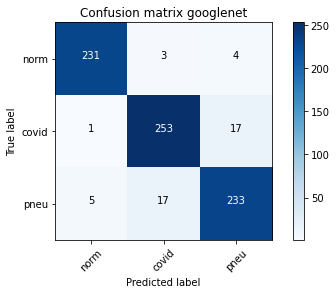

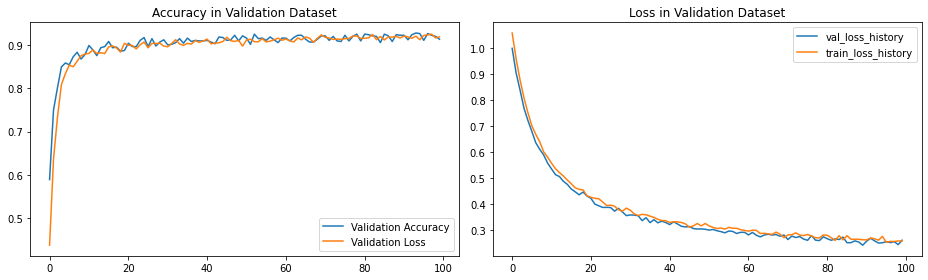


==== END ====
[[224   3  11]
 [  2 244  25]
 [  7  20 228]]

Sensitivity or recall total
0.9109947643979057

Sensitivity or recall per classes
[0.94 0.9  0.89]

Precision
[0.96 0.91 0.86]

F1 Score
[0.95 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9983 Acc: 0.5608
val Loss: 0.9004 Acc: 0.7356

Epoch 1/99
----------
train Loss: 0.8375 Acc: 0.7717
val Loss: 0.7612 Acc: 0.8508

Epoch 2/99
----------
train Loss: 0.7210 Acc: 0.8411
val Loss: 0.6601 Acc: 0.8717

Epoch 3/99
----------
train Loss: 0.6385 Acc: 0.8644
val Loss: 0.5965 Acc: 0.8861

Epoch 4/99
----------
train Loss: 0.5642 Acc: 0.8801
val Loss: 0.5340 Acc: 0.8940

Epoch 5/99
----------
train Loss: 0.5198 Acc: 0.8903
val Loss: 0.4894 Acc: 0.8848

Epoch 6/99
----

train Loss: 0.1849 Acc: 0.9401
val Loss: 0.1854 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1903 Acc: 0.9332
val Loss: 0.1826 Acc: 0.9359

Epoch 93/99
----------
train Loss: 0.1941 Acc: 0.9338
val Loss: 0.1825 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1922 Acc: 0.9361
val Loss: 0.1800 Acc: 0.9385

Epoch 95/99
----------
train Loss: 0.1981 Acc: 0.9270
val Loss: 0.1918 Acc: 0.9306

Epoch 96/99
----------
train Loss: 0.1903 Acc: 0.9374
val Loss: 0.1829 Acc: 0.9463

Epoch 97/99
----------
train Loss: 0.2000 Acc: 0.9332
val Loss: 0.1700 Acc: 0.9346

Epoch 98/99
----------
train Loss: 0.1941 Acc: 0.9332
val Loss: 0.1997 Acc: 0.9293

Epoch 99/99
----------
train Loss: 0.1992 Acc: 0.9322
val Loss: 0.1831 Acc: 0.9267


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 27s
Best val Acc: 0.946335
##############################


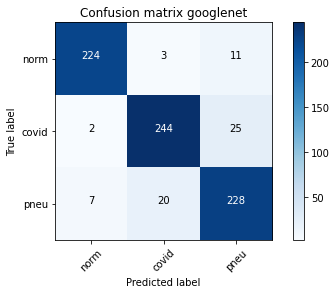

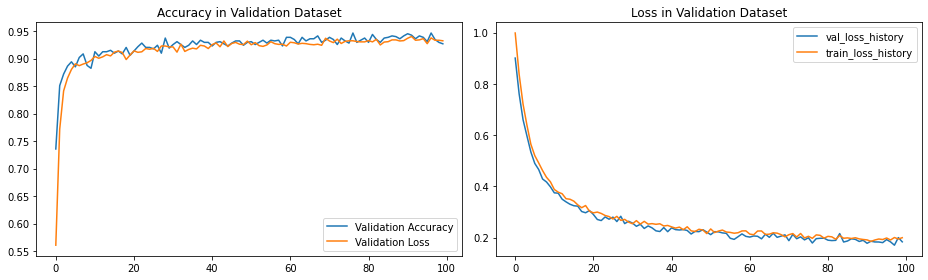


==== END ====
[[231   2   5]
 [  1 255  15]
 [  8  21 226]]

Sensitivity or recall total
0.9319371727748691

Sensitivity or recall per classes
[0.97 0.94 0.89]

Precision
[0.96 0.92 0.92]

F1 Score
[0.97 0.93 0.9 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8921 Acc: 0.7052
val Loss: 0.7724 Acc: 0.8010

Epoch 1/99
----------
train Loss: 0.7155 Acc: 0.8464
val Loss: 0.6469 Acc: 0.8861

Epoch 2/99
----------
train Loss: 0.6210 Acc: 0.8703
val Loss: 0.5764 Acc: 0.8848

Epoch 3/99
----------
train Loss: 0.5621 Acc: 0.8795
val Loss: 0.5192 Acc: 0.8979

Epoch 4/99
----------
train Loss: 0.5110 Acc: 0.8883
val Loss: 0.4786 Acc: 0.9005

Epoch 5/99
----------
train Loss: 0.4707 Acc: 0.8896
val Loss: 0.4434 Acc: 0.9018

Epoch 6/99
----

train Loss: 0.1834 Acc: 0.9361
val Loss: 0.1775 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1939 Acc: 0.9378
val Loss: 0.1758 Acc: 0.9398

Epoch 93/99
----------
train Loss: 0.1934 Acc: 0.9381
val Loss: 0.1757 Acc: 0.9424

Epoch 94/99
----------
train Loss: 0.1919 Acc: 0.9283
val Loss: 0.1844 Acc: 0.9359

Epoch 95/99
----------
train Loss: 0.1854 Acc: 0.9378
val Loss: 0.1725 Acc: 0.9372

Epoch 96/99
----------
train Loss: 0.1870 Acc: 0.9332
val Loss: 0.1766 Acc: 0.9372

Epoch 97/99
----------
train Loss: 0.1870 Acc: 0.9371
val Loss: 0.1655 Acc: 0.9411

Epoch 98/99
----------
train Loss: 0.1883 Acc: 0.9306
val Loss: 0.1835 Acc: 0.9372

Epoch 99/99
----------
train Loss: 0.1975 Acc: 0.9325
val Loss: 0.1709 Acc: 0.9306


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 29s
Best val Acc: 0.948953
##############################


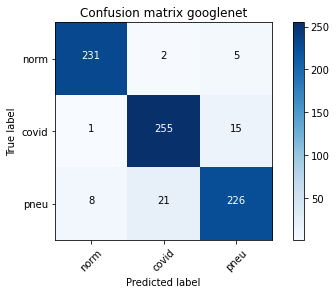

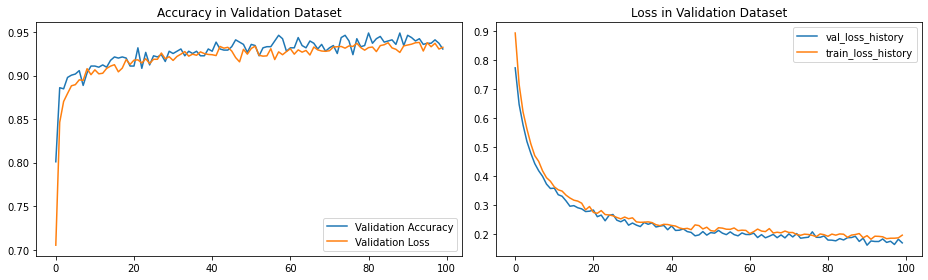


==== END ====
[[233   2   3]
 [  1 250  20]
 [  3  20 232]]

Sensitivity or recall total
0.9358638743455497

Sensitivity or recall per classes
[0.98 0.92 0.91]

Precision
[0.98 0.92 0.91]

F1 Score
[0.98 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0648 Acc: 0.4294
val Loss: 0.9972 Acc: 0.5955

Epoch 1/99
----------
train Loss: 0.9631 Acc: 0.6168
val Loss: 0.9136 Acc: 0.7317

Epoch 2/99
----------
train Loss: 0.8709 Acc: 0.7579
val Loss: 0.8335 Acc: 0.8024

Epoch 3/99
----------
train Loss: 0.8047 Acc: 0.8015
val Loss: 0.7681 Acc: 0.8416

Epoch 4/99
----------
train Loss: 0.7453 Acc: 0.8362
val Loss: 0.7203 Acc: 0.8665

Epoch 5/99
----------
train Loss: 0.7107 Acc: 0.8405
val Loss: 0.6816 Acc: 0.8730

Epoch 6/99
----

train Loss: 0.2689 Acc: 0.9171
val Loss: 0.2537 Acc: 0.9241

Epoch 92/99
----------
train Loss: 0.2636 Acc: 0.9165
val Loss: 0.2519 Acc: 0.9175

Epoch 93/99
----------
train Loss: 0.2570 Acc: 0.9220
val Loss: 0.2566 Acc: 0.9202

Epoch 94/99
----------
train Loss: 0.2682 Acc: 0.9119
val Loss: 0.2619 Acc: 0.9188

Epoch 95/99
----------
train Loss: 0.2685 Acc: 0.9148
val Loss: 0.2382 Acc: 0.9228

Epoch 96/99
----------
train Loss: 0.2474 Acc: 0.9273
val Loss: 0.2477 Acc: 0.9359

Epoch 97/99
----------
train Loss: 0.2629 Acc: 0.9198
val Loss: 0.2527 Acc: 0.9175

Epoch 98/99
----------
train Loss: 0.2583 Acc: 0.9165
val Loss: 0.2574 Acc: 0.9241

Epoch 99/99
----------
train Loss: 0.2628 Acc: 0.9178
val Loss: 0.2519 Acc: 0.9228


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 21s
Best val Acc: 0.935864
##############################


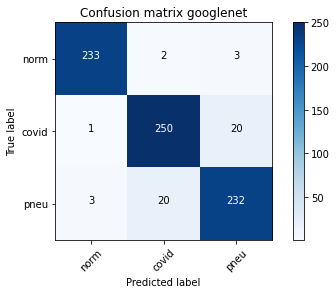

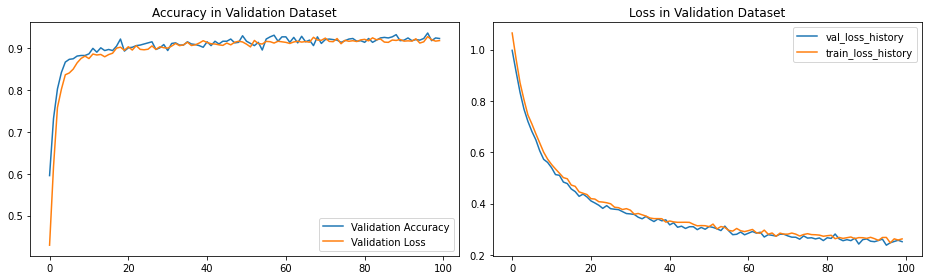


==== END ====
[[227   3   8]
 [  1 255  15]
 [  9  22 224]]

Sensitivity or recall total
0.9240837696335078

Sensitivity or recall per classes
[0.95 0.94 0.88]

Precision
[0.96 0.91 0.91]

F1 Score
[0.96 0.93 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0271 Acc: 0.5146
val Loss: 0.9172 Acc: 0.8010

Epoch 1/99
----------
train Loss: 0.8459 Acc: 0.7825
val Loss: 0.7760 Acc: 0.8613

Epoch 2/99
----------
train Loss: 0.7282 Acc: 0.8474
val Loss: 0.6684 Acc: 0.8927

Epoch 3/99
----------
train Loss: 0.6357 Acc: 0.8785
val Loss: 0.5881 Acc: 0.9045

Epoch 4/99
----------
train Loss: 0.5771 Acc: 0.8768
val Loss: 0.5397 Acc: 0.8914

Epoch 5/99
----------
train Loss: 0.5269 Acc: 0.8909
val Loss: 0.5002 Acc: 0.8874

Epoch 6/99
----

train Loss: 0.1924 Acc: 0.9315
val Loss: 0.1822 Acc: 0.9372

Epoch 92/99
----------
train Loss: 0.2058 Acc: 0.9306
val Loss: 0.1899 Acc: 0.9346

Epoch 93/99
----------
train Loss: 0.1995 Acc: 0.9345
val Loss: 0.1867 Acc: 0.9359

Epoch 94/99
----------
train Loss: 0.1926 Acc: 0.9387
val Loss: 0.1786 Acc: 0.9346

Epoch 95/99
----------
train Loss: 0.1901 Acc: 0.9394
val Loss: 0.1763 Acc: 0.9503

Epoch 96/99
----------
train Loss: 0.1898 Acc: 0.9345
val Loss: 0.1793 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.1959 Acc: 0.9273
val Loss: 0.1807 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.2021 Acc: 0.9289
val Loss: 0.1806 Acc: 0.9437

Epoch 99/99
----------
train Loss: 0.1927 Acc: 0.9338
val Loss: 0.1886 Acc: 0.9424


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 24s
Best val Acc: 0.950262
##############################


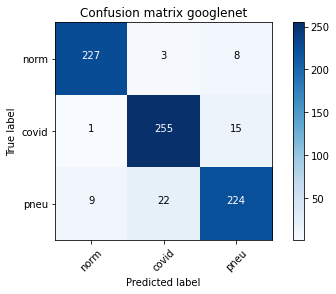

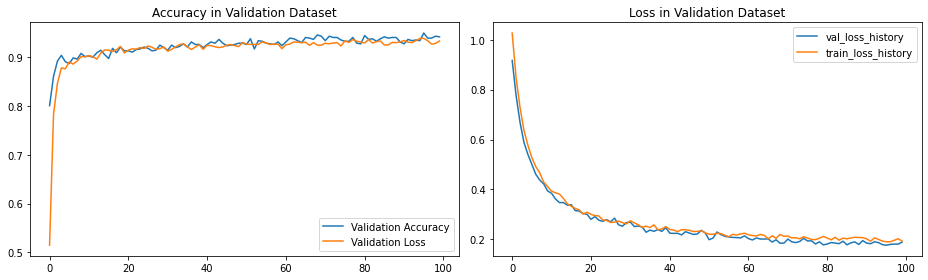


==== END ====
[[229   4   5]
 [  1 259  11]
 [  4  22 229]]

Sensitivity or recall total
0.9384816753926701

Sensitivity or recall per classes
[0.96 0.96 0.9 ]

Precision
[0.98 0.91 0.93]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.8544 Acc: 0.7386
val Loss: 0.7474 Acc: 0.8678

Epoch 1/99
----------
train Loss: 0.6895 Acc: 0.8592
val Loss: 0.6379 Acc: 0.8730

Epoch 2/99
----------
train Loss: 0.6080 Acc: 0.8670
val Loss: 0.5655 Acc: 0.8861

Epoch 3/99
----------
train Loss: 0.5477 Acc: 0.8785
val Loss: 0.5134 Acc: 0.9005

Epoch 4/99
----------
train Loss: 0.5009 Acc: 0.8916
val Loss: 0.4652 Acc: 0.8901

Epoch 5/99
----------
train Loss: 0.4655 Acc: 0.8949
val Loss: 0.4415 Acc: 0.8979

Epoch 6/99
----

train Loss: 0.1994 Acc: 0.9270
val Loss: 0.1766 Acc: 0.9424

Epoch 92/99
----------
train Loss: 0.1903 Acc: 0.9365
val Loss: 0.1691 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1861 Acc: 0.9410
val Loss: 0.1860 Acc: 0.9411

Epoch 94/99
----------
train Loss: 0.1898 Acc: 0.9351
val Loss: 0.1752 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1882 Acc: 0.9338
val Loss: 0.1771 Acc: 0.9359

Epoch 96/99
----------
train Loss: 0.1886 Acc: 0.9351
val Loss: 0.1845 Acc: 0.9411

Epoch 97/99
----------
train Loss: 0.1841 Acc: 0.9378
val Loss: 0.1887 Acc: 0.9411

Epoch 98/99
----------
train Loss: 0.1833 Acc: 0.9361
val Loss: 0.1902 Acc: 0.9346

Epoch 99/99
----------
train Loss: 0.1862 Acc: 0.9374
val Loss: 0.1778 Acc: 0.9359


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 23s
Best val Acc: 0.945026
##############################


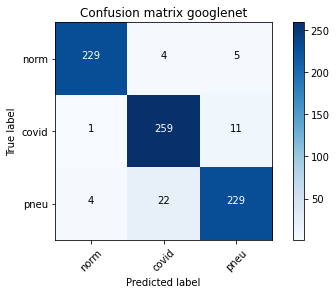

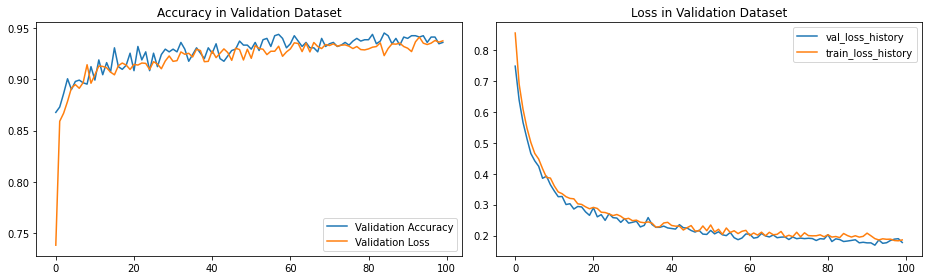


==== END ====
[[227   6   5]
 [  1 252  18]
 [  2  19 234]]

Sensitivity or recall total
0.9332460732984293

Sensitivity or recall per classes
[0.95 0.93 0.92]

Precision
[0.99 0.91 0.91]

F1 Score
[0.97 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0828 Acc: 0.3993
val Loss: 1.0797 Acc: 0.4045

Epoch 1/99
----------
train Loss: 1.0777 Acc: 0.4147
val Loss: 1.0617 Acc: 0.4332

Epoch 2/99
----------
train Loss: 1.0641 Acc: 0.4451
val Loss: 1.0572 Acc: 0.4594

Epoch 3/99
----------
train Loss: 1.0480 Acc: 0.4730
val Loss: 1.0386 Acc: 0.5000

Epoch 4/99
----------
train Loss: 1.0347 Acc: 0.4959
val Loss: 1.0239 Acc: 0.5262

Epoch 5/99
----------
train Loss: 1.0290 Acc: 0.4979
val Loss: 1.0193 Acc: 0.5916

Epoch 6/99
------

train Loss: 0.5761 Acc: 0.8847
val Loss: 0.5744 Acc: 0.8809

Epoch 92/99
----------
train Loss: 0.5782 Acc: 0.8811
val Loss: 0.5539 Acc: 0.8940

Epoch 93/99
----------
train Loss: 0.5698 Acc: 0.8854
val Loss: 0.5605 Acc: 0.9058

Epoch 94/99
----------
train Loss: 0.5699 Acc: 0.8854
val Loss: 0.5508 Acc: 0.9110

Epoch 95/99
----------
train Loss: 0.5744 Acc: 0.8762
val Loss: 0.5579 Acc: 0.8822

Epoch 96/99
----------
train Loss: 0.5672 Acc: 0.8814
val Loss: 0.5589 Acc: 0.8927

Epoch 97/99
----------
train Loss: 0.5679 Acc: 0.8791
val Loss: 0.5519 Acc: 0.8914

Epoch 98/99
----------
train Loss: 0.5711 Acc: 0.8739
val Loss: 0.5521 Acc: 0.9045

Epoch 99/99
----------
train Loss: 0.5537 Acc: 0.8893
val Loss: 0.5409 Acc: 0.8940


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 28s
Best val Acc: 0.910995
##############################


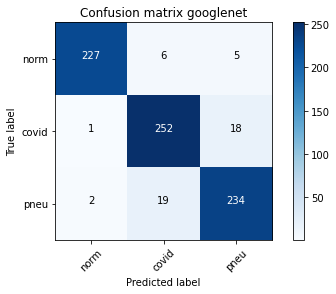

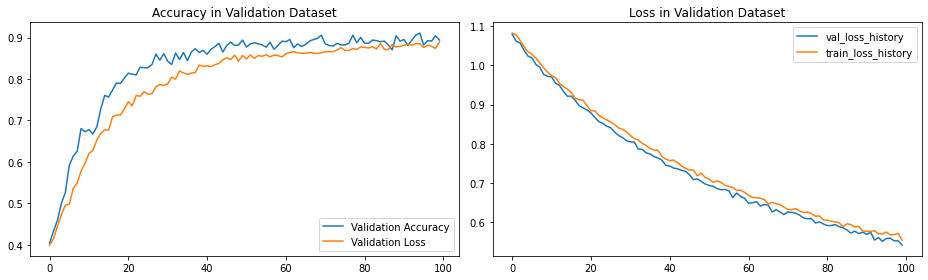


==== END ====
[[221   5  12]
 [  2 242  27]
 [  9  27 219]]

Sensitivity or recall total
0.8926701570680629

Sensitivity or recall per classes
[0.93 0.89 0.86]

Precision
[0.95 0.88 0.85]

F1 Score
[0.94 0.89 0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0982 Acc: 0.3770
val Loss: 1.0769 Acc: 0.4359

Epoch 1/99
----------
train Loss: 1.0680 Acc: 0.4353
val Loss: 1.0509 Acc: 0.4817

Epoch 2/99
----------
train Loss: 1.0497 Acc: 0.4720
val Loss: 1.0277 Acc: 0.5785

Epoch 3/99
----------
train Loss: 1.0266 Acc: 0.5146
val Loss: 1.0094 Acc: 0.6217

Epoch 4/99
----------
train Loss: 1.0085 Acc: 0.5431
val Loss: 0.9842 Acc: 0.6793

Epoch 5/99
----------
train Loss: 0.9902 Acc: 0.5958
val Loss: 0.9695 Acc: 0.6937

Epoch 6/99
------

train Loss: 0.4018 Acc: 0.9014
val Loss: 0.3957 Acc: 0.9097

Epoch 92/99
----------
train Loss: 0.4015 Acc: 0.8981
val Loss: 0.3809 Acc: 0.9149

Epoch 93/99
----------
train Loss: 0.3942 Acc: 0.8998
val Loss: 0.3878 Acc: 0.9136

Epoch 94/99
----------
train Loss: 0.3916 Acc: 0.9034
val Loss: 0.3932 Acc: 0.8966

Epoch 95/99
----------
train Loss: 0.3919 Acc: 0.9017
val Loss: 0.3733 Acc: 0.9202

Epoch 96/99
----------
train Loss: 0.3961 Acc: 0.8929
val Loss: 0.3812 Acc: 0.9097

Epoch 97/99
----------
train Loss: 0.3914 Acc: 0.9063
val Loss: 0.3663 Acc: 0.9071

Epoch 98/99
----------
train Loss: 0.3916 Acc: 0.9024
val Loss: 0.3719 Acc: 0.9018

Epoch 99/99
----------
train Loss: 0.3871 Acc: 0.9037
val Loss: 0.3743 Acc: 0.9058


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 37s
Best val Acc: 0.920157
##############################


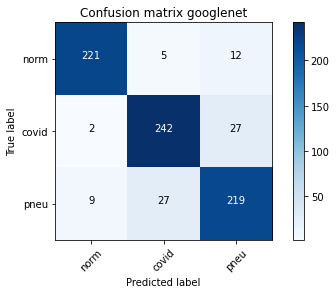

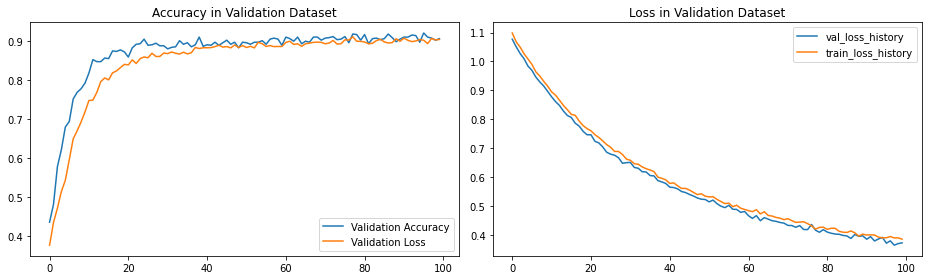


==== END ====
[[221   7  10]
 [  2 248  21]
 [  8  23 224]]

Sensitivity or recall total
0.9070680628272252

Sensitivity or recall per classes
[0.93 0.92 0.88]

Precision
[0.96 0.89 0.88]

F1 Score
[0.94 0.9  0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0933 Acc: 0.3721
val Loss: 1.0673 Acc: 0.4634

Epoch 1/99
----------
train Loss: 1.0674 Acc: 0.4333
val Loss: 1.0412 Acc: 0.5314

Epoch 2/99
----------
train Loss: 1.0391 Acc: 0.5047
val Loss: 1.0246 Acc: 0.5733

Epoch 3/99
----------
train Loss: 1.0199 Acc: 0.5362
val Loss: 1.0011 Acc: 0.6414

Epoch 4/99
----------
train Loss: 0.9962 Acc: 0.5801
val Loss: 0.9791 Acc: 0.6688

Epoch 5/99
----------
train Loss: 0.9758 Acc: 0.6164
val Loss: 0.9526 Acc: 0.6885

Epoch 6/99
------

train Loss: 0.3921 Acc: 0.9044
val Loss: 0.3839 Acc: 0.9110

Epoch 92/99
----------
train Loss: 0.3897 Acc: 0.9103
val Loss: 0.3789 Acc: 0.9136

Epoch 93/99
----------
train Loss: 0.3880 Acc: 0.9044
val Loss: 0.3830 Acc: 0.9097

Epoch 94/99
----------
train Loss: 0.3862 Acc: 0.9004
val Loss: 0.3737 Acc: 0.9123

Epoch 95/99
----------
train Loss: 0.3915 Acc: 0.8998
val Loss: 0.3643 Acc: 0.9162

Epoch 96/99
----------
train Loss: 0.3882 Acc: 0.8975
val Loss: 0.3654 Acc: 0.9241

Epoch 97/99
----------
train Loss: 0.3875 Acc: 0.9021
val Loss: 0.3647 Acc: 0.9110

Epoch 98/99
----------
train Loss: 0.3787 Acc: 0.9106
val Loss: 0.3752 Acc: 0.9031

Epoch 99/99
----------
train Loss: 0.3763 Acc: 0.9027
val Loss: 0.3622 Acc: 0.9162


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 32s
Best val Acc: 0.929319
##############################


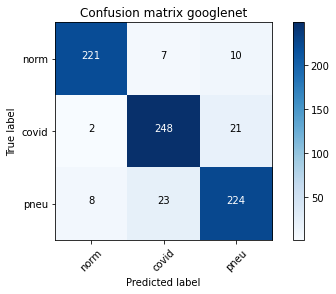

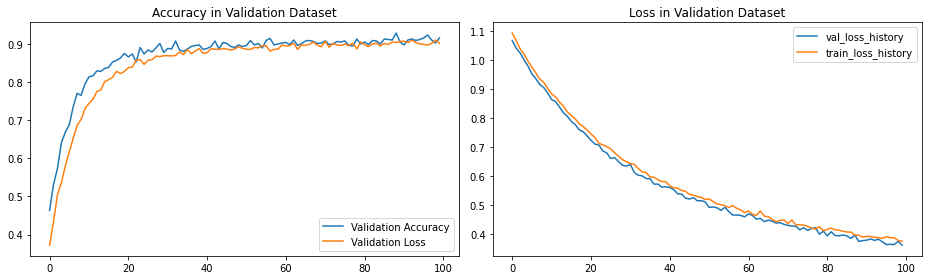


==== END ====
[[228   4   6]
 [  1 248  22]
 [ 10  24 221]]

Sensitivity or recall total
0.912303664921466

Sensitivity or recall per classes
[0.96 0.92 0.87]

Precision
[0.95 0.9  0.89]

F1 Score
[0.96 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1152 Acc: 0.3682
val Loss: 1.0940 Acc: 0.3966

Epoch 1/99
----------
train Loss: 1.0938 Acc: 0.3927
val Loss: 1.0754 Acc: 0.4516

Epoch 2/99
----------
train Loss: 1.0808 Acc: 0.4252
val Loss: 1.0667 Acc: 0.4568

Epoch 3/99
----------
train Loss: 1.0674 Acc: 0.4356
val Loss: 1.0522 Acc: 0.5000

Epoch 4/99
----------
train Loss: 1.0554 Acc: 0.4749
val Loss: 1.0419 Acc: 0.4935

Epoch 5/99
----------
train Loss: 1.0413 Acc: 0.4962
val Loss: 1.0310 Acc: 0.5380

Epoch 6/99
------

train Loss: 0.5838 Acc: 0.8896
val Loss: 0.5658 Acc: 0.8953

Epoch 92/99
----------
train Loss: 0.5780 Acc: 0.8883
val Loss: 0.5644 Acc: 0.9018

Epoch 93/99
----------
train Loss: 0.5764 Acc: 0.8896
val Loss: 0.5674 Acc: 0.8992

Epoch 94/99
----------
train Loss: 0.5678 Acc: 0.8968
val Loss: 0.5693 Acc: 0.8901

Epoch 95/99
----------
train Loss: 0.5707 Acc: 0.8854
val Loss: 0.5711 Acc: 0.9018

Epoch 96/99
----------
train Loss: 0.5796 Acc: 0.8732
val Loss: 0.5600 Acc: 0.8901

Epoch 97/99
----------
train Loss: 0.5690 Acc: 0.8791
val Loss: 0.5574 Acc: 0.9005

Epoch 98/99
----------
train Loss: 0.5670 Acc: 0.8922
val Loss: 0.5477 Acc: 0.8953

Epoch 99/99
----------
train Loss: 0.5610 Acc: 0.8922
val Loss: 0.5544 Acc: 0.8887


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 34s
Best val Acc: 0.908377
##############################


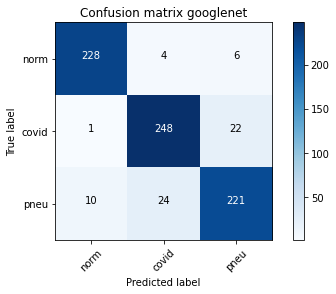

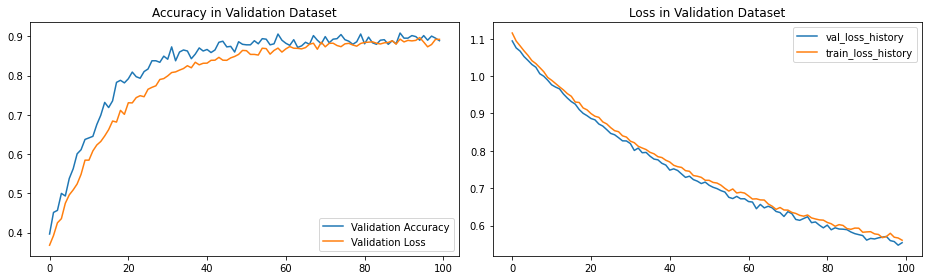


==== END ====
[[224   3  11]
 [  3 252  16]
 [ 17  34 204]]

Sensitivity or recall total
0.8900523560209425

Sensitivity or recall per classes
[0.94 0.93 0.8 ]

Precision
[0.92 0.87 0.88]

F1 Score
[0.93 0.9  0.84]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1168 Acc: 0.3370
val Loss: 1.0977 Acc: 0.3534

Epoch 1/99
----------
train Loss: 1.0872 Acc: 0.3963
val Loss: 1.0721 Acc: 0.4228

Epoch 2/99
----------
train Loss: 1.0581 Acc: 0.4674
val Loss: 1.0497 Acc: 0.5079

Epoch 3/99
----------
train Loss: 1.0428 Acc: 0.4880
val Loss: 1.0247 Acc: 0.5327

Epoch 4/99
----------
train Loss: 1.0135 Acc: 0.5480
val Loss: 1.0067 Acc: 0.5916

Epoch 5/99
----------
train Loss: 1.0023 Acc: 0.5624
val Loss: 0.9846 Acc: 0.6545

Epoch 6/99
-----

train Loss: 0.4015 Acc: 0.9063
val Loss: 0.3865 Acc: 0.9123

Epoch 92/99
----------
train Loss: 0.3973 Acc: 0.9086
val Loss: 0.3929 Acc: 0.9110

Epoch 93/99
----------
train Loss: 0.3920 Acc: 0.9040
val Loss: 0.3880 Acc: 0.9071

Epoch 94/99
----------
train Loss: 0.4015 Acc: 0.9014
val Loss: 0.3879 Acc: 0.9097

Epoch 95/99
----------
train Loss: 0.3972 Acc: 0.9044
val Loss: 0.3928 Acc: 0.8927

Epoch 96/99
----------
train Loss: 0.3905 Acc: 0.8985
val Loss: 0.3850 Acc: 0.8992

Epoch 97/99
----------
train Loss: 0.3926 Acc: 0.9037
val Loss: 0.3843 Acc: 0.9136

Epoch 98/99
----------
train Loss: 0.3961 Acc: 0.9044
val Loss: 0.3745 Acc: 0.9110

Epoch 99/99
----------
train Loss: 0.3775 Acc: 0.9053
val Loss: 0.3760 Acc: 0.9097


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 26s
Best val Acc: 0.914921
##############################


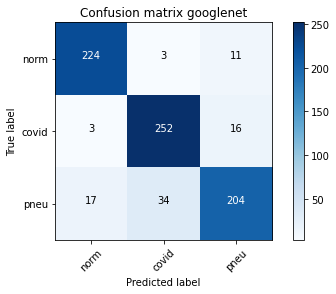

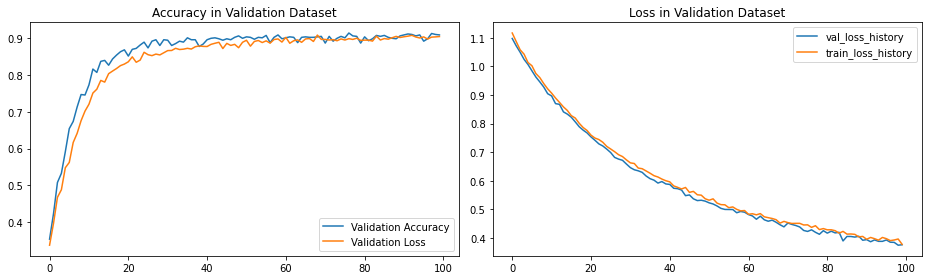


==== END ====
[[227   3   8]
 [  0 255  16]
 [ 13  19 223]]

Sensitivity or recall total
0.9227748691099477

Sensitivity or recall per classes
[0.95 0.94 0.87]

Precision
[0.95 0.92 0.9 ]

F1 Score
[0.95 0.93 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0689 Acc: 0.4379
val Loss: 1.0454 Acc: 0.5131

Epoch 1/99
----------
train Loss: 1.0420 Acc: 0.4972
val Loss: 1.0203 Acc: 0.5694

Epoch 2/99
----------
train Loss: 1.0146 Acc: 0.5460
val Loss: 1.0024 Acc: 0.6099

Epoch 3/99
----------
train Loss: 0.9944 Acc: 0.5902
val Loss: 0.9778 Acc: 0.6662

Epoch 4/99
----------
train Loss: 0.9745 Acc: 0.6220
val Loss: 0.9644 Acc: 0.6872

Epoch 5/99
----------
train Loss: 0.9563 Acc: 0.6469
val Loss: 0.9376 Acc: 0.7225

Epoch 6/99
-----

train Loss: 0.3878 Acc: 0.9017
val Loss: 0.3792 Acc: 0.9071

Epoch 92/99
----------
train Loss: 0.3851 Acc: 0.9047
val Loss: 0.3692 Acc: 0.9110

Epoch 93/99
----------
train Loss: 0.3907 Acc: 0.9008
val Loss: 0.3733 Acc: 0.9058

Epoch 94/99
----------
train Loss: 0.3852 Acc: 0.9053
val Loss: 0.3764 Acc: 0.8966

Epoch 95/99
----------
train Loss: 0.3782 Acc: 0.9053
val Loss: 0.3755 Acc: 0.9110

Epoch 96/99
----------
train Loss: 0.3830 Acc: 0.9053
val Loss: 0.3665 Acc: 0.9123

Epoch 97/99
----------
train Loss: 0.3821 Acc: 0.9044
val Loss: 0.3560 Acc: 0.9136

Epoch 98/99
----------
train Loss: 0.3847 Acc: 0.8975
val Loss: 0.3792 Acc: 0.9005

Epoch 99/99
----------
train Loss: 0.3887 Acc: 0.8962
val Loss: 0.3644 Acc: 0.9110


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 31s
Best val Acc: 0.921466
##############################


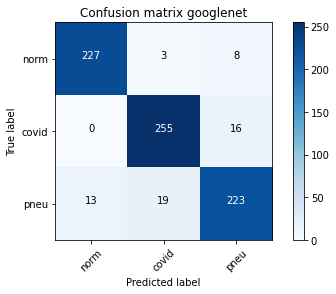

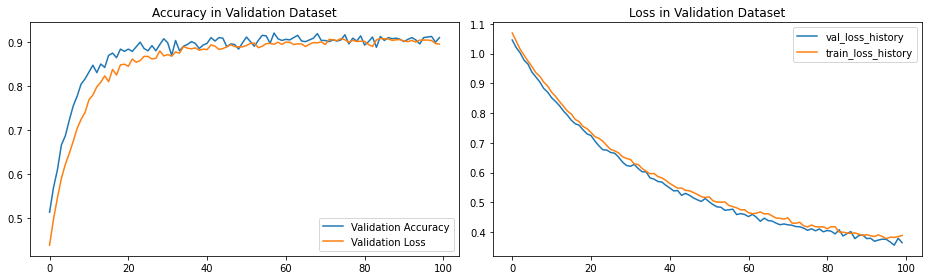


==== END ====
[[227   4   7]
 [  0 243  28]
 [ 18  29 208]]

Sensitivity or recall total
0.887434554973822

Sensitivity or recall per classes
[0.95 0.9  0.82]

Precision
[0.93 0.88 0.86]

F1 Score
[0.94 0.89 0.84]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1244 Acc: 0.3161
val Loss: 1.1194 Acc: 0.3089

Epoch 1/99
----------
train Loss: 1.1126 Acc: 0.3357
val Loss: 1.0960 Acc: 0.3508

Epoch 2/99
----------
train Loss: 1.0966 Acc: 0.3632
val Loss: 1.0872 Acc: 0.3887

Epoch 3/99
----------
train Loss: 1.0902 Acc: 0.3780
val Loss: 1.0759 Acc: 0.4319

Epoch 4/99
----------
train Loss: 1.0785 Acc: 0.4022
val Loss: 1.0588 Acc: 0.4791

Epoch 5/99
----------
train Loss: 1.0671 Acc: 0.4265
val Loss: 1.0551 Acc: 0.4777

Epoch 6/99
------

train Loss: 0.5873 Acc: 0.8798
val Loss: 0.5785 Acc: 0.8887

Epoch 92/99
----------
train Loss: 0.5830 Acc: 0.8755
val Loss: 0.5691 Acc: 0.8940

Epoch 93/99
----------
train Loss: 0.5828 Acc: 0.8808
val Loss: 0.5822 Acc: 0.8809

Epoch 94/99
----------
train Loss: 0.5783 Acc: 0.8782
val Loss: 0.5741 Acc: 0.8848

Epoch 95/99
----------
train Loss: 0.5829 Acc: 0.8788
val Loss: 0.5681 Acc: 0.8861

Epoch 96/99
----------
train Loss: 0.5875 Acc: 0.8752
val Loss: 0.5728 Acc: 0.8796

Epoch 97/99
----------
train Loss: 0.5755 Acc: 0.8762
val Loss: 0.5628 Acc: 0.8783

Epoch 98/99
----------
train Loss: 0.5753 Acc: 0.8798
val Loss: 0.5656 Acc: 0.8809

Epoch 99/99
----------
train Loss: 0.5717 Acc: 0.8798
val Loss: 0.5627 Acc: 0.8835


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 28m 29s
Best val Acc: 0.893979
##############################


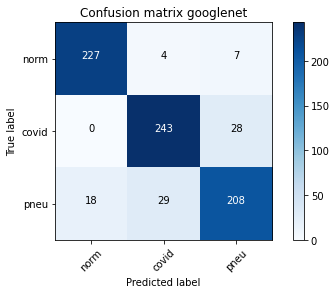

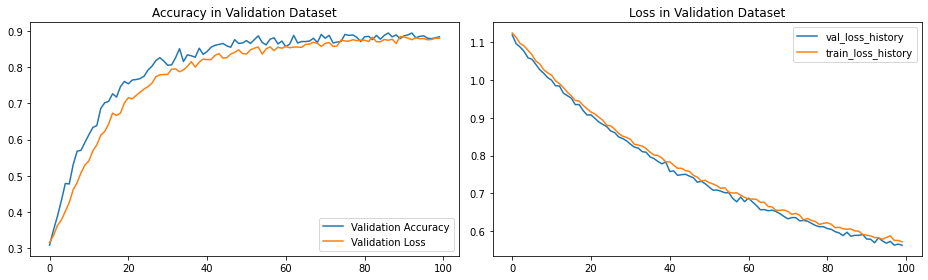


==== END ====
[[223   4  11]
 [  2 238  31]
 [  8  27 220]]

Sensitivity or recall total
0.8913612565445026

Sensitivity or recall per classes
[0.94 0.88 0.86]

Precision
[0.96 0.88 0.84]

F1 Score
[0.95 0.88 0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.1311 Acc: 0.3321
val Loss: 1.1150 Acc: 0.3233

Epoch 1/99
----------
train Loss: 1.1064 Acc: 0.3619
val Loss: 1.0945 Acc: 0.3704

Epoch 2/99
----------
train Loss: 1.0827 Acc: 0.4045
val Loss: 1.0769 Acc: 0.4097

Epoch 3/99
----------
train Loss: 1.0616 Acc: 0.4481
val Loss: 1.0474 Acc: 0.5170

Epoch 4/99
----------
train Loss: 1.0382 Acc: 0.4926
val Loss: 1.0251 Acc: 0.5694

Epoch 5/99
----------
train Loss: 1.0251 Acc: 0.5280
val Loss: 1.0076 Acc: 0.6178

Epoch 6/99
-----

train Loss: 0.4054 Acc: 0.9050
val Loss: 0.3826 Acc: 0.9045

Epoch 92/99
----------
train Loss: 0.3933 Acc: 0.9076
val Loss: 0.3924 Acc: 0.9031

Epoch 93/99
----------
train Loss: 0.3917 Acc: 0.9132
val Loss: 0.3959 Acc: 0.9018

Epoch 94/99
----------
train Loss: 0.3923 Acc: 0.9112
val Loss: 0.3755 Acc: 0.9202

Epoch 95/99
----------
train Loss: 0.3988 Acc: 0.9014
val Loss: 0.3870 Acc: 0.9045

Epoch 96/99
----------
train Loss: 0.3976 Acc: 0.8975
val Loss: 0.3849 Acc: 0.9162

Epoch 97/99
----------
train Loss: 0.3990 Acc: 0.9027
val Loss: 0.3820 Acc: 0.9162

Epoch 98/99
----------
train Loss: 0.3949 Acc: 0.8994
val Loss: 0.3781 Acc: 0.8979

Epoch 99/99
----------
train Loss: 0.3796 Acc: 0.9086
val Loss: 0.3659 Acc: 0.9097


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 28m 28s
Best val Acc: 0.920157
##############################


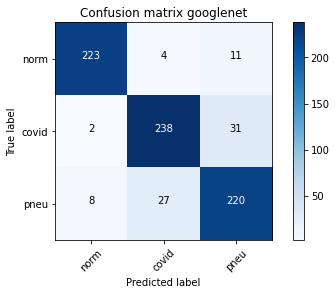

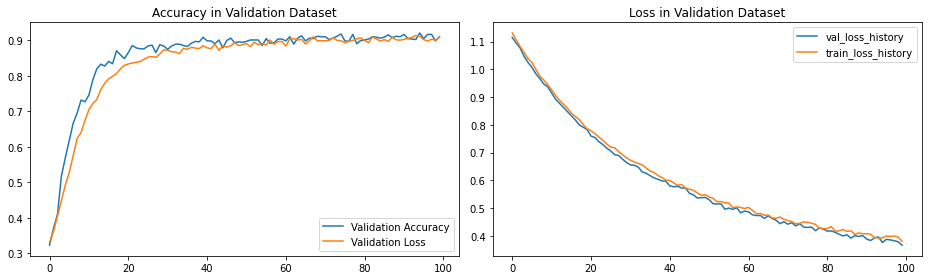


==== END ====
[[225   4   9]
 [  0 248  23]
 [  6  28 221]]

Sensitivity or recall total
0.9083769633507853

Sensitivity or recall per classes
[0.95 0.92 0.87]

Precision
[0.97 0.89 0.87]

F1 Score
[0.96 0.9  0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0762 Acc: 0.3872
val Loss: 1.0536 Acc: 0.4634

Epoch 1/99
----------
train Loss: 1.0472 Acc: 0.4710
val Loss: 1.0253 Acc: 0.5393

Epoch 2/99
----------
train Loss: 1.0220 Acc: 0.5306
val Loss: 1.0046 Acc: 0.6060

Epoch 3/99
----------
train Loss: 0.9955 Acc: 0.5778
val Loss: 0.9832 Acc: 0.6466

Epoch 4/99
----------
train Loss: 0.9802 Acc: 0.6066
val Loss: 0.9636 Acc: 0.6911

Epoch 5/99
----------
train Loss: 0.9628 Acc: 0.6462
val Loss: 0.9413 Acc: 0.7199

Epoch 6/99
-----

train Loss: 0.3854 Acc: 0.8998
val Loss: 0.3811 Acc: 0.9018

Epoch 92/99
----------
train Loss: 0.3760 Acc: 0.9125
val Loss: 0.3761 Acc: 0.9031

Epoch 93/99
----------
train Loss: 0.3921 Acc: 0.8952
val Loss: 0.3670 Acc: 0.9175

Epoch 94/99
----------
train Loss: 0.3786 Acc: 0.9066
val Loss: 0.3642 Acc: 0.9215

Epoch 95/99
----------
train Loss: 0.3811 Acc: 0.9037
val Loss: 0.3550 Acc: 0.9254

Epoch 96/99
----------
train Loss: 0.3845 Acc: 0.9050
val Loss: 0.3598 Acc: 0.9110

Epoch 97/99
----------
train Loss: 0.3775 Acc: 0.9103
val Loss: 0.3659 Acc: 0.9097

Epoch 98/99
----------
train Loss: 0.3771 Acc: 0.8991
val Loss: 0.3546 Acc: 0.9175

Epoch 99/99
----------
train Loss: 0.3765 Acc: 0.9040
val Loss: 0.3631 Acc: 0.9097


##############################
------ Summary ------
model -> googlenet
epochs -> 100
lr -> 1e-05
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 28m 29s
Best val Acc: 0.925393
##############################


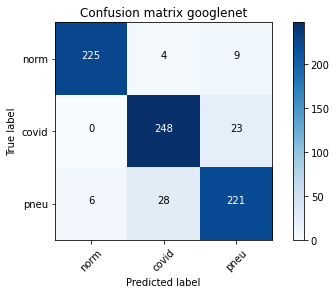

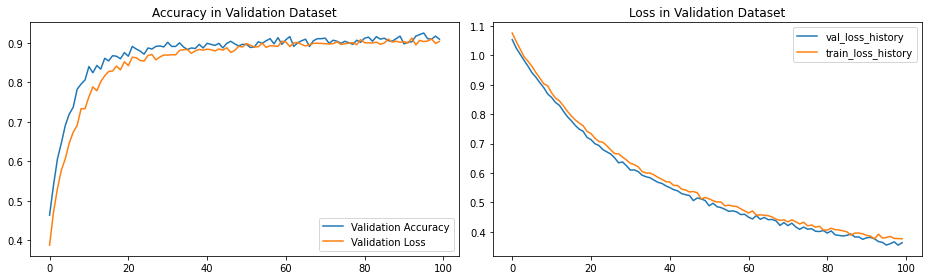


==== END ====
[[227   4   7]
 [  2 246  23]
 [  9  18 228]]

Sensitivity or recall total
0.9175392670157068

Sensitivity or recall per classes
[0.95 0.91 0.89]

Precision
[0.95 0.92 0.88]

F1 Score
[0.95 0.91 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0963 Acc: 0.3767
val Loss: 1.0933 Acc: 0.4699

Epoch 1/99
----------
train Loss: 1.0900 Acc: 0.4232
val Loss: 1.0874 Acc: 0.4961

Epoch 2/99
----------
train Loss: 1.0847 Acc: 0.5244
val Loss: 1.0827 Acc: 0.5118

Epoch 3/99
----------
train Loss: 1.0795 Acc: 0.4815
val Loss: 1.0771 Acc: 0.5366

Epoch 4/99
----------
train Loss: 1.0745 Acc: 0.5709
val Loss: 1.0719 Acc: 0.5759

Epoch 5/99
----------
train Loss: 1.0697 Acc: 0.5712
val Loss: 1.0675 Acc: 0.5733

Epoch 6/99
-----

train Loss: 0.7832 Acc: 0.8942
val Loss: 0.7821 Acc: 0.8901

Epoch 92/99
----------
train Loss: 0.7789 Acc: 0.9037
val Loss: 0.7723 Acc: 0.8914

Epoch 93/99
----------
train Loss: 0.7806 Acc: 0.8877
val Loss: 0.7688 Acc: 0.8940

Epoch 94/99
----------
train Loss: 0.7787 Acc: 0.8945
val Loss: 0.7711 Acc: 0.8914

Epoch 95/99
----------
train Loss: 0.7729 Acc: 0.9004
val Loss: 0.7647 Acc: 0.9058

Epoch 96/99
----------
train Loss: 0.7726 Acc: 0.8958
val Loss: 0.7674 Acc: 0.8966

Epoch 97/99
----------
train Loss: 0.7673 Acc: 0.9004
val Loss: 0.7633 Acc: 0.8887

Epoch 98/99
----------
train Loss: 0.7701 Acc: 0.8916
val Loss: 0.7654 Acc: 0.8914

Epoch 99/99
----------
train Loss: 0.7664 Acc: 0.9001
val Loss: 0.7606 Acc: 0.9162


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 34s
Best val Acc: 0.916230
##############################


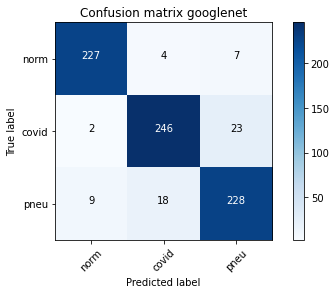

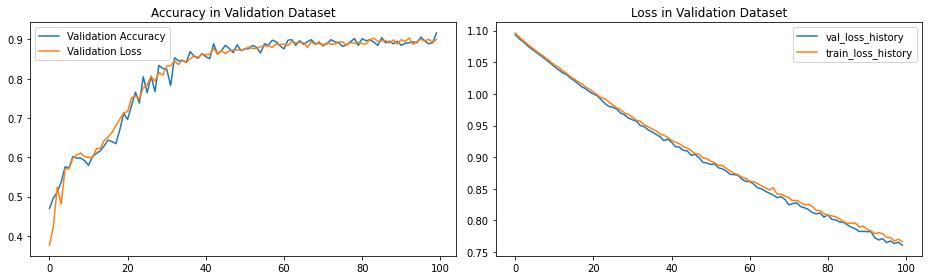


==== END ====
[[218   8  12]
 [  1 251  19]
 [  5  39 211]]

Sensitivity or recall total
0.8900523560209425

Sensitivity or recall per classes
[0.92 0.93 0.83]

Precision
[0.97 0.84 0.87]

F1 Score
[0.94 0.88 0.85]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0195 Acc: 0.5729
val Loss: 0.9824 Acc: 0.8599

Epoch 1/99
----------
train Loss: 0.8857 Acc: 0.8444
val Loss: 0.8226 Acc: 0.8887

Epoch 2/99
----------
train Loss: 0.7803 Acc: 0.8988
val Loss: 0.7345 Acc: 0.8822

Epoch 3/99
----------
train Loss: 0.7072 Acc: 0.8935
val Loss: 0.6604 Acc: 0.9058

Epoch 4/99
----------
train Loss: 0.6396 Acc: 0.9099
val Loss: 0.5972 Acc: 0.9058

Epoch 5/99
----------
train Loss: 0.5880 Acc: 0.9096
val Loss: 0.5563 Acc: 0.9136

Epoch 6/99
-----

train Loss: 0.1801 Acc: 0.9410
val Loss: 0.1874 Acc: 0.9398

Epoch 92/99
----------
train Loss: 0.1698 Acc: 0.9499
val Loss: 0.1842 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1699 Acc: 0.9489
val Loss: 0.1890 Acc: 0.9450

Epoch 94/99
----------
train Loss: 0.1653 Acc: 0.9486
val Loss: 0.1759 Acc: 0.9398

Epoch 95/99
----------
train Loss: 0.1705 Acc: 0.9450
val Loss: 0.1772 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1649 Acc: 0.9499
val Loss: 0.1927 Acc: 0.9346

Epoch 97/99
----------
train Loss: 0.1712 Acc: 0.9460
val Loss: 0.1846 Acc: 0.9424

Epoch 98/99
----------
train Loss: 0.1615 Acc: 0.9512
val Loss: 0.1770 Acc: 0.9490

Epoch 99/99
----------
train Loss: 0.1716 Acc: 0.9466
val Loss: 0.1797 Acc: 0.9424


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 27s
Best val Acc: 0.948953
##############################


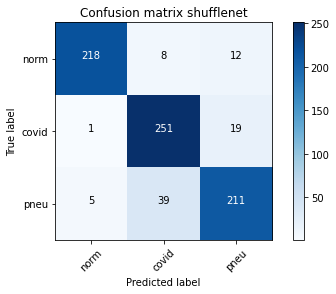

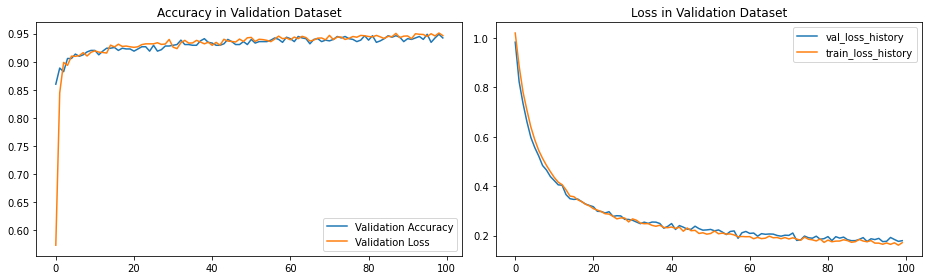


==== END ====
[[231   1   6]
 [  2 257  12]
 [  3  18 234]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.97 0.95 0.92]

Precision
[0.98 0.93 0.93]

F1 Score
[0.97 0.94 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9075 Acc: 0.8081
val Loss: 0.8844 Acc: 0.8416

Epoch 1/99
----------
train Loss: 0.7597 Acc: 0.8978
val Loss: 0.7000 Acc: 0.8940

Epoch 2/99
----------
train Loss: 0.6763 Acc: 0.8981
val Loss: 0.6332 Acc: 0.9071

Epoch 3/99
----------
train Loss: 0.6109 Acc: 0.9034
val Loss: 0.5758 Acc: 0.9097

Epoch 4/99
----------
train Loss: 0.5553 Acc: 0.9161
val Loss: 0.5316 Acc: 0.9123

Epoch 5/99
----------
train Loss: 0.5178 Acc: 0.9161
val Loss: 0.4977 Acc: 0.9058

Epoch 6/99
-----

train Loss: 0.1675 Acc: 0.9463
val Loss: 0.1720 Acc: 0.9555

Epoch 92/99
----------
train Loss: 0.1696 Acc: 0.9473
val Loss: 0.1838 Acc: 0.9424

Epoch 93/99
----------
train Loss: 0.1615 Acc: 0.9502
val Loss: 0.1847 Acc: 0.9398

Epoch 94/99
----------
train Loss: 0.1568 Acc: 0.9525
val Loss: 0.1913 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1625 Acc: 0.9499
val Loss: 0.1686 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1555 Acc: 0.9502
val Loss: 0.1799 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1614 Acc: 0.9476
val Loss: 0.1768 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.1609 Acc: 0.9512
val Loss: 0.1773 Acc: 0.9463

Epoch 99/99
----------
train Loss: 0.1536 Acc: 0.9509
val Loss: 0.1873 Acc: 0.9306


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 32s
Best val Acc: 0.955497
##############################


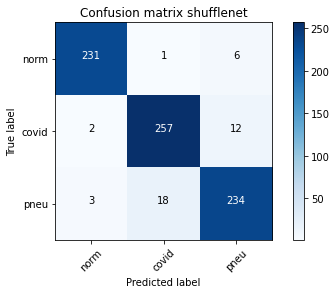

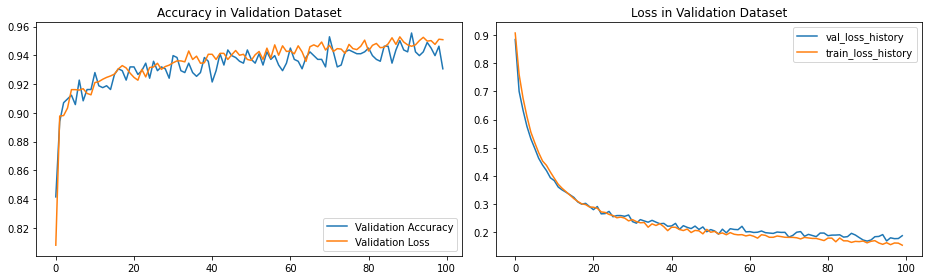


==== END ====
[[232   3   3]
 [  2 256  13]
 [  5  18 232]]

Sensitivity or recall total
0.9424083769633508

Sensitivity or recall per classes
[0.97 0.94 0.91]

Precision
[0.97 0.92 0.94]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0974 Acc: 0.3659
val Loss: 1.0968 Acc: 0.3312

Epoch 1/99
----------
train Loss: 1.0907 Acc: 0.4638
val Loss: 1.0877 Acc: 0.4948

Epoch 2/99
----------
train Loss: 1.0853 Acc: 0.5408
val Loss: 1.0826 Acc: 0.5497

Epoch 3/99
----------
train Loss: 1.0799 Acc: 0.5355
val Loss: 1.0772 Acc: 0.5641

Epoch 4/99
----------
train Loss: 1.0750 Acc: 0.5640
val Loss: 1.0728 Acc: 0.5851

Epoch 5/99
----------
train Loss: 1.0702 Acc: 0.5660
val Loss: 1.0683 Acc: 0.5877

Epoch 6/99
----

train Loss: 0.7841 Acc: 0.8932
val Loss: 0.7783 Acc: 0.8874

Epoch 92/99
----------
train Loss: 0.7819 Acc: 0.8965
val Loss: 0.7789 Acc: 0.8953

Epoch 93/99
----------
train Loss: 0.7785 Acc: 0.8945
val Loss: 0.7756 Acc: 0.8953

Epoch 94/99
----------
train Loss: 0.7751 Acc: 0.9034
val Loss: 0.7678 Acc: 0.8914

Epoch 95/99
----------
train Loss: 0.7779 Acc: 0.8870
val Loss: 0.7666 Acc: 0.9005

Epoch 96/99
----------
train Loss: 0.7759 Acc: 0.8877
val Loss: 0.7664 Acc: 0.8901

Epoch 97/99
----------
train Loss: 0.7689 Acc: 0.8968
val Loss: 0.7595 Acc: 0.8887

Epoch 98/99
----------
train Loss: 0.7689 Acc: 0.9011
val Loss: 0.7620 Acc: 0.8861

Epoch 99/99
----------
train Loss: 0.7688 Acc: 0.8955
val Loss: 0.7683 Acc: 0.8953


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 33s
Best val Acc: 0.900524
##############################


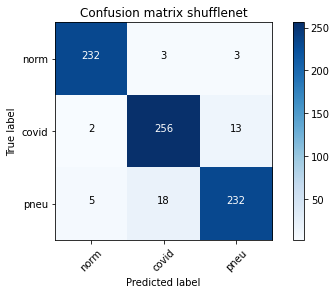

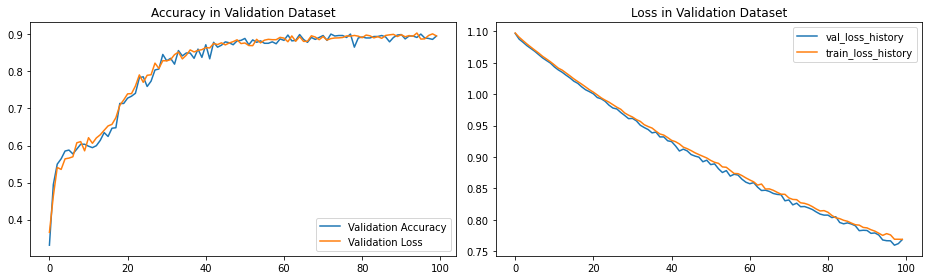


==== END ====
[[221   7  10]
 [  1 250  20]
 [  5  33 217]]

Sensitivity or recall total
0.900523560209424

Sensitivity or recall per classes
[0.93 0.92 0.85]

Precision
[0.97 0.86 0.88]

F1 Score
[0.95 0.89 0.86]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0186 Acc: 0.5843
val Loss: 0.9850 Acc: 0.8089

Epoch 1/99
----------
train Loss: 0.8822 Acc: 0.8588
val Loss: 0.8228 Acc: 0.8809

Epoch 2/99
----------
train Loss: 0.7795 Acc: 0.8818
val Loss: 0.7275 Acc: 0.9123

Epoch 3/99
----------
train Loss: 0.6978 Acc: 0.9030
val Loss: 0.6556 Acc: 0.9031

Epoch 4/99
----------
train Loss: 0.6357 Acc: 0.9063
val Loss: 0.5977 Acc: 0.9123

Epoch 5/99
----------
train Loss: 0.5831 Acc: 0.9050
val Loss: 0.5451 Acc: 0.9097

Epoch 6/99
-----

train Loss: 0.1754 Acc: 0.9443
val Loss: 0.1875 Acc: 0.9411

Epoch 92/99
----------
train Loss: 0.1755 Acc: 0.9420
val Loss: 0.1903 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1644 Acc: 0.9492
val Loss: 0.1947 Acc: 0.9319

Epoch 94/99
----------
train Loss: 0.1737 Acc: 0.9463
val Loss: 0.1838 Acc: 0.9437

Epoch 95/99
----------
train Loss: 0.1812 Acc: 0.9427
val Loss: 0.1806 Acc: 0.9490

Epoch 96/99
----------
train Loss: 0.1756 Acc: 0.9397
val Loss: 0.1857 Acc: 0.9398

Epoch 97/99
----------
train Loss: 0.1633 Acc: 0.9499
val Loss: 0.1841 Acc: 0.9490

Epoch 98/99
----------
train Loss: 0.1685 Acc: 0.9479
val Loss: 0.1761 Acc: 0.9437

Epoch 99/99
----------
train Loss: 0.1769 Acc: 0.9427
val Loss: 0.1846 Acc: 0.9411


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 31s
Best val Acc: 0.950262
##############################


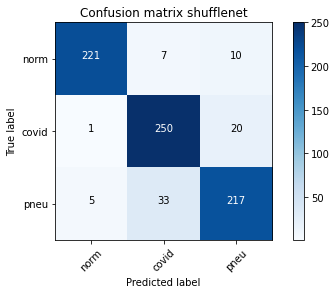

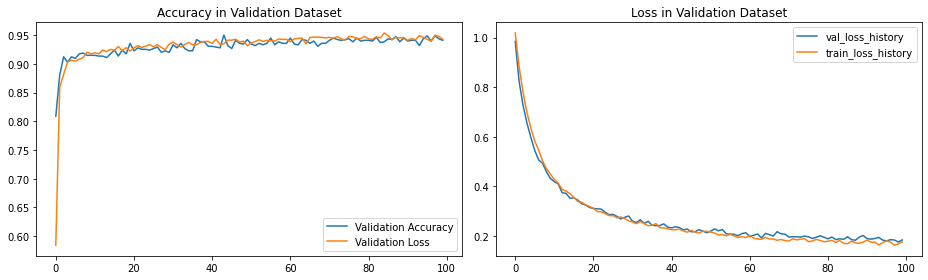


==== END ====
[[231   2   5]
 [  2 251  18]
 [  3  17 235]]

Sensitivity or recall total
0.9384816753926701

Sensitivity or recall per classes
[0.97 0.93 0.92]

Precision
[0.98 0.93 0.91]

F1 Score
[0.97 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9072 Acc: 0.8454
val Loss: 0.8798 Acc: 0.8364

Epoch 1/99
----------
train Loss: 0.7554 Acc: 0.8945
val Loss: 0.7028 Acc: 0.9005

Epoch 2/99
----------
train Loss: 0.6723 Acc: 0.9030
val Loss: 0.6286 Acc: 0.8966

Epoch 3/99
----------
train Loss: 0.6035 Acc: 0.9142
val Loss: 0.5810 Acc: 0.9215

Epoch 4/99
----------
train Loss: 0.5533 Acc: 0.9178
val Loss: 0.5217 Acc: 0.9149

Epoch 5/99
----------
train Loss: 0.5148 Acc: 0.9148
val Loss: 0.4940 Acc: 0.9084

Epoch 6/99
----

train Loss: 0.1737 Acc: 0.9463
val Loss: 0.1861 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1710 Acc: 0.9420
val Loss: 0.1670 Acc: 0.9450

Epoch 93/99
----------
train Loss: 0.1762 Acc: 0.9456
val Loss: 0.1940 Acc: 0.9385

Epoch 94/99
----------
train Loss: 0.1638 Acc: 0.9496
val Loss: 0.1896 Acc: 0.9463

Epoch 95/99
----------
train Loss: 0.1660 Acc: 0.9476
val Loss: 0.1893 Acc: 0.9385

Epoch 96/99
----------
train Loss: 0.1671 Acc: 0.9466
val Loss: 0.1733 Acc: 0.9529

Epoch 97/99
----------
train Loss: 0.1697 Acc: 0.9463
val Loss: 0.1842 Acc: 0.9385

Epoch 98/99
----------
train Loss: 0.1675 Acc: 0.9463
val Loss: 0.1796 Acc: 0.9385

Epoch 99/99
----------
train Loss: 0.1565 Acc: 0.9535
val Loss: 0.1797 Acc: 0.9424


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 30s
Best val Acc: 0.952880
##############################


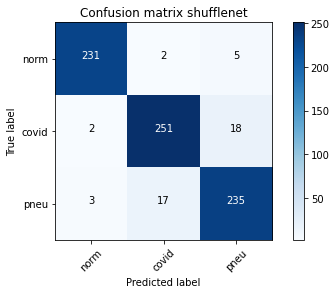

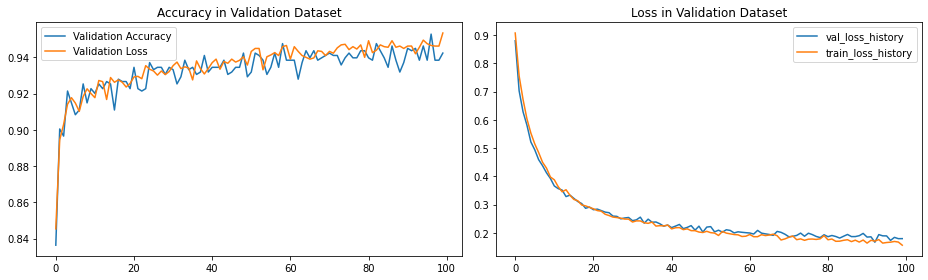


==== END ====
[[233   2   3]
 [  1 255  15]
 [  3  17 235]]

Sensitivity or recall total
0.9463350785340314

Sensitivity or recall per classes
[0.98 0.94 0.92]

Precision
[0.98 0.93 0.93]

F1 Score
[0.98 0.94 0.93]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0974 Acc: 0.3685
val Loss: 1.0937 Acc: 0.4791

Epoch 1/99
----------
train Loss: 1.0904 Acc: 0.4874
val Loss: 1.0870 Acc: 0.5144

Epoch 2/99
----------
train Loss: 1.0847 Acc: 0.5011
val Loss: 1.0816 Acc: 0.5393

Epoch 3/99
----------
train Loss: 1.0793 Acc: 0.5748
val Loss: 1.0771 Acc: 0.5785

Epoch 4/99
----------
train Loss: 1.0747 Acc: 0.5726
val Loss: 1.0714 Acc: 0.5720

Epoch 5/99
----------
train Loss: 1.0695 Acc: 0.5834
val Loss: 1.0674 Acc: 0.5825

Epoch 6/99
----

train Loss: 0.7845 Acc: 0.8929
val Loss: 0.7770 Acc: 0.8901

Epoch 92/99
----------
train Loss: 0.7786 Acc: 0.9037
val Loss: 0.7739 Acc: 0.8966

Epoch 93/99
----------
train Loss: 0.7791 Acc: 0.8985
val Loss: 0.7786 Acc: 0.8927

Epoch 94/99
----------
train Loss: 0.7769 Acc: 0.8886
val Loss: 0.7729 Acc: 0.8966

Epoch 95/99
----------
train Loss: 0.7719 Acc: 0.8978
val Loss: 0.7598 Acc: 0.8887

Epoch 96/99
----------
train Loss: 0.7702 Acc: 0.8985
val Loss: 0.7702 Acc: 0.8979

Epoch 97/99
----------
train Loss: 0.7711 Acc: 0.8958
val Loss: 0.7571 Acc: 0.9031

Epoch 98/99
----------
train Loss: 0.7676 Acc: 0.8926
val Loss: 0.7621 Acc: 0.8796

Epoch 99/99
----------
train Loss: 0.7652 Acc: 0.8991
val Loss: 0.7688 Acc: 0.9005


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 28s
Best val Acc: 0.907068
##############################


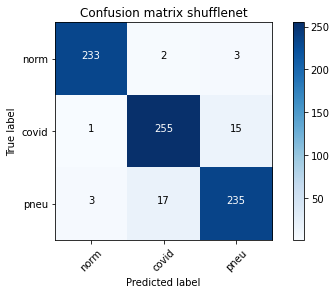

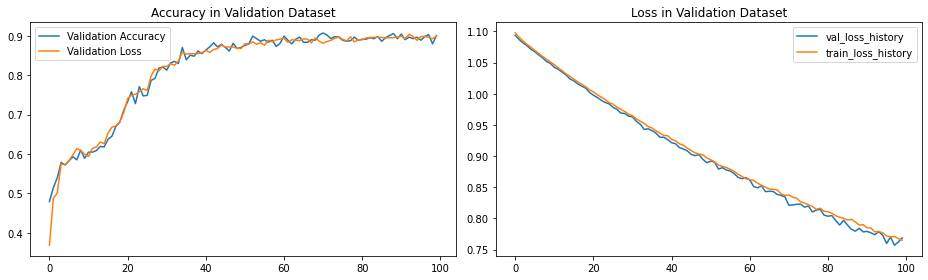


==== END ====
[[220  12   6]
 [  0 253  18]
 [  5  39 211]]

Sensitivity or recall total
0.8952879581151832

Sensitivity or recall per classes
[0.92 0.93 0.83]

Precision
[0.98 0.83 0.9 ]

F1 Score
[0.95 0.88 0.86]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0136 Acc: 0.5843
val Loss: 0.9696 Acc: 0.8770

Epoch 1/99
----------
train Loss: 0.8765 Acc: 0.8677
val Loss: 0.8155 Acc: 0.8743

Epoch 2/99
----------
train Loss: 0.7708 Acc: 0.9027
val Loss: 0.7225 Acc: 0.8992

Epoch 3/99
----------
train Loss: 0.6911 Acc: 0.9011
val Loss: 0.6507 Acc: 0.9084

Epoch 4/99
----------
train Loss: 0.6273 Acc: 0.9109
val Loss: 0.5989 Acc: 0.9045

Epoch 5/99
----------
train Loss: 0.5747 Acc: 0.9125
val Loss: 0.5546 Acc: 0.9123

Epoch 6/99
----

train Loss: 0.1622 Acc: 0.9489
val Loss: 0.1920 Acc: 0.9319

Epoch 92/99
----------
train Loss: 0.1665 Acc: 0.9473
val Loss: 0.1882 Acc: 0.9411

Epoch 93/99
----------
train Loss: 0.1627 Acc: 0.9538
val Loss: 0.1719 Acc: 0.9542

Epoch 94/99
----------
train Loss: 0.1629 Acc: 0.9473
val Loss: 0.1769 Acc: 0.9424

Epoch 95/99
----------
train Loss: 0.1666 Acc: 0.9502
val Loss: 0.1848 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1717 Acc: 0.9473
val Loss: 0.1804 Acc: 0.9476

Epoch 97/99
----------
train Loss: 0.1738 Acc: 0.9456
val Loss: 0.1842 Acc: 0.9372

Epoch 98/99
----------
train Loss: 0.1584 Acc: 0.9515
val Loss: 0.1787 Acc: 0.9359

Epoch 99/99
----------
train Loss: 0.1667 Acc: 0.9528
val Loss: 0.1733 Acc: 0.9450


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 30s
Best val Acc: 0.954188
##############################


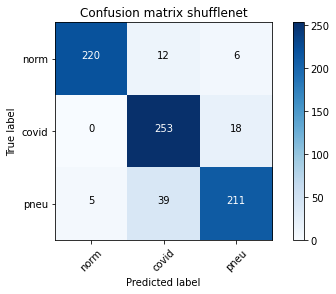

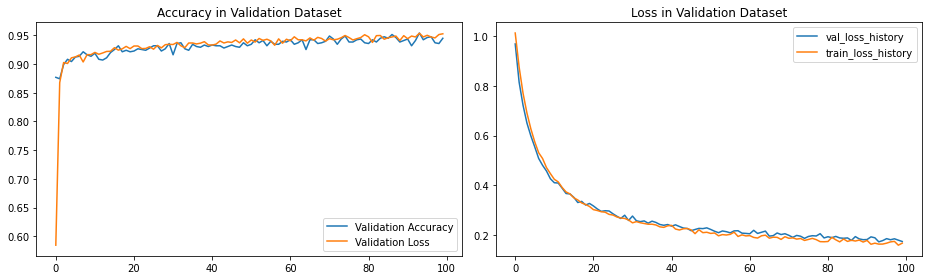


==== END ====
[[234   2   2]
 [  1 255  15]
 [  4  18 233]]

Sensitivity or recall total
0.9450261780104712

Sensitivity or recall per classes
[0.98 0.94 0.91]

Precision
[0.98 0.93 0.93]

F1 Score
[0.98 0.93 0.92]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 0.9302 Acc: 0.7599
val Loss: 0.9015 Acc: 0.8377

Epoch 1/99
----------
train Loss: 0.7770 Acc: 0.8847
val Loss: 0.7231 Acc: 0.9005

Epoch 2/99
----------
train Loss: 0.6905 Acc: 0.8978
val Loss: 0.6415 Acc: 0.9005

Epoch 3/99
----------
train Loss: 0.6210 Acc: 0.9053
val Loss: 0.5876 Acc: 0.9084

Epoch 4/99
----------
train Loss: 0.5677 Acc: 0.9106
val Loss: 0.5334 Acc: 0.9005

Epoch 5/99
----------
train Loss: 0.5281 Acc: 0.9057
val Loss: 0.5106 Acc: 0.9215

Epoch 6/99
----

train Loss: 0.1676 Acc: 0.9489
val Loss: 0.1700 Acc: 0.9437

Epoch 92/99
----------
train Loss: 0.1650 Acc: 0.9430
val Loss: 0.1742 Acc: 0.9490

Epoch 93/99
----------
train Loss: 0.1597 Acc: 0.9489
val Loss: 0.1664 Acc: 0.9503

Epoch 94/99
----------
train Loss: 0.1605 Acc: 0.9482
val Loss: 0.1776 Acc: 0.9476

Epoch 95/99
----------
train Loss: 0.1687 Acc: 0.9417
val Loss: 0.1768 Acc: 0.9463

Epoch 96/99
----------
train Loss: 0.1619 Acc: 0.9450
val Loss: 0.1880 Acc: 0.9450

Epoch 97/99
----------
train Loss: 0.1641 Acc: 0.9492
val Loss: 0.1779 Acc: 0.9398

Epoch 98/99
----------
train Loss: 0.1660 Acc: 0.9528
val Loss: 0.1781 Acc: 0.9411

Epoch 99/99
----------
train Loss: 0.1658 Acc: 0.9463
val Loss: 0.1822 Acc: 0.9398


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.001
batch size -> 32
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 24s
Best val Acc: 0.951571
##############################


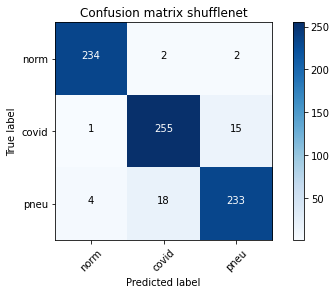

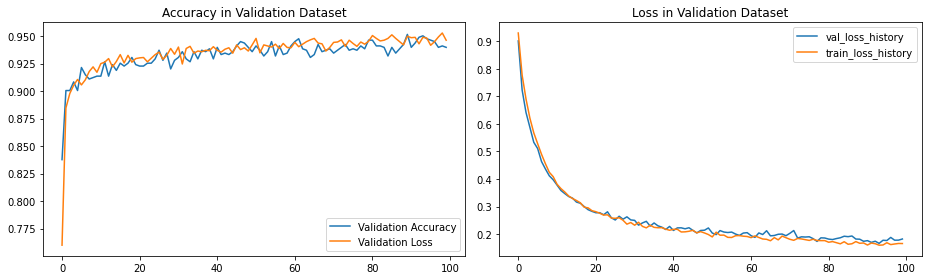


==== END ====
[[234   2   2]
 [  2 257  12]
 [  4  26 225]]

Sensitivity or recall total
0.93717277486911

Sensitivity or recall per classes
[0.98 0.95 0.88]

Precision
[0.97 0.9  0.94]

F1 Score
[0.98 0.92 0.91]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0993 Acc: 0.3259
val Loss: 1.0971 Acc: 0.3717

Epoch 1/99
----------
train Loss: 1.0985 Acc: 0.3400
val Loss: 1.0984 Acc: 0.3298

Epoch 2/99
----------
train Loss: 1.0979 Acc: 0.3400
val Loss: 1.0979 Acc: 0.3154

Epoch 3/99
----------
train Loss: 1.0973 Acc: 0.3495
val Loss: 1.0975 Acc: 0.3416

Epoch 4/99
----------
train Loss: 1.0967 Acc: 0.3619
val Loss: 1.0969 Acc: 0.3560

Epoch 5/99
----------
train Loss: 1.0961 Acc: 0.3741
val Loss: 1.0959 Acc: 0.3796

Epoch 6/99
------

train Loss: 1.0531 Acc: 0.5958
val Loss: 1.0532 Acc: 0.5890

Epoch 92/99
----------
train Loss: 1.0525 Acc: 0.6063
val Loss: 1.0523 Acc: 0.6060

Epoch 93/99
----------
train Loss: 1.0522 Acc: 0.6069
val Loss: 1.0523 Acc: 0.5903

Epoch 94/99
----------
train Loss: 1.0526 Acc: 0.5978
val Loss: 1.0511 Acc: 0.5812

Epoch 95/99
----------
train Loss: 1.0512 Acc: 0.6056
val Loss: 1.0507 Acc: 0.6021

Epoch 96/99
----------
train Loss: 1.0519 Acc: 0.6010
val Loss: 1.0503 Acc: 0.6060

Epoch 97/99
----------
train Loss: 1.0503 Acc: 0.6047
val Loss: 1.0501 Acc: 0.6034

Epoch 98/99
----------
train Loss: 1.0500 Acc: 0.6033
val Loss: 1.0500 Acc: 0.6021

Epoch 99/99
----------
train Loss: 1.0492 Acc: 0.6053
val Loss: 1.0482 Acc: 0.6060


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 24s
Best val Acc: 0.606021
##############################


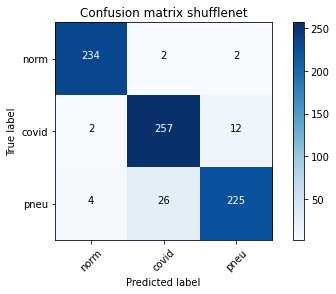

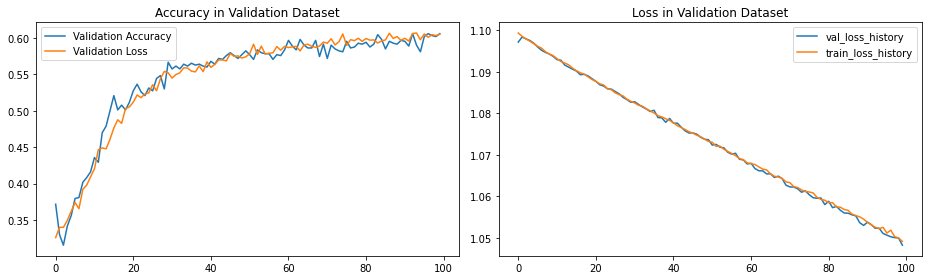


==== END ====
[[  0  43 195]
 [  0 259  12]
 [  0  56 199]]

Sensitivity or recall total
0.599476439790576

Sensitivity or recall per classes
[0.   0.96 0.78]

Precision
[0.   0.72 0.49]

F1 Score
[0.   0.82 0.6 ]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 2
criteriun -> 1



/home/jimi/.local/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0903 Acc: 0.3655
val Loss: 1.0851 Acc: 0.4634

Epoch 1/99
----------
train Loss: 1.0720 Acc: 0.3983
val Loss: 1.0625 Acc: 0.4280

Epoch 2/99
----------
train Loss: 1.0547 Acc: 0.4979
val Loss: 1.0453 Acc: 0.5445

Epoch 3/99
----------
train Loss: 1.0385 Acc: 0.5359
val Loss: 1.0291 Acc: 0.5890

Epoch 4/99
----------
train Loss: 1.0230 Acc: 0.6571
val Loss: 1.0153 Acc: 0.6793

Epoch 5/99
----------
train Loss: 1.0077 Acc: 0.6934
val Loss: 0.9985 Acc: 0.7042

Epoch 6/99
----------
train Loss: 0.9924 Acc: 0.7340
val Loss: 0.9835 Acc: 0.7277

Epoch 7/99
----------
train Loss: 0.9776 Acc: 0.7766
val Loss: 0.9686 Acc: 0.7880

Epoch 8/99
----------
train Loss: 0.9656 Acc: 0.8074
val Loss: 0.9542 Acc: 0.8469

Epoch 9/99
----------
train Loss: 0.9495 Acc: 0.8254
val Loss: 0.9397 Acc: 0.8312

Epoch 10/99
----------
train Loss: 0.9354 Acc: 0.8395
val Loss: 0.9248 Acc

val Loss: 0.4199 Acc: 0.9215

Epoch 97/99
----------
train Loss: 0.4188 Acc: 0.9270
val Loss: 0.4257 Acc: 0.9202

Epoch 98/99
----------
train Loss: 0.4216 Acc: 0.9260
val Loss: 0.4247 Acc: 0.9136

Epoch 99/99
----------
train Loss: 0.4201 Acc: 0.9204
val Loss: 0.4160 Acc: 0.9175


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 28s
Best val Acc: 0.925393
##############################


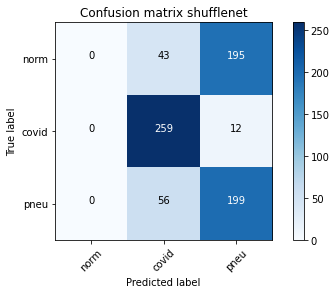

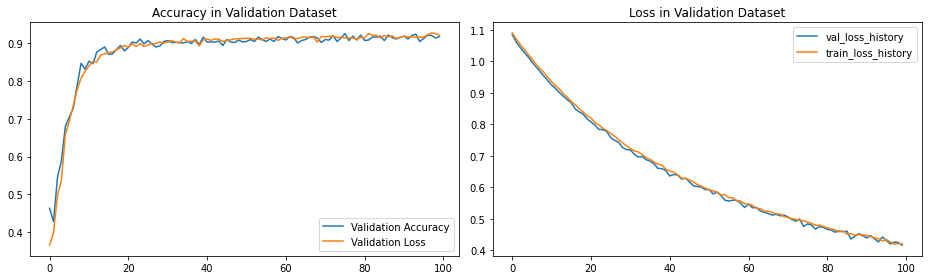


==== END ====
[[230   6   2]
 [  0 253  18]
 [ 11  29 215]]

Sensitivity or recall total
0.9136125654450262

Sensitivity or recall per classes
[0.97 0.93 0.84]

Precision
[0.95 0.88 0.91]

F1 Score
[0.96 0.91 0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0744 Acc: 0.3544
val Loss: 1.0686 Acc: 0.4594

Epoch 1/99
----------
train Loss: 1.0504 Acc: 0.4438
val Loss: 1.0390 Acc: 0.5380

Epoch 2/99
----------
train Loss: 1.0326 Acc: 0.5870
val Loss: 1.0237 Acc: 0.6165

Epoch 3/99
----------
train Loss: 1.0172 Acc: 0.6309
val Loss: 1.0064 Acc: 0.6950

Epoch 4/99
----------
train Loss: 0.9999 Acc: 0.7039
val Loss: 0.9923 Acc: 0.7186

Epoch 5/99
----------
train Loss: 0.9851 Acc: 0.7524
val Loss: 0.9760 Acc: 0.7801

Epoch 6/99
----

train Loss: 0.4185 Acc: 0.9207
val Loss: 0.4154 Acc: 0.9149

Epoch 92/99
----------
train Loss: 0.4191 Acc: 0.9220
val Loss: 0.4176 Acc: 0.9188

Epoch 93/99
----------
train Loss: 0.4260 Acc: 0.9135
val Loss: 0.4207 Acc: 0.9188

Epoch 94/99
----------
train Loss: 0.4189 Acc: 0.9198
val Loss: 0.4218 Acc: 0.9097

Epoch 95/99
----------
train Loss: 0.4111 Acc: 0.9247
val Loss: 0.4174 Acc: 0.9045

Epoch 96/99
----------
train Loss: 0.4142 Acc: 0.9188
val Loss: 0.4128 Acc: 0.9188

Epoch 97/99
----------
train Loss: 0.4106 Acc: 0.9224
val Loss: 0.4171 Acc: 0.9071

Epoch 98/99
----------
train Loss: 0.4100 Acc: 0.9217
val Loss: 0.4065 Acc: 0.9136

Epoch 99/99
----------
train Loss: 0.4048 Acc: 0.9178
val Loss: 0.3958 Acc: 0.9136


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 8
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 25s
Best val Acc: 0.921466
##############################


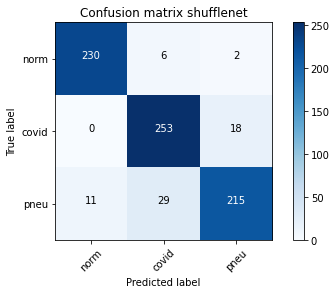

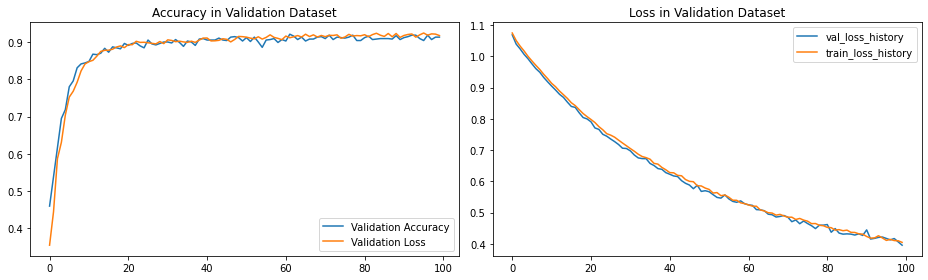


==== END ====
[[228   6   4]
 [  0 254  17]
 [  5  30 220]]

Sensitivity or recall total
0.918848167539267

Sensitivity or recall per classes
[0.96 0.94 0.86]

Precision
[0.98 0.88 0.91]

F1 Score
[0.97 0.91 0.89]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0968 Acc: 0.3528
val Loss: 1.0955 Acc: 0.3704

Epoch 1/99
----------
train Loss: 1.0958 Acc: 0.3819
val Loss: 1.0961 Acc: 0.3691

Epoch 2/99
----------
train Loss: 1.0954 Acc: 0.3872
val Loss: 1.0956 Acc: 0.3914

Epoch 3/99
----------
train Loss: 1.0950 Acc: 0.3908
val Loss: 1.0952 Acc: 0.3966

Epoch 4/99
----------
train Loss: 1.0943 Acc: 0.4147
val Loss: 1.0940 Acc: 0.4228

Epoch 5/99
----------
train Loss: 1.0936 Acc: 0.4327
val Loss: 1.0939 Acc: 0.4267

Epoch 6/99
----

train Loss: 1.0516 Acc: 0.6040
val Loss: 1.0506 Acc: 0.6034

Epoch 92/99
----------
train Loss: 1.0513 Acc: 0.6132
val Loss: 1.0503 Acc: 0.6099

Epoch 93/99
----------
train Loss: 1.0501 Acc: 0.6010
val Loss: 1.0493 Acc: 0.6021

Epoch 94/99
----------
train Loss: 1.0506 Acc: 0.6069
val Loss: 1.0502 Acc: 0.5995

Epoch 95/99
----------
train Loss: 1.0493 Acc: 0.6096
val Loss: 1.0499 Acc: 0.6008

Epoch 96/99
----------
train Loss: 1.0488 Acc: 0.6086
val Loss: 1.0483 Acc: 0.5995

Epoch 97/99
----------
train Loss: 1.0490 Acc: 0.6135
val Loss: 1.0487 Acc: 0.6139

Epoch 98/99
----------
train Loss: 1.0479 Acc: 0.6148
val Loss: 1.0487 Acc: 0.6086

Epoch 99/99
----------
train Loss: 1.0475 Acc: 0.6096
val Loss: 1.0478 Acc: 0.5877


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 24s
Best val Acc: 0.613874
##############################


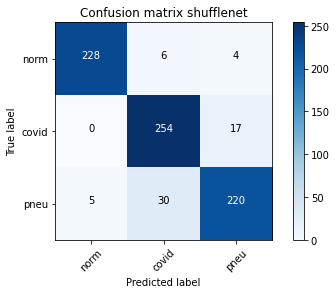

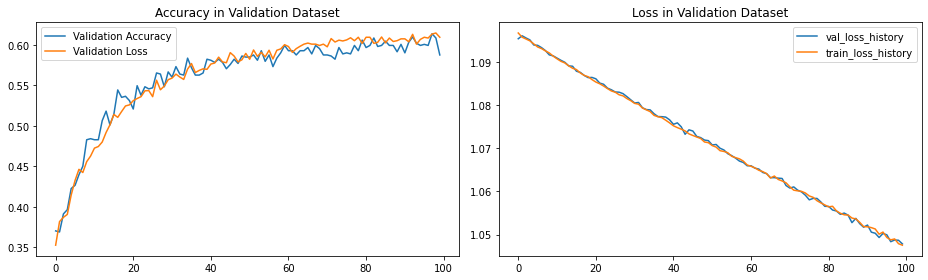


==== END ====
[[  0  26 212]
 [  0 253  18]
 [  0  50 205]]

Sensitivity or recall total
0.599476439790576

Sensitivity or recall per classes
[0.   0.93 0.8 ]

Precision
[0.   0.77 0.47]

F1 Score
[0.   0.84 0.59]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0912 Acc: 0.4366
val Loss: 1.0849 Acc: 0.5314

Epoch 1/99
----------
train Loss: 1.0727 Acc: 0.4900
val Loss: 1.0635 Acc: 0.5353

Epoch 2/99
----------
train Loss: 1.0553 Acc: 0.5385
val Loss: 1.0465 Acc: 0.5484

Epoch 3/99
----------
train Loss: 1.0382 Acc: 0.5935
val Loss: 1.0290 Acc: 0.6414

Epoch 4/99
----------
train Loss: 1.0225 Acc: 0.6577
val Loss: 1.0139 Acc: 0.6545

Epoch 5/99
----------
train Loss: 1.0076 Acc: 0.6937
val Loss: 0.9992 Acc: 0.7134

Epoch 6/99
----

train Loss: 0.4485 Acc: 0.9125
val Loss: 0.4376 Acc: 0.9136

Epoch 92/99
----------
train Loss: 0.4372 Acc: 0.9181
val Loss: 0.4344 Acc: 0.9202

Epoch 93/99
----------
train Loss: 0.4324 Acc: 0.9201
val Loss: 0.4225 Acc: 0.9084

Epoch 94/99
----------
train Loss: 0.4335 Acc: 0.9135
val Loss: 0.4285 Acc: 0.9136

Epoch 95/99
----------
train Loss: 0.4297 Acc: 0.9175
val Loss: 0.4363 Acc: 0.9123

Epoch 96/99
----------
train Loss: 0.4239 Acc: 0.9198
val Loss: 0.4234 Acc: 0.9123

Epoch 97/99
----------
train Loss: 0.4271 Acc: 0.9175
val Loss: 0.4248 Acc: 0.9149

Epoch 98/99
----------
train Loss: 0.4196 Acc: 0.9240
val Loss: 0.4162 Acc: 0.9149

Epoch 99/99
----------
train Loss: 0.4317 Acc: 0.9132
val Loss: 0.4184 Acc: 0.9136


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 23s
Best val Acc: 0.920157
##############################


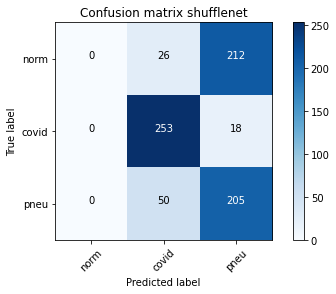

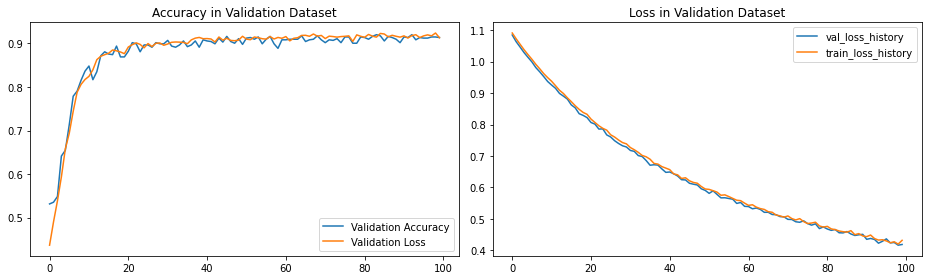


==== END ====
[[224   7   7]
 [  0 254  17]
 [  7  31 217]]

Sensitivity or recall total
0.9096858638743456

Sensitivity or recall per classes
[0.94 0.94 0.85]

Precision
[0.97 0.87 0.9 ]

F1 Score
[0.96 0.9  0.87]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0734 Acc: 0.5274
val Loss: 1.0685 Acc: 0.6191

Epoch 1/99
----------
train Loss: 1.0489 Acc: 0.5653
val Loss: 1.0389 Acc: 0.6126

Epoch 2/99
----------
train Loss: 1.0310 Acc: 0.6089
val Loss: 1.0201 Acc: 0.6767

Epoch 3/99
----------
train Loss: 1.0148 Acc: 0.6630
val Loss: 1.0040 Acc: 0.6976

Epoch 4/99
----------
train Loss: 0.9996 Acc: 0.7393
val Loss: 0.9892 Acc: 0.7421

Epoch 5/99
----------
train Loss: 0.9845 Acc: 0.7534
val Loss: 0.9722 Acc: 0.7749

Epoch 6/99
---

train Loss: 0.4305 Acc: 0.9171
val Loss: 0.4247 Acc: 0.9136

Epoch 92/99
----------
train Loss: 0.4220 Acc: 0.9194
val Loss: 0.4271 Acc: 0.9031

Epoch 93/99
----------
train Loss: 0.4188 Acc: 0.9230
val Loss: 0.4174 Acc: 0.9097

Epoch 94/99
----------
train Loss: 0.4180 Acc: 0.9220
val Loss: 0.4130 Acc: 0.9175

Epoch 95/99
----------
train Loss: 0.4161 Acc: 0.9184
val Loss: 0.4108 Acc: 0.9188

Epoch 96/99
----------
train Loss: 0.4087 Acc: 0.9224
val Loss: 0.4079 Acc: 0.9215

Epoch 97/99
----------
train Loss: 0.4139 Acc: 0.9184
val Loss: 0.4118 Acc: 0.9188

Epoch 98/99
----------
train Loss: 0.4054 Acc: 0.9220
val Loss: 0.4107 Acc: 0.9071

Epoch 99/99
----------
train Loss: 0.4151 Acc: 0.9145
val Loss: 0.4048 Acc: 0.9136


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 16
optimizer -> RMSprop
criteriun -> CrossEntropyLoss

Training complete in 27m 23s
Best val Acc: 0.922775
##############################


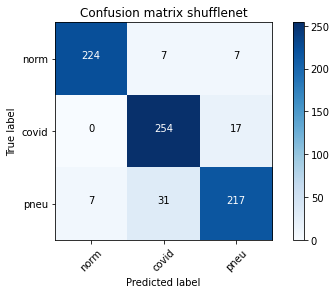

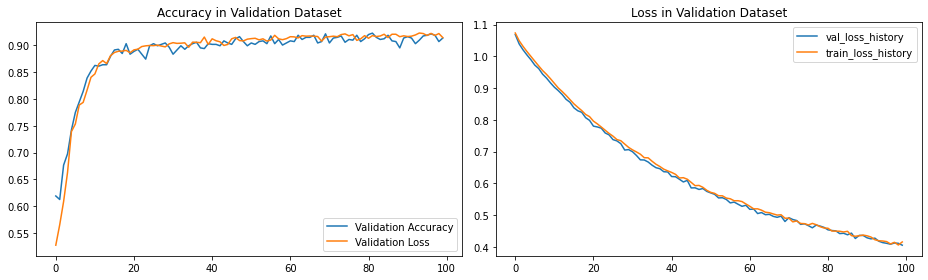


==== END ====
[[225   9   4]
 [  1 253  17]
 [  9  27 219]]

Sensitivity or recall total
0.912303664921466

Sensitivity or recall per classes
[0.95 0.93 0.86]

Precision
[0.96 0.88 0.91]

F1 Score
[0.95 0.9  0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 1
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0988 Acc: 0.3538
val Loss: 1.0986 Acc: 0.3442

Epoch 1/99
----------
train Loss: 1.0982 Acc: 0.3564
val Loss: 1.0980 Acc: 0.3338

Epoch 2/99
----------
train Loss: 1.0975 Acc: 0.3580
val Loss: 1.0975 Acc: 0.3390

Epoch 3/99
----------
train Loss: 1.0968 Acc: 0.3659
val Loss: 1.0971 Acc: 0.3429

Epoch 4/99
----------
train Loss: 1.0962 Acc: 0.3764
val Loss: 1.0966 Acc: 0.3613

Epoch 5/99
----------
train Loss: 1.0956 Acc: 0.3793
val Loss: 1.0961 Acc: 0.3743

Epoch 6/99
----

train Loss: 1.0526 Acc: 0.6178
val Loss: 1.0523 Acc: 0.6060

Epoch 92/99
----------
train Loss: 1.0520 Acc: 0.6119
val Loss: 1.0518 Acc: 0.6047

Epoch 93/99
----------
train Loss: 1.0520 Acc: 0.6115
val Loss: 1.0518 Acc: 0.6047

Epoch 94/99
----------
train Loss: 1.0509 Acc: 0.6151
val Loss: 1.0511 Acc: 0.6021

Epoch 95/99
----------
train Loss: 1.0509 Acc: 0.6089
val Loss: 1.0505 Acc: 0.6021

Epoch 96/99
----------
train Loss: 1.0505 Acc: 0.6109
val Loss: 1.0505 Acc: 0.6034

Epoch 97/99
----------
train Loss: 1.0497 Acc: 0.6138
val Loss: 1.0495 Acc: 0.5995

Epoch 98/99
----------
train Loss: 1.0492 Acc: 0.6187
val Loss: 1.0490 Acc: 0.6113

Epoch 99/99
----------
train Loss: 1.0492 Acc: 0.6128
val Loss: 1.0485 Acc: 0.6021


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> SGD
criteriun -> CrossEntropyLoss

Training complete in 27m 25s
Best val Acc: 0.611257
##############################


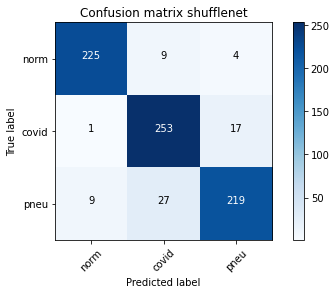

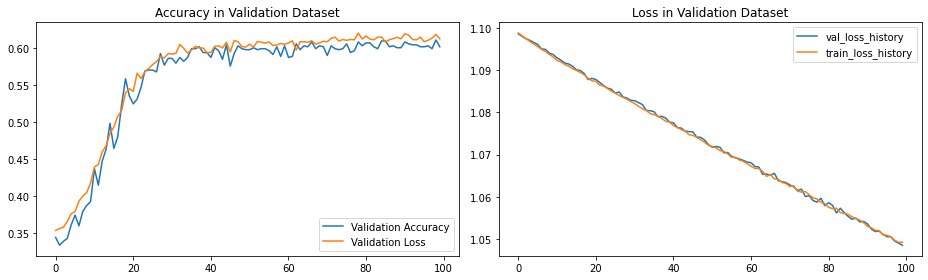


==== END ====
[[  0  33 205]
 [  0 258  13]
 [  0  46 209]]

Sensitivity or recall total
0.6112565445026178

Sensitivity or recall per classes
[0.   0.95 0.82]

Precision
[0.   0.77 0.49]

F1 Score
[0.   0.85 0.61]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 2
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0900 Acc: 0.5657
val Loss: 1.0826 Acc: 0.5942

Epoch 1/99
----------
train Loss: 1.0704 Acc: 0.5971
val Loss: 1.0598 Acc: 0.5982

Epoch 2/99
----------
train Loss: 1.0529 Acc: 0.5922
val Loss: 1.0430 Acc: 0.6060

Epoch 3/99
----------
train Loss: 1.0368 Acc: 0.6374
val Loss: 1.0282 Acc: 0.6780

Epoch 4/99
----------
train Loss: 1.0207 Acc: 0.6698
val Loss: 1.0118 Acc: 0.6990

Epoch 5/99
----------
train Loss: 1.0049 Acc: 0.7072
val Loss: 0.9942 Acc: 0.7304

Epoch 6/99
---

train Loss: 0.4403 Acc: 0.9188
val Loss: 0.4362 Acc: 0.9149

Epoch 92/99
----------
train Loss: 0.4394 Acc: 0.9158
val Loss: 0.4384 Acc: 0.9031

Epoch 93/99
----------
train Loss: 0.4384 Acc: 0.9184
val Loss: 0.4368 Acc: 0.9084

Epoch 94/99
----------
train Loss: 0.4306 Acc: 0.9165
val Loss: 0.4279 Acc: 0.9175

Epoch 95/99
----------
train Loss: 0.4336 Acc: 0.9188
val Loss: 0.4223 Acc: 0.9162

Epoch 96/99
----------
train Loss: 0.4276 Acc: 0.9198
val Loss: 0.4262 Acc: 0.9175

Epoch 97/99
----------
train Loss: 0.4228 Acc: 0.9201
val Loss: 0.4249 Acc: 0.9228

Epoch 98/99
----------
train Loss: 0.4256 Acc: 0.9165
val Loss: 0.4183 Acc: 0.9215

Epoch 99/99
----------
train Loss: 0.4191 Acc: 0.9191
val Loss: 0.4132 Acc: 0.9254


##############################
------ Summary ------
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> ADAM
criteriun -> CrossEntropyLoss

Training complete in 27m 26s
Best val Acc: 0.926702
##############################


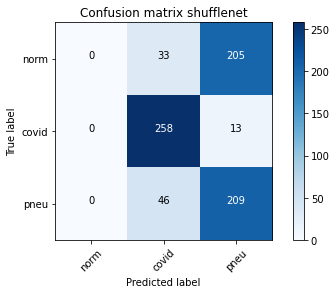

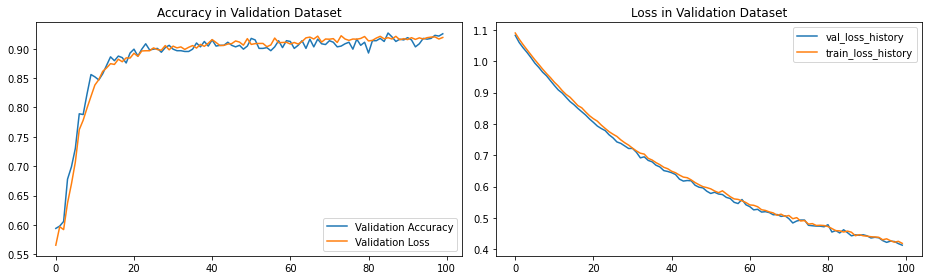


==== END ====
[[227   6   5]
 [  0 249  22]
 [  6  27 222]]

Sensitivity or recall total
0.9136125654450262

Sensitivity or recall per classes
[0.95 0.92 0.87]

Precision
[0.97 0.88 0.89]

F1 Score
[0.96 0.9  0.88]
Confusion matrix, without normalization

==== INITIALIZING WITH PARAMETERS: ====
model -> shufflenet
epochs -> 100
lr -> 0.0001
batch size -> 32
optimizer -> 3
criteriun -> 1

--------------------
Params to learn:
	 fc.weight
	 fc.bias

--------------------

== Epochs ==
Epoch 0/99
----------
train Loss: 1.0766 Acc: 0.3796
val Loss: 1.0686 Acc: 0.5681

Epoch 1/99
----------
train Loss: 1.0518 Acc: 0.4930
val Loss: 1.0415 Acc: 0.5537

Epoch 2/99
----------
train Loss: 1.0343 Acc: 0.5663
val Loss: 1.0247 Acc: 0.6662

Epoch 3/99
----------
train Loss: 1.0179 Acc: 0.6682
val Loss: 1.0069 Acc: 0.6911

Epoch 4/99
----------
train Loss: 1.0022 Acc: 0.7134
val Loss: 0.9902 Acc: 0.7683

Epoch 5/99
----------
train Loss: 0.9864 Acc: 0.7720
val Loss: 0.9773 Acc: 0.7958

Epoch 6/99
---

train Loss: 0.4317 Acc: 0.9109
val Loss: 0.4241 Acc: 0.9215

Epoch 92/99
----------
train Loss: 0.4226 Acc: 0.9181
val Loss: 0.4265 Acc: 0.9097

Epoch 93/99
----------
train Loss: 0.4187 Acc: 0.9188
val Loss: 0.4147 Acc: 0.9254

Epoch 94/99
----------
train Loss: 0.4188 Acc: 0.9217
val Loss: 0.4213 Acc: 0.9162

Epoch 95/99
----------
train Loss: 0.4129 Acc: 0.9240
val Loss: 0.4183 Acc: 0.9110

Epoch 96/99
----------


In [ ]:
# Modelos ['squeezenet', 'densenet', 'resnet', 'alexnet', 'vgg', 'googlenet', 'shufflenet', 'mobilenet']
num_classes = 3

_models = ['squeezenet', 'densenet', 'resnet', 'alexnet', 'vgg', 'googlenet', 'shufflenet', 'mobilenet']
lrs = [1e-3, 1e-4, 1e-5]
_epoch = [100]
batch_sizes = [8, 16, 32]
opt = [1, 2, 3] #1 SGD - 2 ADAM - 3 RMSprop
crt = [1] # 1 CrossEntropyLoss - 2 BCELoss

for _model in _models:
    for _epochs in _epoch:
        for _lrs in lrs:
            for _batch in batch_sizes:
                for _opt in opt:
                    for _crt in crt:
                         
                        
                            
                        print()
                        print('='*60)
                        print('==== INITIALIZING WITH PARAMETERS: ====')
                        print(f'model -> {_model}')
                        print(f'epochs -> {_epochs}')
                        print(f'lr -> {_lrs}')
                        print(f'batch size -> {_batch}')
                        print(f'optimizer -> {_opt}')
                        print(f'criteriun -> {_crt}')
                        print()

                        feature_extract = True

                        model_ft, input_size = initialize_model(_model, num_classes, 
                                                                feature_extract, use_pretrained=True)

                        
                        
                        # Send the model to GPU
                        model_ft = model_ft.to(device)

                        print('-'*20)
                        params_to_update = model_ft.parameters()
                        print("Params to learn:")
                        if feature_extract:
                            params_to_update = []
                            for name,param in model_ft.named_parameters():
                                if param.requires_grad == True:
                                    params_to_update.append(param)
                                    print("\t",name)

                        else:
                            for name,param in model_ft.named_parameters():
                                if param.requires_grad == True:
                                    print("\t",name)


                        print()
                        print('-'*20)
                        print()
                        print('== Epochs ==')

                        if _opt == 1:
                            optimizer_ft = optim.SGD(params_to_update, _lrs, momentum=0.9)
                            opt_name = 'SGD'

                        if _opt == 2:
                            optimizer_ft = optim.Adam(params_to_update, _lrs)
                            opt_name = 'ADAM'
                            
                        if _opt == 3:
                            optimizer_ft = optim.RMSprop(params_to_update, _lrs)
                            opt_name = 'RMSprop'


                        exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=10, gamma=0.1)


                        if _crt == 1:
                            criterion = nn.CrossEntropyLoss()
                            crt_name = 'CrossEntropyLoss'
                            
                        if _crt == 2:
                            criterion = nn.BCELoss()
                            crt_name = 'BCELoss'


                        model_ft, hist = train_model(model_ft, dataloaders, criterion, optimizer_ft,
                                                num_epochs=_epochs, model_name=_model, lr=_lrs,
                                                batch_size=_batch, opt_name=opt_name, crt_name=crt_name)
                        
                        

                        from sklearn.metrics import confusion_matrix

                        nb_classes = 3

                        # Initialize the prediction and label lists(tensors)
                        predlist=torch.zeros(0,dtype=torch.long, device='cpu')
                        lbllist=torch.zeros(0,dtype=torch.long, device='cpu')

                        with torch.no_grad():
                            for i, (inputs, classes) in enumerate(dataloaders['val']):
                                inputs = inputs.to(device) #labels atuais
                                classes = classes.to(device) #classes
                                outputs = model_ft(inputs) #valores preditos = Passa o label atual e retorna o que o modelo predice
                                _, preds = torch.max(outputs, 1) #pega o maior valor das predições

                                # Append batch prediction results
                                predlist=torch.cat([predlist,preds.view(-1).cpu()])
                                lbllist=torch.cat([lbllist,classes.view(-1).cpu()])

                        # Confusion matrix
                        conf_mat=confusion_matrix(lbllist.numpy(), predlist.numpy())
                        print(conf_mat)
                        print()

                        from sklearn import metrics

                        #analise dos resultados do modelo
                        print('Sensitivity or recall total')
                        print (metrics.recall_score(lbllist.numpy(), predlist.numpy(), average='micro'))

                        print()
                        print('Sensitivity or recall per classes')
                        print (metrics.recall_score(lbllist.numpy(), predlist.numpy(), average=None))

                        print()
                        print('Precision')
                        print (metrics.precision_score(lbllist.numpy(), predlist.numpy(), average=None))

                        print()
                        print('F1 Score')
                        print (metrics.f1_score(lbllist.numpy(), predlist.numpy(), average=None))

                        cm = confusion_matrix(lbllist.numpy(), predlist.numpy())
                        np.set_printoptions(precision=2)

                        plt.figure()

                        plot_confusion_matrix(cm, classes=['norm', 'covid', 'pneu'], 
                        title='Confusion matrix '+_model)




Os resultados na matriz de confuzão e scores estão ruins, provavelmente pelo param.requires_grad = True 

Testar depois com False

**Peguei o código original**

In [42]:
model_ft.eval()

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [45]:
model_ft.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (5): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU(inplace=True)
    (7): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (8): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace=True)
    (14): MaxPool2d(ke